In [110]:
#tf.executing_eagerly()

In [1]:
import os
import numpy as np
from os import listdir
from xml.etree import ElementTree
from numpy import zeros
from numpy import asarray
from numpy import expand_dims
from numpy import mean
import pydicom
import random
import matplotlib.pyplot as plt
import glob
from skimage.transform import resize

import cv2

from skimage import morphology

from sklearn.utils.extmath import cartesian
import math

from scipy import ndimage

from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

import tensorflow as tf

from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from tensorflow.keras.layers import Lambda, RepeatVector, Reshape
from tensorflow.keras.layers import Conv3D, Conv3DTranspose
from tensorflow.keras.layers import MaxPooling3D, GlobalMaxPool3D
from tensorflow.keras.layers import concatenate, add
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")



from tqdm import tqdm_notebook, tnrange
from itertools import chain
from sklearn.model_selection import train_test_split
from skimage.transform import resize

from sklearn.metrics import recall_score, precision_score

In [ ]:
SLICE_THICKNESS = 2

In [236]:
def read_pixel_array(filename):
    
    img_dcm = pydicom.read_file(filename, force = True)
    img_dcm.file_meta.TransferSyntaxUID = pydicom.uid.ImplicitVRLittleEndian
    img = img_dcm.pixel_array
    
    return img
    
    
def norm_img(img):
    
    img_min = np.min(img)
    img_max = np.max(img)
    img_norm = np.copy((img - img_min)/(img_max - img_min)*255).astype(np.uint8)
    
    return img_norm

def read_sub_volumes(sub_dirname):
    
    spacing_old = 0.303030
    
    t1w_filenames = glob.glob(sub_dirname + "\T1w_*.dcm")
    t1wc_filenames = glob.glob(sub_dirname + "\T1w-contrast_*.dcm")
    t2w_filenames = glob.glob(sub_dirname + "\T2w_*.dcm")
    tfe_filenames = glob.glob(sub_dirname + "\TFE_*.dcm")
    tof_filenames = glob.glob(sub_dirname + "\TOF_*.dcm")
    
    con_filenames = glob.glob(sub_dirname + "\MASSExport\*.dcm")
    
    t1w_filenames.sort()
    t1wc_filenames.sort()
    t2w_filenames.sort()
    tfe_filenames.sort()
    tof_filenames.sort()
    
    con_filenames.sort()
    
    n_img = len(t1w_filenames)
    n_con = len(con_filenames)
    
    if (n_img == n_con):
        
        t1w_vol = np.zeros((16, 528, 528), dtype=np.uint8)
        t1wc_vol = np.zeros((16, 528, 528), dtype=np.uint8)
        t2w_vol = np.zeros((16, 528, 528), dtype=np.uint8)
        tfe_vol = np.zeros((16, 528, 528), dtype=np.uint8)
        tof_vol = np.zeros((16, 528, 528), dtype=np.uint8)
        
        con_vol = np.zeros((16, 528, 528), dtype=np.uint8)
        
        multichannel_vol_crop = np.zeros((16, 128, 128, 5), dtype=np.uint8)
        multicontour_vol_crop = np.zeros((16, 128, 128, 1), dtype=np.uint8)
        
        for i in range (0, n_img):
            
            t1w_img = read_pixel_array(t1w_filenames[i])
            t1wc_img = read_pixel_array(t1wc_filenames[i])
            t2w_img = read_pixel_array(t2w_filenames[i])
            tfe_img = read_pixel_array(tfe_filenames[i])
            tof_img = read_pixel_array(tof_filenames[i])
    
            con_img = read_pixel_array(con_filenames[i])
        
            t1w_img_norm = norm_img(t1w_img)
            t1wc_img_norm = norm_img(t1wc_img)
            t2w_img_norm = norm_img(t2w_img)
            tfe_img_norm = norm_img(tfe_img)
            tof_img_norm = norm_img(tof_img)

            t1w_vol[i, ...] = t1w_img_norm*(con_img>0)
            t1wc_vol[i, ...] = t1wc_img_norm*(con_img>0)
            t2w_vol[i, ...] = t2w_img_norm*(con_img>0)
            tfe_vol[i, ...] = tfe_img_norm*(con_img>0)
            tof_vol[i, ...] = tof_img_norm*(con_img>0)
            
            con_vol[i, ...] = con_img
            
        xmin = np.min(np.where(con_vol>0)[1])
        xmax = np.max(np.where(con_vol>0)[1])
        ymin = np.min(np.where(con_vol>0)[2])
        ymax = np.max(np.where(con_vol>0)[2])
        
        crop_xmin = xmin-5
        crop_ymin = ymin-5

        side = max(xmax-crop_xmin, ymax-crop_ymin)+5

        crop_xmax = crop_xmin + side
        crop_ymax = crop_ymin + side
        
        crop = [crop_xmin, crop_xmax, crop_ymin, crop_ymax]
        
        t1w_vol_crop = resize(t1w_vol[:, crop[0]:crop[1], crop[2]:crop[3]], (16, 128, 128), 
                              preserve_range = True, anti_aliasing=False)
        t1wc_vol_crop = resize(t1wc_vol[:, crop[0]:crop[1], crop[2]:crop[3]], (16, 128, 128), 
                              preserve_range = True, anti_aliasing=False)
        t2w_vol_crop = resize(t2w_vol[:, crop[0]:crop[1], crop[2]:crop[3]], (16, 128, 128), 
                              preserve_range = True, anti_aliasing=False)
        tfe_vol_crop = resize(tfe_vol[:, crop[0]:crop[1], crop[2]:crop[3]], (16, 128, 128), 
                              preserve_range = True, anti_aliasing=False)
        tof_vol_crop = resize(tof_vol[:, crop[0]:crop[1], crop[2]:crop[3]], (16, 128, 128), 
                              preserve_range = True, anti_aliasing=False)
        con_vol_crop = resize(con_vol[:, crop[0]:crop[1], crop[2]:crop[3]], (16, 128, 128), 
                              preserve_range = True, anti_aliasing=False, order=0)
        
        spacing_new = (side*spacing_old)/128
        
        multichannel_vol_crop[..., 0] = t1w_vol_crop
        multichannel_vol_crop[..., 1] = t1wc_vol_crop
        multichannel_vol_crop[..., 2] = t2w_vol_crop
        multichannel_vol_crop[..., 3] = tfe_vol_crop
        multichannel_vol_crop[..., 4] = tof_vol_crop
        
        multicontour_vol_crop[..., 0] = con_vol_crop
        #multicontour_vol_crop[..., 1] = (con_vol_crop == 2)
        #multicontour_vol_crop[..., 2] = (con_vol_crop == 3)
        #multicontour_vol_crop[..., 3] = (con_vol_crop == 4)
        #multicontour_vol_crop[..., 4] = (con_vol_crop == 5)
        #multicontour_vol_crop[..., 5] = (con_vol_crop == 6)
        
        multichannel_vol_crop = multichannel_vol_crop[np.newaxis, ...]
        multicontour_vol_crop = multicontour_vol_crop[np.newaxis, ...]
        
        return multichannel_vol_crop, multicontour_vol_crop, spacing_new
        
    else:
        print ('Img/con mismatch')
        return

In [237]:
n_subs = len(glob.glob(r"Z:\Lisa\PARISK\PARISK-XNAT\plaque_converted_unempty slices\MUMC*"))
subs = glob.glob(r"Z:\Lisa\PARISK\PARISK-XNAT\plaque_converted_unempty slices\MUMC*")

print (n_subs)

115


In [238]:
X = np.zeros((n_subs, 16, 128, 128, 5), dtype=np.uint8)
y = np.zeros((n_subs, 16, 128, 128, 1), dtype=np.uint8)
spacings = np.zeros((n_subs), dtype=np.float16)

In [239]:
for i in range (0, n_subs):

    img, con, spac = read_sub_volumes(subs[i])
    X[i, ...] = img
    y[i, ...] = con
    spacings[i] = spac

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in true_divide
  
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


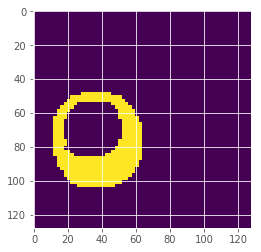

In [9]:
plt.imshow(y[0, 10, :, :, 0]==2)
plt.show()

In [10]:
y_1 = (y==1) > 0
y_2 = (y==2) > 0
y_3 = (y==3) > 0
y_4 = (y==4) > 0
y_5 = (y==5) > 0
y_6 = (y==6) > 0

1 - lumen  
2 - vessel  
3 - lipid  
4 - calcium  
5 - ulceration (not using)   
6 - hemorrhage  


In [11]:
subs_1 = np.sum(y_1, axis=(1, 2, 3, 4))>0
subs_2 = np.sum(y_2, axis=(1, 2, 3, 4))>0
subs_3 = np.sum(y_3, axis=(1, 2, 3, 4))>0
subs_4 = np.sum(y_4, axis=(1, 2, 3, 4))>0
subs_5 = np.sum(y_5, axis=(1, 2, 3, 4))>0
subs_6 = np.sum(y_6, axis=(1, 2, 3, 4))>0

In [12]:
print ('lumen: ', np.sum(np.sum(y_1, axis=(1, 2, 3, 4))>0), 
       '\nvessel: ', np.sum(np.sum(y_2, axis=(1, 2, 3, 4))>0),
       '\nlipid: ', np.sum(np.sum(y_3, axis=(1, 2, 3, 4))>0),
       '\ncalcium: ', np.sum(np.sum(y_4, axis=(1, 2, 3, 4))>0),
       '\nulceration: ', np.sum(np.sum(y_5, axis=(1, 2, 3, 4))>0),
       '\nIPH: ', np.sum(np.sum(y_6, axis=(1, 2, 3, 4))>0)
      )

lumen:  115 
vessel:  115 
lipid:  68 
calcium:  108 
ulceration:  1 
IPH:  41


In [309]:
vols_1 = []
vols_2 = []
vols_3 = []
vols_4 = []
vols_5 = []
vols_6 = []

for i in range (0, n_subs):
    
    vol_1 = np.sum(y_1[i, ...])*spacings[i]*spacings[i]*SLICE_THICKNESS
    vol_2 = np.sum(y_2[i, ...])*spacings[i]*spacings[i]*SLICE_THICKNESS
    vol_3 = np.sum(y_3[i, ...])*spacings[i]*spacings[i]*SLICE_THICKNESS
    vol_4 = np.sum(y_4[i, ...])*spacings[i]*spacings[i]*SLICE_THICKNESS
    vol_5 = np.sum(y_5[i, ...])*spacings[i]*spacings[i]*SLICE_THICKNESS
    vol_6 = np.sum(y_6[i, ...])*spacings[i]*spacings[i]*SLICE_THICKNESS
    
    vols_1.append(vol_1)
    vols_2.append(vol_2)
    vols_3.append(vol_3)
    vols_4.append(vol_4)
    vols_5.append(vol_5)
    vols_6.append(vol_6)

In [310]:
print ('lumen: ', np.mean(vols_1), 
       '\nvessel: ', np.mean(vols_2),
       '\nlipid: ', np.mean(vols_3),
       '\ncalcium: ', np.mean(vols_4),
       '\nulceration: ', np.mean(vols_5),
       '\nIPH: ', np.mean(vols_6)
      )

lumen:  1003.0777223084284 
vessel:  1109.1728499635406 
lipid:  72.83335307214571 
calcium:  83.91056211772172 
ulceration:  0.03381427319153495 
IPH:  75.75145308038462


In [16]:
seed = 42
random.seed = seed
np.random.seed(seed=seed)

subs_1_train, subs_1_test_valid = train_test_split(np.arange(0, n_subs), test_size=0.25, stratify=subs_1, 
                                                   random_state=seed)
subs_1_valid, subs_1_test = train_test_split(subs_1_test_valid, test_size=0.4, stratify = subs_1[subs_1_test_valid], 
                                             random_state=seed)

print ('lumen:\n %s, %s, %s \n %s, %s, %s \n' % (len(subs_1_train), len(subs_1_valid), len(subs_1_test), 
                                                 np.sum(subs_1[subs_1_train]), np.sum(subs_1[subs_1_valid]), 
                                                 np.sum(subs_1[subs_1_test])))

subs_3_train, subs_3_test_valid = train_test_split(np.arange(0, n_subs), test_size=0.25, stratify=subs_3, 
                                                   random_state=seed)
subs_3_valid, subs_3_test = train_test_split(subs_3_test_valid, test_size=0.4, stratify = subs_3[subs_3_test_valid], 
                                             random_state=seed)

print ('lipid:\n %s, %s, %s \n %s, %s, %s \n' % (len(subs_3_train), len(subs_3_valid), len(subs_3_test), 
                                                 np.sum(subs_3[subs_3_train]), np.sum(subs_3[subs_3_valid]), 
                                                 np.sum(subs_3[subs_3_test])))

subs_4_train, subs_4_test_valid = train_test_split(np.arange(0, n_subs), test_size=0.25, stratify=subs_4, 
                                                   random_state=seed)
subs_4_valid, subs_4_test = train_test_split(subs_4_test_valid, test_size=0.4, stratify = subs_4[subs_4_test_valid], 
                                             random_state=seed)

print ('calcification:\n %s, %s, %s \n %s, %s, %s \n' % (len(subs_4_train), len(subs_4_valid), len(subs_4_test), 
                                                 np.sum(subs_4[subs_4_train]), np.sum(subs_4[subs_4_valid]), 
                                                 np.sum(subs_4[subs_4_test])))

subs_6_train, subs_6_test_valid = train_test_split(np.arange(0, n_subs), test_size=0.25, stratify=subs_6, 
                                                   random_state=seed)
subs_6_valid, subs_6_test = train_test_split(subs_6_test_valid, test_size=0.5, stratify = subs_6[subs_6_test_valid], 
                                             random_state=seed)

print ('iph:\n %s, %s, %s \n %s, %s, %s \n' % (len(subs_6_train), len(subs_6_valid), len(subs_6_test), 
                                                 np.sum(subs_6[subs_6_train]), np.sum(subs_6[subs_6_valid]), 
                                                 np.sum(subs_6[subs_6_test])))

lumen:
 86, 17, 12 
 86, 17, 12 

lipid:
 86, 17, 12 
 51, 10, 7 

calcification:
 86, 17, 12 
 81, 16, 11 

iph:
 86, 14, 15 
 31, 5, 5 



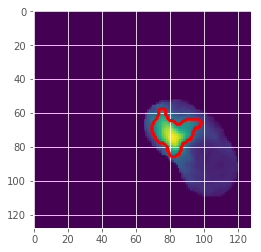

In [17]:
sl = 11

plt.imshow(X[5, sl, :, :, 3])
plt.contour(y[5, sl, :, :, 0]==6, colors = 'r')

plt.show()

In [241]:
X_train_lumen = X[subs_1_train, ...]
X_valid_lumen = X[subs_1_valid, ...]
X_test_lumen = X[subs_1_test, ...]

y_train_lumen = y[subs_1_train, :, :, :, 0]==1
y_train_lumen = y_train_lumen[..., np.newaxis]

y_valid_lumen = y[subs_1_valid, :, :, :, 0]==1
y_valid_lumen = y_valid_lumen[..., np.newaxis]

y_test_lumen = y[subs_1_test, :, :, :, 0]==1
y_test_lumen = y_test_lumen[..., np.newaxis]

spacings_train_lumen = spacings[subs_1_train]
spacings_valid_lumen = spacings[subs_1_valid]
spacings_test_lumen = spacings[subs_1_test]

print (X_train_lumen.shape, X_valid_lumen.shape, X_test_lumen.shape)
print (y_train_lumen.shape, y_valid_lumen.shape, y_test_lumen.shape)
print (spacings_train_lumen.shape, spacings_valid_lumen.shape, spacings_test_lumen.shape)

(86, 16, 128, 128, 5) (17, 16, 128, 128, 5) (12, 16, 128, 128, 5)
(86, 16, 128, 128, 1) (17, 16, 128, 128, 1) (12, 16, 128, 128, 1)
(86,) (17,) (12,)


In [242]:
X_train_lipid = X[subs_3_train, :, :, :, :]
X_valid_lipid = X[subs_3_valid, :, :, :, :]
X_test_lipid = X[subs_3_test, :, :, :, :]

y_train_lipid = y[subs_3_train, :, :, :, 0]==3
y_train_lipid = y_train_lipid[..., np.newaxis]

y_valid_lipid = y[subs_3_valid, :, :, :, 0]==3
y_valid_lipid = y_valid_lipid[..., np.newaxis]

y_test_lipid = y[subs_3_test, :, :, :, 0]==3
y_test_lipid = y_test_lipid[..., np.newaxis]

spacings_train_lipid = spacings[subs_3_train]
spacings_valid_lipid = spacings[subs_3_valid]
spacings_test_lipid = spacings[subs_3_test]

print (X_train_lipid.shape, X_valid_lipid.shape, X_test_lipid.shape)
print (y_train_lipid.shape, y_valid_lipid.shape, y_test_lipid.shape)
print (spacings_train_lipid.shape, spacings_valid_lipid.shape, spacings_test_lipid.shape)

(86, 16, 128, 128, 5) (17, 16, 128, 128, 5) (12, 16, 128, 128, 5)
(86, 16, 128, 128, 1) (17, 16, 128, 128, 1) (12, 16, 128, 128, 1)
(86,) (17,) (12,)


In [243]:
X_train_calc = X[subs_4_train, ...]
X_valid_calc = X[subs_4_valid, ...]
X_test_calc = X[subs_4_test, ...]

y_train_calc = y[subs_4_train, :, :, :, 0]==4
y_train_calc = y_train_calc[..., np.newaxis]

y_valid_calc = y[subs_4_valid, :, :, :, 0]==4
y_valid_calc = y_valid_calc[..., np.newaxis]

y_test_calc = y[subs_4_test, :, :, :, 0]==4
y_test_calc = y_test_calc[..., np.newaxis]

spacings_train_calc = spacings[subs_4_train]
spacings_valid_calc = spacings[subs_4_valid]
spacings_test_calc = spacings[subs_4_test]

print (X_train_calc.shape, X_valid_calc.shape, X_test_calc.shape)
print (y_train_calc.shape, y_valid_calc.shape, y_test_calc.shape)
print (spacings_train_calc.shape, spacings_valid_calc.shape, spacings_test_calc.shape)

(86, 16, 128, 128, 5) (17, 16, 128, 128, 5) (12, 16, 128, 128, 5)
(86, 16, 128, 128, 1) (17, 16, 128, 128, 1) (12, 16, 128, 128, 1)
(86,) (17,) (12,)


In [244]:
X_train_iph = X[subs_6_train, :, :, :, :]
X_valid_iph = X[subs_6_valid, :, :, :, :]
X_test_iph = X[subs_6_test, :, :, :, :]

y_train_iph = y[subs_6_train, :, :, :, 0]==6
y_train_iph = y_train_iph[..., np.newaxis]

y_valid_iph = y[subs_6_valid, :, :, :, 0]==6
y_valid_iph = y_valid_iph[..., np.newaxis]

y_test_iph = y[subs_6_test, :, :, :, 0]==6
y_test_iph = y_test_iph[..., np.newaxis]

spacings_train_iph = spacings[subs_6_train]
spacings_valid_iph = spacings[subs_6_valid]
spacings_test_iph = spacings[subs_6_test]

print (X_train_iph.shape, X_valid_iph.shape, X_test_iph.shape)
print (y_train_iph.shape, y_valid_iph.shape, y_test_iph.shape)
print (spacings_train_iph.shape, spacings_valid_iph.shape, spacings_test_iph.shape)

(86, 16, 128, 128, 5) (14, 16, 128, 128, 5) (15, 16, 128, 128, 5)
(86, 16, 128, 128, 1) (14, 16, 128, 128, 1) (15, 16, 128, 128, 1)
(86,) (14,) (15,)


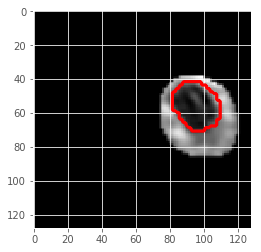

In [245]:
sl = 10
sub = 5

plt.imshow(X_train_lumen[sub, sl, :, :, 0], cmap = 'gray')
plt.contour(y_train_lumen[sub, sl, :, :, 0], colors = 'r')
plt.show()

In [246]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = '0,1,2'                        
import tensorflow as tf
import tensorflow.keras.backend as K

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)
        
#K.tensorflow_backend._get_available_gpus()
tf.config.experimental.list_physical_devices('GPU')

3 Physical GPUs, 3 Logical GPUs


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU')]

In [247]:
def conv3d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    """Function to add 2 convolutional layers with the parameters passed to it"""
    # first layer
    x = Conv3D(filters = n_filters, kernel_size = (kernel_size, kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # second layer
    x = Conv3D(filters = n_filters, kernel_size = (kernel_size, kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)

    return x

def get_unet(input_img, n_filters = 8, dropout = 0.2, batchnorm = True):
    """Function to define the UNET Model"""
    # Contracting Path
    c1 = conv3d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    p1 = MaxPooling3D((2, 2, 2), padding='same')(c1)
    p1 = Dropout(dropout)(p1)
    print ('c1', c1.shape)

    c2 = conv3d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = MaxPooling3D((2, 2, 2), padding='same')(c2)
    p2 = Dropout(dropout)(p2)
    print ('c2', c2.shape)
    print ('p2', p2.shape)

    c3 = conv3d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = MaxPooling3D((2, 2, 2), padding='same')(c3)
    p3 = Dropout(dropout)(p3)
    print ('c3', c3.shape)
    print ('p3', p3.shape)

    c4 = conv3d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = MaxPooling3D((2, 2, 2), padding='same')(c4)
    p4 = Dropout(dropout)(p4)
    print ('c4', c4.shape)
    print ('p4', p4.shape)

    c5 = conv3d_block(p4, n_filters = n_filters * 16, kernel_size = 3, batchnorm = batchnorm)
    print ('c5', c5.shape)

    # Expansive Path
    u6 = Conv3DTranspose(n_filters * 8, (3, 3, 3), strides = (2, 2, 2), padding = 'same')(c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv3d_block(u6, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    print ('c6', c6.shape)
    print ('u6', u6.shape)

    u7 = Conv3DTranspose(n_filters * 4, (3, 3, 3), strides = (2, 2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv3d_block(u7, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)

    u8 = Conv3DTranspose(n_filters * 2, (3, 3, 3), strides = (2, 2, 2), padding = 'same')(c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv3d_block(u8, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)

    u9 = Conv3DTranspose(n_filters * 1, (3, 3, 3), strides = (2, 2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, c1])
    u9 = Dropout(dropout)(u9)
    c9 = conv3d_block(u9, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)

    outputs = Conv3D(1, (1, 1, 1), activation='sigmoid')(c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

In [313]:
def dice_coef(y_true, y_pred):
    from keras import backend as K
    smooth=1
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

def custom_loss_2c(y_true, y_pred):

    return 0.5*tf.keras.losses.binary_crossentropy(y_true,y_pred)+0.5*dice_loss(y_true,y_pred)

def normvoldif(y_true, y_pred):
    
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    
    vol_true = K.sum(y_true_f)
    vol_pred = K.sum(y_pred_f)
    dif = abs(vol_true-vol_pred)/(vol_true+vol_pred)
    
    return dif

def custom_loss_3c(y_true, y_pred):

    return 0.4*tf.keras.losses.binary_crossentropy(y_true,
                                                   y_pred)+0.4*dice_loss(y_true,
                                                                         y_pred)+0.2*normvoldif(y_true,
                                                                                                y_pred)

def custom_loss_2c_vol(y_true, y_pred):

    return 0.5*dice_loss(y_true,y_pred)+0.5*normvoldif(y_true, y_pred)

In [253]:
from skimage import measure

In [282]:


def dice_eval(y_true, y_pred, smooth=1):

    n_s = y_true.shape[0]
    dscs = []
    for s in range (0, n_s):
        vol_true = y_true[s, ..., 0]
        vol_pred = y_pred[s, ..., 0]
        intersect = np.sum(y_true*y_pred)
        union = np.sum(y_true) + np.sum(y_pred)
        dsc = (2*intersect+smooth)/(union+smooth)
        dscs.append(dsc)
    return np.mean(dscs)

def dice_coef_numpy(y_true, y_pred):

    smooth=1
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

def vol_diff_eval(y_true, y_pred, pixel_spacings, slice_thickness=SLICE_THICKNESS):

    n_s = y_true.shape[0]
    vds = []

    for s in range (0, n_s):
        vol_true = np.sum(y_true[s, ..., 0])
        vol_pred = np.sum(y_pred[s, ..., 0])
        vd = vol_true-vol_pred
        vds.append(vd*pixel_spacings[s]*pixel_spacings[s]*slice_thickness)

    return (np.mean(np.abs(vds)), np.mean(vds))
            

def class_acc_eval(y_true, y_pred):
    
    n_s = y_true.shape[0]
    class_accs = []
    vol_vol = y_true.shape[1]*y_true.shape[2]*y_true.shape[3]
    for s in range (0, n_s):
        vol_true = y_true[s, ..., 0]
        vol_pred = y_pred[s, ..., 0]
        vol_eq = (vol_true==vol_pred)
        class_acc = np.sum(vol_eq)/vol_vol
        class_accs.append(class_acc)
    return np.mean(class_accs)

def prec_recall_eval(y_true, y_pred):
    
    n_s = y_true.shape[0]
    class_precs = []
    class_recs = []

    for s in range (0, n_s):
        vol_true = y_true[s, ..., 0].flatten()
        vol_pred = y_pred[s, ..., 0].flatten()
        class_precs.append(precision_score(vol_true, vol_pred))
        class_recs.append(recall_score(vol_true, vol_pred))
        
    return (np.mean(class_precs), np.mean(class_recs))

def jaccard_eval(y_true, y_pred, smooth=1):

    n_s = y_true.shape[0]
    jscs = []
    for s in range (0, n_s):
        vol_true = y_true[s, ..., 0]
        vol_pred = y_pred[s, ..., 0]
        intersect = np.sum(y_true*y_pred) 
        total = np.sum(y_true) + np.sum(y_pred)
        union = total-intersect
        jsc = (intersect+smooth)/(union+smooth)
        jscs.append(jsc)
    return np.mean(jscs)

def centr_dist_eval(y_true, y_pred, pixel_spacings, slice_thickness=SLICE_THICKNESS):
    
    n_s = y_true.shape[0]
    cds = []
    for s in range (0, n_s):
        
        vol_true = y_true[s, ..., 0]
        vol_pred = y_pred[s, ..., 0]
        
        if np.sum(vol_true)&np.sum(vol_pred):
        
            labels_true = measure.label(vol_true, background=0)
            labels_pred = measure.label(vol_pred, background=0)
            
            distances_patient = []

            for l_true in range (1, np.max(labels_true)+1):

                label_true = (labels_true==l_true)
                distances_label = []

                for l_pred in range (1, np.max(labels_pred)+1):

                    label_pred = (labels_pred==l_pred)
        
                    mass_true_x, mass_true_y, mass_true_z = np.where(label_true > 0)
                    cent_true_x = np.average(mass_true_x)
                    cent_true_y = np.average(mass_true_y)
                    cent_true_z = np.average(mass_true_z)

                    mass_pred_x, mass_pred_y, mass_pred_z = np.where(label_pred > 0)
                    cent_pred_x = np.average(mass_pred_x)
                    cent_pred_y = np.average(mass_pred_y)
                    cent_pred_z = np.average(mass_pred_z)

                    cd = ((slice_thickness*(cent_true_x-cent_pred_x))**2 + (pixel_spacings[s]*(cent_true_y-cent_pred_y))**2 
                          + (pixel_spacings[0]*(cent_true_z-cent_pred_z))**2)**0.5
                    distances_label.append(cd)
                    
                distances_patient.append(np.min(distances_label))
                
            cds.append(np.mean(distances_patient))
    
    return np.mean(cds)

#https://github.com/deepmind/surface-distance

import lookup_tables

def _compute_bounding_box(mask):
    
    num_dims = len(mask.shape)
    bbox_min = np.zeros(num_dims, np.int64)
    bbox_max = np.zeros(num_dims, np.int64)
    
    proj_0 = np.amax(mask, axis=tuple(range(num_dims))[1:])
    idx_nonzero_0 = np.nonzero(proj_0)[0]
    if len(idx_nonzero_0) == 0:  
        return None, None
    
    bbox_min[0] = np.min(idx_nonzero_0)
    bbox_max[0] = np.max(idx_nonzero_0)
    
    for axis in range(1, num_dims):
        max_over_axes = list(range(num_dims))  
        max_over_axes.pop(axis)  
        max_over_axes = tuple(max_over_axes)  
        proj = np.amax(mask, axis=max_over_axes)
        idx_nonzero = np.nonzero(proj)[0]
        bbox_min[axis] = np.min(idx_nonzero)
        bbox_max[axis] = np.max(idx_nonzero)
        
    return bbox_min, bbox_max


def _crop_to_bounding_box(mask, bbox_min, bbox_max):
    
    cropmask = np.zeros((bbox_max - bbox_min) + 2, np.uint8)
    num_dims = len(mask.shape)
    
    cropmask[0:-1, 0:-1, 0:-1] = mask[bbox_min[0]:bbox_max[0] + 1,
                                      bbox_min[1]:bbox_max[1] + 1,
                                      bbox_min[2]:bbox_max[2] + 1]
    
    return cropmask


def _sort_distances_surfels(distances, surfel_areas):
    
    sorted_surfels = np.array(sorted(zip(distances, surfel_areas)))
    
    return sorted_surfels[:, 0], sorted_surfels[:, 1]


def compute_surface_distances(mask_gt, mask_pred, spacing_mm):
    
    num_dims = len(spacing_mm)
    neighbour_code_to_surface_area = (lookup_tables.create_table_neighbour_code_to_surface_area(spacing_mm))
    kernel = lookup_tables.ENCODE_NEIGHBOURHOOD_3D_KERNEL
    full_true_neighbours = 0b11111111
    bbox_min, bbox_max = _compute_bounding_box(mask_gt | mask_pred)
    if bbox_min is None:
        return {
            "distances_gt_to_pred": np.array([]),
            "distances_pred_to_gt": np.array([]),
            "surfel_areas_gt": np.array([]),
            "surfel_areas_pred": np.array([]),
        }
    cropmask_gt = _crop_to_bounding_box(mask_gt, bbox_min, bbox_max)
    cropmask_pred = _crop_to_bounding_box(mask_pred, bbox_min, bbox_max)
    neighbour_code_map_gt = ndimage.filters.correlate(cropmask_gt.astype(np.uint8), kernel, mode="constant", cval=0)
    neighbour_code_map_pred = ndimage.filters.correlate(cropmask_pred.astype(np.uint8), kernel, mode="constant", cval=0)
    
    borders_gt = ((neighbour_code_map_gt != 0) & (neighbour_code_map_gt != full_true_neighbours))
    borders_pred = ((neighbour_code_map_pred != 0) & (neighbour_code_map_pred != full_true_neighbours))
    
    if borders_gt.any():
        distmap_gt = ndimage.morphology.distance_transform_edt(~borders_gt, sampling=spacing_mm)
    else:
        distmap_gt = np.Inf * np.ones(borders_gt.shape)
        
    if borders_pred.any():
        distmap_pred = ndimage.morphology.distance_transform_edt(~borders_pred, sampling=spacing_mm)
    else:
        distmap_pred = np.Inf * np.ones(borders_pred.shape)
        
    surface_area_map_gt = neighbour_code_to_surface_area[neighbour_code_map_gt]
    surface_area_map_pred = neighbour_code_to_surface_area[neighbour_code_map_pred]
    
    distances_gt_to_pred = distmap_pred[borders_gt]
    distances_pred_to_gt = distmap_gt[borders_pred]
    surfel_areas_gt = surface_area_map_gt[borders_gt]
    surfel_areas_pred = surface_area_map_pred[borders_pred]
    
    if distances_gt_to_pred.shape != (0,):
        distances_gt_to_pred, surfel_areas_gt = _sort_distances_surfels(distances_gt_to_pred, surfel_areas_gt)
        
    if distances_pred_to_gt.shape != (0,):
        distances_pred_to_gt, surfel_areas_pred = _sort_distances_surfels(distances_pred_to_gt, surfel_areas_pred)
        
    return {
        "distances_gt_to_pred": distances_gt_to_pred,
        "distances_pred_to_gt": distances_pred_to_gt,
        "surfel_areas_gt": surfel_areas_gt,
        "surfel_areas_pred": surfel_areas_pred,
    }


def compute_average_surface_distance(surface_distances):
    
    distances_gt_to_pred = surface_distances["distances_gt_to_pred"]
    distances_pred_to_gt = surface_distances["distances_pred_to_gt"]
    surfel_areas_gt = surface_distances["surfel_areas_gt"]
    surfel_areas_pred = surface_distances["surfel_areas_pred"]
    average_distance_gt_to_pred = (np.sum(distances_gt_to_pred * surfel_areas_gt) / np.sum(surfel_areas_gt))
    average_distance_pred_to_gt = (np.sum(distances_pred_to_gt * surfel_areas_pred) /np.sum(surfel_areas_pred))
    
    return (average_distance_gt_to_pred, average_distance_pred_to_gt)

def compute_robust_hausdorff(surface_distances, percent):
    
    distances_gt_to_pred = surface_distances["distances_gt_to_pred"]
    distances_pred_to_gt = surface_distances["distances_pred_to_gt"]
    surfel_areas_gt = surface_distances["surfel_areas_gt"]
    surfel_areas_pred = surface_distances["surfel_areas_pred"]
    if len(distances_gt_to_pred) > 0:  
        surfel_areas_cum_gt = np.cumsum(surfel_areas_gt) / np.sum(surfel_areas_gt)
        idx = np.searchsorted(surfel_areas_cum_gt, percent/100.0)
        perc_distance_gt_to_pred = distances_gt_to_pred[min(idx, len(distances_gt_to_pred)-1)]
    else:
        perc_distance_gt_to_pred = np.Inf
        
    if len(distances_pred_to_gt) > 0:  
        surfel_areas_cum_pred = (np.cumsum(surfel_areas_pred) / np.sum(surfel_areas_pred))
        idx = np.searchsorted(surfel_areas_cum_pred, percent/100.0)
        perc_distance_pred_to_gt = distances_pred_to_gt[min(idx, len(distances_pred_to_gt)-1)]
    else:
        perc_distance_pred_to_gt = np.Inf
        
    return max(perc_distance_gt_to_pred, perc_distance_pred_to_gt)


def compute_surface_overlap_at_tolerance(surface_distances, tolerance_mm):
    
    distances_gt_to_pred = surface_distances["distances_gt_to_pred"]
    distances_pred_to_gt = surface_distances["distances_pred_to_gt"]
    surfel_areas_gt = surface_distances["surfel_areas_gt"]
    surfel_areas_pred = surface_distances["surfel_areas_pred"]
    rel_overlap_gt = (np.sum(surfel_areas_gt[distances_gt_to_pred <= tolerance_mm]) /np.sum(surfel_areas_gt))
    rel_overlap_pred = (np.sum(surfel_areas_pred[distances_pred_to_gt <= tolerance_mm]) /np.sum(surfel_areas_pred))
    
    return (rel_overlap_gt, rel_overlap_pred)


def compute_surface_dice_at_tolerance(surface_distances, tolerance_mm):
    
    distances_gt_to_pred = surface_distances["distances_gt_to_pred"]
    distances_pred_to_gt = surface_distances["distances_pred_to_gt"]
    surfel_areas_gt = surface_distances["surfel_areas_gt"]
    surfel_areas_pred = surface_distances["surfel_areas_pred"]
    overlap_gt = np.sum(surfel_areas_gt[distances_gt_to_pred <= tolerance_mm])
    overlap_pred = np.sum(surfel_areas_pred[distances_pred_to_gt <= tolerance_mm])
    surface_dice = (overlap_gt + overlap_pred) / (np.sum(surfel_areas_gt) + np.sum(surfel_areas_pred))
    
    return surface_dice

# https://github.com/kkiser1/Autosegmentation-Spatial-Similarity-Metrics/blob/master/APIs/segmentationMetrics_APIs.py

def getEdgeOfMask(mask):
    
    edge = np.zeros_like(mask)
    mask_pixels = np.where(mask > 0)

    for idx in range(0,mask_pixels[0].size):

        x = mask_pixels[0][idx]
        y = mask_pixels[1][idx]
        z = mask_pixels[2][idx]

        if mask[x-1:x+2, y-1:y+2, z-1:z+2].sum() < 27:
            edge[x,y,z] = 1
            
    return edge

def AddedPathLength(mask_true, mask_pred):
    
    edge_true = getEdgeOfMask(mask_true)
    edge_pred = getEdgeOfMask(mask_pred)
   
    apl = (edge_true > edge_pred).astype(int).sum()
    
    return apl 

def hausdorff_eval(y_true, y_pred, pixel_spacings, slice_thickness=SLICE_THICKNESS):
    
    n_s = y_true.shape[0]
    hds = []
    
    for s in range (0, n_s):
        vol_true = y_true[s, ..., 0]
        vol_pred = y_pred[s, ..., 0]
        if (np.sum(vol_true)>0)&(np.sum(vol_pred)>0):
            sd = compute_surface_distances(vol_true, vol_pred, [slice_thickness, pixel_spacings[s], pixel_spacings[s]])
            hd = compute_robust_hausdorff(sd, 95)
            hds.append(hd)
        
    return np.mean(hds)

def sdice_eval(y_true, y_pred, pixel_spacings, slice_thickness=SLICE_THICKNESS, tolerance=1):
    
    n_s = y_true.shape[0]
    sdscs = []
    
    for s in range (0, n_s):
        vol_true = y_true[s, ..., 0]
        vol_pred = y_pred[s, ..., 0]
        if (np.sum(vol_true)>0)&(np.sum(vol_pred)>0):
            sd = compute_surface_distances(vol_true, vol_pred, [slice_thickness, pixel_spacings[s], pixel_spacings[0]])
            sdsc = compute_surface_dice_at_tolerance(sd, tolerance)
            sdscs.append(sdsc)
        
    return np.mean(sdscs)

def APL_eval(y_true, y_pred):
    
    n_s = y_true.shape[0]
    apls = []
    
    for s in range (0, n_s):
        vol_true = y_true[s, ..., 0]
        vol_pred = y_pred[s, ..., 0]
        apl = AddedPathLength(vol_true, vol_pred)
        apls.append(apl)
        
    return np.mean(apls)

def detect_eval(y_true, y_pred):
    
    n_s = y_true.shape[0]
    sub_detects = []
    sl_detects_mean = []
    
    for s in range (0, n_s):
        vol_true = y_true[s, ..., 0]
        vol_pred = y_pred[s, ..., 0]
        presence_true = np.sum(vol_true)>0
        presence_pred = np.sum(vol_pred)>0
        detect_sub = int(presence_true==presence_pred)
        sub_detects.append(detect_sub)
        sl_detects = []
        for sl in range (0, 16):
            sl_true = vol_true[sl, ...]
            sl_pred = vol_pred[sl, ...]
            presence_true = np.sum(sl_true)>0
            presence_pred = np.sum(sl_pred)>0
            detect_sl = int(presence_true==presence_pred)
            sl_detects.append(detect_sl)
        sl_detects_mean.append(np.mean(sl_detects))
        
    return (np.mean(sub_detects), np.mean(sl_detects_mean))

#d = np.zeros((15, 86))

#for sl in range (0, 15):
#    for ix in range (0, 86):
#        d[sl, ix] = dice_coef_np(y_train_lumen[ix, sl, ..., 0].astype(np.uint8), preds_train_lumen_t[ix, sl, ..., 0])
        
#plt.plot(np.mean(d, axis = 1))
#plt.fill_between(np.linspace(0, 15, 15), 
#                 np.mean(d, axis = 1)+2*np.std(d, axis = 1), 
#                 np.mean(d, axis = 1)-2*np.std(d, axis = 1), alpha = 0.25)
#plt.show()

def bland_altman(y_true, y_pred, pixel_spacings, slice_thickness=SLICE_THICKNESS):

    n_s = y_true.shape[0]
    vds = []
    vas = []
    for s in range (0, n_s):
        vol_true = np.sum(y_true[s, ..., 0])*pixel_spacings[s]*pixel_spacings[s]*slice_thickness
        vol_pred = np.sum(y_pred[s, ..., 0])*pixel_spacings[s]*pixel_spacings[s]*slice_thickness
        vd = vol_true-vol_pred
        va = (vol_true+vol_pred)/2
        vds.append(vd)
        vas.append(va)
        
    vds = np.array(vds)
    vas = np.array(vas)
    
    vd_av = np.mean(vds)
    vd_sd = np.std(vds)
    
    va_av = np.mean(vas)
    
    
    plt.figure(figsize=(7.5, 7.5))
    plt.plot(vas, vds, 'o', color='k')
    
    plt.axhline(y=vd_av, color='b', linestyle='-', label='Mean: '+'%.2f' % (vd_av))    
    plt.axhline(y=vd_av-1.96*vd_sd, color='r', linestyle='--', label='Mean+1.96SD: '+'%.2f' % (vd_av+vd_sd))
    plt.axhline(y=vd_av+1.96*vd_sd, color='r', linestyle='--', label='Mean-1.96SD: '+'%.2f' % (vd_av-vd_sd))
    plt.legend()
    
    plt.xlabel('Average of segmentations, mm^3')
    plt.ylabel('Difference between segmentations, mm^3')
    plt.show()
    

def eval_segmentation_metrics(y_true, y_pred, pixel_spacings):
    
    print ('Voxel classification accuracy: ', class_acc_eval(y_true, y_pred))
    print ('Precision and recall: ', prec_recall_eval(y_true, y_pred))
    print ('Dice score: ', dice_eval(y_true, y_pred))
    print ('Jaccard score: ', jaccard_eval(y_true, y_pred))
    print ('Volume difference (mean absolute, mean): ', vol_diff_eval(y_true, y_pred, pixel_spacings))
    print ('Centroid distance: ', centr_dist_eval(y_true, y_pred, pixel_spacings))
    print ('Hausdorff distance: ', hausdorff_eval(y_true, y_pred, pixel_spacings))
    print ('Surface Dice score: ', sdice_eval(y_true, y_pred, pixel_spacings))
    print ('Added path length: ', APL_eval(y_true, y_pred))
    print ('Detection rate (per patient, per slice): ', detect_eval(y_true, y_pred))
    bland_altman(y_true, y_pred, pixel_spacings)

In [283]:
def show_seg_slices(ix, X, y_true, y_pred):

    for sl in range (0, 16):

        fig, ax = plt.subplots(1, 3, figsize=(15, 7.5))

        ax[0].imshow(X[ix, sl, ..., 0], cmap='viridis')
        ax[0].contour(y_true[ix, sl, ..., 0].squeeze(), colors='r', levels=[0.5], linewidths=5)
        ax[0].set_title('True')
        ax[0].grid(False)

        ax[1].imshow(X[ix, sl, ..., 0], cmap='viridis')
        ax[1].contour(y_pred[ix, sl, ..., 0].squeeze(), colors='r', levels=[0.5], linewidths=5)
        ax[1].set_title('Predicted')
        ax[1].grid(False)

        ax[2].imshow(y_true[ix, sl, ..., 0].squeeze(), vmin=0, vmax=2)
        ax[2].contour(y_pred[ix, sl, ..., 0].squeeze(), colors='r', levels=[0.5], linewidths=5)
        ax[2].set_title('Predicted segmentation')
        ax[2].grid(False)

In [284]:
def train_evaluate_model(output_file_name, loss_func, 
                         X_training, y_training, 
                         X_validation, y_validation, 
                         X_testing, y_testing, 
                         pixel_spacings_train, pixel_spacings_validation, pixel_spacings_test):
    
    callbacks = [
        EarlyStopping(patience=100, verbose=1),
        ReduceLROnPlateau(factor=0.1, patience=10, min_lr=0.00001, verbose=1),
        ModelCheckpoint(output_file_name, verbose=1, save_best_only=True, save_weights_only=True)
    ]
    
    input_img = Input((16, 128, 128, 5), name='img')
    model = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)
    model.compile(optimizer=Adam(), loss=loss_func, metrics=['accuracy', dice_coef])
    model.summary()
    
    results = model.fit(X_training, y_training, batch_size=BATCH_SIZE, epochs=250, callbacks=callbacks, 
                        validation_data=(X_validation, y_validation))
    
    plt.figure(figsize=(8, 8))
    plt.title("Learning curve")
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", 
             color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("loss")
    plt.legend();
    
    model.load_weights(output_file_name)
    
    #model.evaluate(X_training, y_train, verbose=1)
    #model.evaluate(X_validation, y_valid, verbose=1)
    #model.evaluate(X_testing, y_test, verbose=1)
    
    preds_train = model.predict(X_training, verbose=1)
    preds_valid = model.predict(X_validation, verbose=1)
    preds_test = model.predict(X_testing, verbose=1)

    preds_train_t = (preds_train > 0.5).astype(np.uint8)
    preds_valid_t = (preds_valid > 0.5).astype(np.uint8)
    preds_test_t = (preds_test > 0.5).astype(np.uint8)
    
    print ('\nTrain')
    eval_segmentation_metrics(y_training, preds_train_t, pixel_spacings_train)

    print ('\nValidation')
    eval_segmentation_metrics(y_validation, preds_valid_t, pixel_spacings_validation)

    print ('\nTest')
    eval_segmentation_metrics(y_testing, preds_test_t, pixel_spacings_test)
    
    return preds_train, preds_valid, preds_test

## Dice

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_23"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_438 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_415 (BatchN (None, 16, 128, 128, 64          conv3d_438[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8227 - acc: 0.7276 - dice_coef: 0.1773
Epoch 00001: val_loss improved from inf to 0.86648, saving model to model_vessel-seg-3d_lumen.h5
86/86 [==============================] - 93s 1s/sample - loss: 0.8158 - acc: 0.7364 - dice_coef: 0.1938 - val_loss: 0.8665 - val_acc: 0.2412 - val_dice_coef: 0.1525
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7580 - acc: 0.8488 - dice_coef: 0.2420
Epoch 00002: val_loss improved from 0.86648 to 0.85247, saving model to model_vessel-seg-3d_lumen.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.7564 - acc: 0.8502 - dice_coef: 0.2459 - val_loss: 0.8525 - val_acc: 0.4211 - val_dice_coef: 0.1720
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7487 - acc: 0.8588 - dice_coef: 0.2513
Epoch 00003: val_loss improved from 0.85247 to 0.80340, saving model to model_vessel-seg-3d_lumen

86/86 [==============================] - 4s 41ms/sample - loss: 0.5171 - acc: 0.9838 - dice_coef: 0.4873 - val_loss: 0.5806 - val_acc: 0.9881 - val_dice_coef: 0.3938
Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4904 - acc: 0.9842 - dice_coef: 0.5096
Epoch 00024: val_loss improved from 0.58060 to 0.54109, saving model to model_vessel-seg-3d_lumen.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.4889 - acc: 0.9840 - dice_coef: 0.5133 - val_loss: 0.5411 - val_acc: 0.9876 - val_dice_coef: 0.4210
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4577 - acc: 0.9852 - dice_coef: 0.5423
Epoch 00025: val_loss improved from 0.54109 to 0.47968, saving model to model_vessel-seg-3d_lumen.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.4628 - acc: 0.9853 - dice_coef: 0.5300 - val_loss: 0.4797 - val_acc: 0.9877 - val_dice_coef: 0.5720
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4434 -

86/86 [==============================] - 3s 40ms/sample - loss: 0.1666 - acc: 0.9923 - dice_coef: 0.8299 - val_loss: 0.2002 - val_acc: 0.9904 - val_dice_coef: 0.7659
Epoch 46/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1594 - acc: 0.9921 - dice_coef: 0.8406
Epoch 00046: val_loss did not improve from 0.20017
86/86 [==============================] - 3s 36ms/sample - loss: 0.1614 - acc: 0.9922 - dice_coef: 0.8359 - val_loss: 0.2036 - val_acc: 0.9891 - val_dice_coef: 0.8170
Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1520 - acc: 0.9923 - dice_coef: 0.8480
Epoch 00047: val_loss improved from 0.20017 to 0.18717, saving model to model_vessel-seg-3d_lumen.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.1533 - acc: 0.9924 - dice_coef: 0.8450 - val_loss: 0.1872 - val_acc: 0.9898 - val_dice_coef: 0.8064
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1499 - acc: 0.9923 - dice_coef: 0.8501
Epoch 00048: val_

86/86 [==============================] - 3s 39ms/sample - loss: 0.0837 - acc: 0.9941 - dice_coef: 0.9161 - val_loss: 0.1175 - val_acc: 0.9908 - val_dice_coef: 0.8890
Epoch 69/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0812 - acc: 0.9942 - dice_coef: 0.9188
Epoch 00069: val_loss did not improve from 0.11750
86/86 [==============================] - 3s 37ms/sample - loss: 0.0817 - acc: 0.9942 - dice_coef: 0.9176 - val_loss: 0.1182 - val_acc: 0.9908 - val_dice_coef: 0.8963
Epoch 70/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0802 - acc: 0.9941 - dice_coef: 0.9198
Epoch 00070: val_loss did not improve from 0.11750
86/86 [==============================] - 3s 36ms/sample - loss: 0.0809 - acc: 0.9941 - dice_coef: 0.9183 - val_loss: 0.1257 - val_acc: 0.9898 - val_dice_coef: 0.8602
Epoch 71/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0806 - acc: 0.9941 - dice_coef: 0.9194
Epoch 00071: val_loss improved from 0.11750 to 0.11543, saving mode

Epoch 92/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0548 - acc: 0.9956 - dice_coef: 0.9452
Epoch 00092: val_loss did not improve from 0.09848
86/86 [==============================] - 3s 36ms/sample - loss: 0.0552 - acc: 0.9956 - dice_coef: 0.9442 - val_loss: 0.1004 - val_acc: 0.9906 - val_dice_coef: 0.9080
Epoch 93/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0534 - acc: 0.9956 - dice_coef: 0.9466
Epoch 00093: val_loss improved from 0.09848 to 0.09544, saving model to model_vessel-seg-3d_lumen.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.0542 - acc: 0.9956 - dice_coef: 0.9446 - val_loss: 0.0954 - val_acc: 0.9907 - val_dice_coef: 0.9033
Epoch 94/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0545 - acc: 0.9956 - dice_coef: 0.9455
Epoch 00094: val_loss did not improve from 0.09544
86/86 [==============================] - 3s 36ms/sample - loss: 0.0541 - acc: 0.9956 - dice_coef: 0.9464 - val_loss: 0.0986 - val_ac

80/86 [==========================>...] - ETA: 0s - loss: 0.0374 - acc: 0.9968 - dice_coef: 0.9626
Epoch 00116: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 36ms/sample - loss: 0.0381 - acc: 0.9969 - dice_coef: 0.9610 - val_loss: 0.0989 - val_acc: 0.9901 - val_dice_coef: 0.9095
Epoch 117/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0371 - acc: 0.9969 - dice_coef: 0.9629
Epoch 00117: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 36ms/sample - loss: 0.0380 - acc: 0.9969 - dice_coef: 0.9607 - val_loss: 0.0994 - val_acc: 0.9900 - val_dice_coef: 0.9109
Epoch 118/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0374 - acc: 0.9969 - dice_coef: 0.9626
Epoch 00118: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 36ms/sample - loss: 0.0376 - acc: 0.9969 - dice_coef: 0.9623 - val_loss: 0.0978 - val_acc: 0.9901 - val_dice_coef: 0.9061
Epoch 119/250
80/86 [======

Epoch 141/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0356 - acc: 0.9971 - dice_coef: 0.9644
Epoch 00141: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 36ms/sample - loss: 0.0363 - acc: 0.9971 - dice_coef: 0.9627 - val_loss: 0.0989 - val_acc: 0.9901 - val_dice_coef: 0.9115
Epoch 142/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0357 - acc: 0.9971 - dice_coef: 0.9643
Epoch 00142: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 36ms/sample - loss: 0.0362 - acc: 0.9971 - dice_coef: 0.9631 - val_loss: 0.0988 - val_acc: 0.9900 - val_dice_coef: 0.8862
Epoch 143/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0365 - acc: 0.9971 - dice_coef: 0.9635
Epoch 00143: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 36ms/sample - loss: 0.0364 - acc: 0.9971 - dice_coef: 0.9639 - val_loss: 0.0993 - val_acc: 0.9900 - val_dice_coef: 0.9113
Epoch 144/250

Epoch 166/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0355 - acc: 0.9971 - dice_coef: 0.9645
Epoch 00166: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 36ms/sample - loss: 0.0355 - acc: 0.9971 - dice_coef: 0.9644 - val_loss: 0.0982 - val_acc: 0.9900 - val_dice_coef: 0.9069
Epoch 167/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0354 - acc: 0.9971 - dice_coef: 0.9646
Epoch 00167: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 37ms/sample - loss: 0.0356 - acc: 0.9971 - dice_coef: 0.9640 - val_loss: 0.0983 - val_acc: 0.9900 - val_dice_coef: 0.9093
Epoch 168/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0359 - acc: 0.9971 - dice_coef: 0.9641
Epoch 00168: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 36ms/sample - loss: 0.0359 - acc: 0.9971 - dice_coef: 0.9641 - val_loss: 0.0987 - val_acc: 0.9900 - val_dice_coef: 0.9080
Epoch 169/250

Epoch 191/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0353 - acc: 0.9971 - dice_coef: 0.9647
Epoch 00191: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 36ms/sample - loss: 0.0354 - acc: 0.9972 - dice_coef: 0.9643 - val_loss: 0.0987 - val_acc: 0.9900 - val_dice_coef: 0.8974
Epoch 192/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0355 - acc: 0.9972 - dice_coef: 0.9645
Epoch 00192: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 36ms/sample - loss: 0.0353 - acc: 0.9972 - dice_coef: 0.9650 - val_loss: 0.0983 - val_acc: 0.9900 - val_dice_coef: 0.8802
Epoch 193/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0358 - acc: 0.9972 - dice_coef: 0.9642
Epoch 00193: val_loss did not improve from 0.09484
86/86 [==============================] - 3s 36ms/sample - loss: 0.0354 - acc: 0.9972 - dice_coef: 0.9652 - val_loss: 0.0988 - val_acc: 0.9900 - val_dice_coef: 0.9040
Epoch 194/250

Dice score:  0.971718700175531
Jaccard score:  0.9449930878180396
Volume difference (mean absolute, mean):  (23.509602918874386, -23.509602918874386)
Centroid distance:  0.30448307644588046
Hausdorff distance:  0.18961210029069767
Surface Dice score:  1.0
Added path length:  648.0813953488372
Detection rate (per patient, per slice):  (1.0, 1.0)


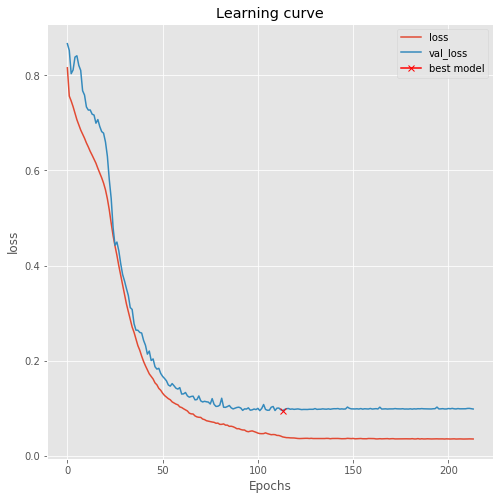

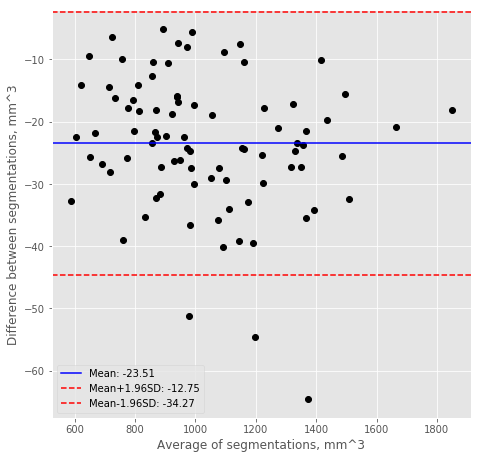


Validation
Voxel classification accuracy:  0.990349713493796
Precision and recall:  (0.9267992947945719, 0.8978110435956446)
Dice score:  0.9150674921744626
Jaccard score:  0.8434329276506202
Volume difference (mean absolute, mean):  (80.15423757188461, 30.537623482591965)
Centroid distance:  0.9703772726806645
Hausdorff distance:  0.6493297047231946
Surface Dice score:  0.9865140683723477
Added path length:  1967.5882352941176
Detection rate (per patient, per slice):  (1.0, 1.0)


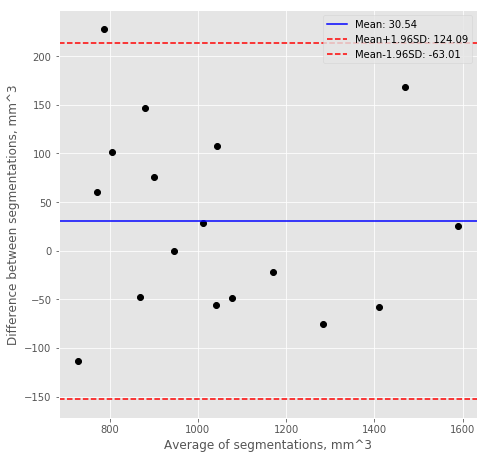


Test
Voxel classification accuracy:  0.9893325169881185
Precision and recall:  (0.8961817264728026, 0.9272696374756791)
Dice score:  0.910675213083684
Jaccard score:  0.8360001172928803
Volume difference (mean absolute, mean):  (63.65797439714273, -31.35667311648528)
Centroid distance:  1.061353360143257
Hausdorff distance:  0.5276648394397971
Surface Dice score:  0.9892480736182105
Added path length:  2036.1666666666667
Detection rate (per patient, per slice):  (1.0, 0.9947916666666666)


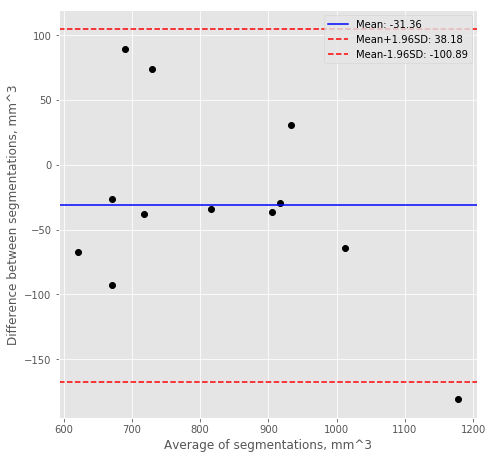

In [285]:
preds_train_lumen_dice,preds_valid_lumen_dice,preds_test_lumen_dice = train_evaluate_model('model_vessel-seg-3d_lumen.h5',
                                                                                           dice_loss,
                                                                                           X_train_lumen,
                                                                                           y_train_lumen, 
                                                                                           X_valid_lumen, 
                                                                                           y_valid_lumen,
                                                                                           X_test_lumen, 
                                                                                           y_test_lumen,
                                                                                           spacings_train_lumen, 
                                                                                           spacings_valid_lumen, 
                                                                                           spacings_test_lumen)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


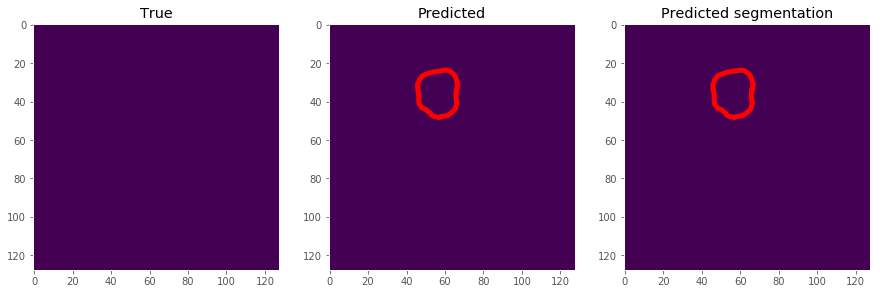

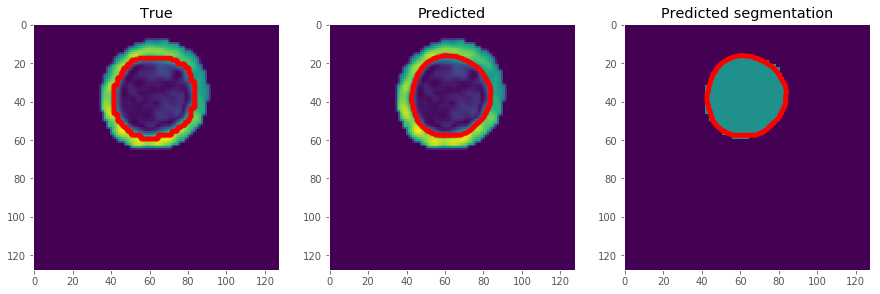

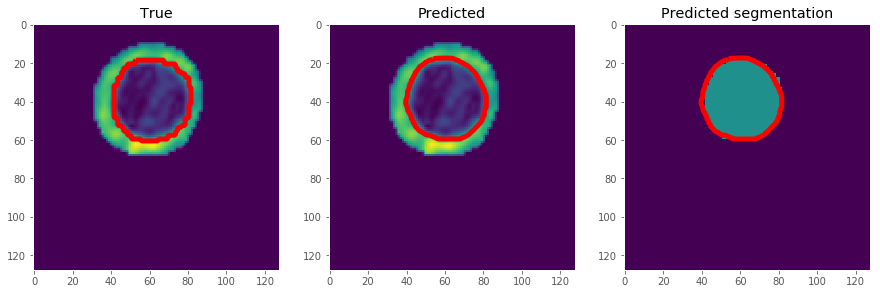

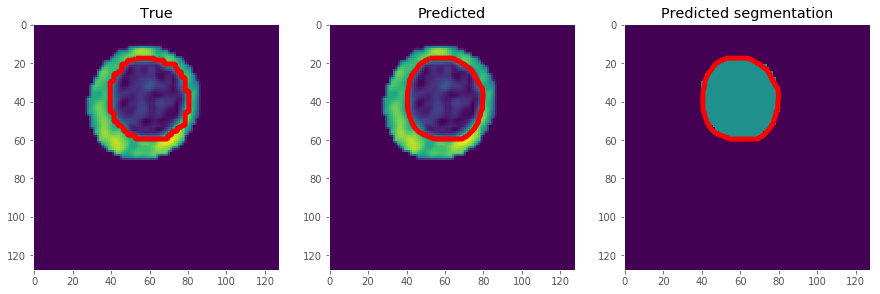

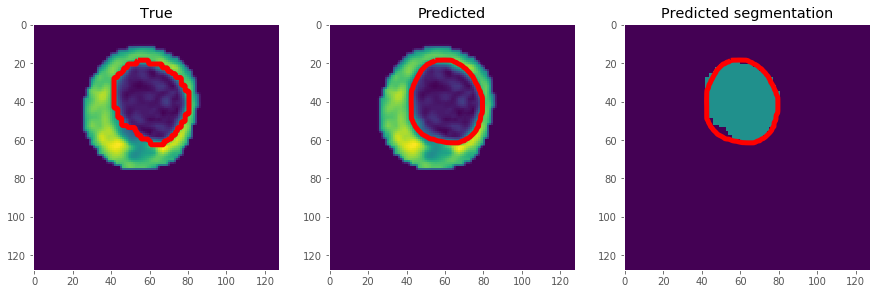

...

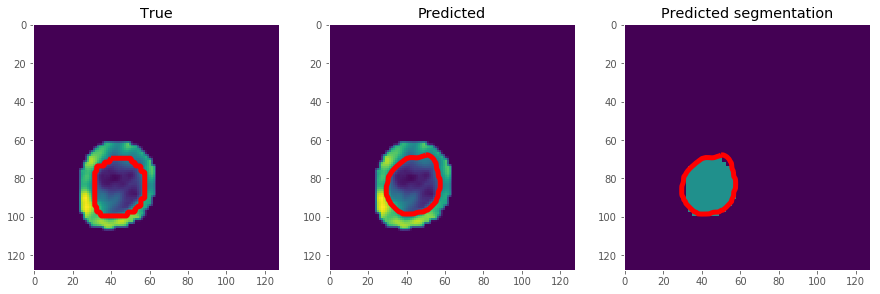

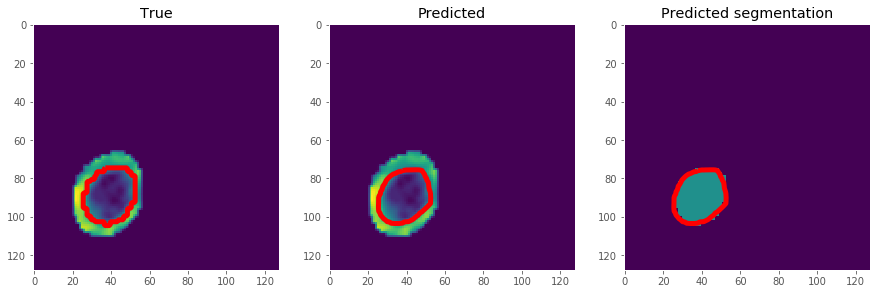

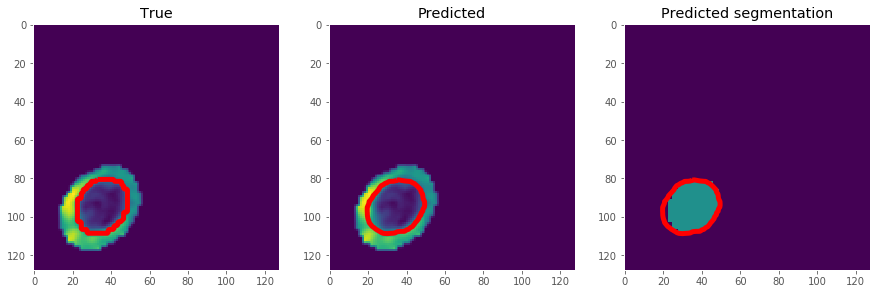

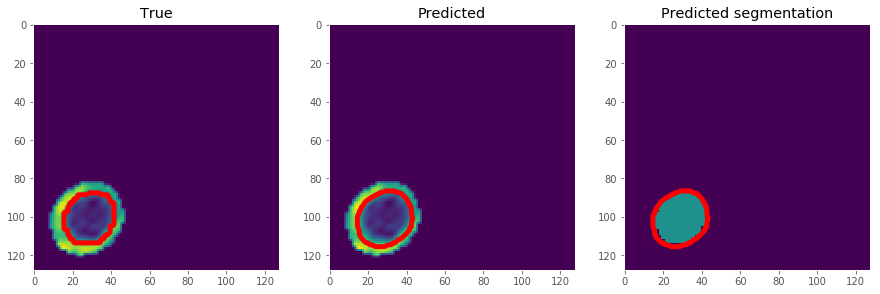

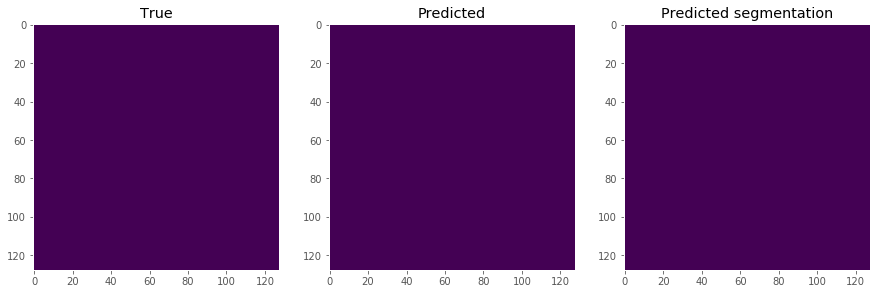

In [286]:
show_seg_slices(0, X_test_lumen, y_test_lumen, preds_test_lumen_dice)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_24"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_457 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_433 (BatchN (None, 16, 128, 128, 64          conv3d_457[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9855 - acc: 0.7258 - dice_coef: 0.0145
Epoch 00001: val_loss improved from inf to 0.99134, saving model to model_vessel-seg-3d_lipid.h5
86/86 [==============================] - 96s 1s/sample - loss: 0.9851 - acc: 0.7299 - dice_coef: 0.0154 - val_loss: 0.9913 - val_acc: 0.2747 - val_dice_coef: 0.0046
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9808 - acc: 0.8033 - dice_coef: 0.0192
Epoch 00002: val_loss improved from 0.99134 to 0.99127, saving model to model_vessel-seg-3d_lipid.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.9805 - acc: 0.8034 - dice_coef: 0.0199 - val_loss: 0.9913 - val_acc: 0.3481 - val_dice_coef: 0.0284
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9783 - acc: 0.8101 - dice_coef: 0.0217
Epoch 00003: val_loss improved from 0.99127 to 0.98958, saving model to model_vessel-seg-3d_lipid

Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9621 - acc: 0.9517 - dice_coef: 0.0379
Epoch 00024: val_loss improved from 0.97674 to 0.97456, saving model to model_vessel-seg-3d_lipid.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.9606 - acc: 0.9519 - dice_coef: 0.0413 - val_loss: 0.9746 - val_acc: 0.9186 - val_dice_coef: 0.0135
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9603 - acc: 0.9592 - dice_coef: 0.0397
Epoch 00025: val_loss improved from 0.97456 to 0.97360, saving model to model_vessel-seg-3d_lipid.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.9601 - acc: 0.9597 - dice_coef: 0.0401 - val_loss: 0.9736 - val_acc: 0.9289 - val_dice_coef: 0.0140
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9586 - acc: 0.9551 - dice_coef: 0.0414
Epoch 00026: val_loss improved from 0.97360 to 0.97318, saving model to model_vessel-seg-3d_lipid.h5
86/86 [=========================

Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9560 - acc: 0.9690 - dice_coef: 0.0440
Epoch 00048: val_loss did not improve from 0.97245
86/86 [==============================] - 3s 36ms/sample - loss: 0.9563 - acc: 0.9691 - dice_coef: 0.0434 - val_loss: 0.9736 - val_acc: 0.9858 - val_dice_coef: 0.0422
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9567 - acc: 0.9673 - dice_coef: 0.0433
Epoch 00049: ReduceLROnPlateau reducing learning rate to 1e-05.

Epoch 00049: val_loss did not improve from 0.97245
86/86 [==============================] - 3s 36ms/sample - loss: 0.9567 - acc: 0.9674 - dice_coef: 0.0433 - val_loss: 0.9731 - val_acc: 0.9845 - val_dice_coef: 0.0143
Epoch 50/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9554 - acc: 0.9673 - dice_coef: 0.0446
Epoch 00050: val_loss improved from 0.97245 to 0.97231, saving model to model_vessel-seg-3d_lipid.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.9

Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9591 - acc: 0.9692 - dice_coef: 0.0409
Epoch 00072: val_loss did not improve from 0.97108
86/86 [==============================] - 3s 36ms/sample - loss: 0.9556 - acc: 0.9700 - dice_coef: 0.0493 - val_loss: 0.9711 - val_acc: 0.9819 - val_dice_coef: 0.0461
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9554 - acc: 0.9699 - dice_coef: 0.0446
Epoch 00073: val_loss did not improve from 0.97108
86/86 [==============================] - 3s 36ms/sample - loss: 0.9560 - acc: 0.9702 - dice_coef: 0.0431 - val_loss: 0.9713 - val_acc: 0.9818 - val_dice_coef: 0.0171
Epoch 74/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9558 - acc: 0.9696 - dice_coef: 0.0442
Epoch 00074: val_loss did not improve from 0.97108
86/86 [==============================] - 3s 36ms/sample - loss: 0.9560 - acc: 0.9693 - dice_coef: 0.0436 - val_loss: 0.9713 - val_acc: 0.9812 - val_dice_coef: 0.0782
Epoch 75/250
80/

Epoch 96/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9531 - acc: 0.9731 - dice_coef: 0.0469
Epoch 00096: val_loss did not improve from 0.96940
86/86 [==============================] - 3s 36ms/sample - loss: 0.9549 - acc: 0.9729 - dice_coef: 0.0427 - val_loss: 0.9708 - val_acc: 0.9835 - val_dice_coef: 0.0465
Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9546 - acc: 0.9730 - dice_coef: 0.0454
Epoch 00097: val_loss did not improve from 0.96940
86/86 [==============================] - 3s 36ms/sample - loss: 0.9553 - acc: 0.9731 - dice_coef: 0.0439 - val_loss: 0.9705 - val_acc: 0.9824 - val_dice_coef: 0.0202
Epoch 98/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9533 - acc: 0.9730 - dice_coef: 0.0467
Epoch 00098: val_loss did not improve from 0.96940
86/86 [==============================] - 3s 36ms/sample - loss: 0.9547 - acc: 0.9731 - dice_coef: 0.0434 - val_loss: 0.9708 - val_acc: 0.9812 - val_dice_coef: 0.0797
Epoch 99/250
80/

80/86 [==========================>...] - ETA: 0s - loss: 0.9518 - acc: 0.9730 - dice_coef: 0.0482
Epoch 00120: val_loss did not improve from 0.96826
86/86 [==============================] - 3s 36ms/sample - loss: 0.9547 - acc: 0.9722 - dice_coef: 0.0414 - val_loss: 0.9688 - val_acc: 0.9767 - val_dice_coef: 0.0166
Epoch 121/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9522 - acc: 0.9731 - dice_coef: 0.0478
Epoch 00121: val_loss did not improve from 0.96826
86/86 [==============================] - 3s 36ms/sample - loss: 0.9544 - acc: 0.9723 - dice_coef: 0.0425 - val_loss: 0.9690 - val_acc: 0.9778 - val_dice_coef: 0.0165
Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9536 - acc: 0.9721 - dice_coef: 0.0464
Epoch 00122: val_loss did not improve from 0.96826
86/86 [==============================] - 3s 36ms/sample - loss: 0.9547 - acc: 0.9726 - dice_coef: 0.0437 - val_loss: 0.9697 - val_acc: 0.9802 - val_dice_coef: 0.0424
Epoch 123/250
80/86 [======

Epoch 145/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9527 - acc: 0.9740 - dice_coef: 0.0473
Epoch 00145: val_loss did not improve from 0.96764
86/86 [==============================] - 3s 36ms/sample - loss: 0.9541 - acc: 0.9740 - dice_coef: 0.0440 - val_loss: 0.9699 - val_acc: 0.9816 - val_dice_coef: 0.0424
Epoch 146/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9553 - acc: 0.9741 - dice_coef: 0.0447
Epoch 00146: val_loss did not improve from 0.96764
86/86 [==============================] - 3s 36ms/sample - loss: 0.9538 - acc: 0.9737 - dice_coef: 0.0482 - val_loss: 0.9692 - val_acc: 0.9797 - val_dice_coef: 0.0215
Epoch 147/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9523 - acc: 0.9743 - dice_coef: 0.0477
Epoch 00147: val_loss did not improve from 0.96764
86/86 [==============================] - 3s 36ms/sample - loss: 0.9538 - acc: 0.9736 - dice_coef: 0.0441 - val_loss: 0.9689 - val_acc: 0.9786 - val_dice_coef: 0.0437
Epoch 148/250

Epoch 170/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9547 - acc: 0.9737 - dice_coef: 0.0453
Epoch 00170: val_loss did not improve from 0.96764
86/86 [==============================] - 3s 36ms/sample - loss: 0.9533 - acc: 0.9734 - dice_coef: 0.0486 - val_loss: 0.9677 - val_acc: 0.9753 - val_dice_coef: 0.0172
Epoch 171/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9502 - acc: 0.9743 - dice_coef: 0.0498
Epoch 00171: val_loss did not improve from 0.96764
86/86 [==============================] - 3s 36ms/sample - loss: 0.9531 - acc: 0.9742 - dice_coef: 0.0429 - val_loss: 0.9685 - val_acc: 0.9795 - val_dice_coef: 0.0500
Epoch 172/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9540 - acc: 0.9746 - dice_coef: 0.0460
Epoch 00172: val_loss did not improve from 0.96764
86/86 [==============================] - 3s 36ms/sample - loss: 0.9535 - acc: 0.9746 - dice_coef: 0.0472 - val_loss: 0.9693 - val_acc: 0.9820 - val_dice_coef: 0.0421
Epoch 173/250

Epoch 195/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9499 - acc: 0.9764 - dice_coef: 0.0501
Epoch 00195: val_loss did not improve from 0.96756
86/86 [==============================] - 3s 36ms/sample - loss: 0.9525 - acc: 0.9764 - dice_coef: 0.0439 - val_loss: 0.9699 - val_acc: 0.9828 - val_dice_coef: 0.0484
Epoch 196/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9499 - acc: 0.9760 - dice_coef: 0.0501
Epoch 00196: val_loss did not improve from 0.96756
86/86 [==============================] - 3s 36ms/sample - loss: 0.9527 - acc: 0.9762 - dice_coef: 0.0434 - val_loss: 0.9692 - val_acc: 0.9812 - val_dice_coef: 0.0494
Epoch 197/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9571 - acc: 0.9762 - dice_coef: 0.0429
Epoch 00197: val_loss did not improve from 0.96756
86/86 [==============================] - 3s 36ms/sample - loss: 0.9528 - acc: 0.9759 - dice_coef: 0.0533 - val_loss: 0.9679 - val_acc: 0.9779 - val_dice_coef: 0.0460
Epoch 198/250

Epoch 220/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9508 - acc: 0.9764 - dice_coef: 0.0492
Epoch 00220: val_loss did not improve from 0.96756
86/86 [==============================] - 3s 36ms/sample - loss: 0.9520 - acc: 0.9770 - dice_coef: 0.0463 - val_loss: 0.9682 - val_acc: 0.9789 - val_dice_coef: 0.0342
Epoch 221/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9529 - acc: 0.9769 - dice_coef: 0.0471
Epoch 00221: val_loss did not improve from 0.96756
86/86 [==============================] - 3s 36ms/sample - loss: 0.9521 - acc: 0.9767 - dice_coef: 0.0491 - val_loss: 0.9683 - val_acc: 0.9796 - val_dice_coef: 0.0508
Epoch 222/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9523 - acc: 0.9774 - dice_coef: 0.0477
Epoch 00222: val_loss did not improve from 0.96756
86/86 [==============================] - 3s 36ms/sample - loss: 0.9519 - acc: 0.9773 - dice_coef: 0.0486 - val_loss: 0.9678 - val_acc: 0.9773 - val_dice_coef: 0.0226
Epoch 223/250

Epoch 245/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9521 - acc: 0.9785 - dice_coef: 0.0479
Epoch 00245: val_loss did not improve from 0.96680
86/86 [==============================] - 3s 36ms/sample - loss: 0.9514 - acc: 0.9783 - dice_coef: 0.0495 - val_loss: 0.9687 - val_acc: 0.9813 - val_dice_coef: 0.0400
Epoch 246/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9527 - acc: 0.9771 - dice_coef: 0.0473
Epoch 00246: val_loss did not improve from 0.96680
86/86 [==============================] - 3s 36ms/sample - loss: 0.9516 - acc: 0.9766 - dice_coef: 0.0498 - val_loss: 0.9675 - val_acc: 0.9762 - val_dice_coef: 0.0457
Epoch 247/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9515 - acc: 0.9764 - dice_coef: 0.0485
Epoch 00247: val_loss did not improve from 0.96680
86/86 [==============================] - 3s 36ms/sample - loss: 0.9513 - acc: 0.9766 - dice_coef: 0.0491 - val_loss: 0.9688 - val_acc: 0.9792 - val_dice_coef: 0.0846
Epoch 248/250

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.06987196850314917, 0.5853858859831316)
Dice score:  0.2385031061348546
Jaccard score:  0.13539859538318097
Volume difference (mean absolute, mean):  (459.0212061145278, -459.0212061145278)
Centroid distance:  4.057589712058074
Hausdorff distance:  7.819842003618098
Surface Dice score:  0.40831175050513624
Added path length:  754.1046511627907
Detection rate (per patient, per slice):  (0.6046511627906976, 0.5755813953488372)


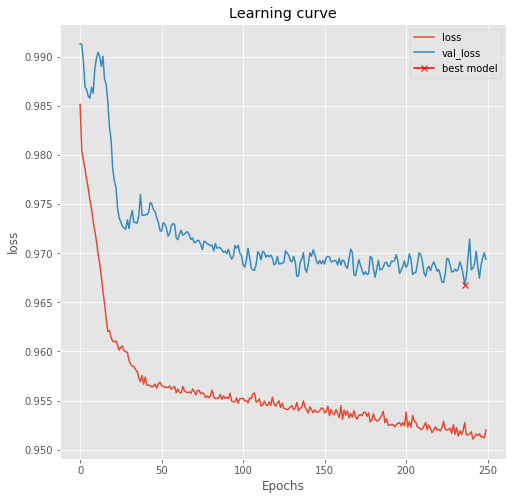

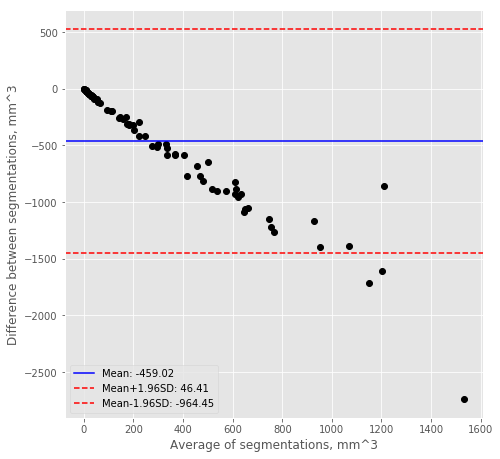


Validation
Voxel classification accuracy:  0.9744947096880745
Precision and recall:  (0.07833510665362953, 0.46039298326406825)
Dice score:  0.17007652092642891
Jaccard score:  0.09294549517197351
Volume difference (mean absolute, mean):  (576.3401347644188, -576.3401347644188)
Centroid distance:  4.80997062675304
Hausdorff distance:  7.8462608250211385
Surface Dice score:  0.48080066948024697
Added path length:  490.7647058823529
Detection rate (per patient, per slice):  (0.5882352941176471, 0.5147058823529411)


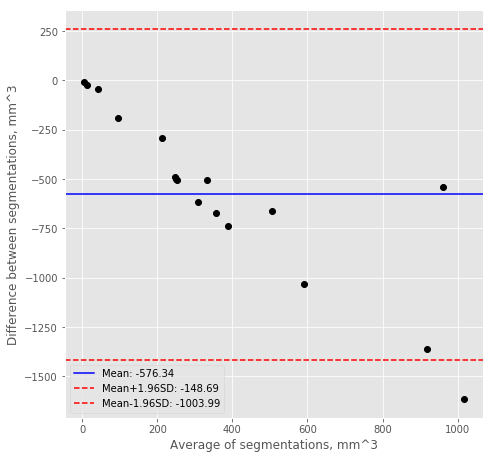


Test
Voxel classification accuracy:  0.9769213994344076
Precision and recall:  (0.060540669005628496, 0.3177249662114782)
Dice score:  0.1845740857219876
Jaccard score:  0.10167541080974064
Volume difference (mean absolute, mean):  (371.13753375411034, -369.2068079560995)
Centroid distance:  4.38129673496857
Hausdorff distance:  10.122456926884393
Surface Dice score:  0.3817609700126741
Added path length:  573.5
Detection rate (per patient, per slice):  (0.5833333333333334, 0.4895833333333333)


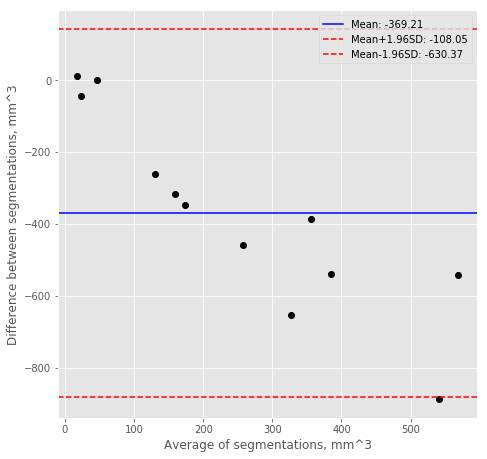

In [287]:
preds_train_lipid_dice,preds_valid_lipid_dice,preds_test_lipid_dice = train_evaluate_model('model_vessel-seg-3d_lipid.h5',
                                                                                           dice_loss, 
                                                                                           X_train_lipid, 
                                                                                           y_train_lipid, 
                                                                                           X_valid_lipid, 
                                                                                           y_valid_lipid, 
                                                                                           X_test_lipid, 
                                                                                           y_test_lipid, 
                                                                                           spacings_train_lipid, 
                                                                                           spacings_valid_lipid, 
                                                                                           spacings_test_lipid)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


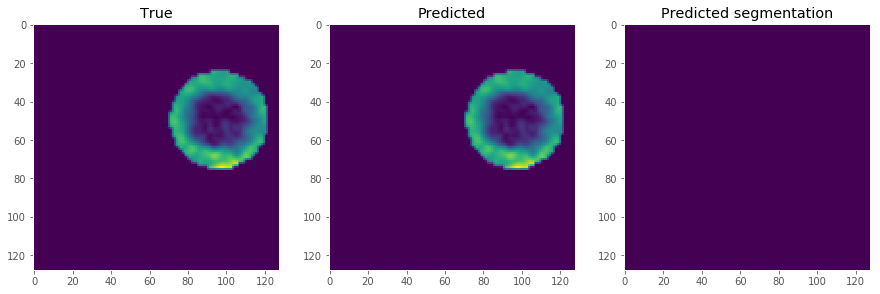

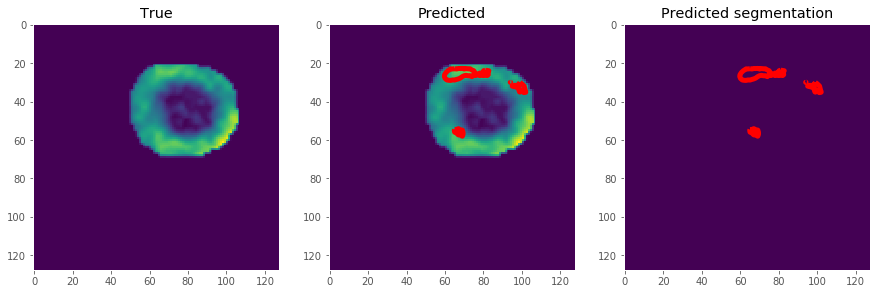

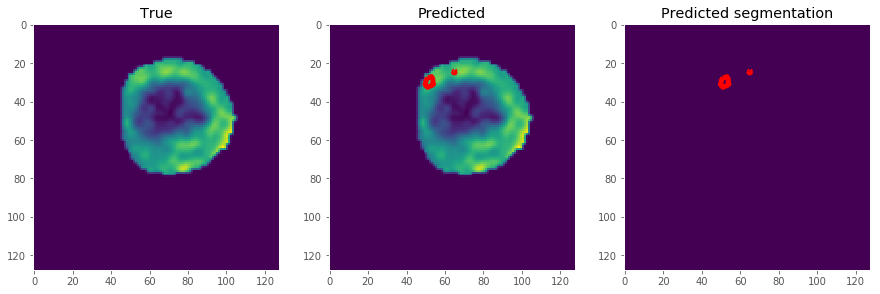

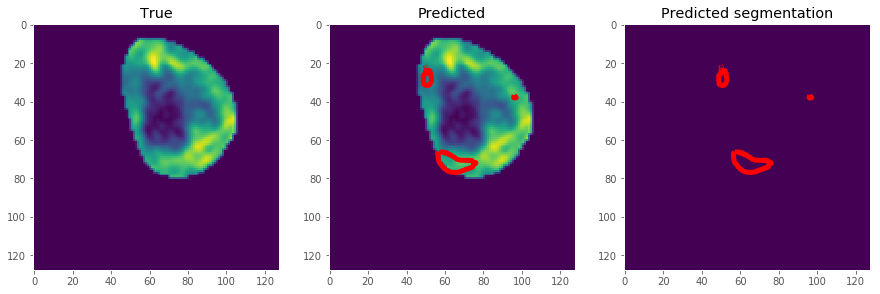

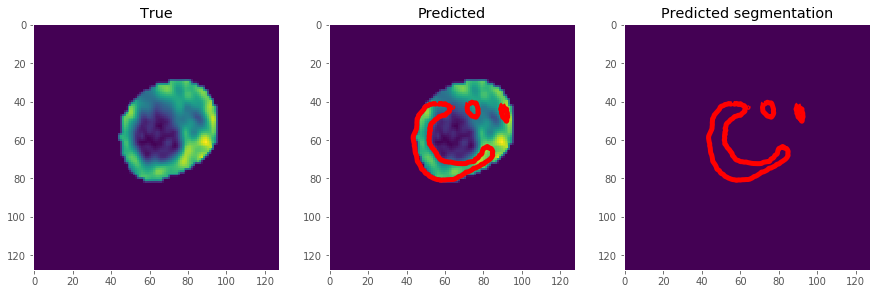

...

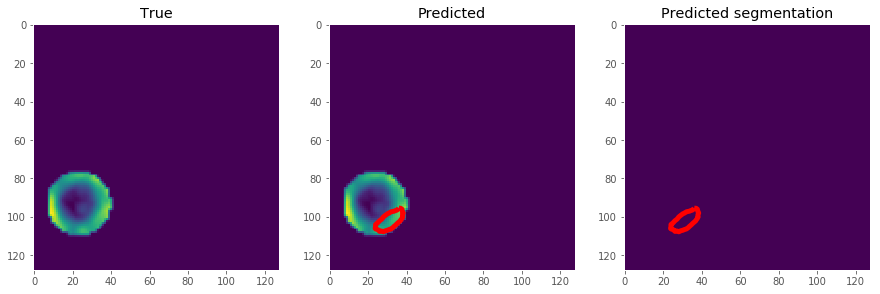

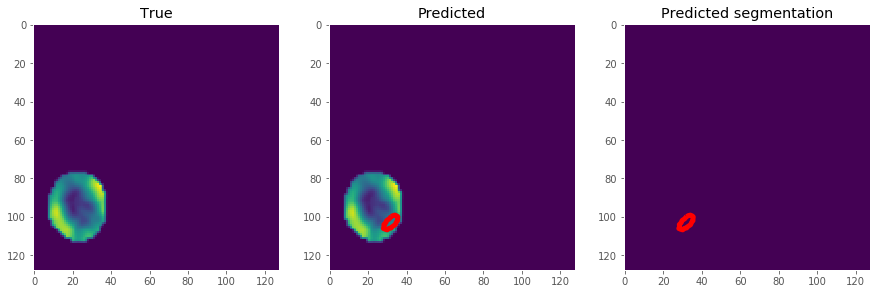

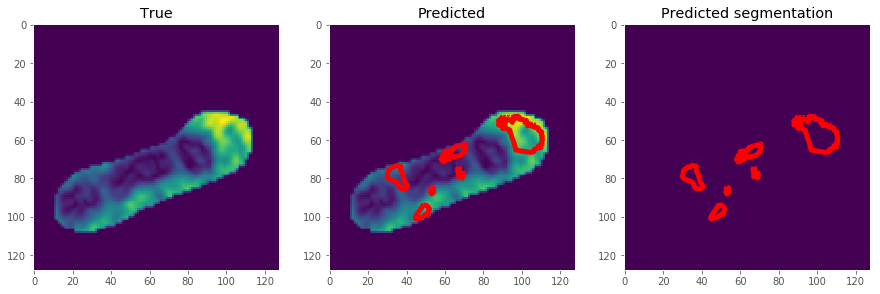

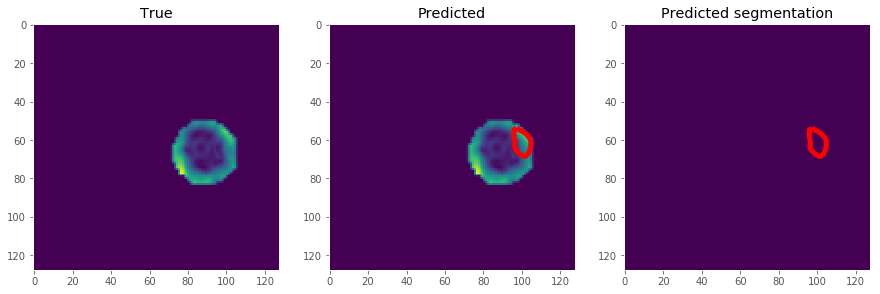

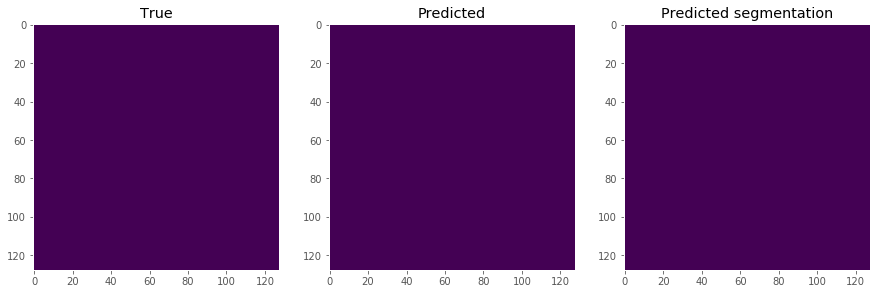

In [288]:
show_seg_slices(0, X_test_lipid, y_test_lipid, preds_test_lipid_dice)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_25"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_476 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_451 (BatchN (None, 16, 128, 128, 64          conv3d_476[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9822 - acc: 0.7241 - dice_coef: 0.0178
Epoch 00001: val_loss improved from inf to 0.98584, saving model to model_vessel-seg-3d_calc.h5
86/86 [==============================] - 102s 1s/sample - loss: 0.9814 - acc: 0.7275 - dice_coef: 0.0196 - val_loss: 0.9858 - val_acc: 0.2689 - val_dice_coef: 0.0138
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9795 - acc: 0.7829 - dice_coef: 0.0205
Epoch 00002: val_loss improved from 0.98584 to 0.98542, saving model to model_vessel-seg-3d_calc.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.9781 - acc: 0.7838 - dice_coef: 0.0239 - val_loss: 0.9854 - val_acc: 0.3823 - val_dice_coef: 0.0097
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9768 - acc: 0.7928 - dice_coef: 0.0232
Epoch 00003: val_loss improved from 0.98542 to 0.98425, saving model to model_vessel-seg-3d_calc.h

86/86 [==============================] - 4s 41ms/sample - loss: 0.9543 - acc: 0.9284 - dice_coef: 0.0460 - val_loss: 0.9573 - val_acc: 0.9588 - val_dice_coef: 0.0795
Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9512 - acc: 0.9235 - dice_coef: 0.0488
Epoch 00024: val_loss did not improve from 0.95732
86/86 [==============================] - 3s 36ms/sample - loss: 0.9526 - acc: 0.9242 - dice_coef: 0.0455 - val_loss: 0.9590 - val_acc: 0.9713 - val_dice_coef: 0.0289
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9514 - acc: 0.9318 - dice_coef: 0.0486
Epoch 00025: val_loss did not improve from 0.95732
86/86 [==============================] - 3s 36ms/sample - loss: 0.9500 - acc: 0.9320 - dice_coef: 0.0518 - val_loss: 0.9688 - val_acc: 0.9873 - val_dice_coef: 0.0471
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9480 - acc: 0.9333 - dice_coef: 0.0520
Epoch 00026: val_loss did not improve from 0.95732
86/86 [=========

Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7432 - acc: 0.9916 - dice_coef: 0.2568
Epoch 00048: val_loss improved from 0.88104 to 0.87472, saving model to model_vessel-seg-3d_calc.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.7424 - acc: 0.9915 - dice_coef: 0.2588 - val_loss: 0.8747 - val_acc: 0.9906 - val_dice_coef: 0.0766
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7300 - acc: 0.9917 - dice_coef: 0.2700
Epoch 00049: val_loss did not improve from 0.87472
86/86 [==============================] - 3s 36ms/sample - loss: 0.7233 - acc: 0.9918 - dice_coef: 0.2859 - val_loss: 0.8970 - val_acc: 0.9915 - val_dice_coef: 0.0939
Epoch 50/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6916 - acc: 0.9917 - dice_coef: 0.3084
Epoch 00050: val_loss did not improve from 0.87472
86/86 [==============================] - 3s 36ms/sample - loss: 0.6997 - acc: 0.9920 - dice_coef: 0.2890 - val_loss: 0.9628 - val_acc

Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4606 - acc: 0.9958 - dice_coef: 0.5394
Epoch 00072: val_loss did not improve from 0.72525
86/86 [==============================] - 3s 36ms/sample - loss: 0.4567 - acc: 0.9958 - dice_coef: 0.5488 - val_loss: 0.7313 - val_acc: 0.9945 - val_dice_coef: 0.1548
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4442 - acc: 0.9959 - dice_coef: 0.5558
Epoch 00073: val_loss did not improve from 0.72525
86/86 [==============================] - 3s 36ms/sample - loss: 0.4478 - acc: 0.9960 - dice_coef: 0.5474 - val_loss: 0.7630 - val_acc: 0.9950 - val_dice_coef: 0.1295
Epoch 74/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4393 - acc: 0.9963 - dice_coef: 0.5607
Epoch 00074: val_loss improved from 0.72525 to 0.68782, saving model to model_vessel-seg-3d_calc.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.4446 - acc: 0.9963 - dice_coef: 0.5479 - val_loss: 0.6878 - val_acc

80/86 [==========================>...] - ETA: 0s - loss: 0.3426 - acc: 0.9971 - dice_coef: 0.6574
Epoch 00096: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3461 - acc: 0.9971 - dice_coef: 0.6491 - val_loss: 0.7714 - val_acc: 0.9948 - val_dice_coef: 0.1762
Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3479 - acc: 0.9971 - dice_coef: 0.6521
Epoch 00097: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3440 - acc: 0.9971 - dice_coef: 0.6614 - val_loss: 0.7728 - val_acc: 0.9948 - val_dice_coef: 0.2423
Epoch 98/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3449 - acc: 0.9971 - dice_coef: 0.6551
Epoch 00098: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3456 - acc: 0.9971 - dice_coef: 0.6535 - val_loss: 0.7820 - val_acc: 0.9948 - val_dice_coef: 0.1197
Epoch 99/250
80/86 [=========

Epoch 121/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3351 - acc: 0.9971 - dice_coef: 0.6649
Epoch 00121: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3403 - acc: 0.9972 - dice_coef: 0.6525 - val_loss: 0.7803 - val_acc: 0.9948 - val_dice_coef: 0.1177
Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3420 - acc: 0.9973 - dice_coef: 0.6580
Epoch 00122: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3428 - acc: 0.9971 - dice_coef: 0.6560 - val_loss: 0.7856 - val_acc: 0.9948 - val_dice_coef: 0.1170
Epoch 123/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3362 - acc: 0.9971 - dice_coef: 0.6638
Epoch 00123: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3345 - acc: 0.9972 - dice_coef: 0.6679 - val_loss: 0.7741 - val_acc: 0.9948 - val_dice_coef: 0.2373
Epoch 124/250

Epoch 146/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3425 - acc: 0.9971 - dice_coef: 0.6575
Epoch 00146: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3449 - acc: 0.9971 - dice_coef: 0.6517 - val_loss: 0.7799 - val_acc: 0.9948 - val_dice_coef: 0.1801
Epoch 147/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3377 - acc: 0.9972 - dice_coef: 0.6623
Epoch 00147: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3362 - acc: 0.9972 - dice_coef: 0.6660 - val_loss: 0.7866 - val_acc: 0.9948 - val_dice_coef: 0.1163
Epoch 148/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3377 - acc: 0.9972 - dice_coef: 0.6623
Epoch 00148: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3362 - acc: 0.9972 - dice_coef: 0.6660 - val_loss: 0.7751 - val_acc: 0.9948 - val_dice_coef: 0.2145
Epoch 149/250

Epoch 171/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3236 - acc: 0.9972 - dice_coef: 0.6764
Epoch 00171: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3314 - acc: 0.9972 - dice_coef: 0.6578 - val_loss: 0.7776 - val_acc: 0.9948 - val_dice_coef: 0.2070
Epoch 172/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3349 - acc: 0.9973 - dice_coef: 0.6651
Epoch 00172: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3360 - acc: 0.9972 - dice_coef: 0.6623 - val_loss: 0.8102 - val_acc: 0.9948 - val_dice_coef: 0.3406
Epoch 173/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3280 - acc: 0.9972 - dice_coef: 0.6720
Epoch 00173: val_loss did not improve from 0.68782
86/86 [==============================] - 3s 36ms/sample - loss: 0.3296 - acc: 0.9972 - dice_coef: 0.6681 - val_loss: 0.7893 - val_acc: 0.9948 - val_dice_coef: 0.1148
Epoch 174/250

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.4167277228092152, 0.5656184901830593)
Dice score:  0.5617304557861872
Jaccard score:  0.3905615964784847
Volume difference (mean absolute, mean):  (33.020498785861705, -26.749420988005262)
Centroid distance:  3.6124699093793238
Hausdorff distance:  5.238100121520483
Surface Dice score:  0.7661581598923112
Added path length:  508.9651162790698
Detection rate (per patient, per slice):  (0.9418604651162791, 0.8459302325581395)


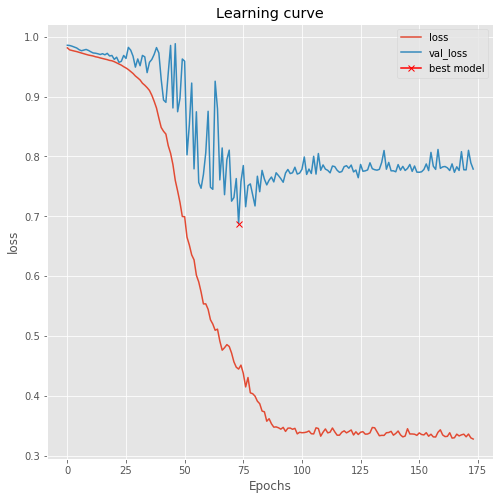

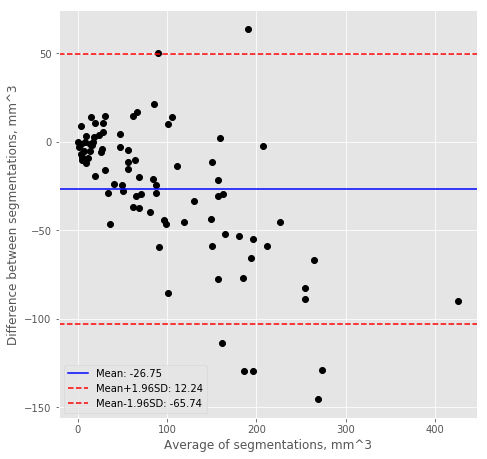


Validation
Voxel classification accuracy:  0.9935688691980699
Precision and recall:  (0.2867814843945635, 0.21266078890342974)
Dice score:  0.33501937399939674
Jaccard score:  0.20122630992196208
Volume difference (mean absolute, mean):  (43.47263860351899, 21.402955223532285)
Centroid distance:  4.3612476555116
Hausdorff distance:  6.009521556171189
Surface Dice score:  0.4827851484561612
Added path length:  994.1176470588235
Detection rate (per patient, per slice):  (0.9411764705882353, 0.7205882352941176)


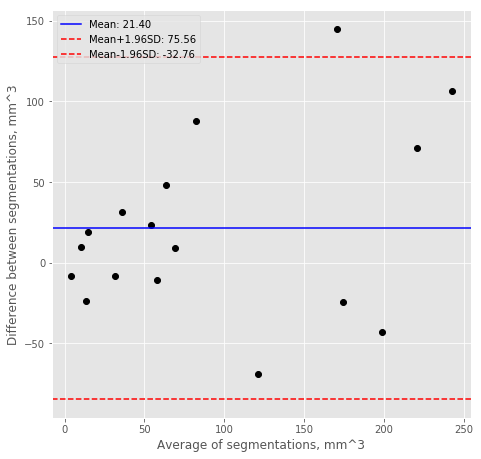


Test
Voxel classification accuracy:  0.9932438532511393
Precision and recall:  (0.26111136216519915, 0.267909205916448)
Dice score:  0.2896249749314794
Jaccard score:  0.16935042601422653
Volume difference (mean absolute, mean):  (57.441695441802345, -20.843603506684303)
Centroid distance:  3.4744525126210832
Hausdorff distance:  6.564058676620459
Surface Dice score:  0.6001929443362323
Added path length:  732.3333333333334
Detection rate (per patient, per slice):  (0.9166666666666666, 0.75)


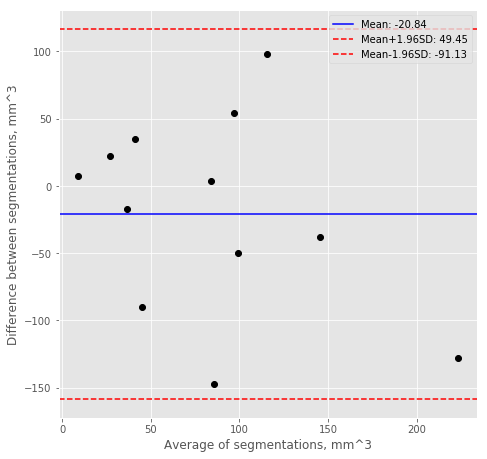

In [289]:
preds_train_calc_dice,preds_valid_calc_dice,preds_test_calc_dice = train_evaluate_model('model_vessel-seg-3d_calc.h5',
                                                                                        dice_loss,
                                                                                        X_train_calc, 
                                                                                        y_train_calc, 
                                                                                        X_valid_calc,
                                                                                        y_valid_calc, 
                                                                                        X_test_calc,
                                                                                        y_test_calc,
                                                                                        spacings_train_calc, 
                                                                                        spacings_valid_calc, 
                                                                                        spacings_test_calc)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


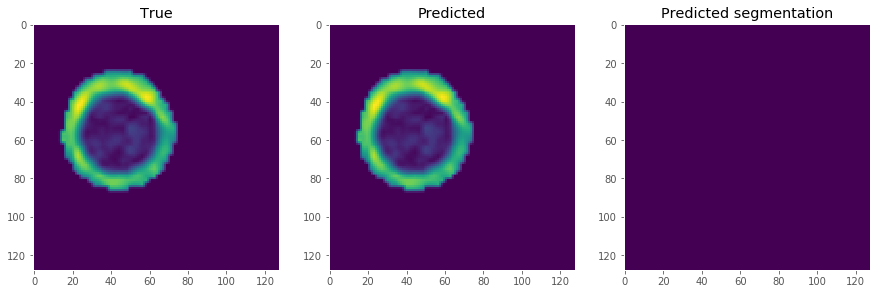

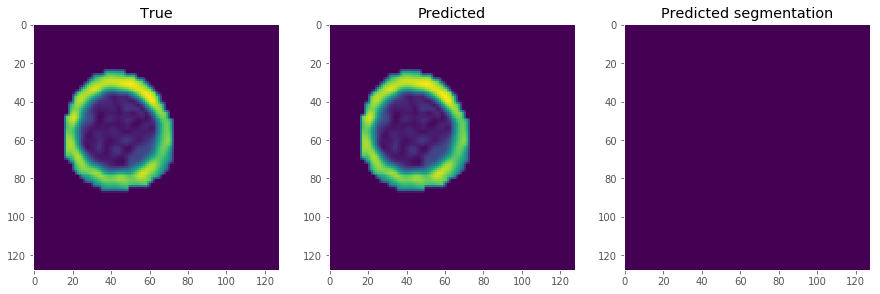

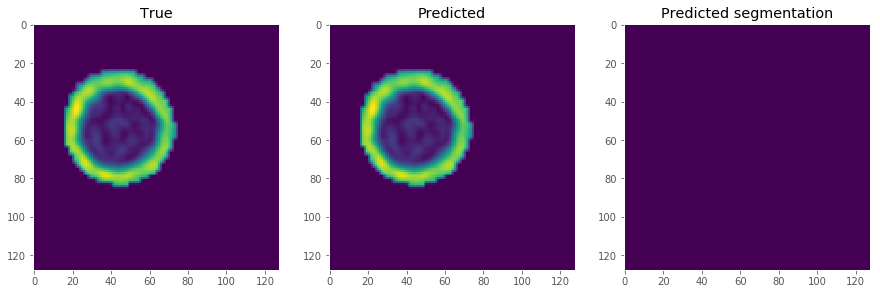

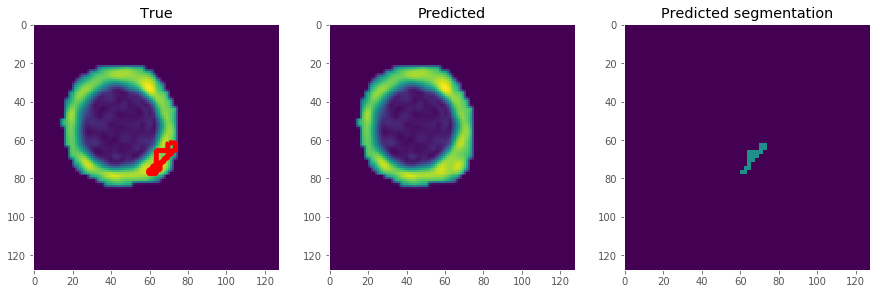

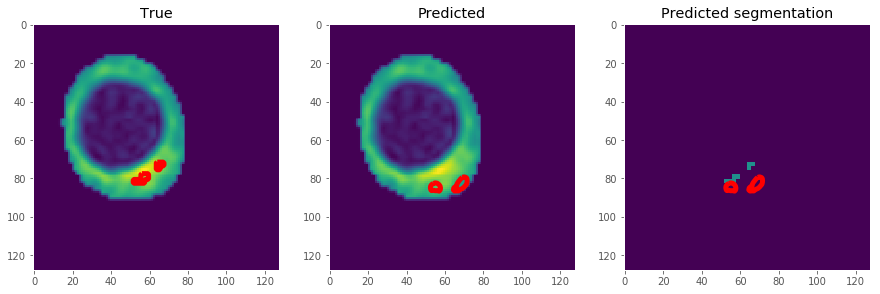

...

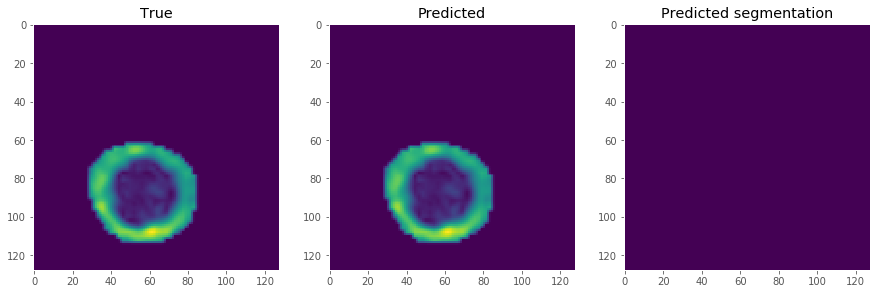

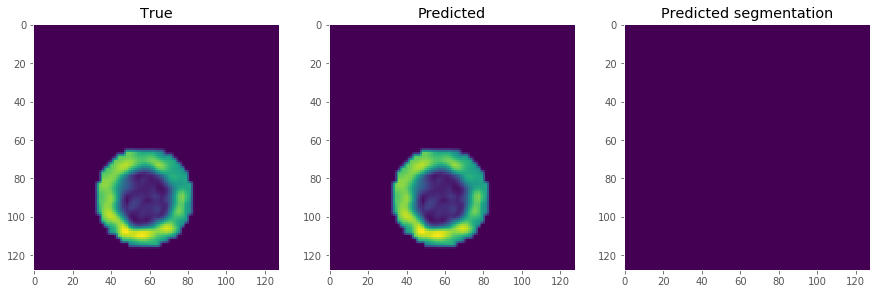

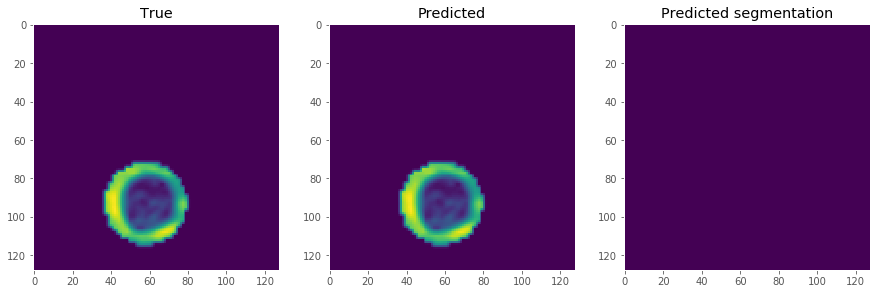

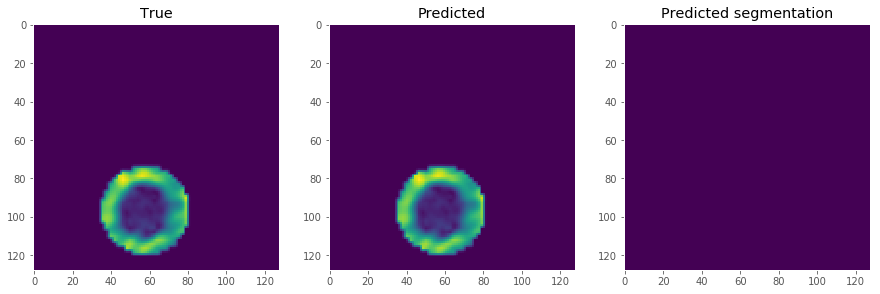

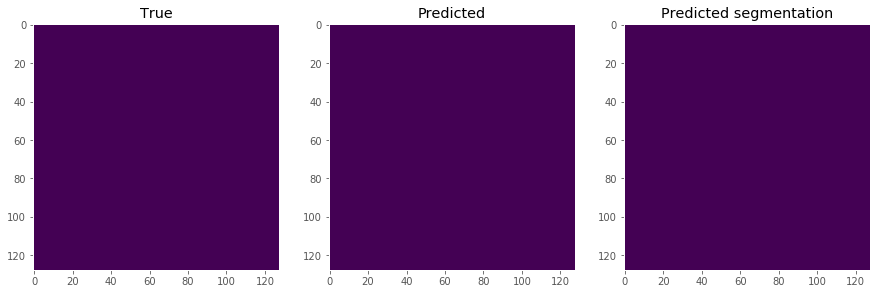

In [290]:
show_seg_slices(0, X_test_calc, y_test_calc, preds_test_calc_dice)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_26"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_495 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_469 (BatchN (None, 16, 128, 128, 64          conv3d_495[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 14 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9870 - acc: 0.6428 - dice_coef: 0.0130
Epoch 00001: val_loss improved from inf to 0.98404, saving model to model_vessel-seg-3d_iph.h5
86/86 [==============================] - 111s 1s/sample - loss: 0.9876 - acc: 0.6495 - dice_coef: 0.0115 - val_loss: 0.9840 - val_acc: 0.2335 - val_dice_coef: 0.0160
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9820 - acc: 0.7857 - dice_coef: 0.0180
Epoch 00002: val_loss did not improve from 0.98404
86/86 [==============================] - 3s 35ms/sample - loss: 0.9827 - acc: 0.7854 - dice_coef: 0.0164 - val_loss: 0.9845 - val_acc: 0.2815 - val_dice_coef: 0.0155
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9810 - acc: 0.8049 - dice_coef: 0.0190
Epoch 00003: val_loss improved from 0.98404 to 0.98354, saving model to model_vessel-seg-3d_iph.h5
86/86 [==============================] - 4s 42ms/

80/86 [==========================>...] - ETA: 0s - loss: 0.9635 - acc: 0.9768 - dice_coef: 0.0365
Epoch 00024: val_loss improved from 0.96411 to 0.95970, saving model to model_vessel-seg-3d_iph.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.9644 - acc: 0.9764 - dice_coef: 0.0342 - val_loss: 0.9597 - val_acc: 0.8418 - val_dice_coef: 0.0403
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9658 - acc: 0.9772 - dice_coef: 0.0342
Epoch 00025: val_loss improved from 0.95970 to 0.95616, saving model to model_vessel-seg-3d_iph.h5
86/86 [==============================] - 3s 39ms/sample - loss: 0.9644 - acc: 0.9774 - dice_coef: 0.0376 - val_loss: 0.9562 - val_acc: 0.8727 - val_dice_coef: 0.0438
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9652 - acc: 0.9736 - dice_coef: 0.0348
Epoch 00026: val_loss improved from 0.95616 to 0.95549, saving model to model_vessel-seg-3d_iph.h5
86/86 [==============================] - 3s 40ms/sa

Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9592 - acc: 0.9864 - dice_coef: 0.0408
Epoch 00047: val_loss did not improve from 0.94190
86/86 [==============================] - 3s 35ms/sample - loss: 0.9608 - acc: 0.9864 - dice_coef: 0.0369 - val_loss: 0.9425 - val_acc: 0.9785 - val_dice_coef: 0.0575
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9613 - acc: 0.9865 - dice_coef: 0.0387
Epoch 00048: val_loss improved from 0.94190 to 0.94173, saving model to model_vessel-seg-3d_iph.h5
86/86 [==============================] - 3s 38ms/sample - loss: 0.9607 - acc: 0.9857 - dice_coef: 0.0402 - val_loss: 0.9417 - val_acc: 0.9718 - val_dice_coef: 0.0583
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9620 - acc: 0.9841 - dice_coef: 0.0380
Epoch 00049: val_loss improved from 0.94173 to 0.94126, saving model to model_vessel-seg-3d_iph.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.9606 - acc: 0.9841 -

80/86 [==========================>...] - ETA: 0s - loss: 0.9631 - acc: 0.9838 - dice_coef: 0.0369
Epoch 00071: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9578 - acc: 0.9842 - dice_coef: 0.0496 - val_loss: 0.9381 - val_acc: 0.9744 - val_dice_coef: 0.0619
Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9562 - acc: 0.9863 - dice_coef: 0.0438
Epoch 00072: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9565 - acc: 0.9866 - dice_coef: 0.0431 - val_loss: 0.9403 - val_acc: 0.9818 - val_dice_coef: 0.0597
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9602 - acc: 0.9874 - dice_coef: 0.0398
Epoch 00073: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9563 - acc: 0.9873 - dice_coef: 0.0490 - val_loss: 0.9416 - val_acc: 0.9866 - val_dice_coef: 0.0584
Epoch 74/250
80/86 [=========

Epoch 96/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9514 - acc: 0.9903 - dice_coef: 0.0486
Epoch 00096: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9540 - acc: 0.9897 - dice_coef: 0.0425 - val_loss: 0.9388 - val_acc: 0.9874 - val_dice_coef: 0.0612
Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9525 - acc: 0.9908 - dice_coef: 0.0475
Epoch 00097: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9540 - acc: 0.9904 - dice_coef: 0.0438 - val_loss: 0.9385 - val_acc: 0.9875 - val_dice_coef: 0.0615
Epoch 98/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9499 - acc: 0.9907 - dice_coef: 0.0501
Epoch 00098: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9532 - acc: 0.9895 - dice_coef: 0.0421 - val_loss: 0.9386 - val_acc: 0.9880 - val_dice_coef: 0.0614
Epoch 99/250
80/

Epoch 121/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9491 - acc: 0.9911 - dice_coef: 0.0509
Epoch 00121: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9527 - acc: 0.9884 - dice_coef: 0.0424 - val_loss: 0.9385 - val_acc: 0.9886 - val_dice_coef: 0.0615
Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9524 - acc: 0.9909 - dice_coef: 0.0476
Epoch 00122: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9525 - acc: 0.9907 - dice_coef: 0.0473 - val_loss: 0.9386 - val_acc: 0.9888 - val_dice_coef: 0.0614
Epoch 123/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9515 - acc: 0.9892 - dice_coef: 0.0485
Epoch 00123: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9529 - acc: 0.9892 - dice_coef: 0.0451 - val_loss: 0.9385 - val_acc: 0.9887 - val_dice_coef: 0.0615
Epoch 124/250

Epoch 146/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9524 - acc: 0.9917 - dice_coef: 0.0476
Epoch 00146: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9518 - acc: 0.9916 - dice_coef: 0.0491 - val_loss: 0.9392 - val_acc: 0.9901 - val_dice_coef: 0.0608
Epoch 147/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9507 - acc: 0.9919 - dice_coef: 0.0493
Epoch 00147: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9516 - acc: 0.9920 - dice_coef: 0.0471 - val_loss: 0.9400 - val_acc: 0.9906 - val_dice_coef: 0.0600
Epoch 148/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9491 - acc: 0.9923 - dice_coef: 0.0509
Epoch 00148: val_loss did not improve from 0.93742
86/86 [==============================] - 3s 35ms/sample - loss: 0.9516 - acc: 0.9922 - dice_coef: 0.0449 - val_loss: 0.9400 - val_acc: 0.9906 - val_dice_coef: 0.0600
Epoch 149/250

Epoch 171/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9520 - acc: 0.9926 - dice_coef: 0.0480
Epoch 00171: val_loss did not improve from 0.93691
86/86 [==============================] - 3s 35ms/sample - loss: 0.9506 - acc: 0.9922 - dice_coef: 0.0512 - val_loss: 0.9393 - val_acc: 0.9915 - val_dice_coef: 0.0607
Epoch 172/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9497 - acc: 0.9913 - dice_coef: 0.0503
Epoch 00172: val_loss did not improve from 0.93691
86/86 [==============================] - 3s 35ms/sample - loss: 0.9508 - acc: 0.9916 - dice_coef: 0.0476 - val_loss: 0.9402 - val_acc: 0.9917 - val_dice_coef: 0.0598
Epoch 173/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9478 - acc: 0.9927 - dice_coef: 0.0522
Epoch 00173: val_loss did not improve from 0.93691
86/86 [==============================] - 3s 35ms/sample - loss: 0.9506 - acc: 0.9919 - dice_coef: 0.0455 - val_loss: 0.9389 - val_acc: 0.9910 - val_dice_coef: 0.0611
Epoch 174/250

Epoch 196/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9570 - acc: 0.9920 - dice_coef: 0.0430
Epoch 00196: val_loss did not improve from 0.93644
86/86 [==============================] - 3s 35ms/sample - loss: 0.9488 - acc: 0.9921 - dice_coef: 0.0626 - val_loss: 0.9408 - val_acc: 0.9917 - val_dice_coef: 0.0592
Epoch 197/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9484 - acc: 0.9923 - dice_coef: 0.0516
Epoch 00197: val_loss did not improve from 0.93644
86/86 [==============================] - 3s 35ms/sample - loss: 0.9480 - acc: 0.9922 - dice_coef: 0.0526 - val_loss: 0.9415 - val_acc: 0.9905 - val_dice_coef: 0.0585
Epoch 198/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9438 - acc: 0.9917 - dice_coef: 0.0562
Epoch 00198: val_loss did not improve from 0.93644
86/86 [==============================] - 3s 35ms/sample - loss: 0.9478 - acc: 0.9896 - dice_coef: 0.0468 - val_loss: 0.9436 - val_acc: 0.9910 - val_dice_coef: 0.0564
Epoch 199/250

Epoch 221/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9437 - acc: 0.9929 - dice_coef: 0.0563
Epoch 00221: val_loss did not improve from 0.93644
86/86 [==============================] - 3s 35ms/sample - loss: 0.9453 - acc: 0.9928 - dice_coef: 0.0524 - val_loss: 0.9419 - val_acc: 0.9929 - val_dice_coef: 0.0581
Epoch 222/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9408 - acc: 0.9931 - dice_coef: 0.0592
Epoch 00222: val_loss did not improve from 0.93644
86/86 [==============================] - 3s 35ms/sample - loss: 0.9448 - acc: 0.9922 - dice_coef: 0.0495 - val_loss: 0.9418 - val_acc: 0.9928 - val_dice_coef: 0.0582
Epoch 223/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9467 - acc: 0.9934 - dice_coef: 0.0533
Epoch 00223: val_loss did not improve from 0.93644
86/86 [==============================] - 3s 35ms/sample - loss: 0.9453 - acc: 0.9932 - dice_coef: 0.0568 - val_loss: 0.9392 - val_acc: 0.9923 - val_dice_coef: 0.0608
Epoch 224/250

Epoch 246/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9388 - acc: 0.9928 - dice_coef: 0.0612
Epoch 00246: val_loss did not improve from 0.93644
86/86 [==============================] - 3s 35ms/sample - loss: 0.9430 - acc: 0.9913 - dice_coef: 0.0510 - val_loss: 0.9405 - val_acc: 0.9928 - val_dice_coef: 0.0595
Epoch 247/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9402 - acc: 0.9936 - dice_coef: 0.0598
Epoch 00247: val_loss did not improve from 0.93644
86/86 [==============================] - 3s 35ms/sample - loss: 0.9431 - acc: 0.9936 - dice_coef: 0.0530 - val_loss: 0.9401 - val_acc: 0.9929 - val_dice_coef: 0.0599
Epoch 248/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9385 - acc: 0.9935 - dice_coef: 0.0615
Epoch 00248: val_loss improved from 0.93644 to 0.93623, saving model to model_vessel-seg-3d_iph.h5
86/86 [==============================] - 3s 39ms/sample - loss: 0.9426 - acc: 0.9932 - dice_coef: 0.0518 - val_loss: 0.9362 - val_a

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.12812148035679338, 0.3563618649869478)
Dice score:  0.573004073173189
Jaccard score:  0.4015472053980727
Volume difference (mean absolute, mean):  (125.31485165205113, -125.31485165205113)
Centroid distance:  1.3555199127777644
Hausdorff distance:  4.704654342574752
Surface Dice score:  0.7304706751783107
Added path length:  504.01162790697674
Detection rate (per patient, per slice):  (0.6976744186046512, 0.8924418604651163)


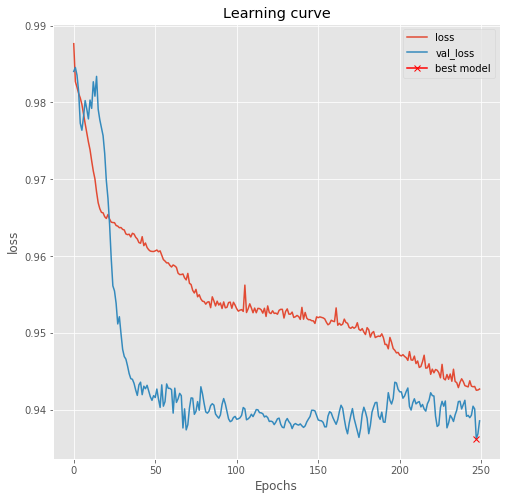

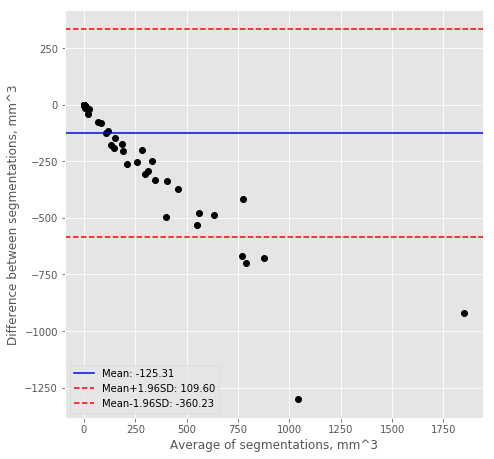


Validation
Voxel classification accuracy:  0.9925929478236607
Precision and recall:  (0.17666250448574164, 0.24455018469531722)
Dice score:  0.48267265495651496
Jaccard score:  0.31811568755330366
Volume difference (mean absolute, mean):  (72.43584071099758, -27.991639939802035)
Centroid distance:  2.6760349740123024
Hausdorff distance:  5.17734096314485
Surface Dice score:  0.6274292208789799
Added path length:  857.1428571428571
Detection rate (per patient, per slice):  (0.6428571428571429, 0.84375)


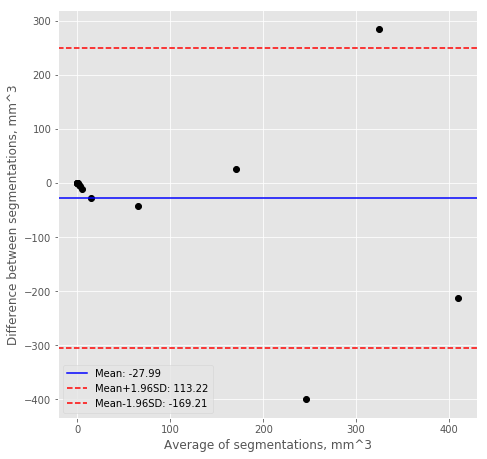


Test
Voxel classification accuracy:  0.9950859069824218
Precision and recall:  (0.10386017362784981, 0.3115606637399673)
Dice score:  0.4877796628141235
Jaccard score:  0.3225704669751789
Volume difference (mean absolute, mean):  (72.69289386868476, -72.69289386868476)
Centroid distance:  0.8217275710078196
Hausdorff distance:  7.361723799020277
Surface Dice score:  0.6559064992970721
Added path length:  403.53333333333336
Detection rate (per patient, per slice):  (0.6, 0.8458333333333333)


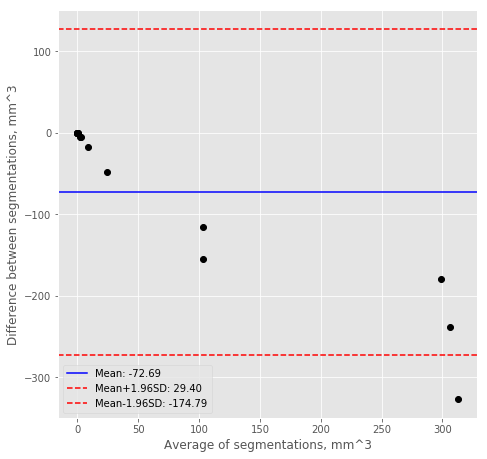

In [291]:
preds_train_iph_dice,preds_valid_iph_dice,preds_test_iph_dice = train_evaluate_model('model_vessel-seg-3d_iph.h5',
                                                                                     dice_loss,
                                                                                     X_train_iph, 
                                                                                     y_train_iph, 
                                                                                     X_valid_iph,
                                                                                     y_valid_iph,
                                                                                     X_test_iph,
                                                                                     y_test_iph,
                                                                                     spacings_train_iph, 
                                                                                     spacings_valid_iph, 
                                                                                     spacings_test_iph)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


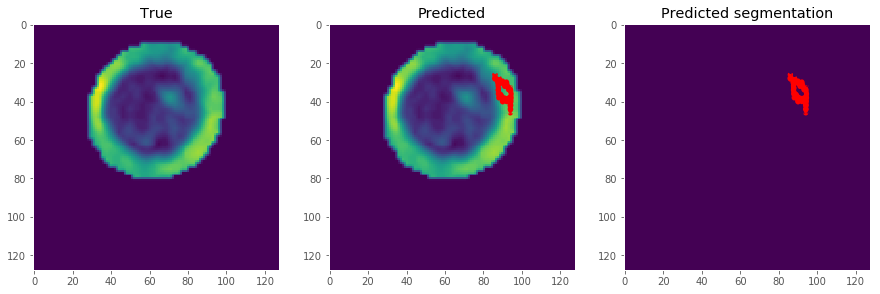

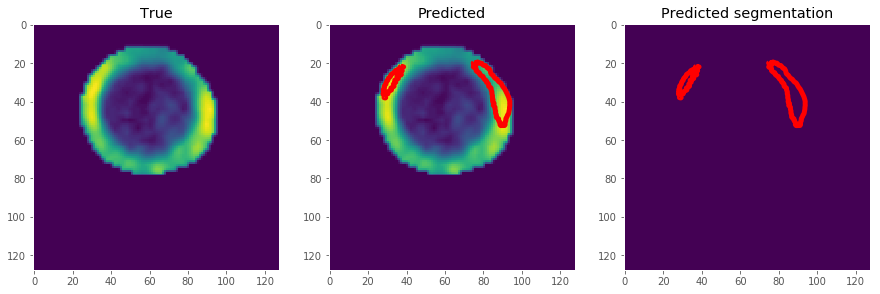

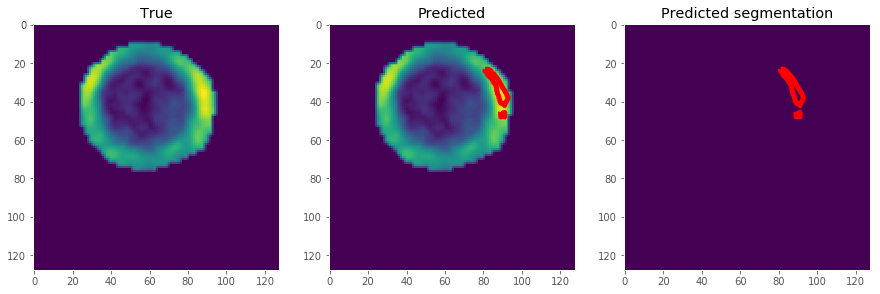

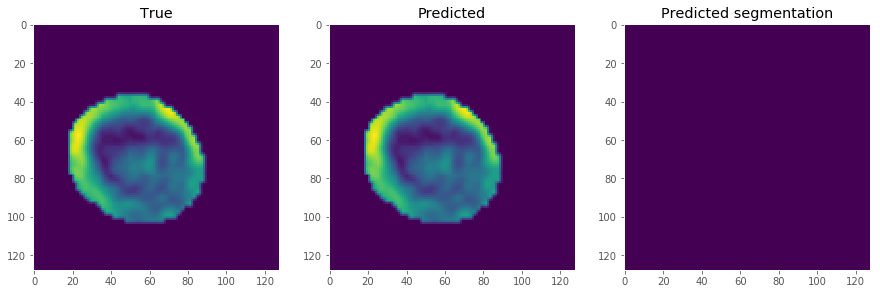

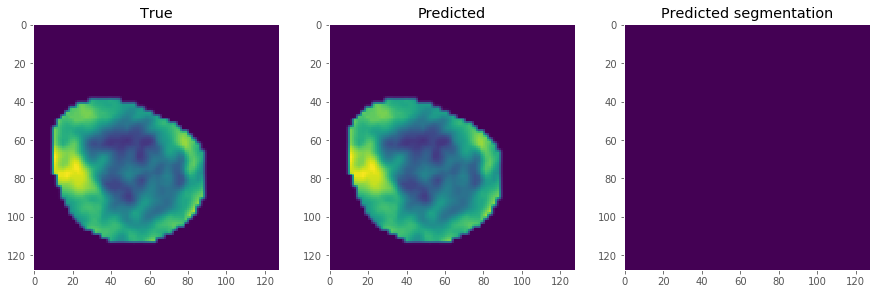

...

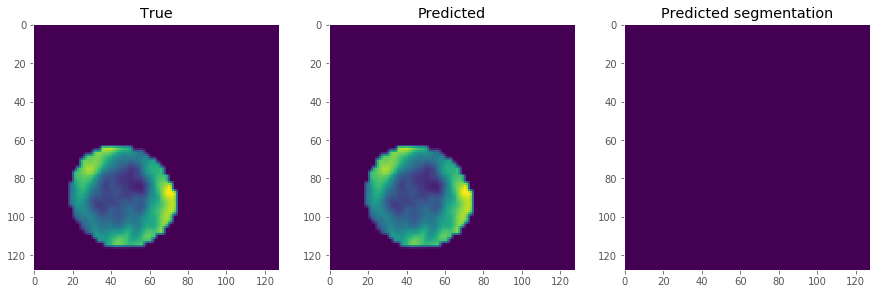

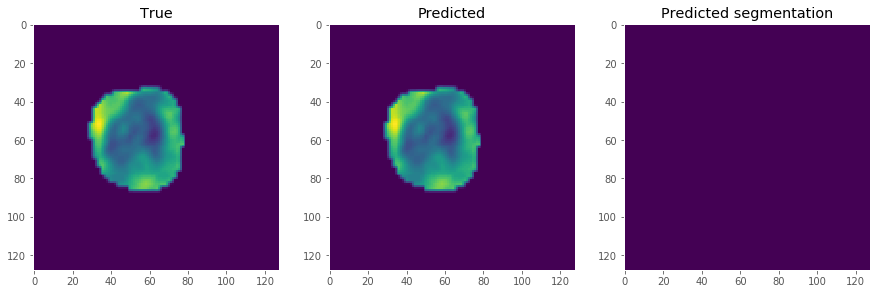

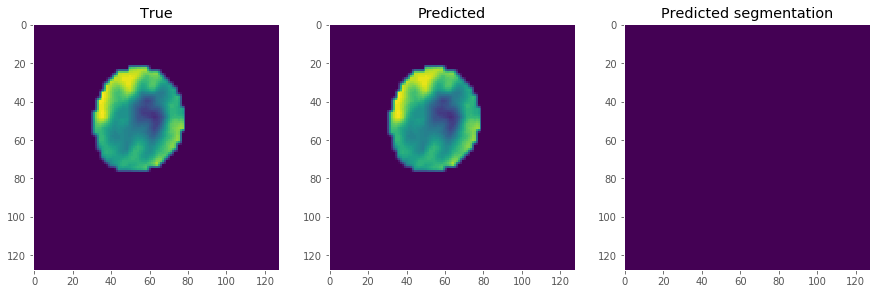

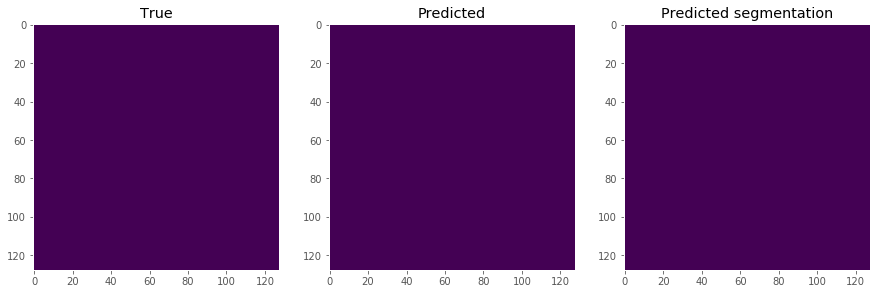

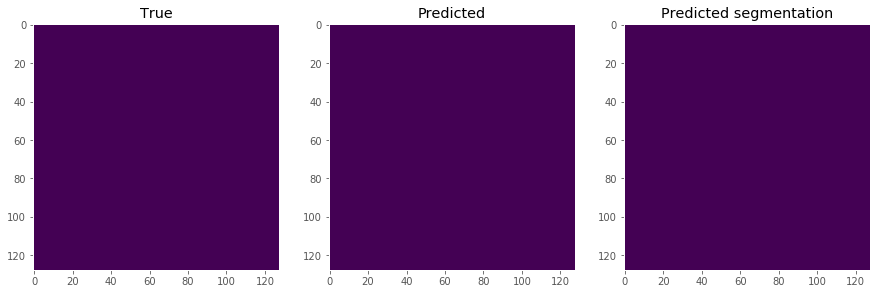

In [292]:
show_seg_slices(0, X_test_iph, y_test_iph, preds_test_iph_dice)

## Dice + BCE

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_27"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_514 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_487 (BatchN (None, 16, 128, 128, 64          conv3d_514[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6812 - acc: 0.8989 - dice_coef: 0.2064
Epoch 00001: val_loss improved from inf to 0.65252, saving model to model_vessel-seg-3d_lumen_cl2.h5
86/86 [==============================] - 118s 1s/sample - loss: 0.6756 - acc: 0.9028 - dice_coef: 0.2140 - val_loss: 0.6525 - val_acc: 0.9616 - val_dice_coef: 0.2541
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5853 - acc: 0.9679 - dice_coef: 0.2490
Epoch 00002: val_loss did not improve from 0.65252
86/86 [==============================] - 3s 36ms/sample - loss: 0.5809 - acc: 0.9686 - dice_coef: 0.2604 - val_loss: 0.7076 - val_acc: 0.9581 - val_dice_coef: 0.3093
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5341 - acc: 0.9785 - dice_coef: 0.2826
Epoch 00003: val_loss did not improve from 0.65252
86/86 [==============================] - 3s 36ms/sample - loss: 0.5327 - acc: 0.9786 - dice

Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2596 - acc: 0.9904 - dice_coef: 0.5753
Epoch 00024: val_loss improved from 0.29082 to 0.28663, saving model to model_vessel-seg-3d_lumen_cl2.h5
86/86 [==============================] - 3s 41ms/sample - loss: 0.2577 - acc: 0.9903 - dice_coef: 0.5837 - val_loss: 0.2866 - val_acc: 0.9860 - val_dice_coef: 0.5769
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2475 - acc: 0.9903 - dice_coef: 0.5946
Epoch 00025: val_loss improved from 0.28663 to 0.26526, saving model to model_vessel-seg-3d_lumen_cl2.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.2491 - acc: 0.9905 - dice_coef: 0.5866 - val_loss: 0.2653 - val_acc: 0.9884 - val_dice_coef: 0.6187
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2363 - acc: 0.9906 - dice_coef: 0.6123
Epoch 00026: val_loss improved from 0.26526 to 0.26305, saving model to model_vessel-seg-3d_lumen_cl2.h5
86/86 [=============

Epoch 46/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1159 - acc: 0.9934 - dice_coef: 0.8037
Epoch 00046: val_loss did not improve from 0.13484
86/86 [==============================] - 3s 36ms/sample - loss: 0.1154 - acc: 0.9933 - dice_coef: 0.8061 - val_loss: 0.1411 - val_acc: 0.9894 - val_dice_coef: 0.7927
Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1132 - acc: 0.9934 - dice_coef: 0.8082
Epoch 00047: val_loss improved from 0.13484 to 0.12652, saving model to model_vessel-seg-3d_lumen_cl2.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.1129 - acc: 0.9935 - dice_coef: 0.8091 - val_loss: 0.1265 - val_acc: 0.9894 - val_dice_coef: 0.6945
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1073 - acc: 0.9936 - dice_coef: 0.8186
Epoch 00048: val_loss did not improve from 0.12652
86/86 [==============================] - 3s 36ms/sample - loss: 0.1081 - acc: 0.9936 - dice_coef: 0.8144 - val_loss: 0.1278 - va

80/86 [==========================>...] - ETA: 0s - loss: 0.0617 - acc: 0.9951 - dice_coef: 0.8961
Epoch 00069: val_loss did not improve from 0.09314
86/86 [==============================] - 3s 36ms/sample - loss: 0.0614 - acc: 0.9951 - dice_coef: 0.8975 - val_loss: 0.0938 - val_acc: 0.9894 - val_dice_coef: 0.8607
Epoch 70/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0599 - acc: 0.9952 - dice_coef: 0.8992
Epoch 00070: val_loss improved from 0.09314 to 0.09312, saving model to model_vessel-seg-3d_lumen_cl2.h5
86/86 [==============================] - 3s 41ms/sample - loss: 0.0599 - acc: 0.9952 - dice_coef: 0.8989 - val_loss: 0.0931 - val_acc: 0.9892 - val_dice_coef: 0.8767
Epoch 71/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0577 - acc: 0.9954 - dice_coef: 0.9027
Epoch 00071: val_loss did not improve from 0.09312
86/86 [==============================] - 3s 36ms/sample - loss: 0.0579 - acc: 0.9954 - dice_coef: 0.9021 - val_loss: 0.0943 - val_acc: 0.9889

Epoch 93/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0389 - acc: 0.9964 - dice_coef: 0.9348
Epoch 00093: val_loss improved from 0.08389 to 0.08284, saving model to model_vessel-seg-3d_lumen_cl2.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.0387 - acc: 0.9964 - dice_coef: 0.9356 - val_loss: 0.0828 - val_acc: 0.9894 - val_dice_coef: 0.8926
Epoch 94/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0378 - acc: 0.9964 - dice_coef: 0.9368
Epoch 00094: val_loss did not improve from 0.08284
86/86 [==============================] - 3s 36ms/sample - loss: 0.0377 - acc: 0.9964 - dice_coef: 0.9372 - val_loss: 0.0834 - val_acc: 0.9893 - val_dice_coef: 0.8815
Epoch 95/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0358 - acc: 0.9967 - dice_coef: 0.9398
Epoch 00095: val_loss improved from 0.08284 to 0.08219, saving model to model_vessel-seg-3d_lumen_cl2.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.0360 - a

80/86 [==========================>...] - ETA: 0s - loss: 0.0266 - acc: 0.9973 - dice_coef: 0.9556
Epoch 00117: val_loss did not improve from 0.08092
86/86 [==============================] - 3s 36ms/sample - loss: 0.0265 - acc: 0.9973 - dice_coef: 0.9559 - val_loss: 0.0839 - val_acc: 0.9889 - val_dice_coef: 0.8896
Epoch 118/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0261 - acc: 0.9973 - dice_coef: 0.9564
Epoch 00118: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00118: val_loss did not improve from 0.08092
86/86 [==============================] - 11s 132ms/sample - loss: 0.0266 - acc: 0.9973 - dice_coef: 0.9546 - val_loss: 0.0871 - val_acc: 0.9885 - val_dice_coef: 0.8747
Epoch 119/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0270 - acc: 0.9973 - dice_coef: 0.9548
Epoch 00119: val_loss did not improve from 0.08092
86/86 [==============================] - 3s 37ms/sample - loss: 0.0268 - acc: 0.9972 - dice_coef: 0.9559 - va

80/86 [==========================>...] - ETA: 0s - loss: 0.0239 - acc: 0.9978 - dice_coef: 0.9596
Epoch 00141: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 36ms/sample - loss: 0.0237 - acc: 0.9978 - dice_coef: 0.9604 - val_loss: 0.0811 - val_acc: 0.9892 - val_dice_coef: 0.8991
Epoch 142/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0239 - acc: 0.9978 - dice_coef: 0.9595
Epoch 00142: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 36ms/sample - loss: 0.0239 - acc: 0.9978 - dice_coef: 0.9599 - val_loss: 0.0812 - val_acc: 0.9892 - val_dice_coef: 0.8850
Epoch 143/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0244 - acc: 0.9978 - dice_coef: 0.9588
Epoch 00143: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 36ms/sample - loss: 0.0242 - acc: 0.9977 - dice_coef: 0.9598 - val_loss: 0.0811 - val_acc: 0.9892 - val_dice_coef: 0.8990
Epoch 144/250
80/86 [======

Epoch 166/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0239 - acc: 0.9978 - dice_coef: 0.9595
Epoch 00166: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 37ms/sample - loss: 0.0238 - acc: 0.9978 - dice_coef: 0.9602 - val_loss: 0.0809 - val_acc: 0.9892 - val_dice_coef: 0.8434
Epoch 167/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0234 - acc: 0.9978 - dice_coef: 0.9606
Epoch 00167: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 37ms/sample - loss: 0.0236 - acc: 0.9978 - dice_coef: 0.9596 - val_loss: 0.0812 - val_acc: 0.9892 - val_dice_coef: 0.8851
Epoch 168/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0234 - acc: 0.9978 - dice_coef: 0.9606
Epoch 00168: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 37ms/sample - loss: 0.0237 - acc: 0.9978 - dice_coef: 0.9591 - val_loss: 0.0811 - val_acc: 0.9892 - val_dice_coef: 0.8843
Epoch 169/250

Epoch 191/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0234 - acc: 0.9978 - dice_coef: 0.9606
Epoch 00191: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 37ms/sample - loss: 0.0236 - acc: 0.9978 - dice_coef: 0.9597 - val_loss: 0.0816 - val_acc: 0.9893 - val_dice_coef: 0.8685
Epoch 192/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0233 - acc: 0.9978 - dice_coef: 0.9608
Epoch 00192: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 36ms/sample - loss: 0.0235 - acc: 0.9978 - dice_coef: 0.9596 - val_loss: 0.0813 - val_acc: 0.9893 - val_dice_coef: 0.8667
Epoch 193/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0236 - acc: 0.9978 - dice_coef: 0.9601
Epoch 00193: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 36ms/sample - loss: 0.0237 - acc: 0.9978 - dice_coef: 0.9598 - val_loss: 0.0812 - val_acc: 0.9892 - val_dice_coef: 0.8850
Epoch 194/250

Epoch 216/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0231 - acc: 0.9978 - dice_coef: 0.9612
Epoch 00216: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 37ms/sample - loss: 0.0236 - acc: 0.9978 - dice_coef: 0.9590 - val_loss: 0.0810 - val_acc: 0.9892 - val_dice_coef: 0.8436
Epoch 217/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0235 - acc: 0.9978 - dice_coef: 0.9602
Epoch 00217: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 37ms/sample - loss: 0.0235 - acc: 0.9978 - dice_coef: 0.9606 - val_loss: 0.0812 - val_acc: 0.9892 - val_dice_coef: 0.8841
Epoch 218/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0233 - acc: 0.9978 - dice_coef: 0.9608
Epoch 00218: val_loss did not improve from 0.08067
86/86 [==============================] - 3s 37ms/sample - loss: 0.0235 - acc: 0.9978 - dice_coef: 0.9598 - val_loss: 0.0827 - val_acc: 0.9893 - val_dice_coef: 0.8280
Epoch 219/250

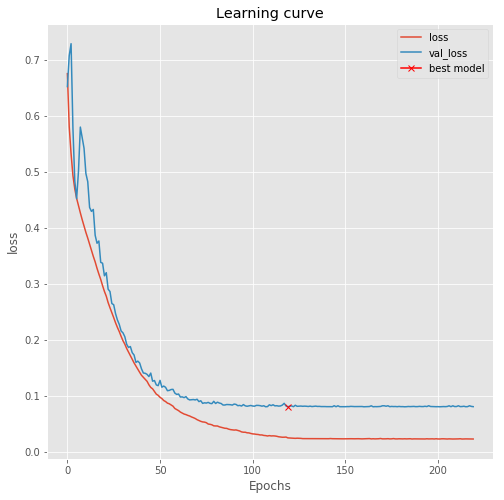

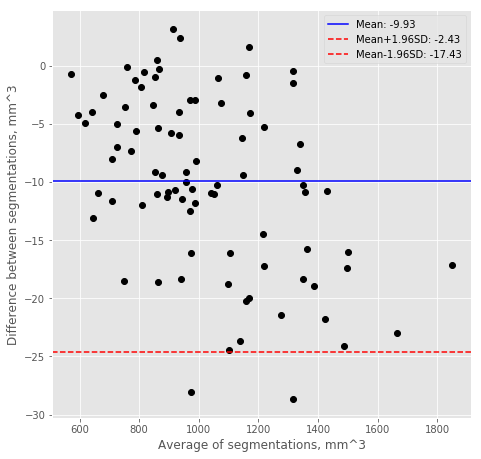


Validation
Voxel classification accuracy:  0.9891837624942555
Precision and recall:  (0.9257755415800843, 0.8805245308991815)
Dice score:  0.903862684912054
Jaccard score:  0.8245892392510781
Volume difference (mean absolute, mean):  (99.84230352675213, 53.31693349340383)
Centroid distance:  1.14855985882334
Hausdorff distance:  0.8296056993417009
Surface Dice score:  0.9800566844643936
Added path length:  2233.0588235294117
Detection rate (per patient, per slice):  (1.0, 0.9963235294117647)


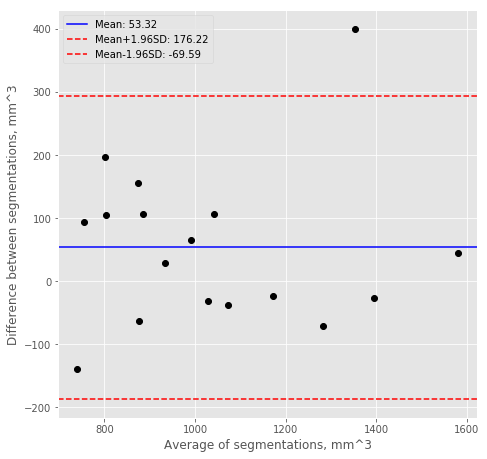


Test
Voxel classification accuracy:  0.9890336990356445
Precision and recall:  (0.899144198605056, 0.9177215479393763)
Dice score:  0.9075385423590708
Jaccard score:  0.8307286172024123
Volume difference (mean absolute, mean):  (58.951229552427925, -20.40196401377519)
Centroid distance:  0.36238401248624624
Hausdorff distance:  0.6325253749084631
Surface Dice score:  0.9867744669229846
Added path length:  2133.1666666666665
Detection rate (per patient, per slice):  (1.0, 0.9895833333333334)


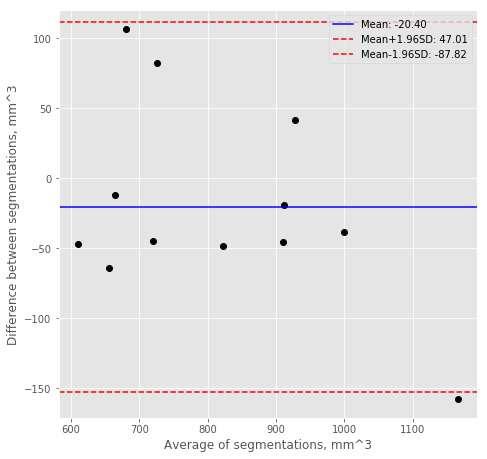

In [293]:
preds_train_lumen_c2, preds_valid_lumen_c2, preds_test_lumen_c2 = train_evaluate_model('model_vessel-seg-3d_lumen_cl2.h5',
                                                                                       custom_loss_2c,
                                                                                       X_train_lumen, 
                                                                                       y_train_lumen, 
                                                                                       X_valid_lumen, 
                                                                                       y_valid_lumen, 
                                                                                       X_test_lumen,
                                                                                       y_test_lumen,
                                                                                       spacings_train_lumen, 
                                                                                       spacings_valid_lumen, 
                                                                                       spacings_test_lumen)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


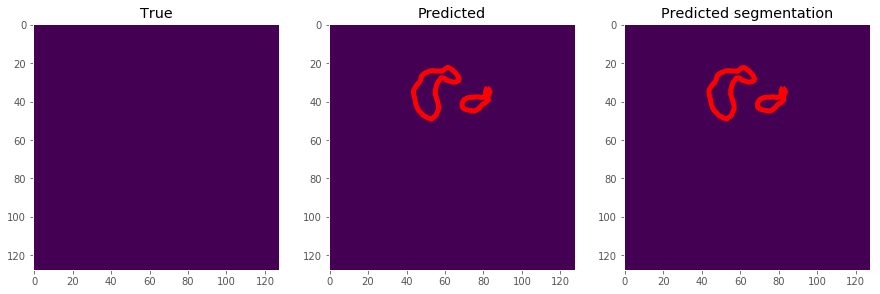

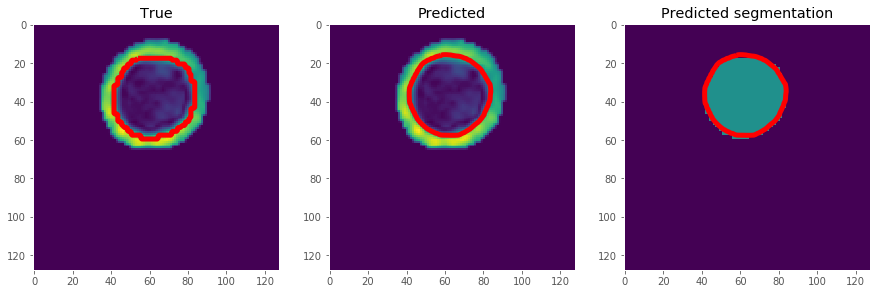

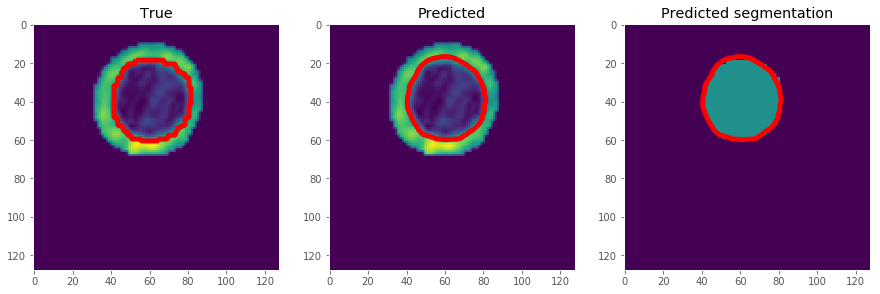

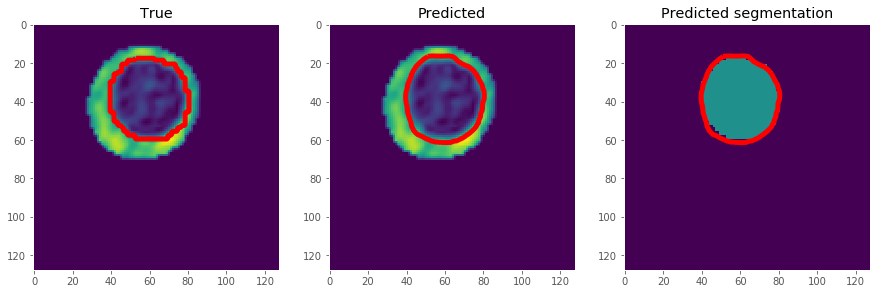

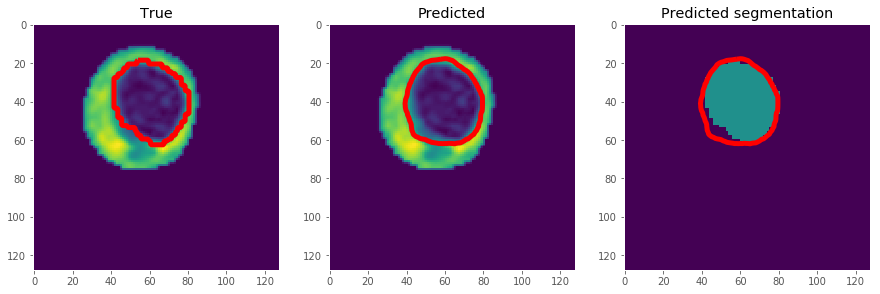

...

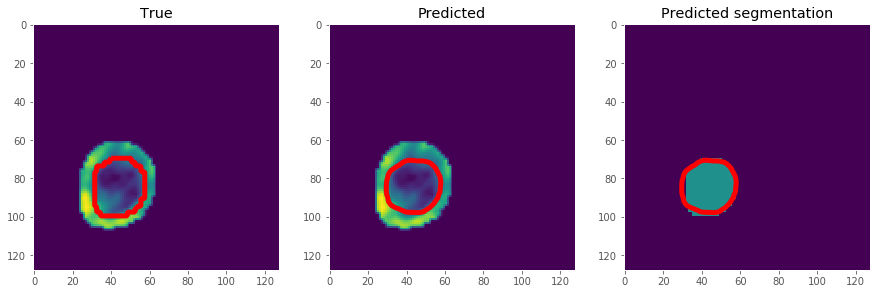

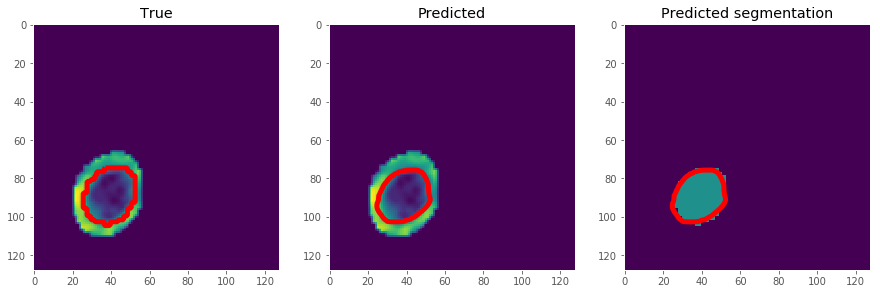

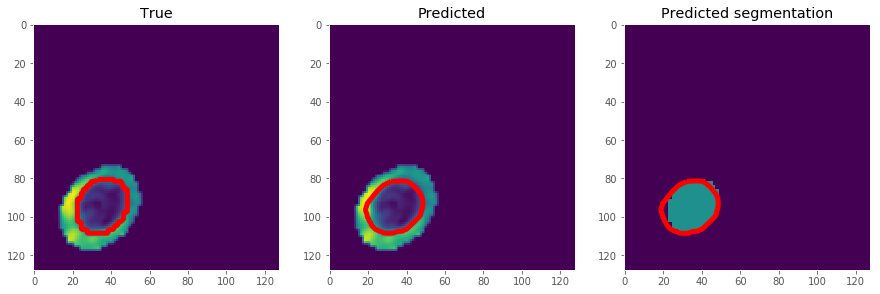

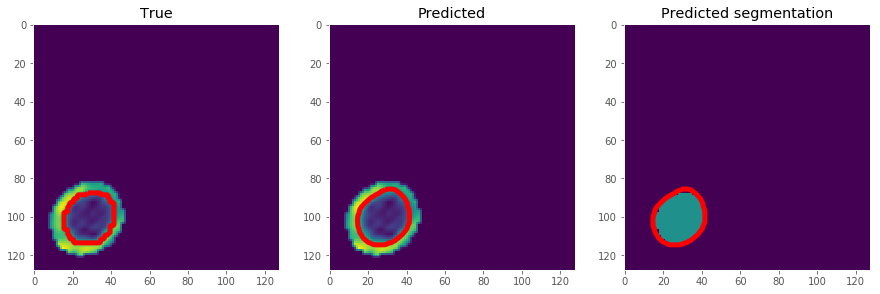

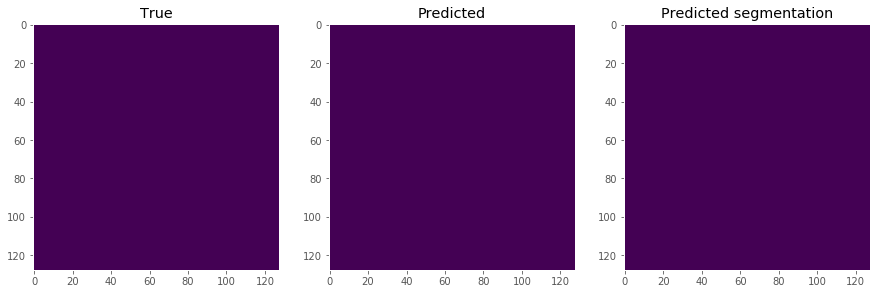

In [294]:
show_seg_slices(0, X_test_lumen, y_test_lumen, preds_test_lumen_c2)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_28"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_533 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_505 (BatchN (None, 16, 128, 128, 64          conv3d_533[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8556 - acc: 0.6192 - dice_coef: 0.0104
Epoch 00001: val_loss improved from inf to 1.12626, saving model to model_vessel-seg-3d_lipid_cl2.h5
86/86 [==============================] - 125s 1s/sample - loss: 0.8535 - acc: 0.6329 - dice_coef: 0.0089 - val_loss: 1.1263 - val_acc: 0.5444 - val_dice_coef: 0.0039
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8010 - acc: 0.8459 - dice_coef: 0.0097
Epoch 00002: val_loss improved from 1.12626 to 0.93857, saving model to model_vessel-seg-3d_lipid_cl2.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.7998 - acc: 0.8472 - dice_coef: 0.0105 - val_loss: 0.9386 - val_acc: 0.7408 - val_dice_coef: 0.0112
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7741 - acc: 0.8862 - dice_coef: 0.0103
Epoch 00003: val_loss did not improve from 0.93857
86/86 [==============================

Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5761 - acc: 0.9945 - dice_coef: 0.0184
Epoch 00025: val_loss improved from 0.60075 to 0.58884, saving model to model_vessel-seg-3d_lipid_cl2.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.5749 - acc: 0.9943 - dice_coef: 0.0239 - val_loss: 0.5888 - val_acc: 0.9892 - val_dice_coef: 0.0140
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5713 - acc: 0.9937 - dice_coef: 0.0225
Epoch 00026: val_loss improved from 0.58884 to 0.58619, saving model to model_vessel-seg-3d_lipid_cl2.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.5709 - acc: 0.9935 - dice_coef: 0.0238 - val_loss: 0.5862 - val_acc: 0.9890 - val_dice_coef: 0.0255
Epoch 27/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5687 - acc: 0.9944 - dice_coef: 0.0186
Epoch 00027: val_loss did not improve from 0.58619
86/86 [==============================] - 3s 36ms/sample - loss: 0.5669 - a

80/86 [==========================>...] - ETA: 0s - loss: 0.4936 - acc: 0.9892 - dice_coef: 0.0865
Epoch 00048: val_loss did not improve from 0.51043
86/86 [==============================] - 3s 36ms/sample - loss: 0.4939 - acc: 0.9894 - dice_coef: 0.0832 - val_loss: 0.5130 - val_acc: 0.9951 - val_dice_coef: 0.0161
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4901 - acc: 0.9901 - dice_coef: 0.0886
Epoch 00049: val_loss did not improve from 0.51043
86/86 [==============================] - 3s 37ms/sample - loss: 0.4916 - acc: 0.9904 - dice_coef: 0.0807 - val_loss: 0.5156 - val_acc: 0.9950 - val_dice_coef: 0.0143
Epoch 50/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4875 - acc: 0.9916 - dice_coef: 0.0879
Epoch 00050: val_loss improved from 0.51043 to 0.50289, saving model to model_vessel-seg-3d_lipid_cl2.h5
86/86 [==============================] - 3s 41ms/sample - loss: 0.4882 - acc: 0.9911 - dice_coef: 0.0865 - val_loss: 0.5029 - val_acc: 0.9927

86/86 [==============================] - 3s 40ms/sample - loss: 0.3934 - acc: 0.9937 - dice_coef: 0.2422 - val_loss: 0.4457 - val_acc: 0.9934 - val_dice_coef: 0.1757
Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3921 - acc: 0.9925 - dice_coef: 0.2470
Epoch 00072: val_loss did not improve from 0.44568
86/86 [==============================] - 3s 37ms/sample - loss: 0.3917 - acc: 0.9927 - dice_coef: 0.2476 - val_loss: 0.4725 - val_acc: 0.9962 - val_dice_coef: 0.0415
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3830 - acc: 0.9917 - dice_coef: 0.2662
Epoch 00073: val_loss did not improve from 0.44568
86/86 [==============================] - 3s 36ms/sample - loss: 0.3865 - acc: 0.9922 - dice_coef: 0.2464 - val_loss: 0.4883 - val_acc: 0.9963 - val_dice_coef: 0.1026
Epoch 74/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3782 - acc: 0.9943 - dice_coef: 0.2680
Epoch 00074: val_loss improved from 0.44568 to 0.43330, saving mode

Epoch 96/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2643 - acc: 0.9965 - dice_coef: 0.4859
Epoch 00096: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 36ms/sample - loss: 0.2724 - acc: 0.9965 - dice_coef: 0.4471 - val_loss: 0.4892 - val_acc: 0.9963 - val_dice_coef: 0.0258
Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2642 - acc: 0.9966 - dice_coef: 0.4857
Epoch 00097: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 36ms/sample - loss: 0.2662 - acc: 0.9964 - dice_coef: 0.4776 - val_loss: 0.4903 - val_acc: 0.9963 - val_dice_coef: 0.0228
Epoch 98/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2634 - acc: 0.9964 - dice_coef: 0.4882
Epoch 00098: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 36ms/sample - loss: 0.2749 - acc: 0.9966 - dice_coef: 0.4318 - val_loss: 0.4884 - val_acc: 0.9962 - val_dice_coef: 0.0268
Epoch 99/250
80/

Epoch 121/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2836 - acc: 0.9965 - dice_coef: 0.4474
Epoch 00121: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 37ms/sample - loss: 0.2723 - acc: 0.9966 - dice_coef: 0.5005 - val_loss: 0.4832 - val_acc: 0.9962 - val_dice_coef: 0.1268
Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2635 - acc: 0.9966 - dice_coef: 0.4873
Epoch 00122: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 37ms/sample - loss: 0.2636 - acc: 0.9965 - dice_coef: 0.4872 - val_loss: 0.4795 - val_acc: 0.9962 - val_dice_coef: 0.0341
Epoch 123/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2598 - acc: 0.9964 - dice_coef: 0.4952
Epoch 00123: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 36ms/sample - loss: 0.2676 - acc: 0.9966 - dice_coef: 0.4571 - val_loss: 0.4776 - val_acc: 0.9962 - val_dice_coef: 0.0593
Epoch 124/250

Epoch 146/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2940 - acc: 0.9970 - dice_coef: 0.4252
Epoch 00146: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 37ms/sample - loss: 0.2870 - acc: 0.9965 - dice_coef: 0.4620 - val_loss: 0.4757 - val_acc: 0.9962 - val_dice_coef: 0.0381
Epoch 147/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2721 - acc: 0.9969 - dice_coef: 0.4692
Epoch 00147: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 36ms/sample - loss: 0.2709 - acc: 0.9966 - dice_coef: 0.4767 - val_loss: 0.4735 - val_acc: 0.9962 - val_dice_coef: 0.0879
Epoch 148/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2503 - acc: 0.9968 - dice_coef: 0.5128
Epoch 00148: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 36ms/sample - loss: 0.2556 - acc: 0.9966 - dice_coef: 0.4907 - val_loss: 0.4782 - val_acc: 0.9962 - val_dice_coef: 0.1398
Epoch 149/250

Epoch 171/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2573 - acc: 0.9968 - dice_coef: 0.4991
Epoch 00171: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 36ms/sample - loss: 0.2570 - acc: 0.9967 - dice_coef: 0.5015 - val_loss: 0.4743 - val_acc: 0.9962 - val_dice_coef: 0.0397
Epoch 172/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2583 - acc: 0.9966 - dice_coef: 0.4978
Epoch 00172: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 36ms/sample - loss: 0.2650 - acc: 0.9967 - dice_coef: 0.4652 - val_loss: 0.4738 - val_acc: 0.9962 - val_dice_coef: 0.1165
Epoch 173/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2632 - acc: 0.9968 - dice_coef: 0.4871
Epoch 00173: val_loss did not improve from 0.43330
86/86 [==============================] - 3s 36ms/sample - loss: 0.2678 - acc: 0.9967 - dice_coef: 0.4666 - val_loss: 0.4736 - val_acc: 0.9962 - val_dice_coef: 0.0428
Epoch 174/250

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.15684826823404885, 0.3590643102930533)
Dice score:  0.43543234530650926
Jaccard score:  0.27830975657789625
Volume difference (mean absolute, mean):  (112.64455972958443, -105.2415899291288)
Centroid distance:  4.353733851972744
Hausdorff distance:  4.646336420286002
Surface Dice score:  0.6928735786287553
Added path length:  576.0697674418604
Detection rate (per patient, per slice):  (0.8255813953488372, 0.8786337209302325)


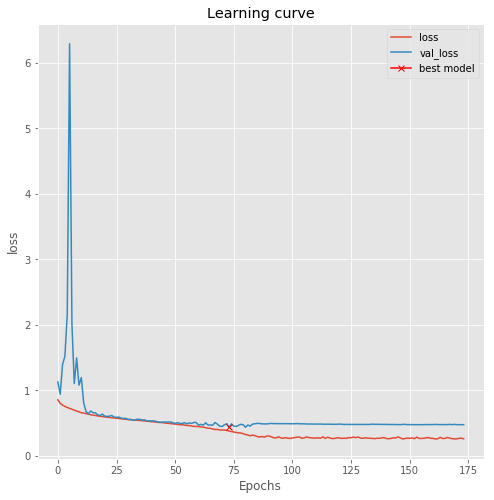

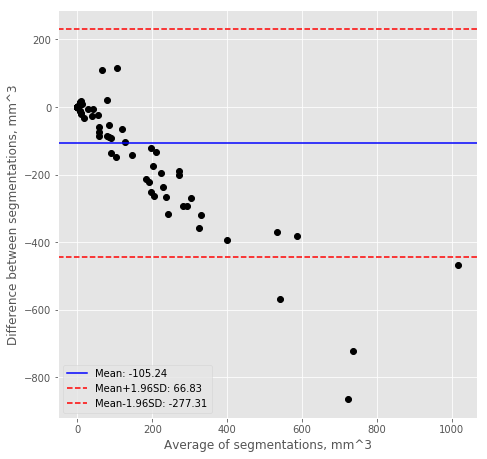


Validation
Voxel classification accuracy:  0.9941749572753906
Precision and recall:  (0.15788615261884784, 0.14974452523422155)
Dice score:  0.25584795321637427
Jaccard score:  0.1467030438498455
Volume difference (mean absolute, mean):  (79.54332171292866, -41.791058265111026)
Centroid distance:  4.57674525966553
Hausdorff distance:  5.323640784745234
Surface Dice score:  0.574851374249784
Added path length:  653.5882352941177
Detection rate (per patient, per slice):  (0.7058823529411765, 0.8272058823529411)


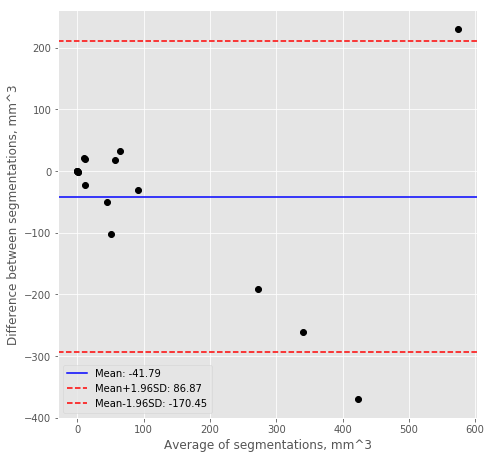


Test
Voxel classification accuracy:  0.9937740961710612
Precision and recall:  (0.07973980732248964, 0.1044147429430115)
Dice score:  0.3057426444523218
Jaccard score:  0.18047535358607414
Volume difference (mean absolute, mean):  (59.84870150436958, -14.809365006784597)
Centroid distance:  5.595644903800448
Hausdorff distance:  5.754049155191323
Surface Dice score:  0.4825202393798504
Added path length:  703.5833333333334
Detection rate (per patient, per slice):  (0.4166666666666667, 0.734375)


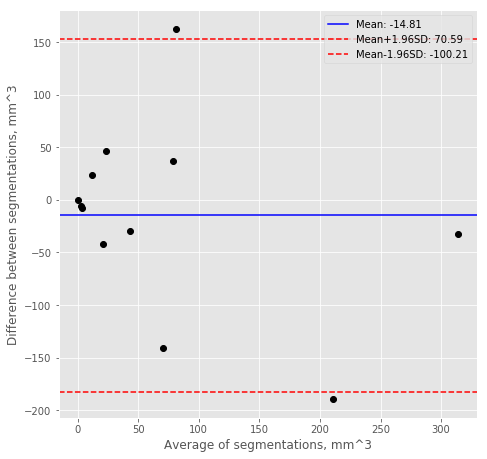

In [295]:
preds_train_lipid_c2, preds_valid_lipid_c2, preds_test_lipid_c2 = train_evaluate_model('model_vessel-seg-3d_lipid_cl2.h5',
                                                                                       custom_loss_2c, 
                                                                                       X_train_lipid, 
                                                                                       y_train_lipid, 
                                                                                       X_valid_lipid, 
                                                                                       y_valid_lipid, 
                                                                                       X_test_lipid, 
                                                                                       y_test_lipid,
                                                                                       spacings_train_lipid,
                                                                                       spacings_valid_lipid,
                                                                                       spacings_test_lipid)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


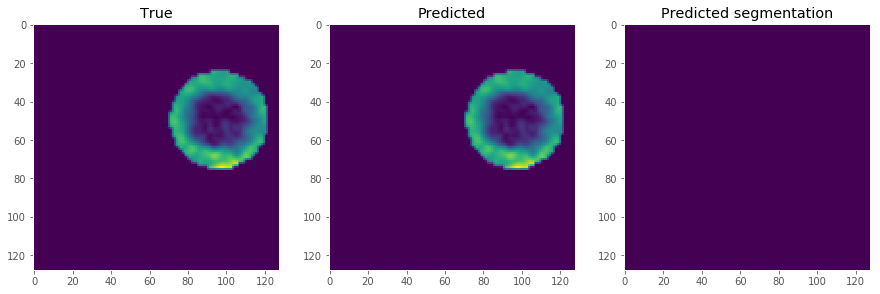

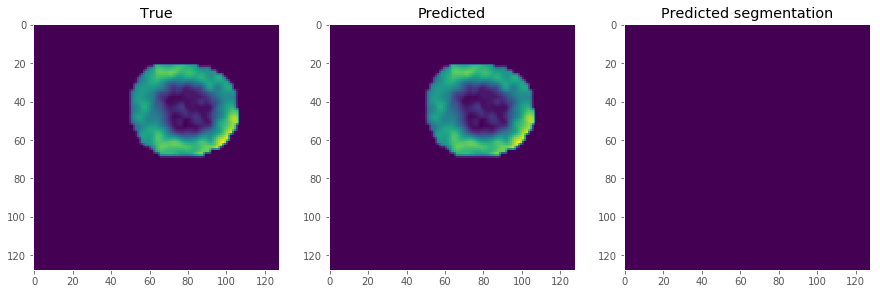

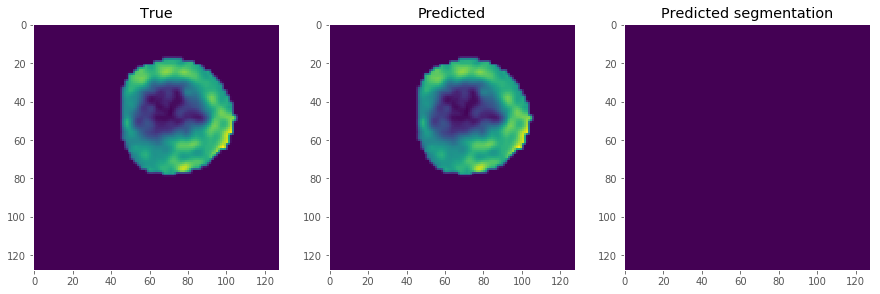

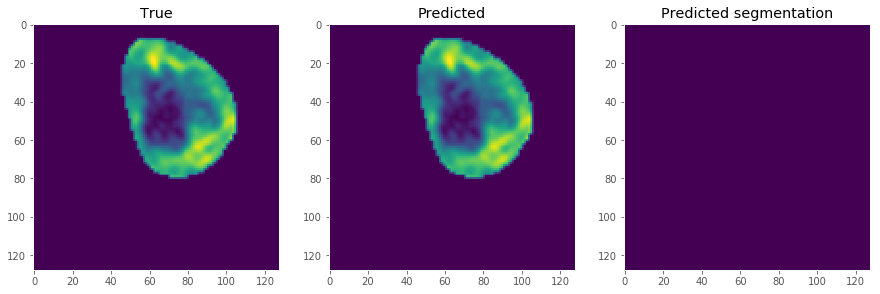

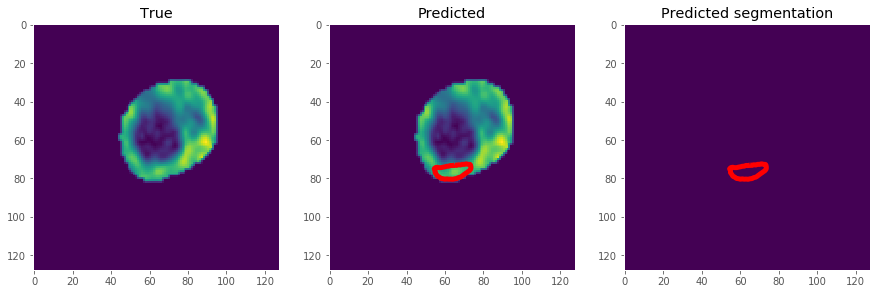

...

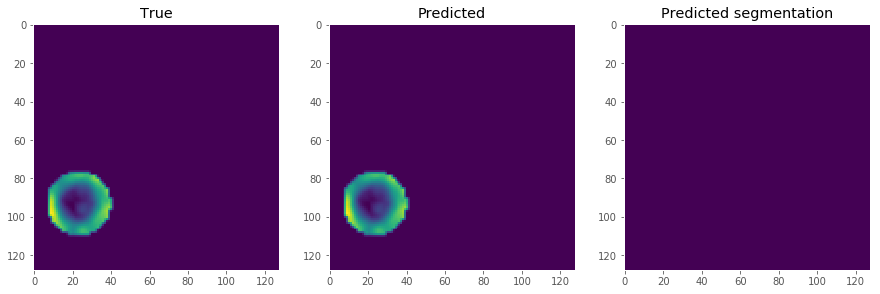

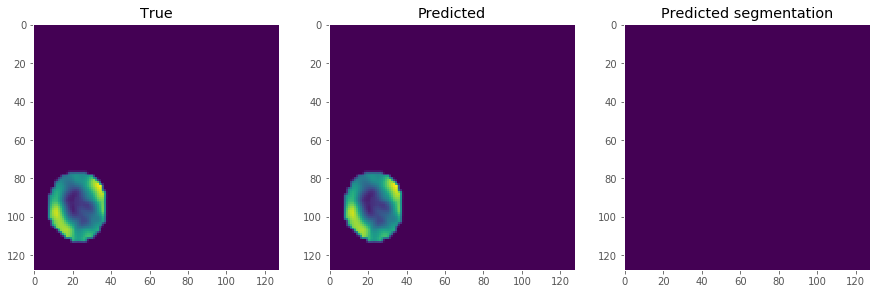

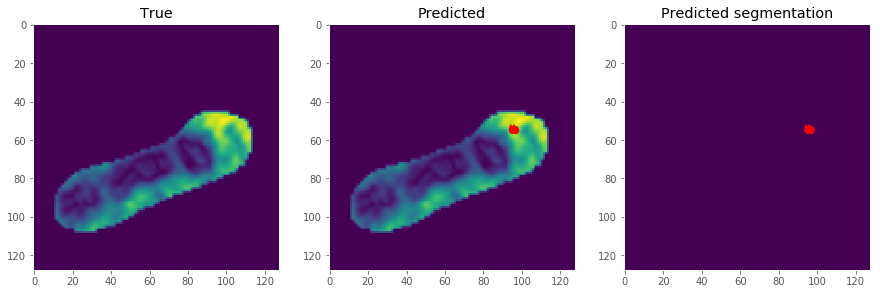

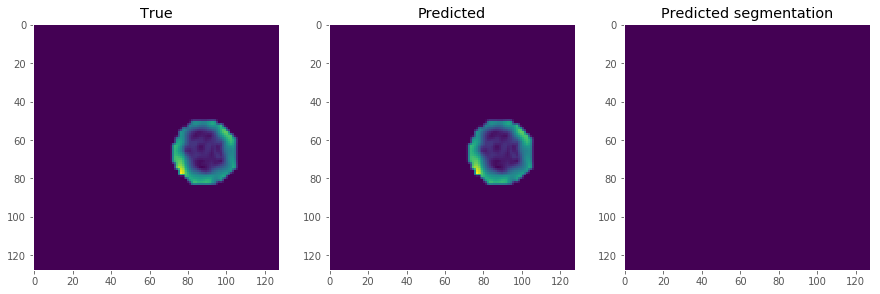

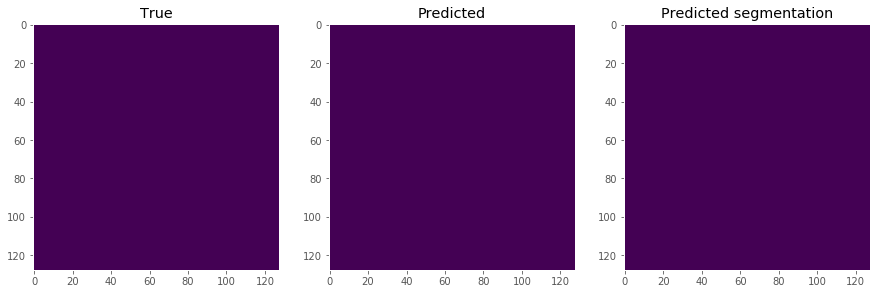

In [296]:
show_seg_slices(0, X_test_lipid, y_test_lipid, preds_test_lipid_c2)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_29"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_552 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_523 (BatchN (None, 16, 128, 128, 64          conv3d_552[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7941 - acc: 0.7090 - dice_coef: 0.0090
Epoch 00001: val_loss improved from inf to 0.75987, saving model to model_vessel-seg-3d_calc_cl2.h5
86/86 [==============================] - 132s 2s/sample - loss: 0.7913 - acc: 0.7197 - dice_coef: 0.0093 - val_loss: 0.7599 - val_acc: 0.8928 - val_dice_coef: 0.0139
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7248 - acc: 0.9321 - dice_coef: 0.0105
Epoch 00002: val_loss improved from 0.75987 to 0.68217, saving model to model_vessel-seg-3d_calc_cl2.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.7235 - acc: 0.9338 - dice_coef: 0.0107 - val_loss: 0.6822 - val_acc: 0.9402 - val_dice_coef: 0.0053
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6955 - acc: 0.9543 - dice_coef: 0.0120
Epoch 00003: val_loss improved from 0.68217 to 0.63247, saving model to model_vessel-seg-3

Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5537 - acc: 0.9913 - dice_coef: 0.0325
Epoch 00024: val_loss improved from 0.55838 to 0.55814, saving model to model_vessel-seg-3d_calc_cl2.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.5528 - acc: 0.9915 - dice_coef: 0.0355 - val_loss: 0.5581 - val_acc: 0.9947 - val_dice_coef: 0.0109
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5496 - acc: 0.9876 - dice_coef: 0.0393
Epoch 00025: val_loss improved from 0.55814 to 0.55700, saving model to model_vessel-seg-3d_calc_cl2.h5
86/86 [==============================] - 4s 44ms/sample - loss: 0.5492 - acc: 0.9880 - dice_coef: 0.0395 - val_loss: 0.5570 - val_acc: 0.9946 - val_dice_coef: 0.0058
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5454 - acc: 0.9927 - dice_coef: 0.0363
Epoch 00026: val_loss improved from 0.55700 to 0.54743, saving model to model_vessel-seg-3d_calc_cl2.h5
86/86 [================

80/86 [==========================>...] - ETA: 0s - loss: 0.4703 - acc: 0.9913 - dice_coef: 0.1158
Epoch 00046: val_loss did not improve from 0.48594
86/86 [==============================] - 3s 37ms/sample - loss: 0.4713 - acc: 0.9910 - dice_coef: 0.1123 - val_loss: 0.5048 - val_acc: 0.9947 - val_dice_coef: 0.0264
Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4652 - acc: 0.9902 - dice_coef: 0.1259
Epoch 00047: val_loss did not improve from 0.48594
86/86 [==============================] - 3s 37ms/sample - loss: 0.4673 - acc: 0.9906 - dice_coef: 0.1138 - val_loss: 0.5019 - val_acc: 0.9947 - val_dice_coef: 0.0480
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4648 - acc: 0.9923 - dice_coef: 0.1209
Epoch 00048: val_loss improved from 0.48594 to 0.48364, saving model to model_vessel-seg-3d_calc_cl2.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.4628 - acc: 0.9920 - dice_coef: 0.1313 - val_loss: 0.4836 - val_acc: 0.9947 

80/86 [==========================>...] - ETA: 0s - loss: 0.3198 - acc: 0.9953 - dice_coef: 0.3815
Epoch 00070: val_loss improved from 0.42506 to 0.42121, saving model to model_vessel-seg-3d_calc_cl2.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.3168 - acc: 0.9953 - dice_coef: 0.3960 - val_loss: 0.4212 - val_acc: 0.9933 - val_dice_coef: 0.1659
Epoch 71/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3122 - acc: 0.9954 - dice_coef: 0.3957
Epoch 00071: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 36ms/sample - loss: 0.3111 - acc: 0.9954 - dice_coef: 0.4007 - val_loss: 0.4391 - val_acc: 0.9943 - val_dice_coef: 0.0808
Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3009 - acc: 0.9950 - dice_coef: 0.4196
Epoch 00072: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 37ms/sample - loss: 0.3054 - acc: 0.9951 - dice_coef: 0.3971 - val_loss: 0.4215 - val_acc: 0.9944 

Epoch 95/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2166 - acc: 0.9969 - dice_coef: 0.5813
Epoch 00095: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 37ms/sample - loss: 0.2174 - acc: 0.9970 - dice_coef: 0.5766 - val_loss: 0.4551 - val_acc: 0.9947 - val_dice_coef: 0.1395
Epoch 96/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2110 - acc: 0.9969 - dice_coef: 0.5926
Epoch 00096: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 36ms/sample - loss: 0.2121 - acc: 0.9970 - dice_coef: 0.5859 - val_loss: 0.4511 - val_acc: 0.9947 - val_dice_coef: 0.1024
Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2120 - acc: 0.9970 - dice_coef: 0.5903
Epoch 00097: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 36ms/sample - loss: 0.2110 - acc: 0.9970 - dice_coef: 0.5947 - val_loss: 0.4535 - val_acc: 0.9947 - val_dice_coef: 0.1444
Epoch 98/250
80/

Epoch 120/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2099 - acc: 0.9971 - dice_coef: 0.5938
Epoch 00120: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 37ms/sample - loss: 0.2116 - acc: 0.9970 - dice_coef: 0.5865 - val_loss: 0.4391 - val_acc: 0.9947 - val_dice_coef: 0.0824
Epoch 121/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2101 - acc: 0.9971 - dice_coef: 0.5936
Epoch 00121: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 36ms/sample - loss: 0.2104 - acc: 0.9970 - dice_coef: 0.5928 - val_loss: 0.4353 - val_acc: 0.9947 - val_dice_coef: 0.1254
Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2097 - acc: 0.9970 - dice_coef: 0.5948
Epoch 00122: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 36ms/sample - loss: 0.2098 - acc: 0.9970 - dice_coef: 0.5938 - val_loss: 0.4375 - val_acc: 0.9947 - val_dice_coef: 0.0839
Epoch 123/250

Epoch 145/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2055 - acc: 0.9970 - dice_coef: 0.6028
Epoch 00145: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 37ms/sample - loss: 0.2092 - acc: 0.9971 - dice_coef: 0.5856 - val_loss: 0.4326 - val_acc: 0.9947 - val_dice_coef: 0.1330
Epoch 146/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2049 - acc: 0.9971 - dice_coef: 0.6039
Epoch 00146: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 37ms/sample - loss: 0.2067 - acc: 0.9971 - dice_coef: 0.5958 - val_loss: 0.4360 - val_acc: 0.9947 - val_dice_coef: 0.0857
Epoch 147/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2096 - acc: 0.9970 - dice_coef: 0.5951
Epoch 00147: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 37ms/sample - loss: 0.2093 - acc: 0.9971 - dice_coef: 0.5954 - val_loss: 0.4311 - val_acc: 0.9947 - val_dice_coef: 0.2190
Epoch 148/250

Epoch 170/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2081 - acc: 0.9971 - dice_coef: 0.5975
Epoch 00170: val_loss did not improve from 0.42121
86/86 [==============================] - 3s 37ms/sample - loss: 0.2058 - acc: 0.9971 - dice_coef: 0.6087 - val_loss: 0.4366 - val_acc: 0.9947 - val_dice_coef: 0.2380
Epoch 00170: early stopping
12/12 [==============================] - 0s 17ms/sample

Train
Voxel classification accuracy:  0.9942481905915016


C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.38395796641408203, 0.6081653042984487)
Dice score:  0.5391638413260268
Jaccard score:  0.36908046144788764
Volume difference (mean absolute, mean):  (49.62484213571216, -47.94763685173766)
Centroid distance:  3.64644751430303
Hausdorff distance:  4.97980575236967
Surface Dice score:  0.78507778060728
Added path length:  483.24418604651163
Detection rate (per patient, per slice):  (0.9418604651162791, 0.8793604651162791)


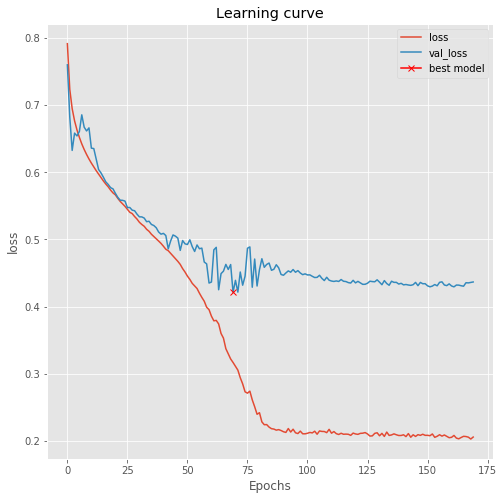

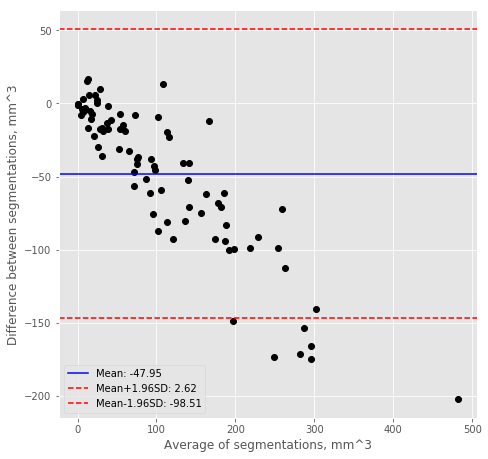


Validation
Voxel classification accuracy:  0.9932935378130745
Precision and recall:  (0.2775170319073311, 0.21320929410417933)
Dice score:  0.27193666260657734
Jaccard score:  0.15737686430404016
Volume difference (mean absolute, mean):  (59.74767164973652, 30.1424880658879)
Centroid distance:  4.966763437854487
Hausdorff distance:  7.4657942055302735
Surface Dice score:  0.4221610408636878
Added path length:  1075.8823529411766
Detection rate (per patient, per slice):  (0.9411764705882353, 0.7022058823529411)


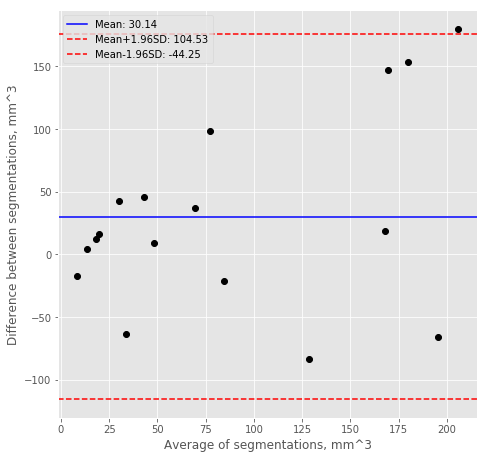


Test
Voxel classification accuracy:  0.9928003946940104
Precision and recall:  (0.2200200873877982, 0.21269837778293665)
Dice score:  0.24418488236275648
Jaccard score:  0.13908845554415178
Volume difference (mean absolute, mean):  (56.70735922207435, -17.184104425211746)
Centroid distance:  3.4475293102039815
Hausdorff distance:  8.17150101551174
Surface Dice score:  0.5260979495127925
Added path length:  776.6666666666666
Detection rate (per patient, per slice):  (0.9166666666666666, 0.7291666666666666)


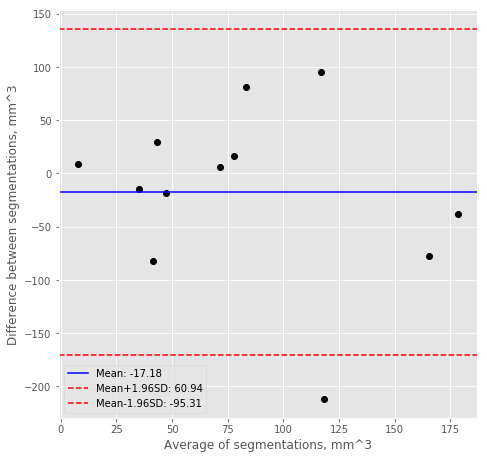

In [297]:
preds_train_calc_c2, preds_valid_calc_c2, preds_test_calc_c2 = train_evaluate_model('model_vessel-seg-3d_calc_cl2.h5',
                                                                                    custom_loss_2c,
                                                                                    X_train_calc, 
                                                                                    y_train_calc, 
                                                                                    X_valid_calc,
                                                                                    y_valid_calc, 
                                                                                    X_test_calc,
                                                                                    y_test_calc,
                                                                                    spacings_train_calc, 
                                                                                    spacings_valid_calc, 
                                                                                    spacings_test_calc)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


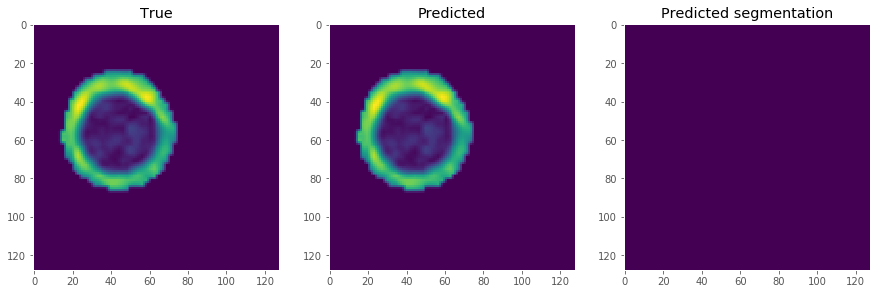

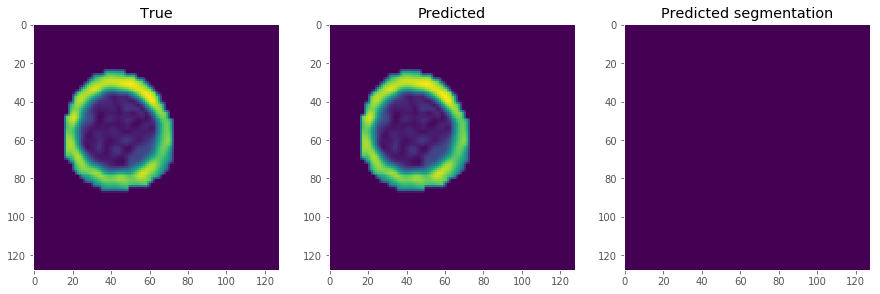

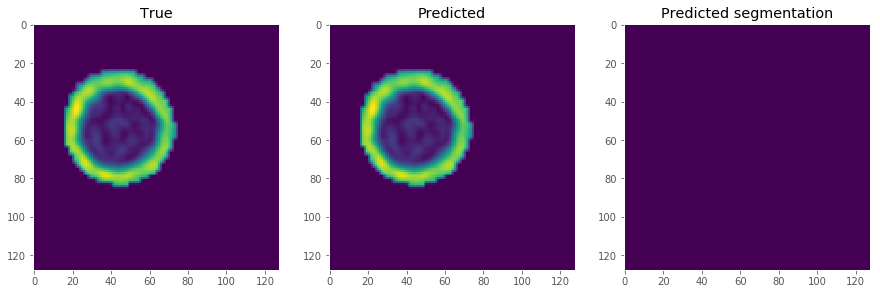

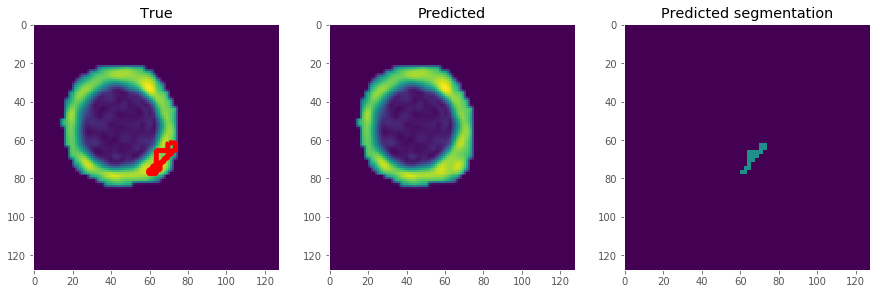

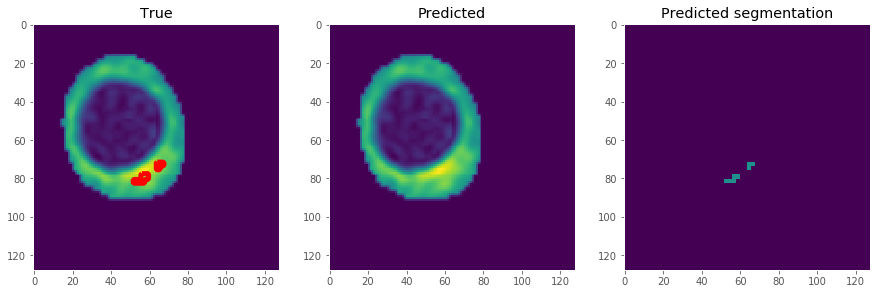

...

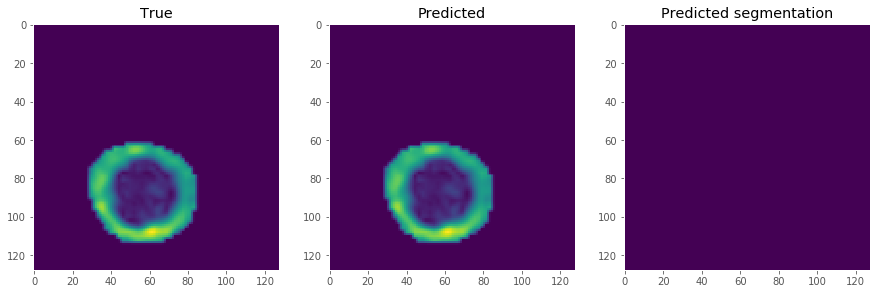

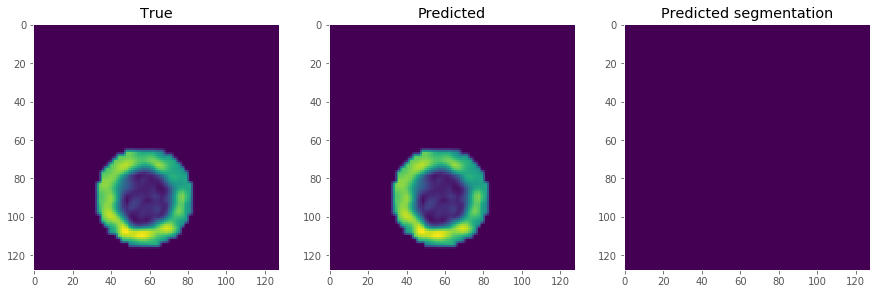

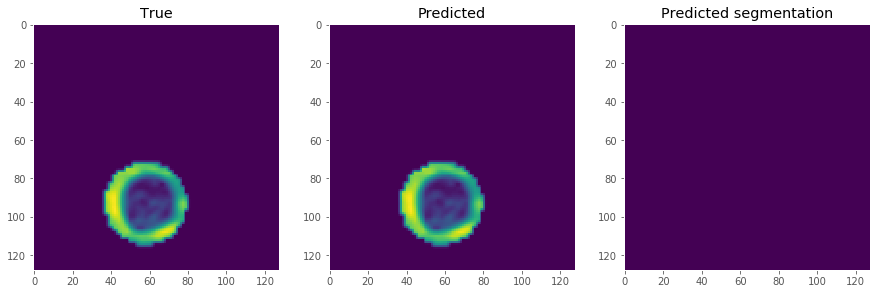

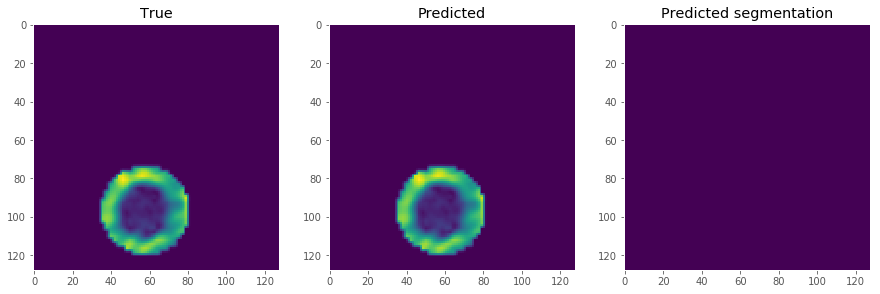

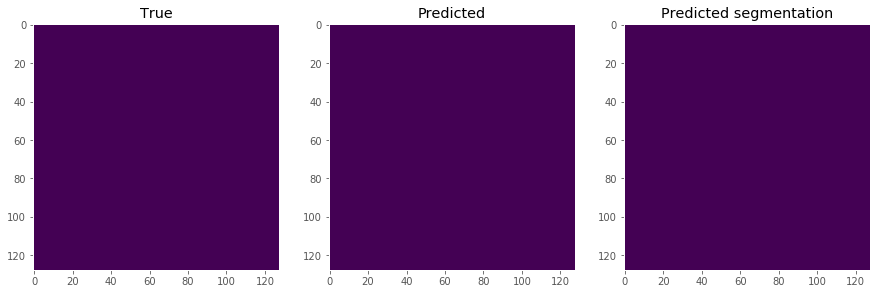

In [298]:
show_seg_slices(0, X_test_calc, y_test_calc, preds_test_calc_c2)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_30"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_571 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_541 (BatchN (None, 16, 128, 128, 64          conv3d_571[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 14 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8762 - acc: 0.5507 - dice_coef: 0.0084
Epoch 00001: val_loss improved from inf to 2.60985, saving model to model_vessel-seg-3d_iph_cl2.h5
86/86 [==============================] - 141s 2s/sample - loss: 0.8728 - acc: 0.5672 - dice_coef: 0.0099 - val_loss: 2.6098 - val_acc: 0.3581 - val_dice_coef: 0.0167
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7932 - acc: 0.8574 - dice_coef: 0.0107
Epoch 00002: val_loss did not improve from 2.60985
86/86 [==============================] - 3s 36ms/sample - loss: 0.7914 - acc: 0.8606 - dice_coef: 0.0109 - val_loss: 16.0813 - val_acc: 0.1615 - val_dice_coef: 0.0147
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7435 - acc: 0.9244 - dice_coef: 0.0118
Epoch 00003: val_loss did not improve from 2.60985
86/86 [==============================] - 3s 35ms/sample - loss: 0.7425 - acc: 0.9258 - dice_

Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5584 - acc: 0.9957 - dice_coef: 0.0325
Epoch 00024: val_loss improved from 0.54614 to 0.54184, saving model to model_vessel-seg-3d_iph_cl2.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.5593 - acc: 0.9958 - dice_coef: 0.0271 - val_loss: 0.5418 - val_acc: 0.9840 - val_dice_coef: 0.0639
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5535 - acc: 0.9947 - dice_coef: 0.0364
Epoch 00025: val_loss improved from 0.54184 to 0.53625, saving model to model_vessel-seg-3d_iph_cl2.h5
86/86 [==============================] - 3s 39ms/sample - loss: 0.5544 - acc: 0.9949 - dice_coef: 0.0311 - val_loss: 0.5363 - val_acc: 0.9839 - val_dice_coef: 0.0679
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5508 - acc: 0.9953 - dice_coef: 0.0352
Epoch 00026: val_loss did not improve from 0.53625
86/86 [==============================] - 3s 35ms/sample - loss: 0.5515 - acc: 

Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4758 - acc: 0.9959 - dice_coef: 0.1019
Epoch 00047: val_loss improved from 0.43807 to 0.43462, saving model to model_vessel-seg-3d_iph_cl2.h5
86/86 [==============================] - 3s 41ms/sample - loss: 0.4751 - acc: 0.9959 - dice_coef: 0.1052 - val_loss: 0.4346 - val_acc: 0.9865 - val_dice_coef: 0.1856
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4711 - acc: 0.9962 - dice_coef: 0.1075
Epoch 00048: val_loss did not improve from 0.43462
86/86 [==============================] - 3s 35ms/sample - loss: 0.4725 - acc: 0.9961 - dice_coef: 0.1011 - val_loss: 0.4448 - val_acc: 0.9845 - val_dice_coef: 0.1681
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4648 - acc: 0.9958 - dice_coef: 0.1193
Epoch 00049: val_loss improved from 0.43462 to 0.41321, saving model to model_vessel-seg-3d_iph_cl2.h5
86/86 [==============================] - 3s 41ms/sample - loss: 0.4664 - acc: 

80/86 [==========================>...] - ETA: 0s - loss: 0.3399 - acc: 0.9983 - dice_coef: 0.3308
Epoch 00070: val_loss did not improve from 0.31773
86/86 [==============================] - 3s 35ms/sample - loss: 0.3310 - acc: 0.9980 - dice_coef: 0.3755 - val_loss: 0.3433 - val_acc: 0.9909 - val_dice_coef: 0.3473
Epoch 71/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2973 - acc: 0.9978 - dice_coef: 0.4174
Epoch 00071: val_loss improved from 0.31773 to 0.30873, saving model to model_vessel-seg-3d_iph_cl2.h5
86/86 [==============================] - 3s 39ms/sample - loss: 0.2980 - acc: 0.9979 - dice_coef: 0.4134 - val_loss: 0.3087 - val_acc: 0.9935 - val_dice_coef: 0.4083
Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2769 - acc: 0.9979 - dice_coef: 0.4570
Epoch 00072: val_loss did not improve from 0.30873
86/86 [==============================] - 3s 35ms/sample - loss: 0.2926 - acc: 0.9980 - dice_coef: 0.3809 - val_loss: 0.3190 - val_acc: 0.9935 -

80/86 [==========================>...] - ETA: 0s - loss: 0.1565 - acc: 0.9987 - dice_coef: 0.6921
Epoch 00094: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 36ms/sample - loss: 0.1612 - acc: 0.9986 - dice_coef: 0.6708 - val_loss: 0.3259 - val_acc: 0.9942 - val_dice_coef: 0.3849
Epoch 95/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1467 - acc: 0.9987 - dice_coef: 0.7120
Epoch 00095: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 35ms/sample - loss: 0.1458 - acc: 0.9986 - dice_coef: 0.7166 - val_loss: 0.3199 - val_acc: 0.9943 - val_dice_coef: 0.3957
Epoch 96/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1382 - acc: 0.9986 - dice_coef: 0.7293
Epoch 00096: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 35ms/sample - loss: 0.1439 - acc: 0.9987 - dice_coef: 0.7015 - val_loss: 0.3209 - val_acc: 0.9944 - val_dice_coef: 0.3931
Epoch 97/250
80/86 [=========

Epoch 119/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1528 - acc: 0.9988 - dice_coef: 0.6995
Epoch 00119: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 35ms/sample - loss: 0.1528 - acc: 0.9988 - dice_coef: 0.6991 - val_loss: 0.3165 - val_acc: 0.9949 - val_dice_coef: 0.3979
Epoch 120/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1264 - acc: 0.9988 - dice_coef: 0.7522
Epoch 00120: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 35ms/sample - loss: 0.1292 - acc: 0.9988 - dice_coef: 0.7384 - val_loss: 0.3161 - val_acc: 0.9949 - val_dice_coef: 0.3986
Epoch 121/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1526 - acc: 0.9988 - dice_coef: 0.7000
Epoch 00121: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 36ms/sample - loss: 0.1529 - acc: 0.9988 - dice_coef: 0.6980 - val_loss: 0.3161 - val_acc: 0.9949 - val_dice_coef: 0.3986
Epoch 122/250

Epoch 144/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1544 - acc: 0.9987 - dice_coef: 0.6964
Epoch 00144: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 35ms/sample - loss: 0.1538 - acc: 0.9988 - dice_coef: 0.6992 - val_loss: 0.3172 - val_acc: 0.9950 - val_dice_coef: 0.3957
Epoch 145/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1206 - acc: 0.9988 - dice_coef: 0.7635
Epoch 00145: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 35ms/sample - loss: 0.1325 - acc: 0.9989 - dice_coef: 0.7066 - val_loss: 0.3167 - val_acc: 0.9950 - val_dice_coef: 0.3968
Epoch 146/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1573 - acc: 0.9989 - dice_coef: 0.6902
Epoch 00146: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 35ms/sample - loss: 0.1549 - acc: 0.9989 - dice_coef: 0.7019 - val_loss: 0.3167 - val_acc: 0.9950 - val_dice_coef: 0.3968
Epoch 147/250

Epoch 169/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1479 - acc: 0.9990 - dice_coef: 0.7087
Epoch 00169: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 35ms/sample - loss: 0.1455 - acc: 0.9988 - dice_coef: 0.7223 - val_loss: 0.3153 - val_acc: 0.9950 - val_dice_coef: 0.3993
Epoch 170/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1495 - acc: 0.9990 - dice_coef: 0.7052
Epoch 00170: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 36ms/sample - loss: 0.1490 - acc: 0.9987 - dice_coef: 0.7106 - val_loss: 0.3151 - val_acc: 0.9951 - val_dice_coef: 0.3997
Epoch 171/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1396 - acc: 0.9989 - dice_coef: 0.7251
Epoch 00171: val_loss did not improve from 0.27179
86/86 [==============================] - 3s 36ms/sample - loss: 0.1363 - acc: 0.9989 - dice_coef: 0.7418 - val_loss: 0.3141 - val_acc: 0.9950 - val_dice_coef: 0.4016
Epoch 172/250

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.17878550956930844, 0.30371900500231414)
Dice score:  0.7252006466886076
Jaccard score:  0.56887597191817
Volume difference (mean absolute, mean):  (49.1044655407584, -48.422251233527824)
Centroid distance:  1.2319948967935859
Hausdorff distance:  3.0131307037557593
Surface Dice score:  0.8475274596273623
Added path length:  251.95348837209303
Detection rate (per patient, per slice):  (0.813953488372093, 0.9411337209302325)


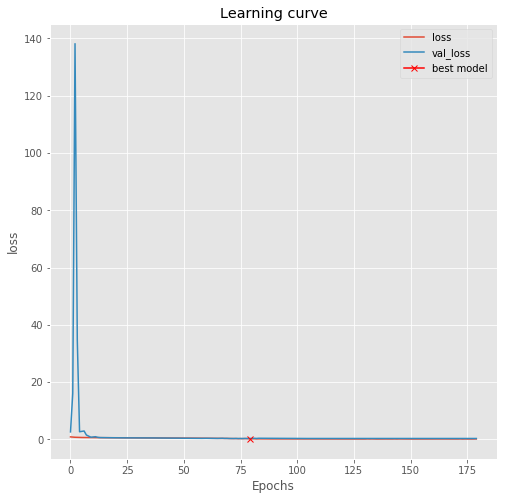

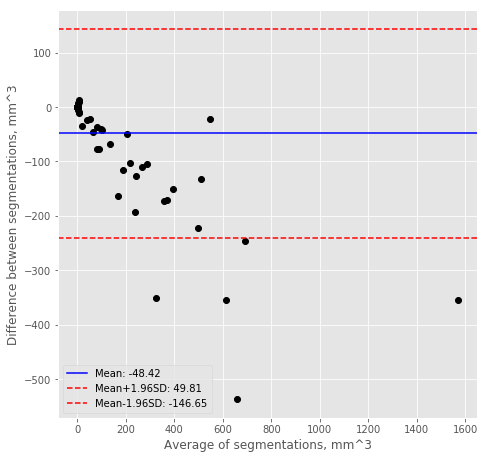


Validation
Voxel classification accuracy:  0.9945591517857143
Precision and recall:  (0.22233512213931292, 0.17972870810578198)
Dice score:  0.5381733237736198
Jaccard score:  0.36816125051419163
Volume difference (mean absolute, mean):  (54.86917340755463, 3.942544060094016)
Centroid distance:  3.372248130339924
Hausdorff distance:  5.605305933156086
Surface Dice score:  0.5958106312796908
Added path length:  824.5
Detection rate (per patient, per slice):  (0.5714285714285714, 0.8571428571428571)


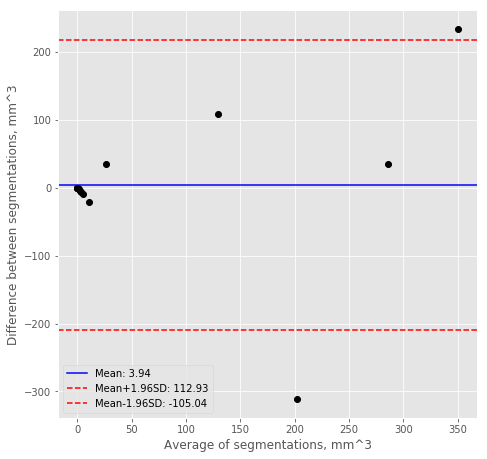


Test
Voxel classification accuracy:  0.9973945617675781
Precision and recall:  (0.17145702346461214, 0.28036563785150537)
Dice score:  0.6144727929555207
Jaccard score:  0.4435089625203695
Volume difference (mean absolute, mean):  (31.569437368710837, -27.935237542788187)
Centroid distance:  2.730869970773932
Hausdorff distance:  6.862030780624588
Surface Dice score:  0.79240798273379
Added path length:  233.6
Detection rate (per patient, per slice):  (0.6666666666666666, 0.875)


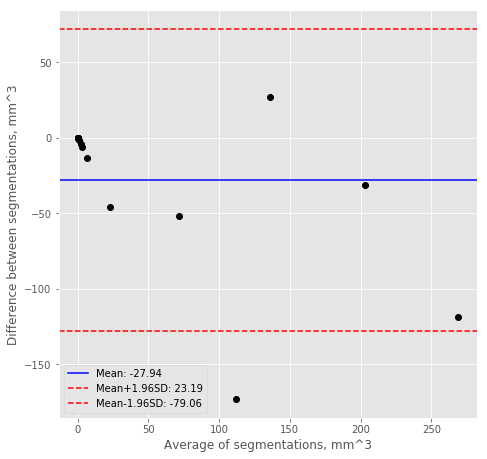

In [299]:
preds_train_iph_c2, preds_valid_iph_c2, preds_test_iph_c2 = train_evaluate_model('model_vessel-seg-3d_iph_cl2.h5',
                                                                                 custom_loss_2c,
                                                                                 X_train_iph, 
                                                                                 y_train_iph, 
                                                                                 X_valid_iph,
                                                                                 y_valid_iph, 
                                                                                 X_test_iph,
                                                                                 y_test_iph,
                                                                                 spacings_train_iph, 
                                                                                 spacings_valid_iph, 
                                                                                 spacings_test_iph)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


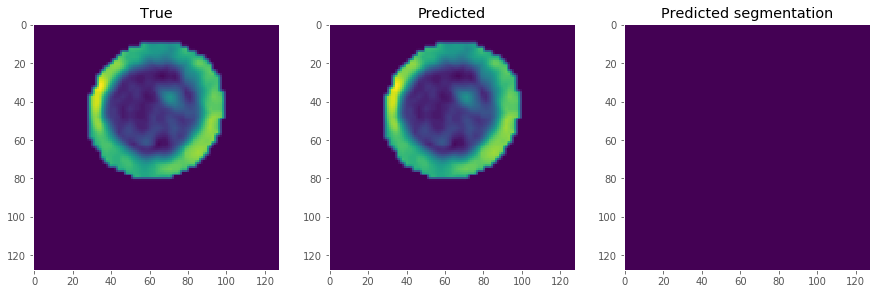

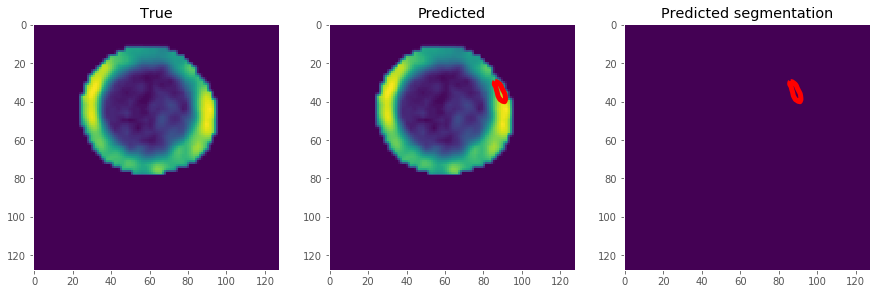

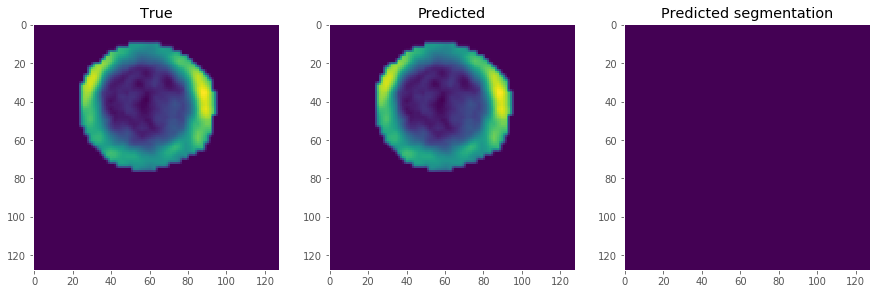

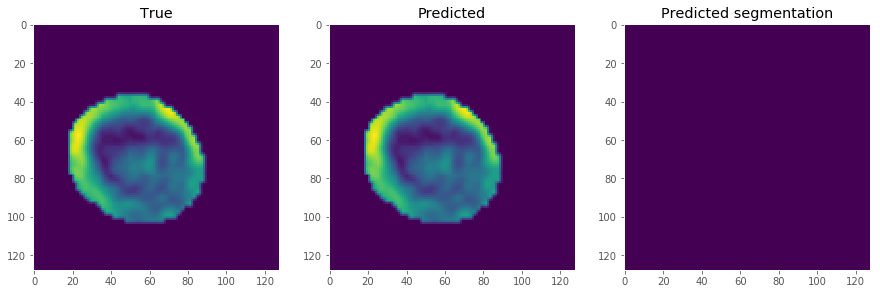

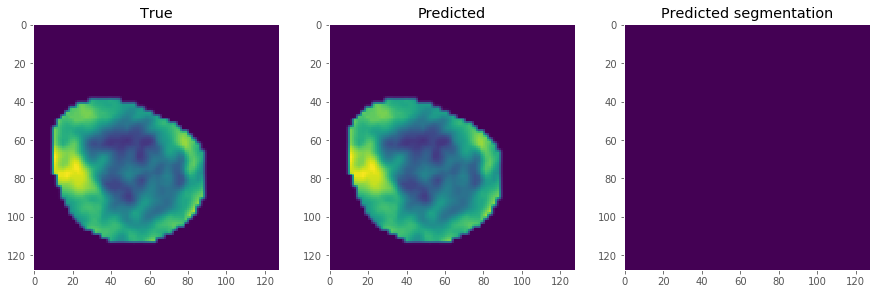

...

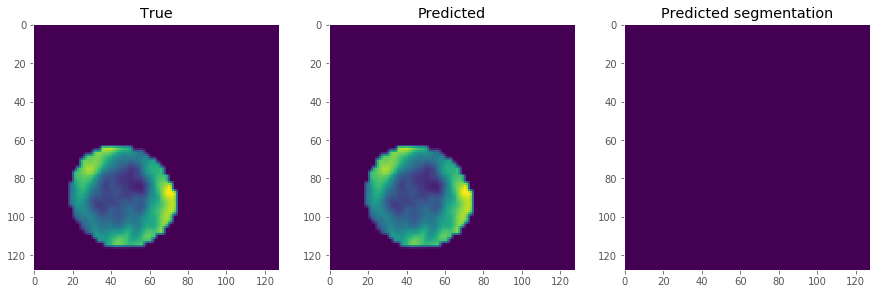

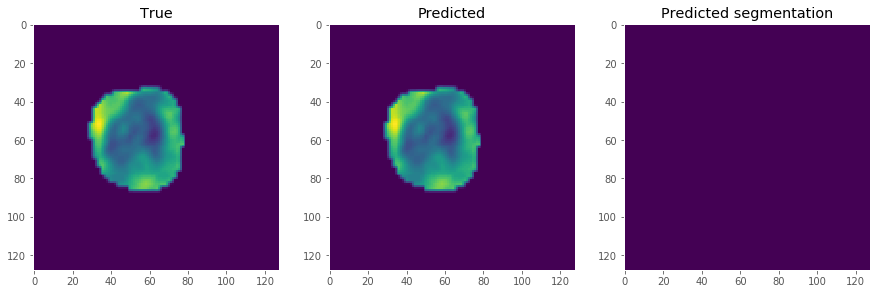

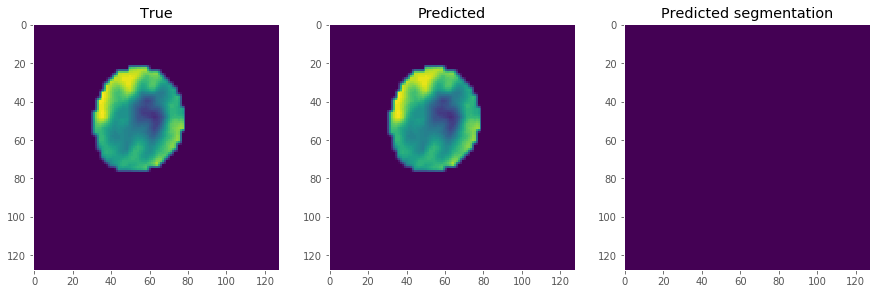

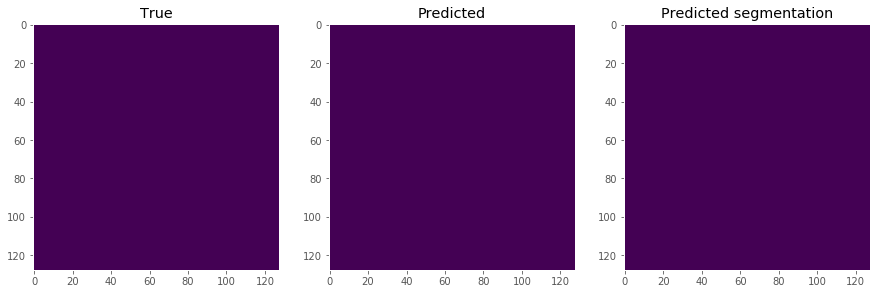

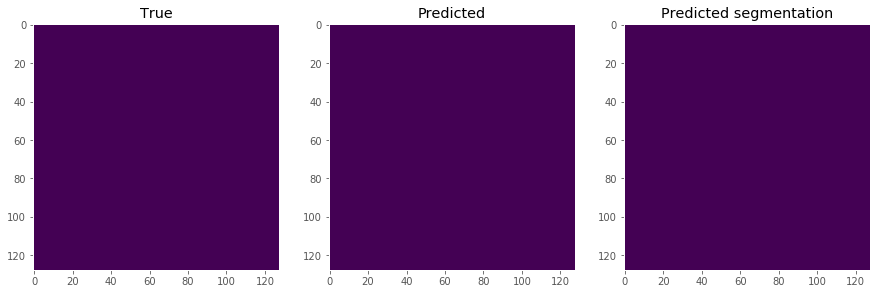

In [300]:
show_seg_slices(0, X_test_iph, y_test_iph, preds_test_iph_c2)

## Dice + volume difference

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_666 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_631 (BatchN (None, 16, 128, 128, 64          conv3d_666[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7686 - acc: 0.8506 - dice_coef: 0.1958
Epoch 00001: val_loss improved from inf to 0.84824, saving model to model_vessel-seg-3d_lumen_cl2_vol.h5
86/86 [==============================] - 185s 2s/sample - loss: 0.7692 - acc: 0.8524 - dice_coef: 0.1994 - val_loss: 0.8482 - val_acc: 0.3763 - val_dice_coef: 0.1640
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7115 - acc: 0.8869 - dice_coef: 0.2829
Epoch 00002: val_loss improved from 0.84824 to 0.78693, saving model to model_vessel-seg-3d_lumen_cl2_vol.h5
86/86 [==============================] - 4s 44ms/sample - loss: 0.7122 - acc: 0.8877 - dice_coef: 0.2817 - val_loss: 0.7869 - val_acc: 0.7120 - val_dice_coef: 0.2048
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6952 - acc: 0.9017 - dice_coef: 0.3002
Epoch 00003: val_loss improved from 0.78693 to 0.72954, saving model to model_ve

Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3112 - acc: 0.9898 - dice_coef: 0.6408
Epoch 00024: val_loss improved from 0.33926 to 0.30658, saving model to model_vessel-seg-3d_lumen_cl2_vol.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.3094 - acc: 0.9899 - dice_coef: 0.6466 - val_loss: 0.3066 - val_acc: 0.9880 - val_dice_coef: 0.6569
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2916 - acc: 0.9901 - dice_coef: 0.6586
Epoch 00025: val_loss did not improve from 0.30658
86/86 [==============================] - 3s 37ms/sample - loss: 0.2903 - acc: 0.9901 - dice_coef: 0.6615 - val_loss: 0.3114 - val_acc: 0.9868 - val_dice_coef: 0.6696
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2728 - acc: 0.9901 - dice_coef: 0.6751
Epoch 00026: val_loss improved from 0.30658 to 0.28668, saving model to model_vessel-seg-3d_lumen_cl2_vol.h5
86/86 [==============================] - 4s 44ms/sample - loss: 0.

86/86 [==============================] - 4s 41ms/sample - loss: 0.1019 - acc: 0.9898 - dice_coef: 0.8329 - val_loss: 0.1099 - val_acc: 0.9871 - val_dice_coef: 0.8125
Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0957 - acc: 0.9886 - dice_coef: 0.8264
Epoch 00047: val_loss improved from 0.10994 to 0.10719, saving model to model_vessel-seg-3d_lumen_cl2_vol.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.0979 - acc: 0.9888 - dice_coef: 0.8240 - val_loss: 0.1072 - val_acc: 0.9885 - val_dice_coef: 0.8307
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0923 - acc: 0.9904 - dice_coef: 0.8442
Epoch 00048: val_loss did not improve from 0.10719
86/86 [==============================] - 3s 37ms/sample - loss: 0.0929 - acc: 0.9904 - dice_coef: 0.8442 - val_loss: 0.1088 - val_acc: 0.9879 - val_dice_coef: 0.8280
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0877 - acc: 0.9893 - dice_coef: 0.8342
Epoch 000

Epoch 71/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0677 - acc: 0.9905 - dice_coef: 0.8797
Epoch 00071: val_loss improved from 0.07183 to 0.06700, saving model to model_vessel-seg-3d_lumen_cl2_vol.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.0694 - acc: 0.9907 - dice_coef: 0.8762 - val_loss: 0.0670 - val_acc: 0.9893 - val_dice_coef: 0.8903
Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0603 - acc: 0.9917 - dice_coef: 0.8911
Epoch 00072: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0617 - acc: 0.9917 - dice_coef: 0.8858 - val_loss: 0.1000 - val_acc: 0.9877 - val_dice_coef: 0.8514
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0691 - acc: 0.9907 - dice_coef: 0.8788
Epoch 00073: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0687 - acc: 0.9907 - dice_coef: 0.8805 - val_loss: 0.0757 

80/86 [==========================>...] - ETA: 0s - loss: 0.0500 - acc: 0.9922 - dice_coef: 0.9026
Epoch 00095: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0512 - acc: 0.9923 - dice_coef: 0.9005 - val_loss: 0.0755 - val_acc: 0.9893 - val_dice_coef: 0.8847
Epoch 96/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0512 - acc: 0.9923 - dice_coef: 0.9022
Epoch 00096: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0512 - acc: 0.9924 - dice_coef: 0.9021 - val_loss: 0.0803 - val_acc: 0.9893 - val_dice_coef: 0.8605
Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0510 - acc: 0.9922 - dice_coef: 0.9033
Epoch 00097: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0525 - acc: 0.9924 - dice_coef: 0.8997 - val_loss: 0.0765 - val_acc: 0.9893 - val_dice_coef: 0.8819
Epoch 98/250
80/86 [=========

Epoch 120/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0542 - acc: 0.9924 - dice_coef: 0.9018
Epoch 00120: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0540 - acc: 0.9924 - dice_coef: 0.9015 - val_loss: 0.0734 - val_acc: 0.9894 - val_dice_coef: 0.8781
Epoch 121/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0523 - acc: 0.9925 - dice_coef: 0.9034
Epoch 00121: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0523 - acc: 0.9924 - dice_coef: 0.9034 - val_loss: 0.0734 - val_acc: 0.9894 - val_dice_coef: 0.8850
Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0529 - acc: 0.9925 - dice_coef: 0.9019
Epoch 00122: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0528 - acc: 0.9924 - dice_coef: 0.9040 - val_loss: 0.0742 - val_acc: 0.9894 - val_dice_coef: 0.8849
Epoch 123/250

Epoch 145/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0495 - acc: 0.9924 - dice_coef: 0.9045
Epoch 00145: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0509 - acc: 0.9925 - dice_coef: 0.9015 - val_loss: 0.0731 - val_acc: 0.9894 - val_dice_coef: 0.8808
Epoch 146/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0522 - acc: 0.9924 - dice_coef: 0.9037
Epoch 00146: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0523 - acc: 0.9925 - dice_coef: 0.9046 - val_loss: 0.0791 - val_acc: 0.9894 - val_dice_coef: 0.7636
Epoch 147/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0512 - acc: 0.9924 - dice_coef: 0.9029
Epoch 00147: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0513 - acc: 0.9925 - dice_coef: 0.9026 - val_loss: 0.0737 - val_acc: 0.9893 - val_dice_coef: 0.8780
Epoch 148/250

Epoch 170/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0509 - acc: 0.9924 - dice_coef: 0.9050
Epoch 00170: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0517 - acc: 0.9924 - dice_coef: 0.9013 - val_loss: 0.0752 - val_acc: 0.9893 - val_dice_coef: 0.8694
Epoch 171/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0524 - acc: 0.9925 - dice_coef: 0.9030
Epoch 00171: val_loss did not improve from 0.06700
86/86 [==============================] - 3s 37ms/sample - loss: 0.0520 - acc: 0.9924 - dice_coef: 0.9048 - val_loss: 0.0755 - val_acc: 0.9893 - val_dice_coef: 0.8902
Epoch 00171: early stopping
12/12 [==============================] - 0s 15ms/sample

Train
Voxel classification accuracy:  0.9917697019355242
Precision and recall:  (0.9313456139018687, 0.9210626542487019)
Dice score:  0.9297119868475381
Jaccard score:  0.8686559366989957
Volume difference (mean absolute, mean):  (42.072849351306296, 12.618

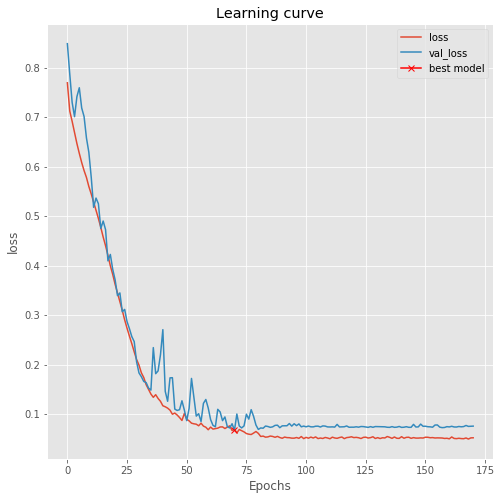

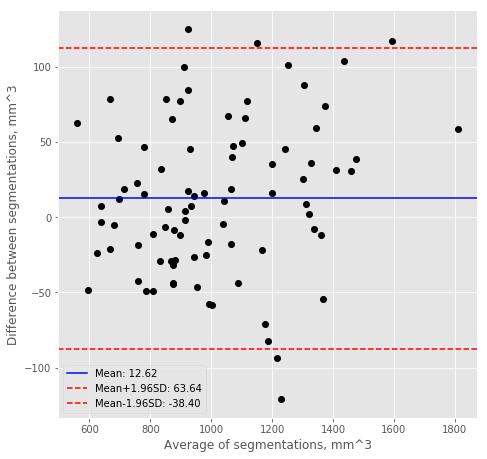


Validation
Voxel classification accuracy:  0.9893031400792739
Precision and recall:  (0.9327739629566283, 0.8696057929522738)
Dice score:  0.9042342253659771
Jaccard score:  0.8252079024948299
Volume difference (mean absolute, mean):  (95.314367778161, 71.06787843914593)
Centroid distance:  1.3227104202825029
Hausdorff distance:  0.9838410570672242
Surface Dice score:  0.9744797220524641
Added path length:  2313.0
Detection rate (per patient, per slice):  (1.0, 0.9816176470588235)


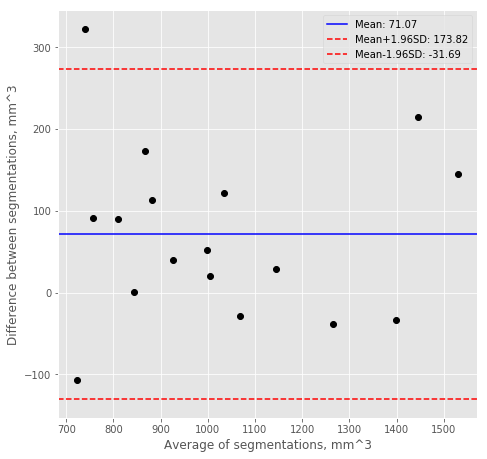


Test
Voxel classification accuracy:  0.9895156224568685
Precision and recall:  (0.9105832736801941, 0.912121768804849)
Dice score:  0.9107439582149333
Jaccard score:  0.8361159973365931
Volume difference (mean absolute, mean):  (50.23665510863066, -4.472363216181596)
Centroid distance:  0.394213663895093
Hausdorff distance:  0.6191232856951826
Surface Dice score:  0.9878715487147156
Added path length:  2138.0
Detection rate (per patient, per slice):  (1.0, 0.9947916666666666)


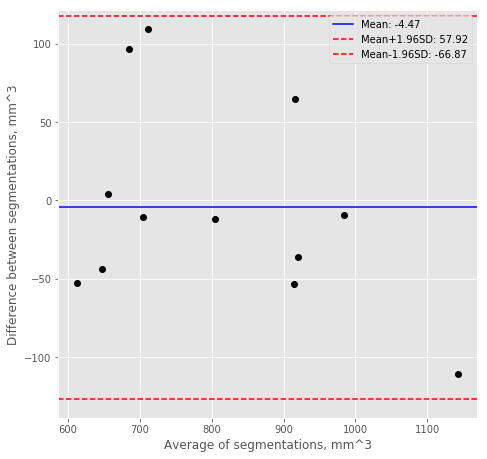

In [314]:
preds_train_lumen_c2_vol, preds_valid_lumen_c2_vol, preds_test_lumen_c2_vol = train_evaluate_model('model_vessel-seg-3d_lumen_cl2_vol.h5',
                                                                                       custom_loss_2c_vol,
                                                                                       X_train_lumen, 
                                                                                       y_train_lumen, 
                                                                                       X_valid_lumen, 
                                                                                       y_valid_lumen, 
                                                                                       X_test_lumen,
                                                                                       y_test_lumen,
                                                                                       spacings_train_lumen, 
                                                                                       spacings_valid_lumen, 
                                                                                       spacings_test_lumen)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


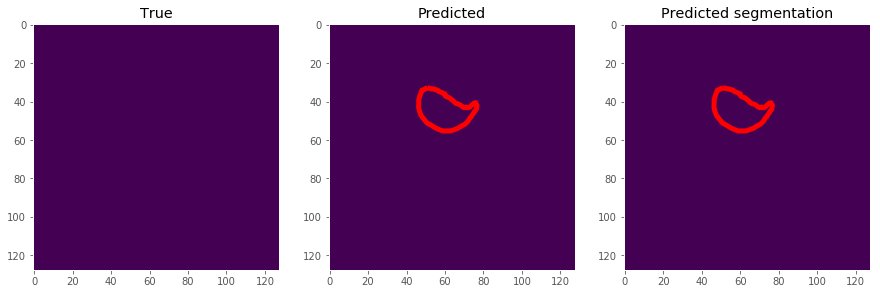

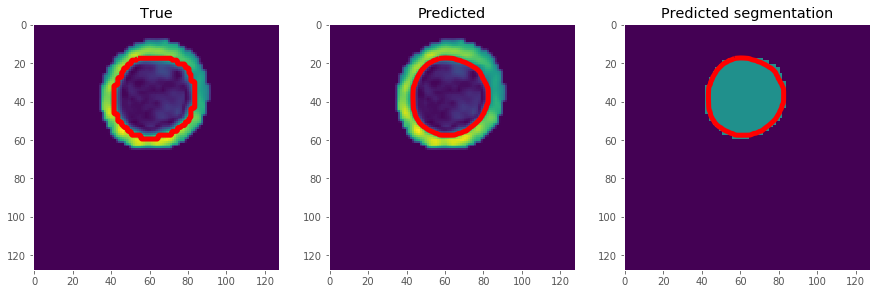

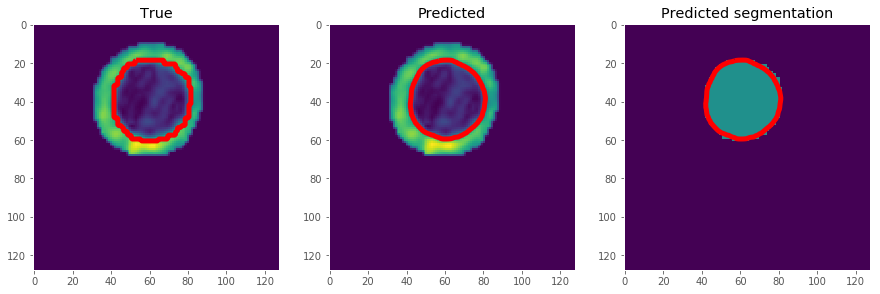

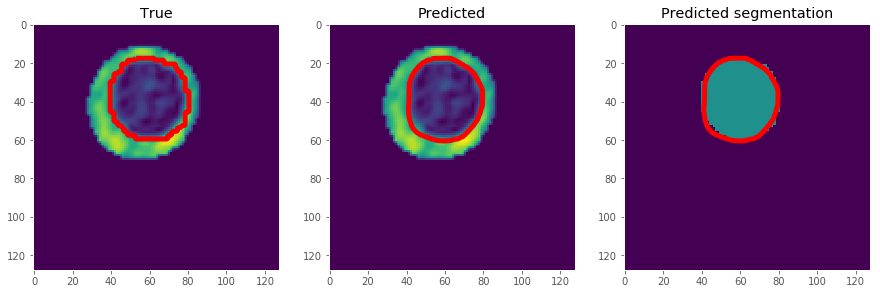

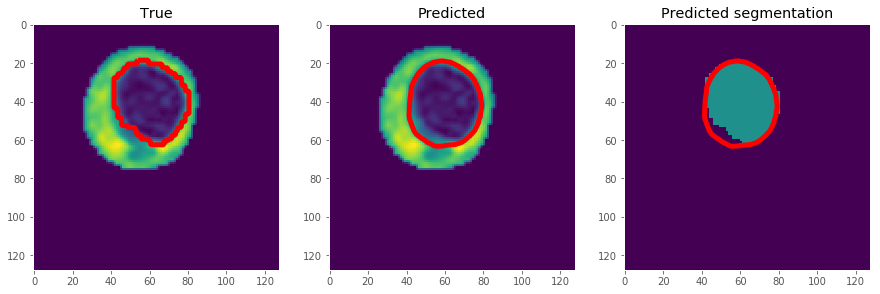

...

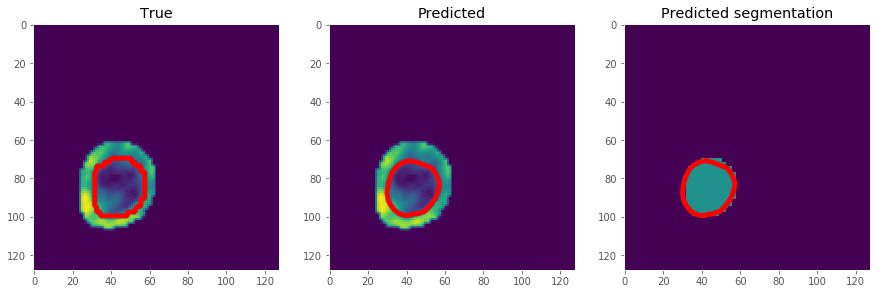

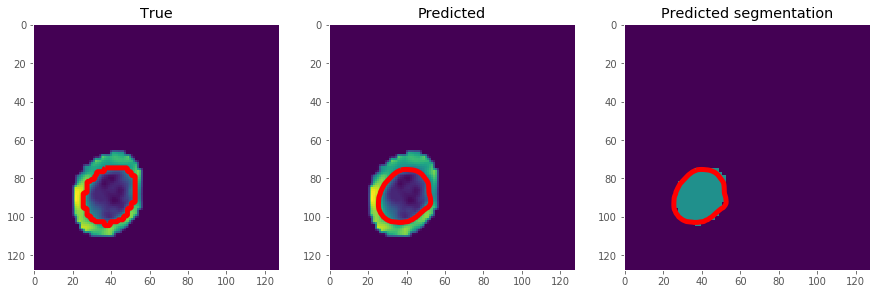

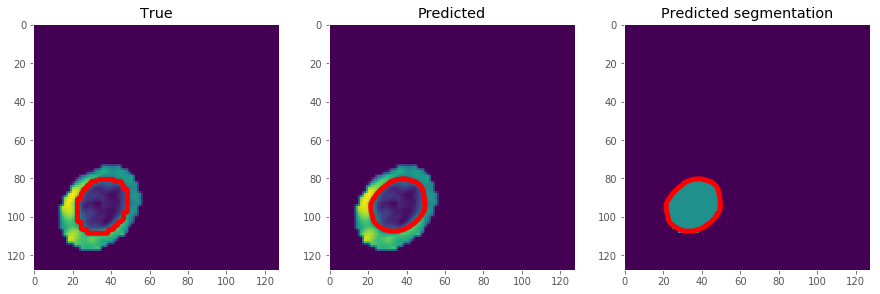

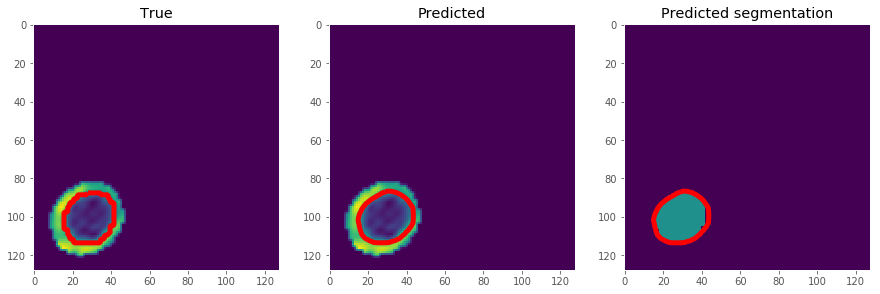

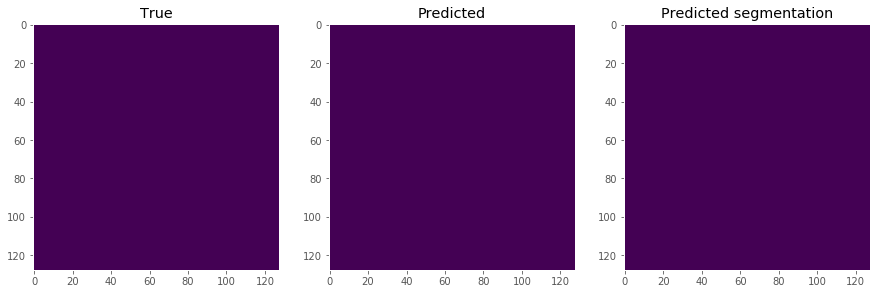

In [315]:
show_seg_slices(0, X_test_lumen, y_test_lumen, preds_test_lumen_c2_vol)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_36"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_685 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_649 (BatchN (None, 16, 128, 128, 64          conv3d_685[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9782 - acc: 0.9200 - dice_coef: 0.0156 
Epoch 00001: val_loss improved from inf to 0.98921, saving model to model_vessel-seg-3d_lipid_cl2_vol.h5
86/86 [==============================] - 197s 2s/sample - loss: 0.9770 - acc: 0.9153 - dice_coef: 0.0192 - val_loss: 0.9892 - val_acc: 0.5894 - val_dice_coef: 0.0350
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9666 - acc: 0.8686 - dice_coef: 0.0324
Epoch 00002: val_loss improved from 0.98921 to 0.98733, saving model to model_vessel-seg-3d_lipid_cl2_vol.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.9678 - acc: 0.8696 - dice_coef: 0.0296 - val_loss: 0.9873 - val_acc: 0.6657 - val_dice_coef: 0.0103
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9618 - acc: 0.9085 - dice_coef: 0.0368
Epoch 00003: val_loss did not improve from 0.98733
86/86 [=====================

80/86 [==========================>...] - ETA: 0s - loss: 0.7575 - acc: 0.9937 - dice_coef: 0.1594
Epoch 00024: val_loss improved from 0.92855 to 0.91236, saving model to model_vessel-seg-3d_lipid_cl2_vol.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.7695 - acc: 0.9940 - dice_coef: 0.1395 - val_loss: 0.9124 - val_acc: 0.9480 - val_dice_coef: 0.0725
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7371 - acc: 0.9937 - dice_coef: 0.1750
Epoch 00025: val_loss improved from 0.91236 to 0.86693, saving model to model_vessel-seg-3d_lipid_cl2_vol.h5
86/86 [==============================] - 4s 44ms/sample - loss: 0.7437 - acc: 0.9939 - dice_coef: 0.1604 - val_loss: 0.8669 - val_acc: 0.9879 - val_dice_coef: 0.1792
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7035 - acc: 0.9948 - dice_coef: 0.1851
Epoch 00026: val_loss improved from 0.86693 to 0.82022, saving model to model_vessel-seg-3d_lipid_cl2_vol.h5
86/86 [==============

Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4489 - acc: 0.9952 - dice_coef: 0.2605
Epoch 00048: val_loss did not improve from 0.58545
86/86 [==============================] - 3s 37ms/sample - loss: 0.4499 - acc: 0.9953 - dice_coef: 0.2695 - val_loss: 0.6254 - val_acc: 0.9938 - val_dice_coef: 0.0378
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4905 - acc: 0.9958 - dice_coef: 0.2368
Epoch 00049: val_loss did not improve from 0.58545
86/86 [==============================] - 3s 37ms/sample - loss: 0.4909 - acc: 0.9957 - dice_coef: 0.2171 - val_loss: 0.7406 - val_acc: 0.9882 - val_dice_coef: 0.0968
Epoch 50/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4466 - acc: 0.9957 - dice_coef: 0.2594
Epoch 00050: val_loss did not improve from 0.58545
86/86 [==============================] - 3s 37ms/sample - loss: 0.4468 - acc: 0.9956 - dice_coef: 0.2428 - val_loss: 0.7133 - val_acc: 0.9916 - val_dice_coef: 0.0780
Epoch 51/250
80/

Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3564 - acc: 0.9959 - dice_coef: 0.3442
Epoch 00072: val_loss did not improve from 0.49432
86/86 [==============================] - 3s 37ms/sample - loss: 0.3631 - acc: 0.9958 - dice_coef: 0.3251 - val_loss: 0.5229 - val_acc: 0.9951 - val_dice_coef: 0.0216
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3796 - acc: 0.9957 - dice_coef: 0.3418
Epoch 00073: val_loss did not improve from 0.49432
86/86 [==============================] - 3s 37ms/sample - loss: 0.3957 - acc: 0.9958 - dice_coef: 0.2858 - val_loss: 0.5483 - val_acc: 0.9954 - val_dice_coef: 0.0118
Epoch 74/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3831 - acc: 0.9959 - dice_coef: 0.3004
Epoch 00074: val_loss did not improve from 0.49432
86/86 [==============================] - 3s 37ms/sample - loss: 0.3920 - acc: 0.9961 - dice_coef: 0.2582 - val_loss: 0.5353 - val_acc: 0.9956 - val_dice_coef: 0.0137
Epoch 75/250
80/

Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3866 - acc: 0.9957 - dice_coef: 0.3123
Epoch 00097: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 37ms/sample - loss: 0.3942 - acc: 0.9959 - dice_coef: 0.2815 - val_loss: 0.5531 - val_acc: 0.9954 - val_dice_coef: 0.0165
Epoch 98/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3838 - acc: 0.9958 - dice_coef: 0.3205
Epoch 00098: ReduceLROnPlateau reducing learning rate to 1e-05.

Epoch 00098: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 37ms/sample - loss: 0.3773 - acc: 0.9959 - dice_coef: 0.3550 - val_loss: 0.5589 - val_acc: 0.9955 - val_dice_coef: 0.0157
Epoch 99/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4202 - acc: 0.9960 - dice_coef: 0.2883
Epoch 00099: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 37ms/sample - loss: 0.4102 - acc: 0.9960 - dice_coef: 0.3188 - val_loss: 

Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3557 - acc: 0.9959 - dice_coef: 0.3347
Epoch 00122: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 37ms/sample - loss: 0.3533 - acc: 0.9959 - dice_coef: 0.3446 - val_loss: 0.6016 - val_acc: 0.9956 - val_dice_coef: 0.0142
Epoch 123/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3499 - acc: 0.9958 - dice_coef: 0.3397
Epoch 00123: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 37ms/sample - loss: 0.3614 - acc: 0.9960 - dice_coef: 0.2891 - val_loss: 0.5488 - val_acc: 0.9956 - val_dice_coef: 0.0382
Epoch 124/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3999 - acc: 0.9958 - dice_coef: 0.2758
Epoch 00124: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 37ms/sample - loss: 0.4165 - acc: 0.9961 - dice_coef: 0.2301 - val_loss: 0.5556 - val_acc: 0.9956 - val_dice_coef: 0.0151
Epoch 125/250

Epoch 147/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3760 - acc: 0.9962 - dice_coef: 0.3261
Epoch 00147: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 37ms/sample - loss: 0.3777 - acc: 0.9960 - dice_coef: 0.3219 - val_loss: 0.5436 - val_acc: 0.9955 - val_dice_coef: 0.0166
Epoch 148/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3824 - acc: 0.9959 - dice_coef: 0.3269
Epoch 00148: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 38ms/sample - loss: 0.3897 - acc: 0.9960 - dice_coef: 0.2931 - val_loss: 0.5354 - val_acc: 0.9955 - val_dice_coef: 0.0513
Epoch 149/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3484 - acc: 0.9964 - dice_coef: 0.3422
Epoch 00149: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 37ms/sample - loss: 0.3527 - acc: 0.9960 - dice_coef: 0.3389 - val_loss: 0.5236 - val_acc: 0.9954 - val_dice_coef: 0.0197
Epoch 150/250

Epoch 172/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3586 - acc: 0.9960 - dice_coef: 0.3388
Epoch 00172: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 37ms/sample - loss: 0.3584 - acc: 0.9959 - dice_coef: 0.3404 - val_loss: 0.5254 - val_acc: 0.9954 - val_dice_coef: 0.0250
Epoch 173/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3495 - acc: 0.9957 - dice_coef: 0.3449
Epoch 00173: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 37ms/sample - loss: 0.3763 - acc: 0.9959 - dice_coef: 0.2936 - val_loss: 0.5564 - val_acc: 0.9954 - val_dice_coef: 0.0530
Epoch 174/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3655 - acc: 0.9959 - dice_coef: 0.3155
Epoch 00174: val_loss did not improve from 0.48249
86/86 [==============================] - 3s 37ms/sample - loss: 0.3607 - acc: 0.9959 - dice_coef: 0.3494 - val_loss: 0.5936 - val_acc: 0.9955 - val_dice_coef: 0.0181
Epoch 175/250

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.09677572356971696, 0.09946848064925101)
Dice score:  0.4361100379978204
Jaccard score:  0.27886501393661417
Volume difference (mean absolute, mean):  (41.15692073557266, 18.20251396194447)
Centroid distance:  5.18201780885553
Hausdorff distance:  4.870430206573414
Surface Dice score:  0.6468184859079741
Added path length:  782.1627906976744
Detection rate (per patient, per slice):  (0.6395348837209303, 0.8648255813953488)


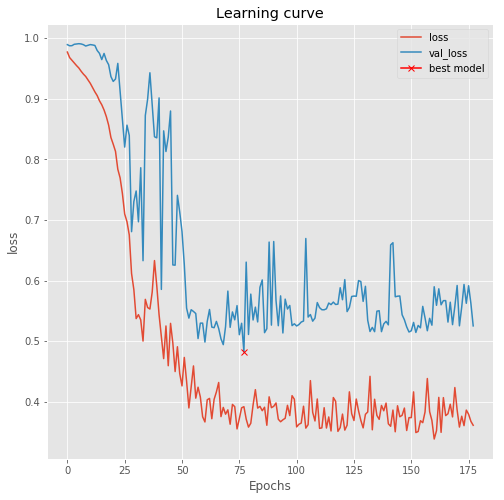

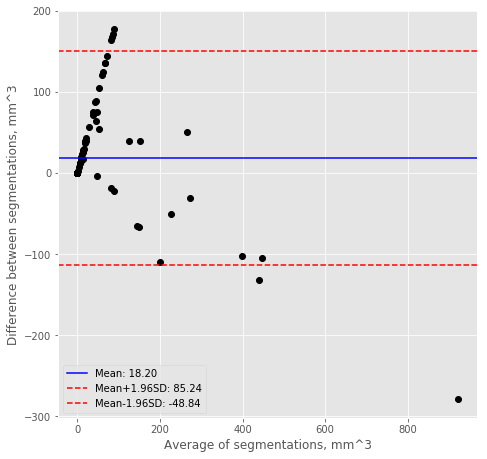


Validation
Voxel classification accuracy:  0.995234769933364
Precision and recall:  (0.05087805330304136, 0.017162948938914995)
Dice score:  0.03678505012019776
Jaccard score:  0.018759818870714352
Volume difference (mean absolute, mean):  (98.01667859799721, 63.10740812911707)
Centroid distance:  6.021206804401087
Hausdorff distance:  8.764228602526
Surface Dice score:  0.33708334702320786
Added path length:  828.1176470588235
Detection rate (per patient, per slice):  (0.5882352941176471, 0.8014705882352942)


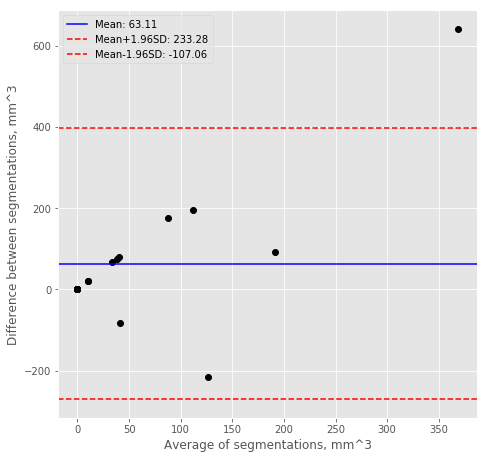


Test
Voxel classification accuracy:  0.9960775375366211
Precision and recall:  (0.08227848101265824, 0.0012680452594615685)
Dice score:  0.012564020486555695
Jaccard score:  0.006361732968271863
Volume difference (mean absolute, mean):  (69.11242173612118, 58.85913473864397)
Centroid distance:  3.514045633223592
Hausdorff distance:  13.543866714567699
Surface Dice score:  0.09704826651209836
Added path length:  866.9166666666666
Detection rate (per patient, per slice):  (0.5, 0.7291666666666666)


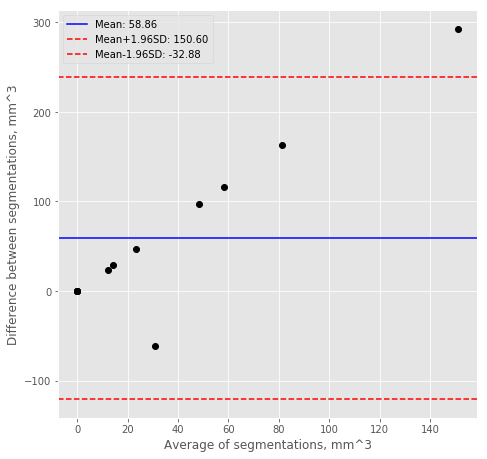

In [317]:
preds_train_lipid_c2_vol, preds_valid_lipid_c2_vol, preds_test_lipid_c2_vol = train_evaluate_model('model_vessel-seg-3d_lipid_cl2_vol.h5',
                                                                                       custom_loss_2c_vol, 
                                                                                       X_train_lipid, 
                                                                                       y_train_lipid, 
                                                                                       X_valid_lipid, 
                                                                                       y_valid_lipid, 
                                                                                       X_test_lipid, 
                                                                                       y_test_lipid,
                                                                                       spacings_train_lipid,
                                                                                       spacings_valid_lipid,
                                                                                       spacings_test_lipid)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


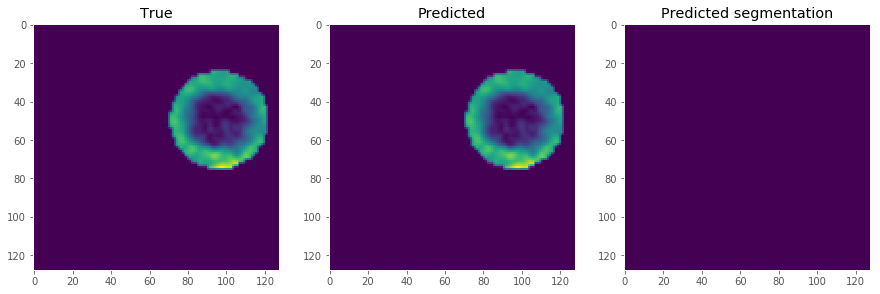

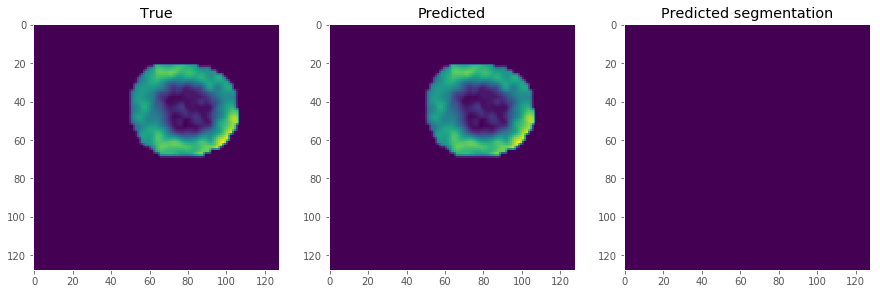

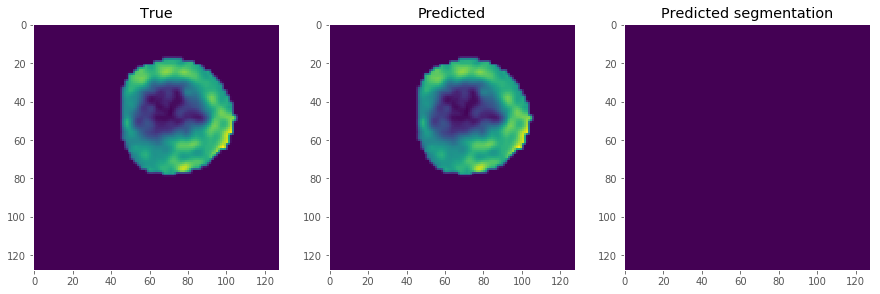

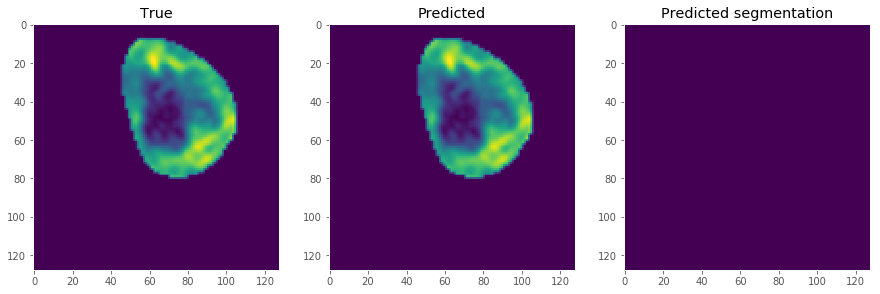

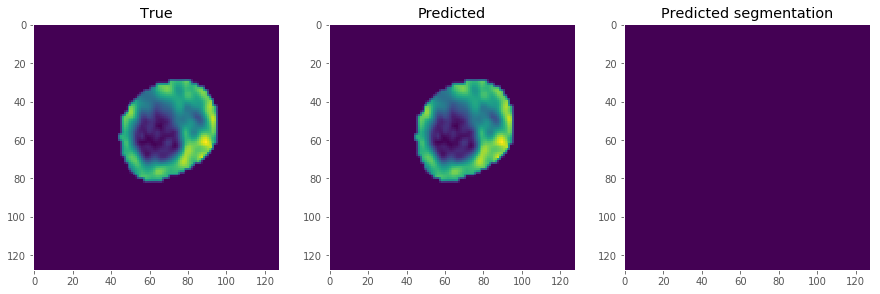

...

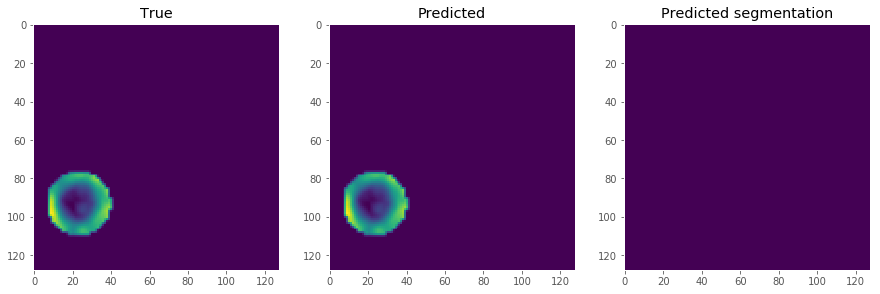

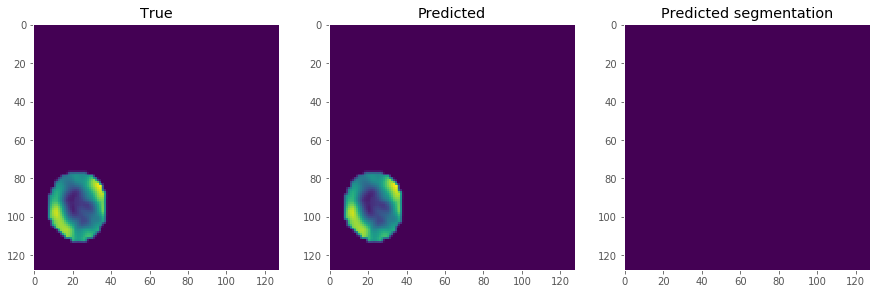

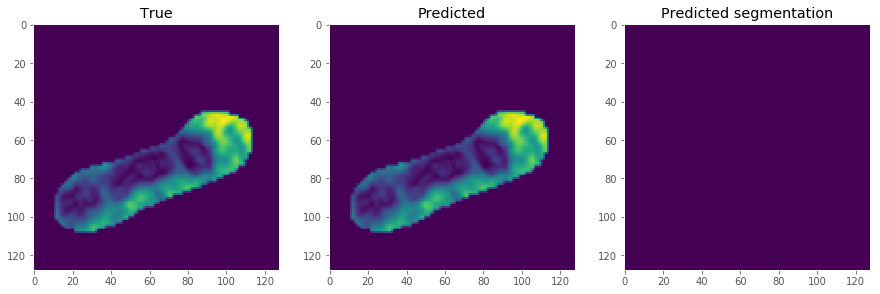

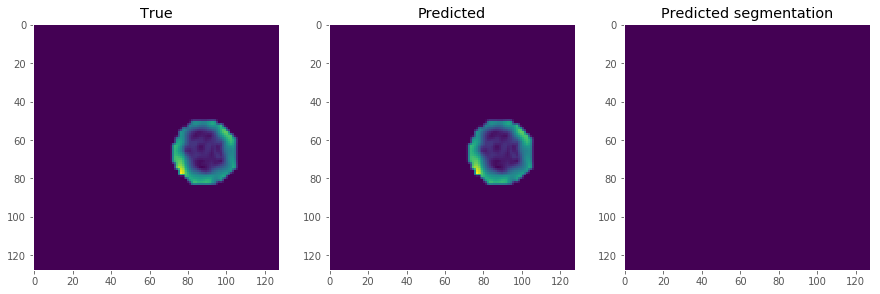

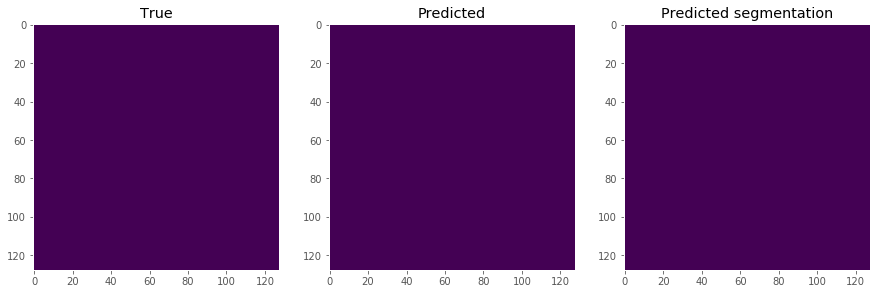

In [318]:
show_seg_slices(0, X_test_lipid, y_test_lipid, preds_test_lipid_c2_vol)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_37"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_704 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_667 (BatchN (None, 16, 128, 128, 64          conv3d_704[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9795 - acc: 0.7891 - dice_coef: 0.0179
Epoch 00001: val_loss improved from inf to 0.98533, saving model to model_vessel-seg-3d_calc_cl2_vol.h5
86/86 [==============================] - 202s 2s/sample - loss: 0.9792 - acc: 0.7902 - dice_coef: 0.0190 - val_loss: 0.9853 - val_acc: 0.3022 - val_dice_coef: 0.0140
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9726 - acc: 0.8222 - dice_coef: 0.0271
Epoch 00002: val_loss improved from 0.98533 to 0.98476, saving model to model_vessel-seg-3d_calc_cl2_vol.h5
86/86 [==============================] - 4s 46ms/sample - loss: 0.9728 - acc: 0.8216 - dice_coef: 0.0267 - val_loss: 0.9848 - val_acc: 0.4123 - val_dice_coef: 0.0083
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9697 - acc: 0.8115 - dice_coef: 0.0301
Epoch 00003: val_loss improved from 0.98476 to 0.98129, saving model to model_vess

Epoch 23/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8656 - acc: 0.9876 - dice_coef: 0.0970
Epoch 00023: val_loss did not improve from 0.83370
86/86 [==============================] - 3s 37ms/sample - loss: 0.8710 - acc: 0.9880 - dice_coef: 0.0879 - val_loss: 0.8434 - val_acc: 0.9943 - val_dice_coef: 0.0141
Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8520 - acc: 0.9892 - dice_coef: 0.1059
Epoch 00024: val_loss improved from 0.83370 to 0.76329, saving model to model_vessel-seg-3d_calc_cl2_vol.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.8520 - acc: 0.9893 - dice_coef: 0.1064 - val_loss: 0.7633 - val_acc: 0.9946 - val_dice_coef: 0.0018
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8306 - acc: 0.9919 - dice_coef: 0.1036
Epoch 00025: val_loss did not improve from 0.76329
86/86 [==============================] - 3s 37ms/sample - loss: 0.8366 - acc: 0.9923 - dice_coef: 0.0962 - val_loss: 0.8133 -

Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4319 - acc: 0.9954 - dice_coef: 0.2192
Epoch 00047: val_loss did not improve from 0.47631
86/86 [==============================] - 3s 38ms/sample - loss: 0.4426 - acc: 0.9956 - dice_coef: 0.2071 - val_loss: 0.4947 - val_acc: 0.9926 - val_dice_coef: 0.1729
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4365 - acc: 0.9956 - dice_coef: 0.2351
Epoch 00048: val_loss improved from 0.47631 to 0.44677, saving model to model_vessel-seg-3d_calc_cl2_vol.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.4294 - acc: 0.9955 - dice_coef: 0.2553 - val_loss: 0.4468 - val_acc: 0.9938 - val_dice_coef: 0.3006
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3882 - acc: 0.9954 - dice_coef: 0.2618
Epoch 00049: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 37ms/sample - loss: 0.3936 - acc: 0.9954 - dice_coef: 0.2704 - val_loss: 0.4661 -

Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3910 - acc: 0.9954 - dice_coef: 0.3011
Epoch 00072: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 37ms/sample - loss: 0.3980 - acc: 0.9956 - dice_coef: 0.2978 - val_loss: 0.5070 - val_acc: 0.9947 - val_dice_coef: 0.1509
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3790 - acc: 0.9955 - dice_coef: 0.3066
Epoch 00073: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 37ms/sample - loss: 0.3889 - acc: 0.9956 - dice_coef: 0.2832 - val_loss: 0.5641 - val_acc: 0.9948 - val_dice_coef: 0.0803
Epoch 74/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3647 - acc: 0.9955 - dice_coef: 0.2954
Epoch 00074: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 37ms/sample - loss: 0.3685 - acc: 0.9956 - dice_coef: 0.2936 - val_loss: 0.5663 - val_acc: 0.9948 - val_dice_coef: 0.0795
Epoch 75/250
80/

Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3686 - acc: 0.9956 - dice_coef: 0.3034
Epoch 00097: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 37ms/sample - loss: 0.3670 - acc: 0.9956 - dice_coef: 0.3075 - val_loss: 0.4903 - val_acc: 0.9947 - val_dice_coef: 0.1637
Epoch 98/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3786 - acc: 0.9955 - dice_coef: 0.2868
Epoch 00098: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 37ms/sample - loss: 0.3817 - acc: 0.9956 - dice_coef: 0.2925 - val_loss: 0.5191 - val_acc: 0.9947 - val_dice_coef: 0.2708
Epoch 99/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3777 - acc: 0.9957 - dice_coef: 0.3052
Epoch 00099: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 37ms/sample - loss: 0.3769 - acc: 0.9956 - dice_coef: 0.3049 - val_loss: 0.5147 - val_acc: 0.9947 - val_dice_coef: 0.0985
Epoch 100/250
80

Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3715 - acc: 0.9956 - dice_coef: 0.3164
Epoch 00122: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 37ms/sample - loss: 0.3791 - acc: 0.9956 - dice_coef: 0.2910 - val_loss: 0.5132 - val_acc: 0.9947 - val_dice_coef: 0.1020
Epoch 123/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3729 - acc: 0.9957 - dice_coef: 0.2955
Epoch 00123: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 37ms/sample - loss: 0.3709 - acc: 0.9956 - dice_coef: 0.3041 - val_loss: 0.5068 - val_acc: 0.9947 - val_dice_coef: 0.1053
Epoch 124/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3731 - acc: 0.9956 - dice_coef: 0.3110
Epoch 00124: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 37ms/sample - loss: 0.3760 - acc: 0.9956 - dice_coef: 0.3059 - val_loss: 0.5025 - val_acc: 0.9947 - val_dice_coef: 0.1114
Epoch 125/250

Epoch 147/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3690 - acc: 0.9957 - dice_coef: 0.3062
Epoch 00147: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 38ms/sample - loss: 0.3665 - acc: 0.9956 - dice_coef: 0.3140 - val_loss: 0.5193 - val_acc: 0.9947 - val_dice_coef: 0.1023
Epoch 148/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3738 - acc: 0.9957 - dice_coef: 0.3011
Epoch 00148: val_loss did not improve from 0.44677
86/86 [==============================] - 3s 37ms/sample - loss: 0.3751 - acc: 0.9956 - dice_coef: 0.2982 - val_loss: 0.5358 - val_acc: 0.9947 - val_dice_coef: 0.0852
Epoch 00148: early stopping
12/12 [==============================] - 0s 17ms/sample

Train
Voxel classification accuracy:  0.9941845383754996


C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.25406357567762305, 0.21167807891684243)
Dice score:  0.33329265129902824
Jaccard score:  0.19997315059465343
Volume difference (mean absolute, mean):  (43.08636035614236, 11.884148984454399)
Centroid distance:  6.418421874294728
Hausdorff distance:  8.378622309778757
Surface Dice score:  0.3840041645354765
Added path length:  922.4651162790698
Detection rate (per patient, per slice):  (0.9418604651162791, 0.7507267441860465)


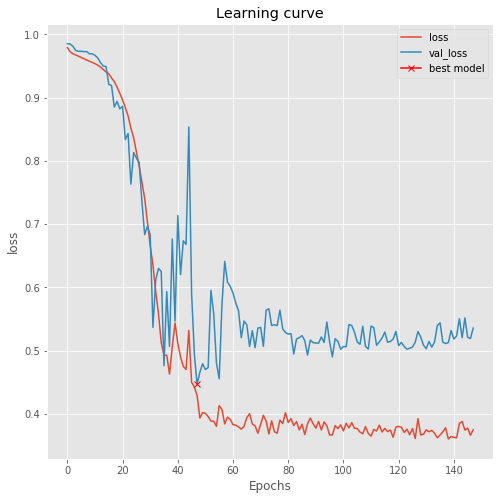

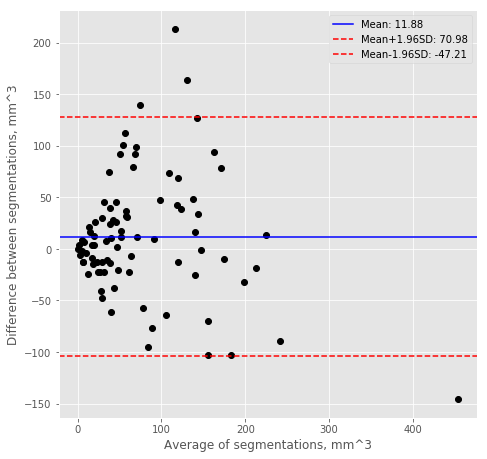


Validation
Voxel classification accuracy:  0.9937526478486902
Precision and recall:  (0.22893119920472252, 0.1106145844088971)
Dice score:  0.2101395823876532
Jaccard score:  0.11741955935964495
Volume difference (mean absolute, mean):  (68.89593265337102, 55.91939638993319)
Centroid distance:  6.967889754385239
Hausdorff distance:  10.406571229640502
Surface Dice score:  0.25168925331477066
Added path length:  1192.1176470588234
Detection rate (per patient, per slice):  (0.8823529411764706, 0.6433823529411765)


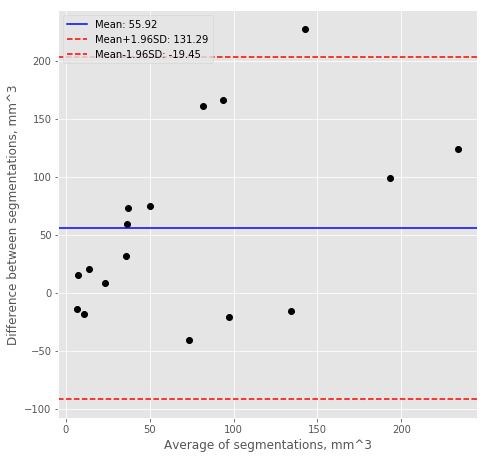


Test
Voxel classification accuracy:  0.9933516184488932
Precision and recall:  (0.1963911112912292, 0.1668987724183458)
Dice score:  0.2157936180584199
Jaccard score:  0.12096503026227307
Volume difference (mean absolute, mean):  (54.88703513393799, 3.507966739435991)
Centroid distance:  5.371054180779393
Hausdorff distance:  8.784861388928961
Surface Dice score:  0.41467392090448657
Added path length:  839.8333333333334
Detection rate (per patient, per slice):  (0.9166666666666666, 0.6979166666666666)


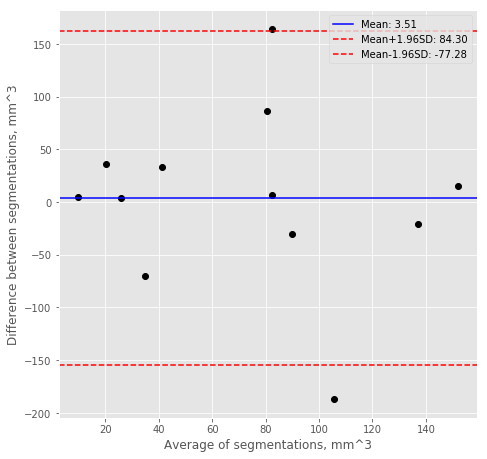

In [319]:
preds_train_calc_c2_vol, preds_valid_calc_c2_vol, preds_test_calc_c2_vol = train_evaluate_model('model_vessel-seg-3d_calc_cl2_vol.h5',
                                                                                    custom_loss_2c_vol,
                                                                                    X_train_calc, 
                                                                                    y_train_calc, 
                                                                                    X_valid_calc,
                                                                                    y_valid_calc, 
                                                                                    X_test_calc,
                                                                                    y_test_calc,
                                                                                    spacings_train_calc, 
                                                                                    spacings_valid_calc, 
                                                                                    spacings_test_calc)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


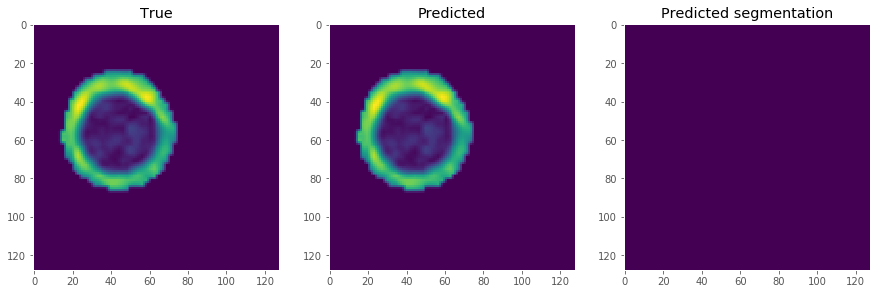

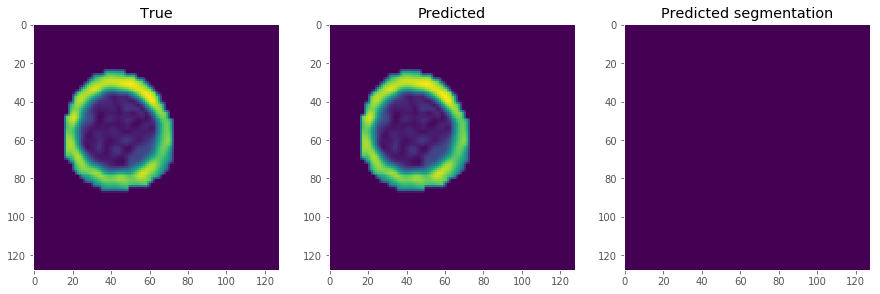

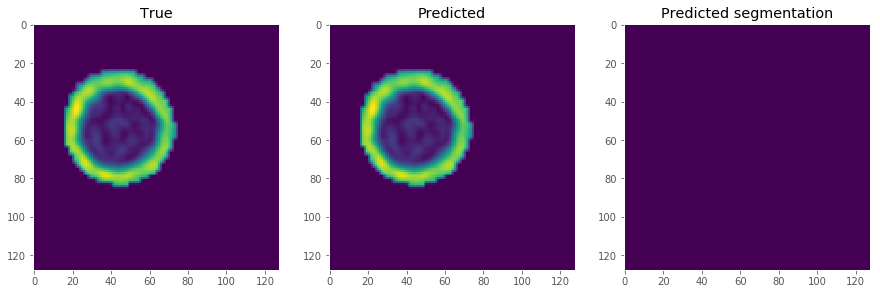

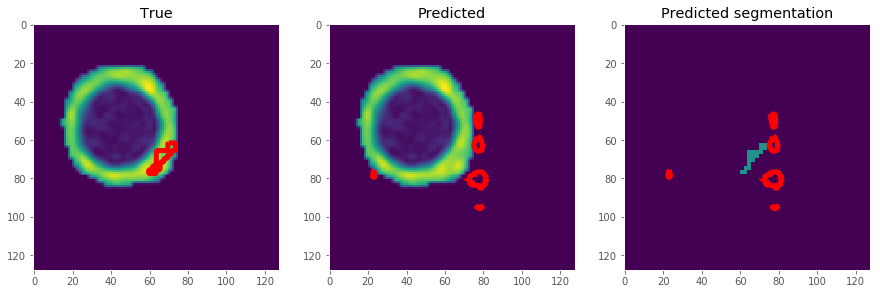

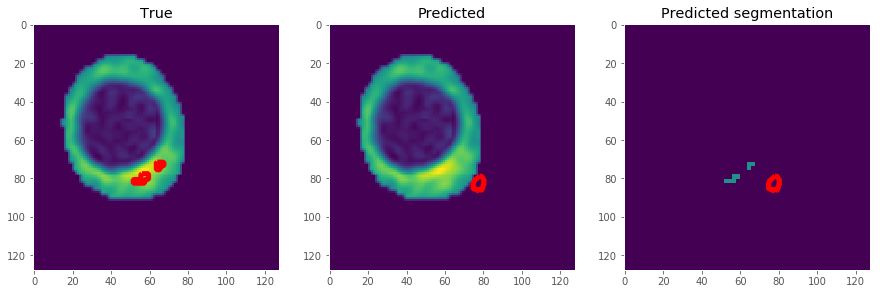

...

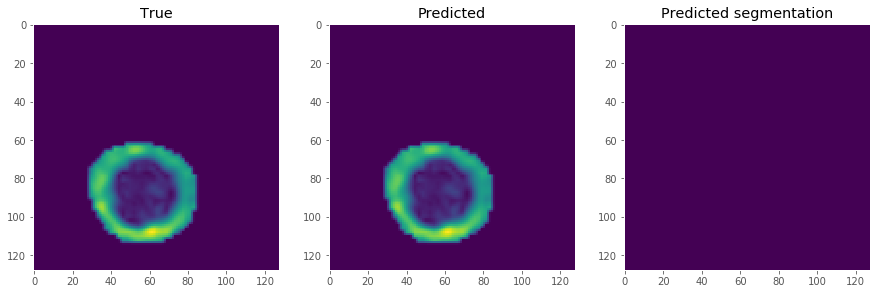

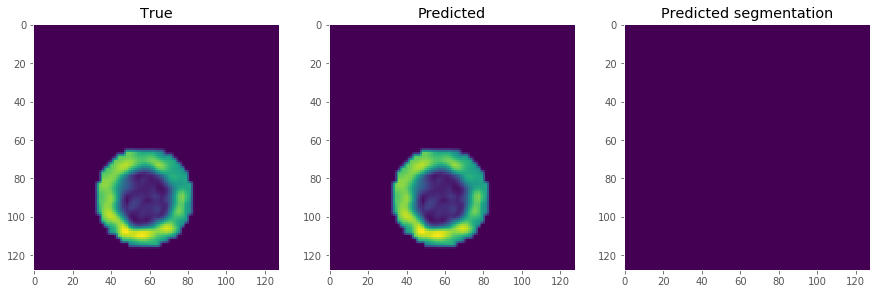

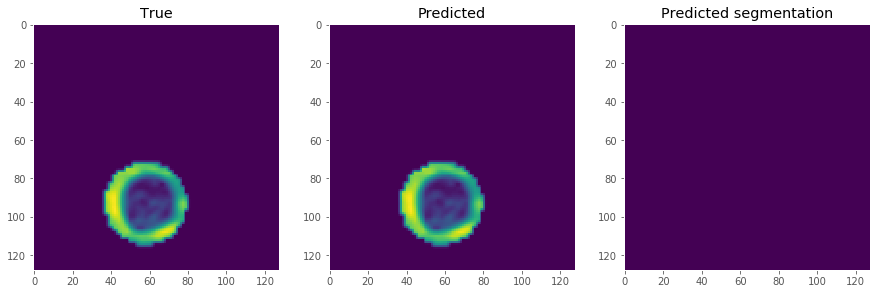

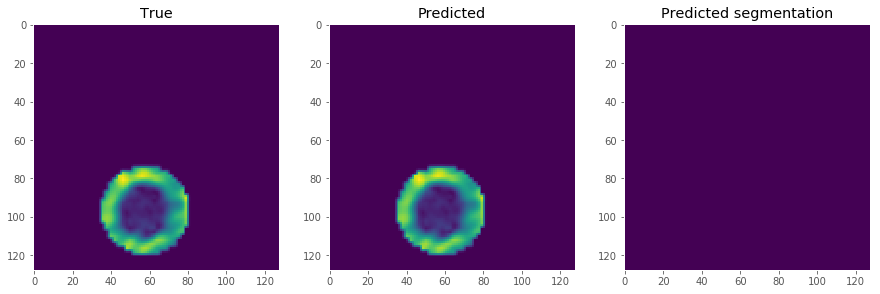

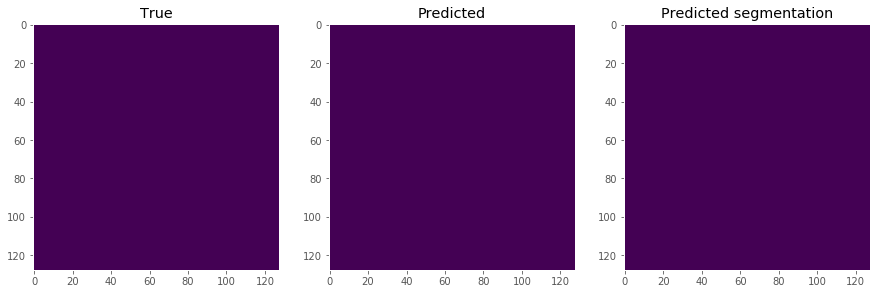

In [320]:
show_seg_slices(0, X_test_calc, y_test_calc, preds_test_calc_c2_vol)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_38"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_723 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_685 (BatchN (None, 16, 128, 128, 64          conv3d_723[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 14 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9843 - acc: 0.8059 - dice_coef: 0.0152
Epoch 00001: val_loss improved from inf to 0.98086, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 219s 3s/sample - loss: 0.9842 - acc: 0.8076 - dice_coef: 0.0154 - val_loss: 0.9809 - val_acc: 0.5429 - val_dice_coef: 0.0191
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9873 - acc: 0.8184 - dice_coef: 0.0126
Epoch 00002: val_loss improved from 0.98086 to 0.97846, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.9812 - acc: 0.8174 - dice_coef: 0.0274 - val_loss: 0.9785 - val_acc: 0.6889 - val_dice_coef: 0.0215
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9782 - acc: 0.8369 - dice_coef: 0.0218
Epoch 00003: val_loss improved from 0.97846 to 0.97436, saving model to model_vessel

80/86 [==========================>...] - ETA: 0s - loss: 0.9631 - acc: 0.9823 - dice_coef: 0.0364
Epoch 00024: val_loss did not improve from 0.95271
86/86 [==============================] - 3s 36ms/sample - loss: 0.9594 - acc: 0.9829 - dice_coef: 0.0449 - val_loss: 0.9528 - val_acc: 0.8827 - val_dice_coef: 0.0467
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9585 - acc: 0.9835 - dice_coef: 0.0410
Epoch 00025: val_loss improved from 0.95271 to 0.94760, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.9591 - acc: 0.9833 - dice_coef: 0.0394 - val_loss: 0.9476 - val_acc: 0.9141 - val_dice_coef: 0.0516
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9595 - acc: 0.9849 - dice_coef: 0.0399
Epoch 00026: val_loss improved from 0.94760 to 0.94241, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 3s 41ms/sample - loss: 0.9586 - acc: 0.984

80/86 [==========================>...] - ETA: 0s - loss: 0.9511 - acc: 0.9924 - dice_coef: 0.0481
Epoch 00046: val_loss improved from 0.92469 to 0.92397, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.9530 - acc: 0.9923 - dice_coef: 0.0437 - val_loss: 0.9240 - val_acc: 0.9893 - val_dice_coef: 0.0681
Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9573 - acc: 0.9919 - dice_coef: 0.0423
Epoch 00047: val_loss did not improve from 0.92397
86/86 [==============================] - 3s 36ms/sample - loss: 0.9525 - acc: 0.9919 - dice_coef: 0.0534 - val_loss: 0.9246 - val_acc: 0.9902 - val_dice_coef: 0.0658
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9523 - acc: 0.9909 - dice_coef: 0.0473
Epoch 00048: val_loss did not improve from 0.92397
86/86 [==============================] - 3s 37ms/sample - loss: 0.9518 - acc: 0.9908 - dice_coef: 0.0485 - val_loss: 0.9259 - val_acc: 0.99

80/86 [==========================>...] - ETA: 0s - loss: 0.9415 - acc: 0.9933 - dice_coef: 0.0578
Epoch 00069: val_loss improved from 0.91159 to 0.90941, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.9456 - acc: 0.9922 - dice_coef: 0.0481 - val_loss: 0.9094 - val_acc: 0.9920 - val_dice_coef: 0.0777
Epoch 70/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9431 - acc: 0.9935 - dice_coef: 0.0565
Epoch 00070: val_loss did not improve from 0.90941
86/86 [==============================] - 3s 36ms/sample - loss: 0.9447 - acc: 0.9934 - dice_coef: 0.0527 - val_loss: 0.9121 - val_acc: 0.9940 - val_dice_coef: 0.0688
Epoch 71/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9519 - acc: 0.9936 - dice_coef: 0.0475
Epoch 00071: val_loss improved from 0.90941 to 0.90912, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.9451 - acc: 0.993

Epoch 93/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9362 - acc: 0.9950 - dice_coef: 0.0632
Epoch 00093: val_loss did not improve from 0.90059
86/86 [==============================] - 3s 36ms/sample - loss: 0.9360 - acc: 0.9948 - dice_coef: 0.0639 - val_loss: 0.9018 - val_acc: 0.9947 - val_dice_coef: 0.0698
Epoch 94/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9339 - acc: 0.9953 - dice_coef: 0.0654
Epoch 00094: val_loss did not improve from 0.90059
86/86 [==============================] - 3s 36ms/sample - loss: 0.9352 - acc: 0.9953 - dice_coef: 0.0623 - val_loss: 0.9011 - val_acc: 0.9936 - val_dice_coef: 0.0737
Epoch 95/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9331 - acc: 0.9951 - dice_coef: 0.0661
Epoch 00095: val_loss improved from 0.90059 to 0.89673, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 3s 41ms/sample - loss: 0.9357 - acc: 0.9951 - dice_coef: 0.0601 - val_loss: 0.8967 - 

80/86 [==========================>...] - ETA: 0s - loss: 0.9346 - acc: 0.9961 - dice_coef: 0.0647
Epoch 00117: val_loss did not improve from 0.89242
86/86 [==============================] - 3s 36ms/sample - loss: 0.9267 - acc: 0.9962 - dice_coef: 0.0829 - val_loss: 0.8945 - val_acc: 0.9942 - val_dice_coef: 0.0765
Epoch 118/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9224 - acc: 0.9961 - dice_coef: 0.0768
Epoch 00118: val_loss did not improve from 0.89242
86/86 [==============================] - 3s 36ms/sample - loss: 0.9248 - acc: 0.9959 - dice_coef: 0.0710 - val_loss: 0.8987 - val_acc: 0.9932 - val_dice_coef: 0.0697
Epoch 119/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9182 - acc: 0.9955 - dice_coef: 0.0811
Epoch 00119: val_loss did not improve from 0.89242
86/86 [==============================] - 3s 36ms/sample - loss: 0.9237 - acc: 0.9953 - dice_coef: 0.0681 - val_loss: 0.8933 - val_acc: 0.9941 - val_dice_coef: 0.0759
Epoch 120/250
80/86 [======

80/86 [==========================>...] - ETA: 0s - loss: 0.9116 - acc: 0.9969 - dice_coef: 0.0873
Epoch 00141: val_loss did not improve from 0.87815
86/86 [==============================] - 3s 36ms/sample - loss: 0.9134 - acc: 0.9969 - dice_coef: 0.0832 - val_loss: 0.8859 - val_acc: 0.9947 - val_dice_coef: 0.0771
Epoch 142/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9123 - acc: 0.9969 - dice_coef: 0.0865
Epoch 00142: val_loss did not improve from 0.87815
86/86 [==============================] - 3s 36ms/sample - loss: 0.9123 - acc: 0.9969 - dice_coef: 0.0864 - val_loss: 0.8838 - val_acc: 0.9944 - val_dice_coef: 0.0803
Epoch 143/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9094 - acc: 0.9965 - dice_coef: 0.0897
Epoch 00143: val_loss did not improve from 0.87815
86/86 [==============================] - 3s 36ms/sample - loss: 0.9130 - acc: 0.9966 - dice_coef: 0.0813 - val_loss: 0.8819 - val_acc: 0.9948 - val_dice_coef: 0.0790
Epoch 144/250
80/86 [======

Epoch 165/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8925 - acc: 0.9976 - dice_coef: 0.1063
Epoch 00165: val_loss did not improve from 0.86570
86/86 [==============================] - 3s 36ms/sample - loss: 0.8943 - acc: 0.9976 - dice_coef: 0.1020 - val_loss: 0.8684 - val_acc: 0.9947 - val_dice_coef: 0.0878
Epoch 166/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8912 - acc: 0.9974 - dice_coef: 0.1077
Epoch 00166: val_loss improved from 0.86570 to 0.86017, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.8950 - acc: 0.9974 - dice_coef: 0.0990 - val_loss: 0.8602 - val_acc: 0.9940 - val_dice_coef: 0.1012
Epoch 167/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9037 - acc: 0.9976 - dice_coef: 0.0948
Epoch 00167: val_loss did not improve from 0.86017
86/86 [==============================] - 3s 36ms/sample - loss: 0.8953 - acc: 0.9976 - dice_coef: 0.1143 - val_loss: 0.8638

80/86 [==========================>...] - ETA: 0s - loss: 0.8654 - acc: 0.9978 - dice_coef: 0.1333
Epoch 00188: val_loss did not improve from 0.83840
86/86 [==============================] - 3s 36ms/sample - loss: 0.8724 - acc: 0.9979 - dice_coef: 0.1167 - val_loss: 0.8402 - val_acc: 0.9948 - val_dice_coef: 0.0988
Epoch 189/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8656 - acc: 0.9983 - dice_coef: 0.1323
Epoch 00189: val_loss did not improve from 0.83840
86/86 [==============================] - 3s 36ms/sample - loss: 0.8703 - acc: 0.9983 - dice_coef: 0.1215 - val_loss: 0.8398 - val_acc: 0.9943 - val_dice_coef: 0.1069
Epoch 190/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8691 - acc: 0.9981 - dice_coef: 0.1295
Epoch 00190: val_loss improved from 0.83840 to 0.83682, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.8705 - acc: 0.9980 - dice_coef: 0.1261 - val_loss: 0.8368 - val_acc: 0.

86/86 [==============================] - 3s 41ms/sample - loss: 0.8463 - acc: 0.9985 - dice_coef: 0.1662 - val_loss: 0.8032 - val_acc: 0.9948 - val_dice_coef: 0.1349
Epoch 212/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8402 - acc: 0.9981 - dice_coef: 0.1578
Epoch 00212: val_loss did not improve from 0.80322
86/86 [==============================] - 3s 36ms/sample - loss: 0.8465 - acc: 0.9982 - dice_coef: 0.1432 - val_loss: 0.8078 - val_acc: 0.9950 - val_dice_coef: 0.1173
Epoch 213/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8433 - acc: 0.9985 - dice_coef: 0.1544
Epoch 00213: val_loss did not improve from 0.80322
86/86 [==============================] - 3s 36ms/sample - loss: 0.8431 - acc: 0.9984 - dice_coef: 0.1547 - val_loss: 0.8083 - val_acc: 0.9944 - val_dice_coef: 0.1222
Epoch 214/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8404 - acc: 0.9982 - dice_coef: 0.1569
Epoch 00214: val_loss did not improve from 0.80322
86/86 [======

Epoch 235/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8066 - acc: 0.9987 - dice_coef: 0.1891
Epoch 00235: val_loss improved from 0.77088 to 0.76811, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.8163 - acc: 0.9987 - dice_coef: 0.1666 - val_loss: 0.7681 - val_acc: 0.9944 - val_dice_coef: 0.1504
Epoch 236/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8110 - acc: 0.9986 - dice_coef: 0.1865
Epoch 00236: val_loss improved from 0.76811 to 0.76474, saving model to model_vessel-seg-3d_iph_cl2_vol.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.8102 - acc: 0.9986 - dice_coef: 0.1883 - val_loss: 0.7647 - val_acc: 0.9947 - val_dice_coef: 0.1394
Epoch 237/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8136 - acc: 0.9990 - dice_coef: 0.1834
Epoch 00237: val_loss did not improve from 0.76474
86/86 [==============================] - 3s 36ms/sample - loss: 0.8

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.2557796087424231, 0.34304832396242985)
Dice score:  0.8718607116824596
Jaccard score:  0.772831843679331
Volume difference (mean absolute, mean):  (22.612283517454944, -22.44627748464429)
Centroid distance:  0.496318499663179
Hausdorff distance:  0.7446294926367365
Surface Dice score:  0.9843193740116313
Added path length:  110.24418604651163
Detection rate (per patient, per slice):  (0.9883720930232558, 0.9920058139534884)


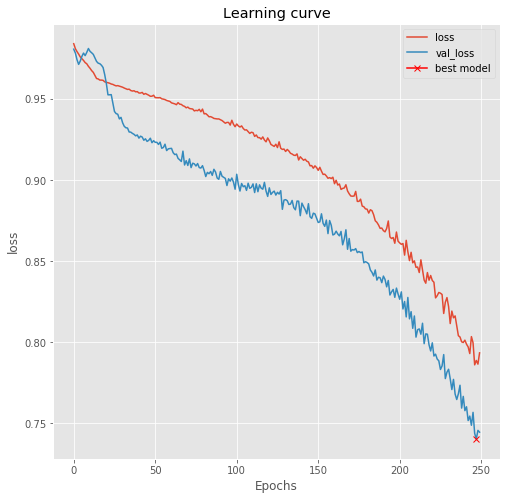

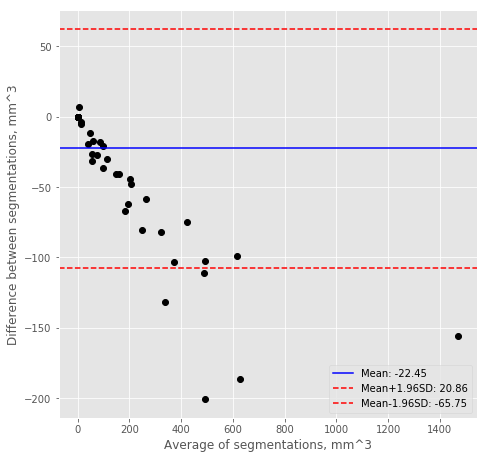


Validation
Voxel classification accuracy:  0.9946978432791573
Precision and recall:  (0.23456068489986007, 0.19207557782514703)
Dice score:  0.46923244776607925
Jaccard score:  0.3065464523716189
Volume difference (mean absolute, mean):  (59.44096284679004, 27.20795644606863)
Centroid distance:  3.4738618777632935
Hausdorff distance:  3.619992186729095
Surface Dice score:  0.6358394503303862
Added path length:  937.4285714285714
Detection rate (per patient, per slice):  (0.9285714285714286, 0.9553571428571429)


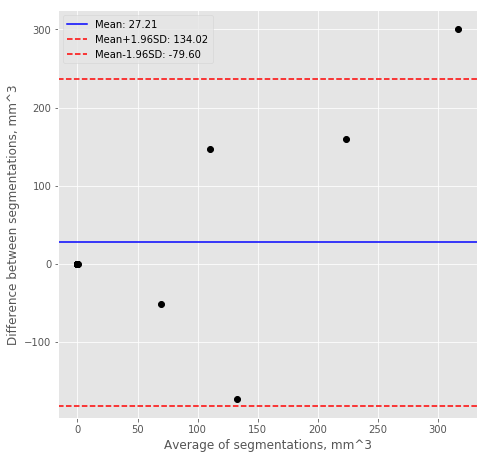


Test
Voxel classification accuracy:  0.9978444417317708
Precision and recall:  (0.17853877667597018, 0.2398593565157805)
Dice score:  0.6338186374044152
Jaccard score:  0.46395142929420696
Volume difference (mean absolute, mean):  (16.102513804038367, -7.791381690899531)
Centroid distance:  3.2072662025049086
Hausdorff distance:  3.379888905584204
Surface Dice score:  0.8023395798791688
Added path length:  295.4
Detection rate (per patient, per slice):  (0.8, 0.9458333333333333)


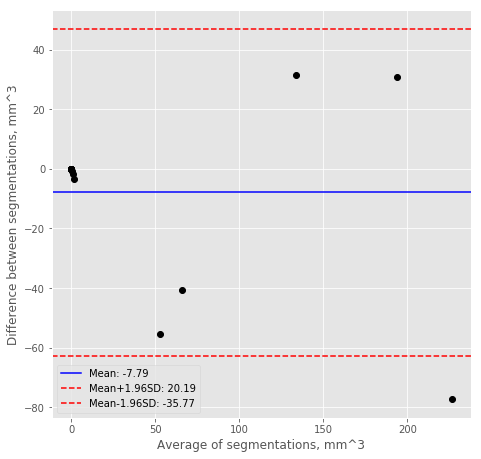

In [321]:
preds_train_iph_c2_vol, preds_valid_iph_c2_vol, preds_test_iph_c2_vol = train_evaluate_model('model_vessel-seg-3d_iph_cl2_vol.h5',
                                                                                 custom_loss_2c_vol,
                                                                                 X_train_iph, 
                                                                                 y_train_iph, 
                                                                                 X_valid_iph,
                                                                                 y_valid_iph, 
                                                                                 X_test_iph,
                                                                                 y_test_iph,
                                                                                 spacings_train_iph, 
                                                                                 spacings_valid_iph, 
                                                                                 spacings_test_iph)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


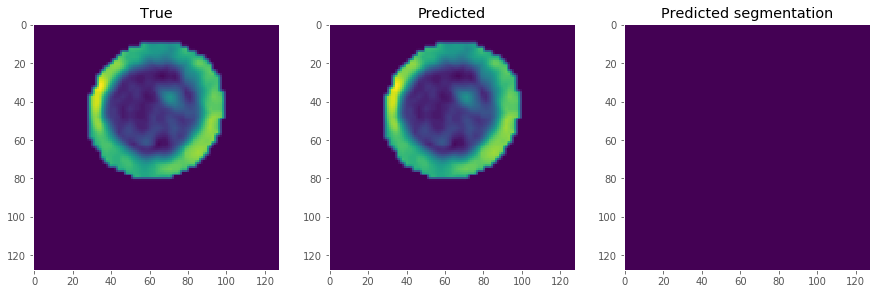

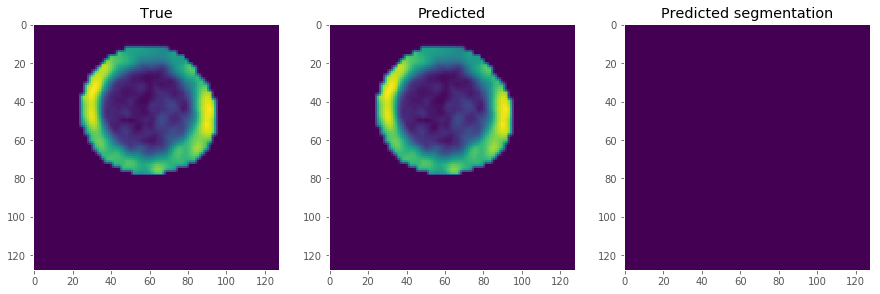

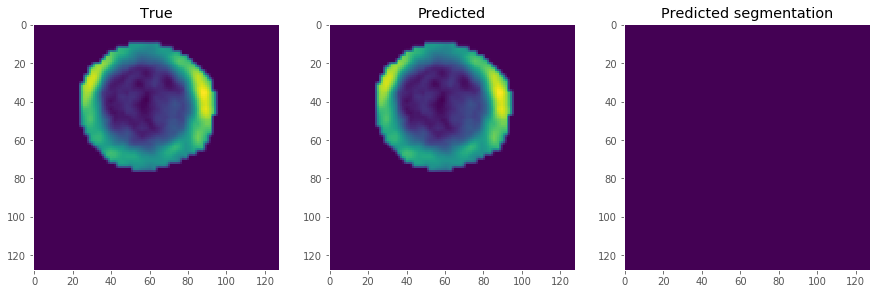

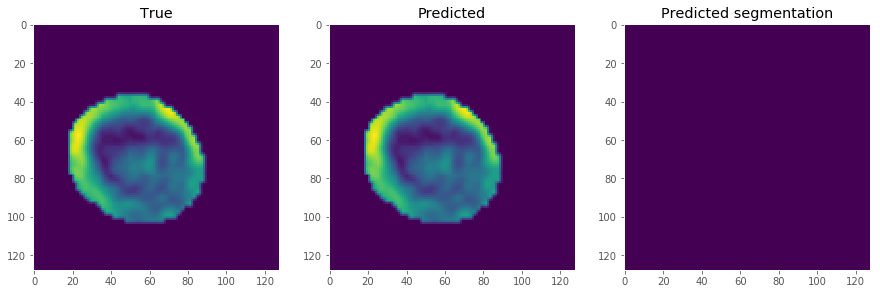

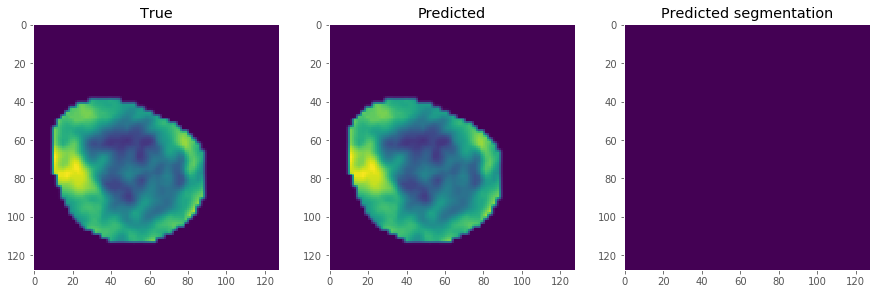

...

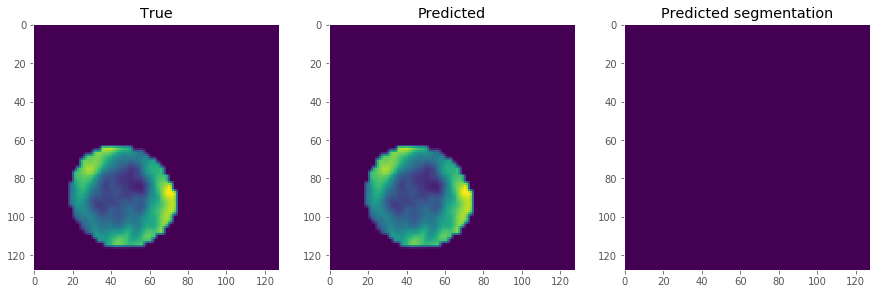

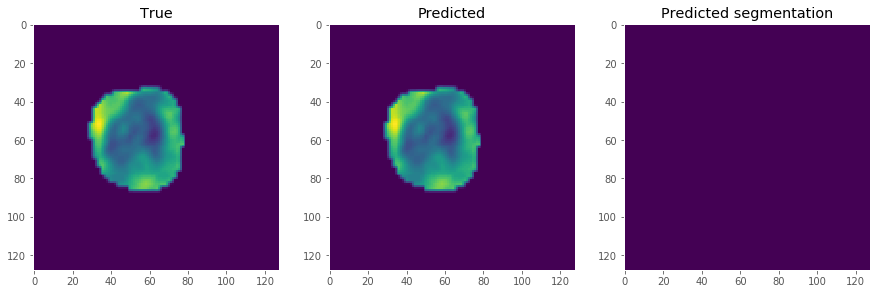

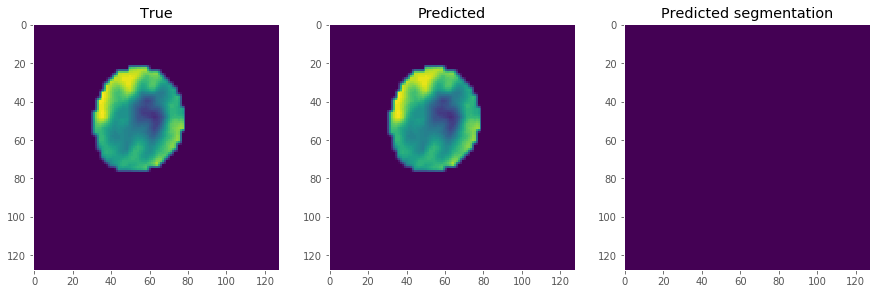

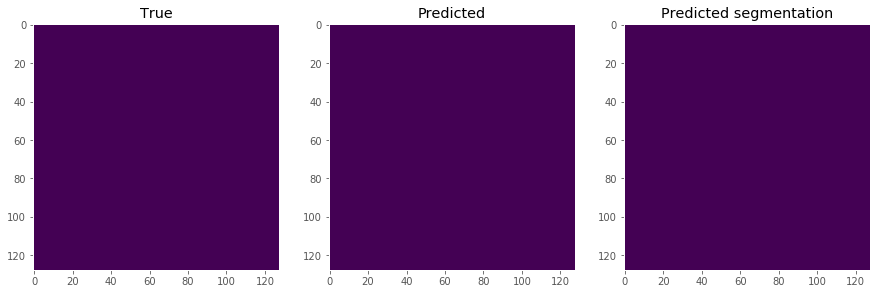

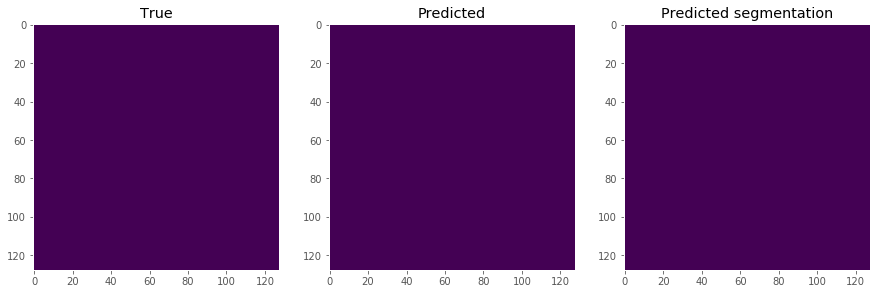

In [322]:
show_seg_slices(0, X_test_iph, y_test_iph, preds_test_iph_c2_vol)

## Dice + BCE + volume difference

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_31"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_590 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_559 (BatchN (None, 16, 128, 128, 64          conv3d_590[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6816 - acc: 0.8982 - dice_coef: 0.1966
Epoch 00001: val_loss improved from inf to 0.88581, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 147s 2s/sample - loss: 0.6763 - acc: 0.8995 - dice_coef: 0.2079 - val_loss: 0.8858 - val_acc: 0.7606 - val_dice_coef: 0.2130
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5840 - acc: 0.9364 - dice_coef: 0.2667
Epoch 00002: val_loss improved from 0.88581 to 0.56048, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 44ms/sample - loss: 0.5803 - acc: 0.9383 - dice_coef: 0.2748 - val_loss: 0.5605 - val_acc: 0.9418 - val_dice_coef: 0.3312
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5331 - acc: 0.9577 - dice_coef: 0.3027
Epoch 00003: val_loss improved from 0.56048 to 0.38020, saving model to model_vessel-seg

Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3293 - acc: 0.9882 - dice_coef: 0.5098
Epoch 00025: val_loss improved from 0.35280 to 0.35063, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 46ms/sample - loss: 0.3294 - acc: 0.9883 - dice_coef: 0.5090 - val_loss: 0.3506 - val_acc: 0.9881 - val_dice_coef: 0.4673
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3310 - acc: 0.9883 - dice_coef: 0.5066
Epoch 00026: val_loss improved from 0.35063 to 0.35039, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.3297 - acc: 0.9883 - dice_coef: 0.5112 - val_loss: 0.3504 - val_acc: 0.9879 - val_dice_coef: 0.5043
Epoch 27/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3288 - acc: 0.9884 - dice_coef: 0.5102
Epoch 00027: val_loss improved from 0.35039 to 0.34909, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [=============

Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3038 - acc: 0.9893 - dice_coef: 0.5418
Epoch 00047: val_loss did not improve from 0.31081
86/86 [==============================] - 3s 37ms/sample - loss: 0.3023 - acc: 0.9893 - dice_coef: 0.5480 - val_loss: 0.3111 - val_acc: 0.9881 - val_dice_coef: 0.4855
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2965 - acc: 0.9895 - dice_coef: 0.5534
Epoch 00048: val_loss improved from 0.31081 to 0.30925, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.3020 - acc: 0.9893 - dice_coef: 0.5320 - val_loss: 0.3092 - val_acc: 0.9883 - val_dice_coef: 0.4867
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3009 - acc: 0.9894 - dice_coef: 0.5457
Epoch 00049: val_loss improved from 0.30925 to 0.30681, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.2998 - a

Epoch 70/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2735 - acc: 0.9902 - dice_coef: 0.5834
Epoch 00070: val_loss improved from 0.27778 to 0.27626, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.2735 - acc: 0.9902 - dice_coef: 0.5830 - val_loss: 0.2763 - val_acc: 0.9885 - val_dice_coef: 0.5596
Epoch 71/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2683 - acc: 0.9901 - dice_coef: 0.5914
Epoch 00071: val_loss did not improve from 0.27626
86/86 [==============================] - 3s 36ms/sample - loss: 0.2728 - acc: 0.9903 - dice_coef: 0.5746 - val_loss: 0.2766 - val_acc: 0.9886 - val_dice_coef: 0.5227
Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2710 - acc: 0.9904 - dice_coef: 0.5867
Epoch 00072: val_loss improved from 0.27626 to 0.27588, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.2713 - a

80/86 [==========================>...] - ETA: 0s - loss: 0.2434 - acc: 0.9915 - dice_coef: 0.6263
Epoch 00093: val_loss did not improve from 0.25414
86/86 [==============================] - 3s 37ms/sample - loss: 0.2455 - acc: 0.9916 - dice_coef: 0.6189 - val_loss: 0.2563 - val_acc: 0.9885 - val_dice_coef: 0.6322
Epoch 94/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2422 - acc: 0.9919 - dice_coef: 0.6260
Epoch 00094: val_loss improved from 0.25414 to 0.25156, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.2432 - acc: 0.9918 - dice_coef: 0.6229 - val_loss: 0.2516 - val_acc: 0.9886 - val_dice_coef: 0.5827
Epoch 95/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2412 - acc: 0.9917 - dice_coef: 0.6287
Epoch 00095: val_loss did not improve from 0.25156
86/86 [==============================] - 3s 36ms/sample - loss: 0.2422 - acc: 0.9917 - dice_coef: 0.6251 - val_loss: 0.2558 - val_acc: 0.9883

86/86 [==============================] - 4s 41ms/sample - loss: 0.2216 - acc: 0.9924 - dice_coef: 0.6552 - val_loss: 0.2266 - val_acc: 0.9890 - val_dice_coef: 0.6140
Epoch 116/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2207 - acc: 0.9924 - dice_coef: 0.6566
Epoch 00116: val_loss did not improve from 0.22655
86/86 [==============================] - 3s 37ms/sample - loss: 0.2197 - acc: 0.9925 - dice_coef: 0.6601 - val_loss: 0.2266 - val_acc: 0.9888 - val_dice_coef: 0.6687
Epoch 117/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2176 - acc: 0.9923 - dice_coef: 0.6615
Epoch 00117: val_loss did not improve from 0.22655
86/86 [==============================] - 3s 37ms/sample - loss: 0.2198 - acc: 0.9923 - dice_coef: 0.6540 - val_loss: 0.2270 - val_acc: 0.9888 - val_dice_coef: 0.6726
Epoch 118/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2178 - acc: 0.9924 - dice_coef: 0.6583
Epoch 00118: val_loss did not improve from 0.22655
86/86 [======

80/86 [==========================>...] - ETA: 0s - loss: 0.1966 - acc: 0.9929 - dice_coef: 0.6901
Epoch 00138: val_loss improved from 0.20622 to 0.20536, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.1982 - acc: 0.9930 - dice_coef: 0.6844 - val_loss: 0.2054 - val_acc: 0.9891 - val_dice_coef: 0.6473
Epoch 139/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1972 - acc: 0.9931 - dice_coef: 0.6902
Epoch 00139: val_loss did not improve from 0.20536
86/86 [==============================] - 3s 37ms/sample - loss: 0.1964 - acc: 0.9931 - dice_coef: 0.6932 - val_loss: 0.2058 - val_acc: 0.9889 - val_dice_coef: 0.7121
Epoch 140/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1985 - acc: 0.9930 - dice_coef: 0.6871
Epoch 00140: val_loss improved from 0.20536 to 0.20482, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.1965 - acc: 0.9930 

Epoch 161/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1762 - acc: 0.9934 - dice_coef: 0.7194
Epoch 00161: val_loss did not improve from 0.18709
86/86 [==============================] - 3s 36ms/sample - loss: 0.1770 - acc: 0.9934 - dice_coef: 0.7166 - val_loss: 0.1872 - val_acc: 0.9888 - val_dice_coef: 0.6870
Epoch 162/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1767 - acc: 0.9936 - dice_coef: 0.7189
Epoch 00162: val_loss improved from 0.18709 to 0.18491, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.1755 - acc: 0.9936 - dice_coef: 0.7232 - val_loss: 0.1849 - val_acc: 0.9892 - val_dice_coef: 0.6934
Epoch 163/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1734 - acc: 0.9936 - dice_coef: 0.7244
Epoch 00163: val_loss improved from 0.18491 to 0.18332, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.1752 

Epoch 184/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1556 - acc: 0.9939 - dice_coef: 0.7499
Epoch 00184: val_loss improved from 0.16858 to 0.16805, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.1576 - acc: 0.9940 - dice_coef: 0.7423 - val_loss: 0.1680 - val_acc: 0.9891 - val_dice_coef: 0.7452
Epoch 185/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1573 - acc: 0.9940 - dice_coef: 0.7463
Epoch 00185: val_loss improved from 0.16805 to 0.16701, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.1573 - acc: 0.9940 - dice_coef: 0.7470 - val_loss: 0.1670 - val_acc: 0.9892 - val_dice_coef: 0.7160
Epoch 186/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1537 - acc: 0.9940 - dice_coef: 0.7526
Epoch 00186: val_loss did not improve from 0.16701
86/86 [==============================] - 3s 36ms/sample - loss: 0.1568 

Epoch 207/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1410 - acc: 0.9944 - dice_coef: 0.7719
Epoch 00207: val_loss improved from 0.15601 to 0.15528, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.1414 - acc: 0.9944 - dice_coef: 0.7700 - val_loss: 0.1553 - val_acc: 0.9890 - val_dice_coef: 0.6419
Epoch 208/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1415 - acc: 0.9946 - dice_coef: 0.7701
Epoch 00208: val_loss improved from 0.15528 to 0.15384, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.1400 - acc: 0.9945 - dice_coef: 0.7755 - val_loss: 0.1538 - val_acc: 0.9892 - val_dice_coef: 0.7710
Epoch 209/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1377 - acc: 0.9946 - dice_coef: 0.7766
Epoch 00209: val_loss improved from 0.15384 to 0.15324, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==========

Epoch 230/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1253 - acc: 0.9947 - dice_coef: 0.7929
Epoch 00230: val_loss improved from 0.14216 to 0.14094, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.1249 - acc: 0.9947 - dice_coef: 0.7951 - val_loss: 0.1409 - val_acc: 0.9891 - val_dice_coef: 0.7805
Epoch 231/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1253 - acc: 0.9949 - dice_coef: 0.7953
Epoch 00231: val_loss did not improve from 0.14094
86/86 [==============================] - 3s 37ms/sample - loss: 0.1248 - acc: 0.9948 - dice_coef: 0.7962 - val_loss: 0.1417 - val_acc: 0.9889 - val_dice_coef: 0.7484
Epoch 232/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1231 - acc: 0.9949 - dice_coef: 0.7988
Epoch 00232: val_loss improved from 0.14094 to 0.14014, saving model to model_vessel-seg-3d_lumen_cl3.h5
86/86 [==============================] - 4s 45ms/sample - loss: 0.1240 

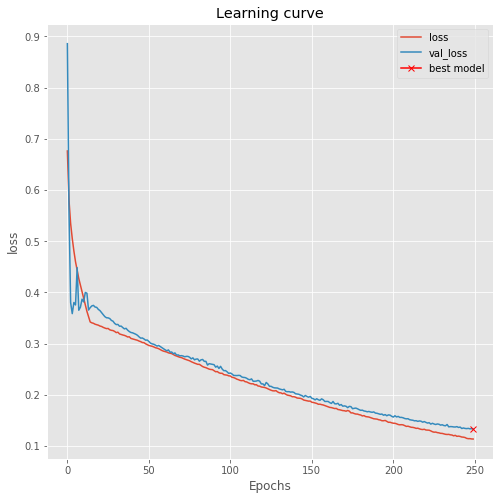

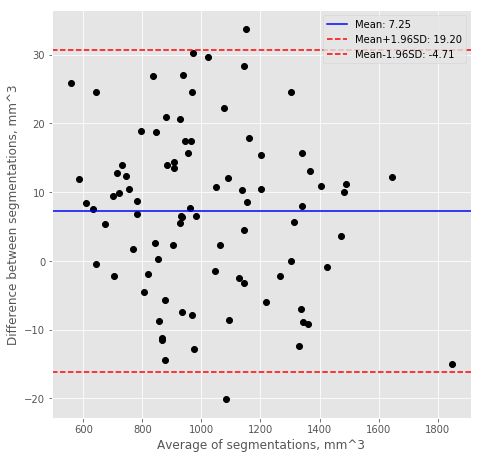


Validation
Voxel classification accuracy:  0.9891498790067785
Precision and recall:  (0.9294835856289559, 0.871292262630037)
Dice score:  0.903165015801047
Jaccard score:  0.8234286674164853
Volume difference (mean absolute, mean):  (99.4263915787725, 65.30534926056862)
Centroid distance:  1.8207359626958524
Hausdorff distance:  1.4213106011934793
Surface Dice score:  0.9735198698437072
Added path length:  2343.1176470588234
Detection rate (per patient, per slice):  (1.0, 0.9852941176470589)


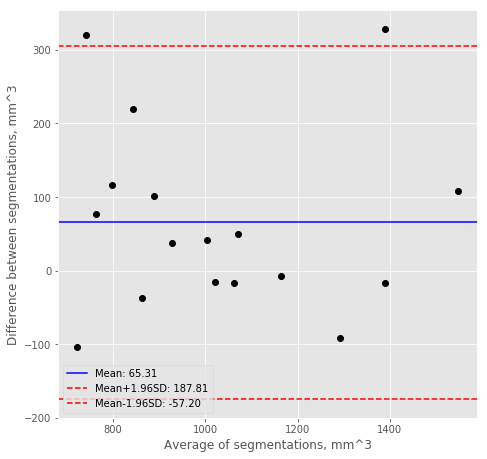


Test
Voxel classification accuracy:  0.9889341990152994
Precision and recall:  (0.8979900905096221, 0.9156684094055443)
Dice score:  0.9068342098572137
Jaccard score:  0.8295490713582702
Volume difference (mean absolute, mean):  (51.709417978922524, -19.05513468881448)
Centroid distance:  0.4315839375252073
Hausdorff distance:  0.6376547649200647
Surface Dice score:  0.9878531497411193
Added path length:  2233.8333333333335
Detection rate (per patient, per slice):  (1.0, 0.9947916666666666)


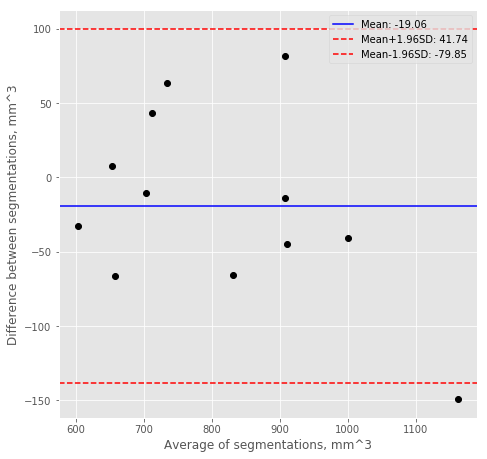

In [301]:
preds_train_lumen_c3, preds_valid_lumen_c3, preds_test_lumen_c3 = train_evaluate_model('model_vessel-seg-3d_lumen_cl3.h5',
                                                                                       custom_loss_3c, 
                                                                                       X_train_lumen, 
                                                                                       y_train_lumen, 
                                                                                       X_valid_lumen, 
                                                                                       y_valid_lumen, 
                                                                                       X_test_lumen,
                                                                                       y_test_lumen,
                                                                                       spacings_train_lumen, 
                                                                                       spacings_valid_lumen, 
                                                                                       spacings_test_lumen)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


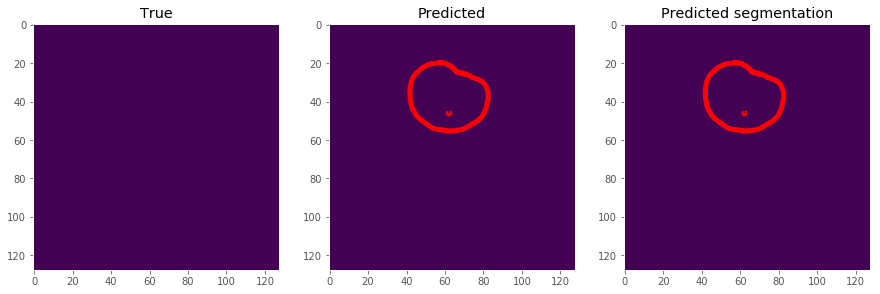

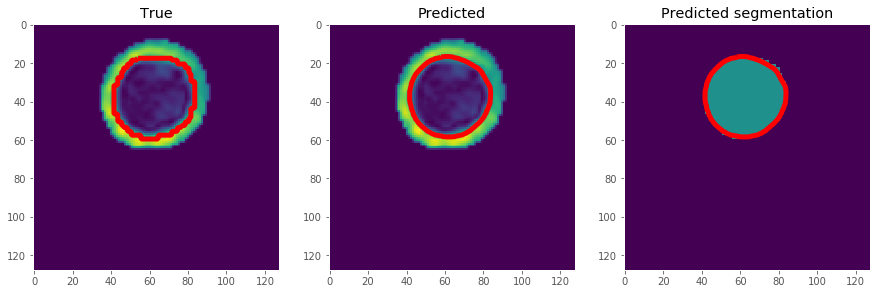

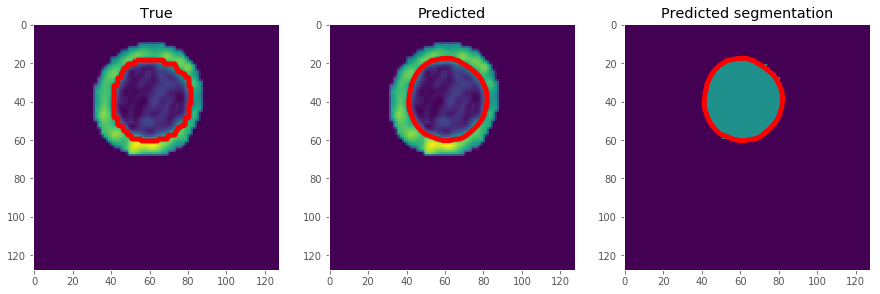

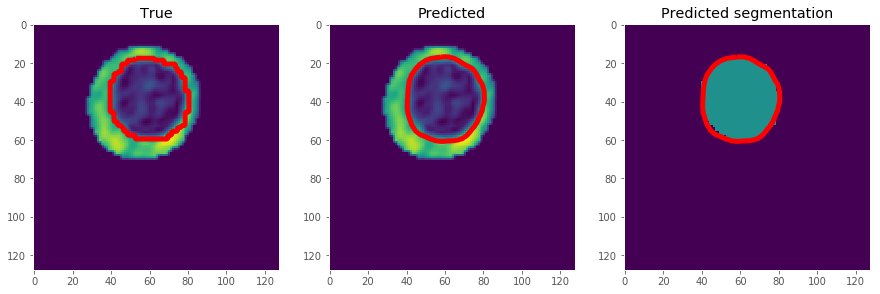

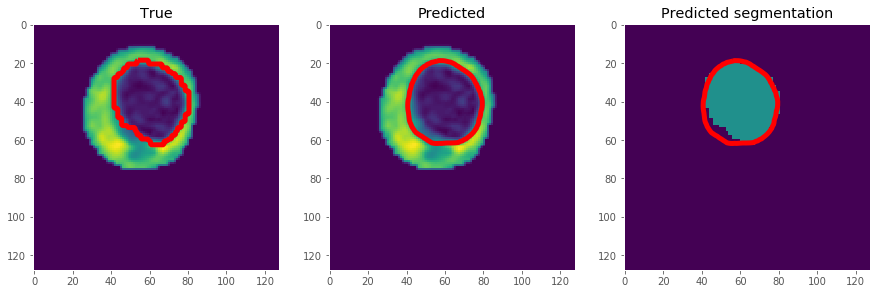

...

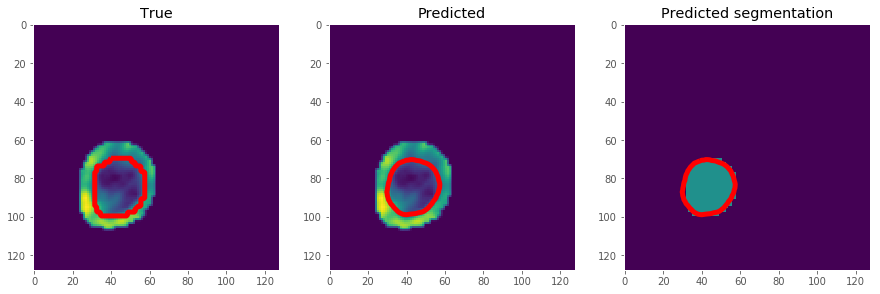

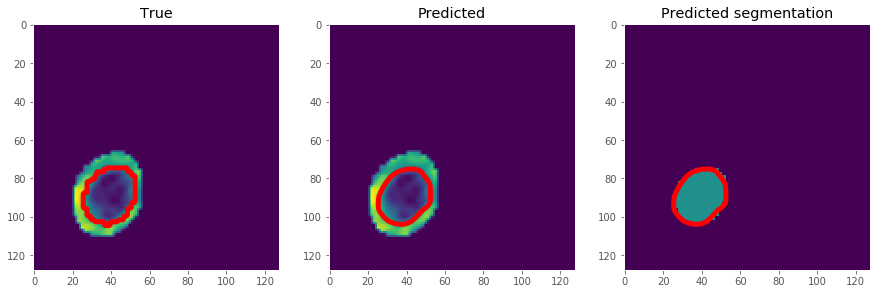

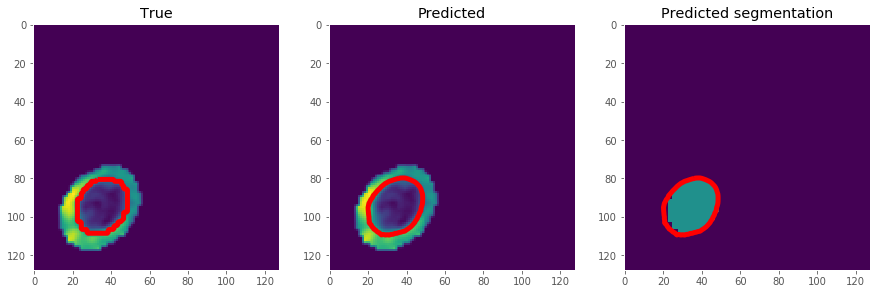

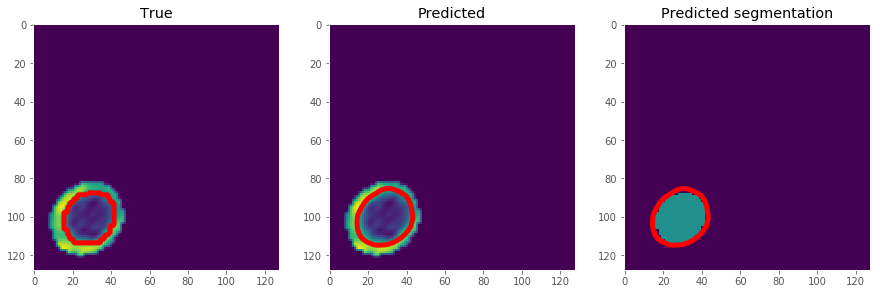

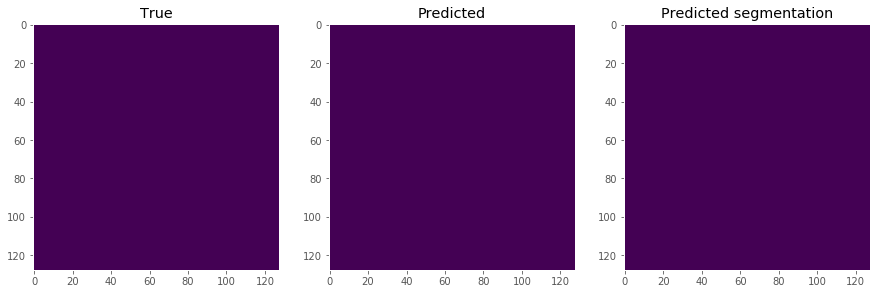

In [302]:
show_seg_slices(0, X_test_lumen, y_test_lumen, preds_test_lumen_c3)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_32"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_609 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_577 (BatchN (None, 16, 128, 128, 64          conv3d_609[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7773 - acc: 0.9418 - dice_coef: 0.0084
Epoch 00001: val_loss improved from inf to 0.74909, saving model to model_vessel-seg-3d_lipid_cl3.h5
86/86 [==============================] - 163s 2s/sample - loss: 0.7747 - acc: 0.9421 - dice_coef: 0.0097 - val_loss: 0.7491 - val_acc: 0.9828 - val_dice_coef: 3.2521e-05
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7321 - acc: 0.9628 - dice_coef: 0.0103
Epoch 00002: val_loss improved from 0.74909 to 0.72152, saving model to model_vessel-seg-3d_lipid_cl3.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.7301 - acc: 0.9633 - dice_coef: 0.0134 - val_loss: 0.7215 - val_acc: 0.9930 - val_dice_coef: 0.0018
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7077 - acc: 0.9643 - dice_coef: 0.0180
Epoch 00003: val_loss improved from 0.72152 to 0.70753, saving model to model_vessel

80/86 [==========================>...] - ETA: 0s - loss: 0.5923 - acc: 0.9906 - dice_coef: 0.0581
Epoch 00023: val_loss improved from 0.62392 to 0.61619, saving model to model_vessel-seg-3d_lipid_cl3.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.5934 - acc: 0.9907 - dice_coef: 0.0547 - val_loss: 0.6162 - val_acc: 0.9901 - val_dice_coef: 0.0234
Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5928 - acc: 0.9920 - dice_coef: 0.0514
Epoch 00024: val_loss did not improve from 0.61619
86/86 [==============================] - 3s 37ms/sample - loss: 0.5912 - acc: 0.9916 - dice_coef: 0.0591 - val_loss: 0.6295 - val_acc: 0.9692 - val_dice_coef: 0.0524
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5857 - acc: 0.9898 - dice_coef: 0.0629
Epoch 00025: val_loss did not improve from 0.61619
86/86 [==============================] - 3s 37ms/sample - loss: 0.5882 - acc: 0.9903 - dice_coef: 0.0536 - val_loss: 0.6282 - val_acc: 0.9792

80/86 [==========================>...] - ETA: 0s - loss: 0.4418 - acc: 0.9952 - dice_coef: 0.2034
Epoch 00046: val_loss did not improve from 0.49677
86/86 [==============================] - 3s 36ms/sample - loss: 0.4410 - acc: 0.9952 - dice_coef: 0.2107 - val_loss: 0.4971 - val_acc: 0.9908 - val_dice_coef: 0.2641
Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4145 - acc: 0.9951 - dice_coef: 0.2431
Epoch 00047: val_loss improved from 0.49677 to 0.46552, saving model to model_vessel-seg-3d_lipid_cl3.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.4209 - acc: 0.9953 - dice_coef: 0.2242 - val_loss: 0.4655 - val_acc: 0.9965 - val_dice_coef: 0.0400
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4207 - acc: 0.9950 - dice_coef: 0.2202
Epoch 00048: val_loss did not improve from 0.46552
86/86 [==============================] - 3s 37ms/sample - loss: 0.4202 - acc: 0.9951 - dice_coef: 0.2229 - val_loss: 0.4751 - val_acc: 0.9957

Epoch 71/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2843 - acc: 0.9963 - dice_coef: 0.3791
Epoch 00071: val_loss did not improve from 0.37722
86/86 [==============================] - 3s 37ms/sample - loss: 0.2859 - acc: 0.9963 - dice_coef: 0.3650 - val_loss: 0.4786 - val_acc: 0.9908 - val_dice_coef: 0.1825
Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2821 - acc: 0.9964 - dice_coef: 0.3741
Epoch 00072: val_loss did not improve from 0.37722
86/86 [==============================] - 3s 37ms/sample - loss: 0.2825 - acc: 0.9963 - dice_coef: 0.3762 - val_loss: 0.4261 - val_acc: 0.9925 - val_dice_coef: 0.0981
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2497 - acc: 0.9961 - dice_coef: 0.4597
Epoch 00073: val_loss did not improve from 0.37722
86/86 [==============================] - 3s 37ms/sample - loss: 0.2508 - acc: 0.9961 - dice_coef: 0.4442 - val_loss: 0.4239 - val_acc: 0.9958 - val_dice_coef: 0.1310
Epoch 74/250
80/

80/86 [==========================>...] - ETA: 0s - loss: 0.2142 - acc: 0.9967 - dice_coef: 0.5009
Epoch 00095: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2192 - acc: 0.9968 - dice_coef: 0.4700 - val_loss: 0.4351 - val_acc: 0.9961 - val_dice_coef: 0.0566
Epoch 96/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2179 - acc: 0.9969 - dice_coef: 0.5140
Epoch 00096: ReduceLROnPlateau reducing learning rate to 1e-05.

Epoch 00096: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2187 - acc: 0.9967 - dice_coef: 0.5053 - val_loss: 0.4081 - val_acc: 0.9961 - val_dice_coef: 0.0862
Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2210 - acc: 0.9970 - dice_coef: 0.4833
Epoch 00097: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2183 - acc: 0.9968 - dice_coef: 0.5003 - val_loss: 0.4098 - val_

Epoch 120/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2123 - acc: 0.9969 - dice_coef: 0.5162
Epoch 00120: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2144 - acc: 0.9968 - dice_coef: 0.5115 - val_loss: 0.4502 - val_acc: 0.9962 - val_dice_coef: 0.1254
Epoch 121/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2160 - acc: 0.9966 - dice_coef: 0.5083
Epoch 00121: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2311 - acc: 0.9968 - dice_coef: 0.4329 - val_loss: 0.4549 - val_acc: 0.9962 - val_dice_coef: 0.0701
Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2009 - acc: 0.9968 - dice_coef: 0.5235
Epoch 00122: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2006 - acc: 0.9968 - dice_coef: 0.5245 - val_loss: 0.4502 - val_acc: 0.9962 - val_dice_coef: 0.1257
Epoch 123/250

Epoch 145/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2215 - acc: 0.9969 - dice_coef: 0.4929
Epoch 00145: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2221 - acc: 0.9969 - dice_coef: 0.4845 - val_loss: 0.4641 - val_acc: 0.9962 - val_dice_coef: 0.0420
Epoch 146/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2059 - acc: 0.9969 - dice_coef: 0.5402
Epoch 00146: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2096 - acc: 0.9969 - dice_coef: 0.5117 - val_loss: 0.4572 - val_acc: 0.9962 - val_dice_coef: 0.0438
Epoch 147/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2117 - acc: 0.9968 - dice_coef: 0.5096
Epoch 00147: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2138 - acc: 0.9969 - dice_coef: 0.4989 - val_loss: 0.4556 - val_acc: 0.9962 - val_dice_coef: 0.0442
Epoch 148/250

Epoch 170/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2033 - acc: 0.9967 - dice_coef: 0.5363
Epoch 00170: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2130 - acc: 0.9968 - dice_coef: 0.5019 - val_loss: 0.4388 - val_acc: 0.9961 - val_dice_coef: 0.0458
Epoch 171/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2166 - acc: 0.9967 - dice_coef: 0.5030
Epoch 00171: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2156 - acc: 0.9968 - dice_coef: 0.5150 - val_loss: 0.4394 - val_acc: 0.9961 - val_dice_coef: 0.1025
Epoch 172/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2070 - acc: 0.9968 - dice_coef: 0.5216
Epoch 00172: val_loss did not improve from 0.35371
86/86 [==============================] - 3s 37ms/sample - loss: 0.2166 - acc: 0.9968 - dice_coef: 0.4742 - val_loss: 0.4410 - val_acc: 0.9961 - val_dice_coef: 0.0998
Epoch 173/250

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.19675557522495657, 0.26588239978927475)
Dice score:  0.535860055798574
Jaccard score:  0.3659915075808367
Volume difference (mean absolute, mean):  (47.58160944248355, -28.70424700268479)
Centroid distance:  3.749411985068936
Hausdorff distance:  4.66874696829377
Surface Dice score:  0.6837322846470412
Added path length:  560.5813953488372
Detection rate (per patient, per slice):  (0.7674418604651163, 0.8786337209302325)


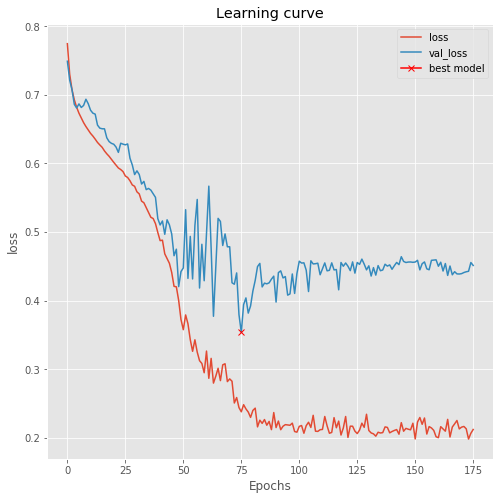

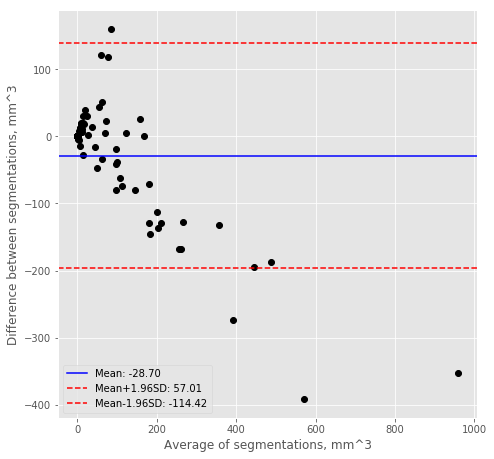


Validation
Voxel classification accuracy:  0.9952134525074678
Precision and recall:  (0.16317903280294402, 0.09598208161962046)
Dice score:  0.2105477424130274
Jaccard score:  0.11767868960953012
Volume difference (mean absolute, mean):  (79.55901565797188, 13.20711000351345)
Centroid distance:  3.684698203525687
Hausdorff distance:  6.021980536868833
Surface Dice score:  0.5060633042413978
Added path length:  696.6470588235294
Detection rate (per patient, per slice):  (0.5882352941176471, 0.8161764705882353)


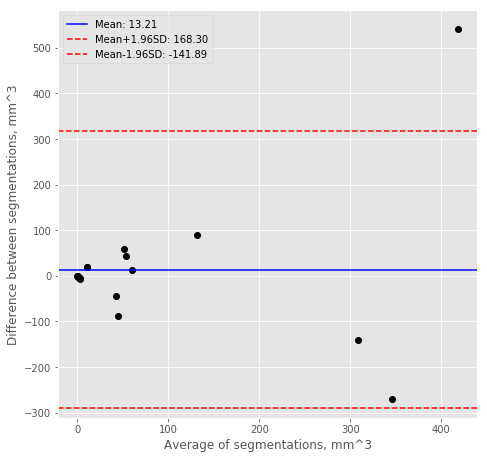


Test
Voxel classification accuracy:  0.9938201904296875
Precision and recall:  (0.11445157457043557, 0.08379755036753682)
Dice score:  0.15643306574094162
Jaccard score:  0.08487501765287388
Volume difference (mean absolute, mean):  (62.80181988328695, 2.342853086690108)
Centroid distance:  4.11661122610943
Hausdorff distance:  5.6943094030644685
Surface Dice score:  0.49113000330301326
Added path length:  743.1666666666666
Detection rate (per patient, per slice):  (0.5, 0.7708333333333334)


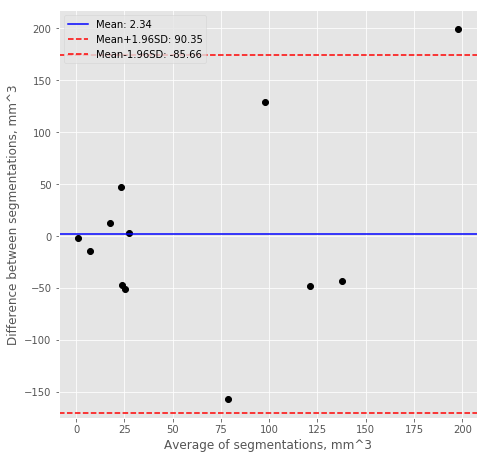

In [303]:
preds_train_lipid_c3, preds_valid_lipid_c3, preds_test_lipid_c3 = train_evaluate_model('model_vessel-seg-3d_lipid_cl3.h5',
                                                                                       custom_loss_3c, 
                                                                                       X_train_lipid, 
                                                                                       y_train_lipid, 
                                                                                       X_valid_lipid, 
                                                                                       y_valid_lipid, 
                                                                                       X_test_lipid, 
                                                                                       y_test_lipid,
                                                                                       spacings_train_lipid, 
                                                                                       spacings_valid_lipid, 
                                                                                       spacings_test_lipid)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


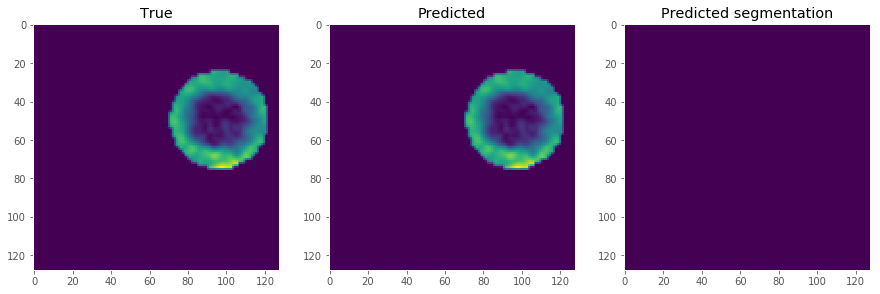

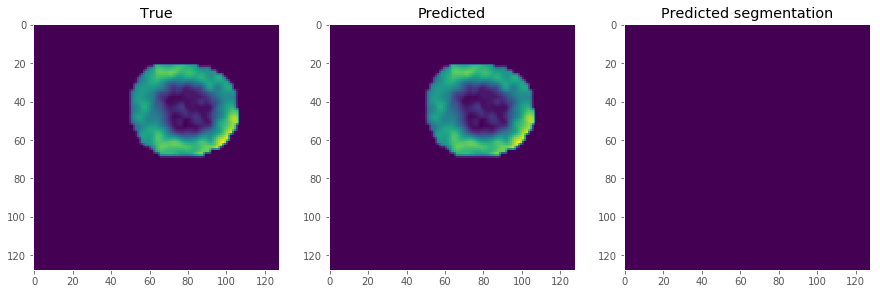

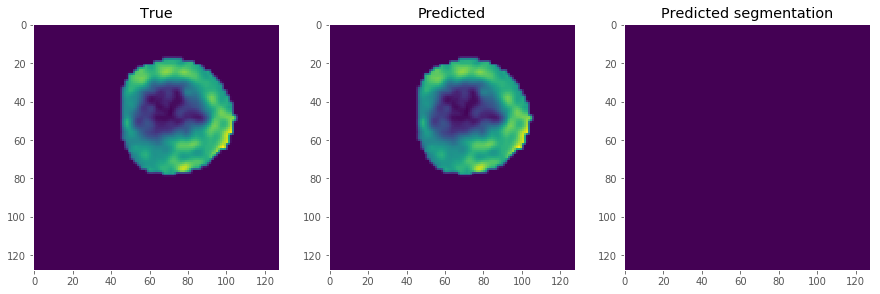

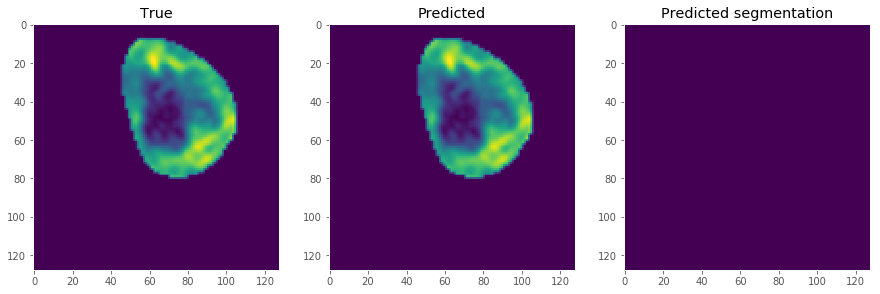

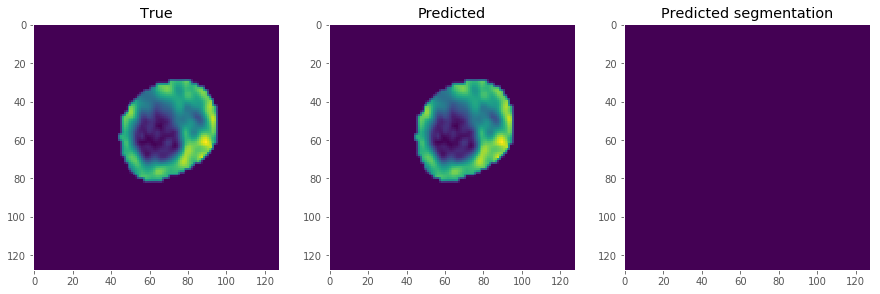

...

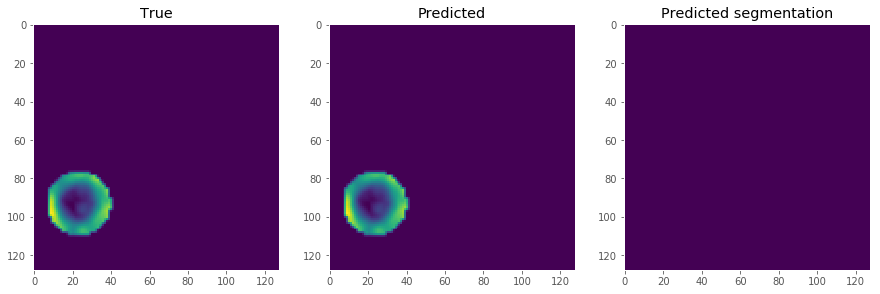

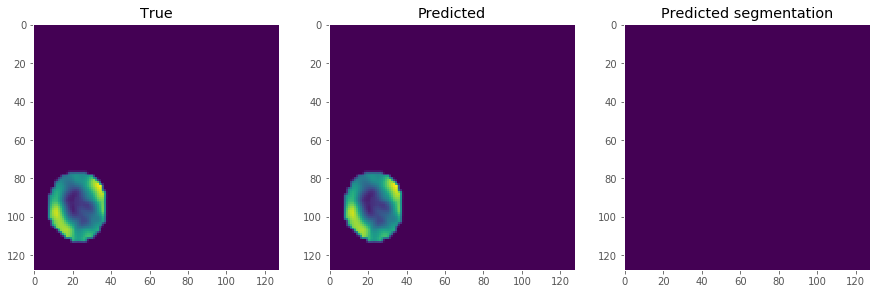

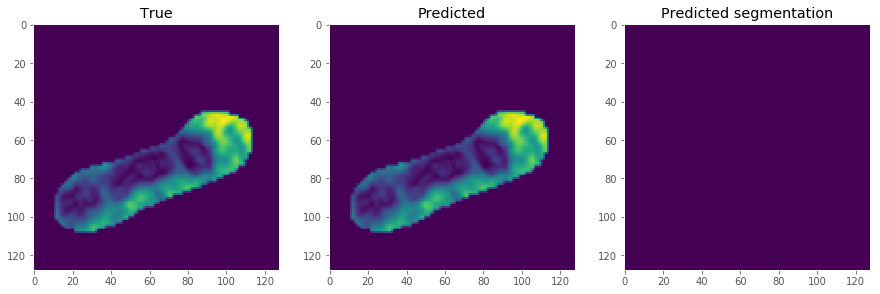

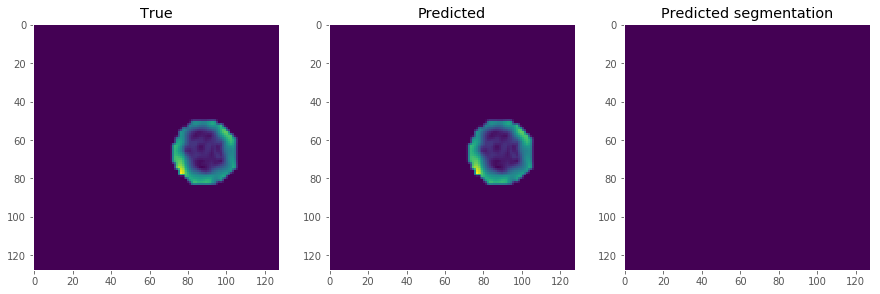

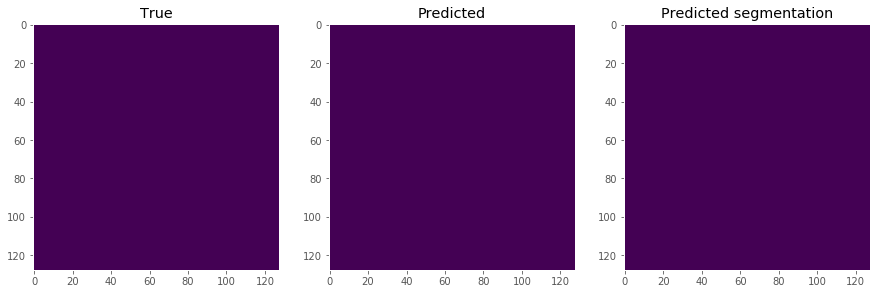

In [304]:
show_seg_slices(0, X_test_lipid, y_test_lipid, preds_test_lipid_c3)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_33"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_628 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_595 (BatchN (None, 16, 128, 128, 64          conv3d_628[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8577 - acc: 0.7309 - dice_coef: 0.0127
Epoch 00001: val_loss improved from inf to 1.45364, saving model to model_vessel-seg-3d_calc_cl3.h5
86/86 [==============================] - 172s 2s/sample - loss: 0.8552 - acc: 0.7371 - dice_coef: 0.0128 - val_loss: 1.4536 - val_acc: 0.3421 - val_dice_coef: 0.0137
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8070 - acc: 0.8237 - dice_coef: 0.0147
Epoch 00002: val_loss improved from 1.45364 to 0.80861, saving model to model_vessel-seg-3d_calc_cl3.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.8067 - acc: 0.8262 - dice_coef: 0.0132 - val_loss: 0.8086 - val_acc: 0.8294 - val_dice_coef: 7.8306e-04
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7826 - acc: 0.8409 - dice_coef: 0.0156
Epoch 00003: val_loss improved from 0.80861 to 0.80252, saving model to model_vessel-s

86/86 [==============================] - 4s 43ms/sample - loss: 0.6338 - acc: 0.9952 - dice_coef: 0.0245 - val_loss: 0.6326 - val_acc: 0.9945 - val_dice_coef: 0.0147
Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6311 - acc: 0.9952 - dice_coef: 0.0261
Epoch 00024: val_loss improved from 0.63263 to 0.62709, saving model to model_vessel-seg-3d_calc_cl3.h5
86/86 [==============================] - 4s 43ms/sample - loss: 0.6310 - acc: 0.9952 - dice_coef: 0.0264 - val_loss: 0.6271 - val_acc: 0.9945 - val_dice_coef: 0.0118
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6277 - acc: 0.9951 - dice_coef: 0.0247
Epoch 00025: val_loss did not improve from 0.62709
86/86 [==============================] - 3s 37ms/sample - loss: 0.6283 - acc: 0.9952 - dice_coef: 0.0235 - val_loss: 0.6280 - val_acc: 0.9946 - val_dice_coef: 0.0085
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6246 - acc: 0.9949 - dice_coef: 0.0282
Epoch 00026: v

Epoch 46/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5478 - acc: 0.9924 - dice_coef: 0.0937
Epoch 00046: val_loss improved from 0.57249 to 0.56722, saving model to model_vessel-seg-3d_calc_cl3.h5
86/86 [==============================] - 4s 44ms/sample - loss: 0.5488 - acc: 0.9925 - dice_coef: 0.0912 - val_loss: 0.5672 - val_acc: 0.9947 - val_dice_coef: 0.0115
Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5405 - acc: 0.9930 - dice_coef: 0.1014
Epoch 00047: val_loss improved from 0.56722 to 0.56132, saving model to model_vessel-seg-3d_calc_cl3.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.5420 - acc: 0.9932 - dice_coef: 0.0958 - val_loss: 0.5613 - val_acc: 0.9947 - val_dice_coef: 0.0101
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.5380 - acc: 0.9930 - dice_coef: 0.1035
Epoch 00048: val_loss improved from 0.56132 to 0.55579, saving model to model_vessel-seg-3d_calc_cl3.h5
86/86 [================

80/86 [==========================>...] - ETA: 0s - loss: 0.3324 - acc: 0.9960 - dice_coef: 0.2839
Epoch 00068: val_loss improved from 0.37350 to 0.35050, saving model to model_vessel-seg-3d_calc_cl3.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.3291 - acc: 0.9958 - dice_coef: 0.3017 - val_loss: 0.3505 - val_acc: 0.9939 - val_dice_coef: 0.1723
Epoch 69/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3292 - acc: 0.9959 - dice_coef: 0.2592
Epoch 00069: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 37ms/sample - loss: 0.3258 - acc: 0.9958 - dice_coef: 0.2782 - val_loss: 0.4414 - val_acc: 0.9947 - val_dice_coef: 0.0393
Epoch 70/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3187 - acc: 0.9952 - dice_coef: 0.3306
Epoch 00070: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 37ms/sample - loss: 0.3202 - acc: 0.9952 - dice_coef: 0.3218 - val_loss: 0.4076 - val_acc: 0.9947 

Epoch 93/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2399 - acc: 0.9961 - dice_coef: 0.4369
Epoch 00093: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 37ms/sample - loss: 0.2396 - acc: 0.9961 - dice_coef: 0.4436 - val_loss: 0.4227 - val_acc: 0.9948 - val_dice_coef: 0.2263
Epoch 94/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2372 - acc: 0.9960 - dice_coef: 0.4408
Epoch 00094: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 37ms/sample - loss: 0.2423 - acc: 0.9961 - dice_coef: 0.4160 - val_loss: 0.4213 - val_acc: 0.9948 - val_dice_coef: 0.0892
Epoch 95/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2419 - acc: 0.9959 - dice_coef: 0.4424
Epoch 00095: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 38ms/sample - loss: 0.2504 - acc: 0.9961 - dice_coef: 0.4225 - val_loss: 0.4224 - val_acc: 0.9948 - val_dice_coef: 0.2263
Epoch 96/250
80/

Epoch 118/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2387 - acc: 0.9961 - dice_coef: 0.4475
Epoch 00118: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 37ms/sample - loss: 0.2422 - acc: 0.9962 - dice_coef: 0.4409 - val_loss: 0.4179 - val_acc: 0.9947 - val_dice_coef: 0.0900
Epoch 119/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2358 - acc: 0.9960 - dice_coef: 0.4548
Epoch 00119: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 38ms/sample - loss: 0.2431 - acc: 0.9962 - dice_coef: 0.4102 - val_loss: 0.4069 - val_acc: 0.9947 - val_dice_coef: 0.1044
Epoch 120/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2346 - acc: 0.9961 - dice_coef: 0.4499
Epoch 00120: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 38ms/sample - loss: 0.2390 - acc: 0.9961 - dice_coef: 0.4217 - val_loss: 0.4196 - val_acc: 0.9947 - val_dice_coef: 0.2278
Epoch 121/250

Epoch 143/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2386 - acc: 0.9962 - dice_coef: 0.4459
Epoch 00143: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 38ms/sample - loss: 0.2391 - acc: 0.9962 - dice_coef: 0.4472 - val_loss: 0.4105 - val_acc: 0.9947 - val_dice_coef: 0.0883
Epoch 144/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2311 - acc: 0.9964 - dice_coef: 0.4570
Epoch 00144: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 38ms/sample - loss: 0.2362 - acc: 0.9962 - dice_coef: 0.4378 - val_loss: 0.4123 - val_acc: 0.9947 - val_dice_coef: 0.0885
Epoch 145/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2316 - acc: 0.9961 - dice_coef: 0.4476
Epoch 00145: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 37ms/sample - loss: 0.2370 - acc: 0.9962 - dice_coef: 0.4286 - val_loss: 0.4072 - val_acc: 0.9947 - val_dice_coef: 0.1701
Epoch 146/250

Epoch 168/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2322 - acc: 0.9964 - dice_coef: 0.4562
Epoch 00168: val_loss did not improve from 0.35050
86/86 [==============================] - 3s 38ms/sample - loss: 0.2332 - acc: 0.9962 - dice_coef: 0.4520 - val_loss: 0.4109 - val_acc: 0.9947 - val_dice_coef: 0.1497
Epoch 00168: early stopping
12/12 [==============================] - 0s 17ms/sample

Train
Voxel classification accuracy:  0.9942319559496503


C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.31882655503627033, 0.396589010836922)
Dice score:  0.4700759613347025
Jaccard score:  0.3072562901876802
Volume difference (mean absolute, mean):  (40.207197036854055, -17.840224369320758)
Centroid distance:  5.200358100693204
Hausdorff distance:  5.8446064326082
Surface Dice score:  0.6216045387454815
Added path length:  775.2790697674419
Detection rate (per patient, per slice):  (0.8837209302325582, 0.8379360465116279)


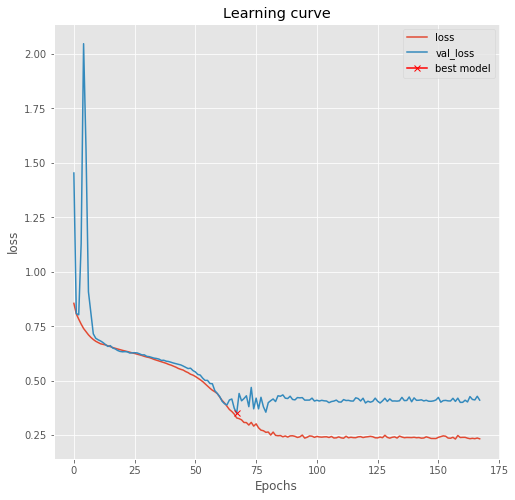

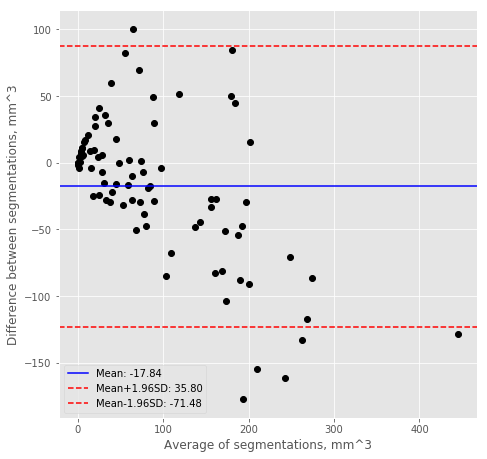


Validation
Voxel classification accuracy:  0.993925879983341
Precision and recall:  (0.3515514590590203, 0.16234230792095494)
Dice score:  0.29920260964117434
Jaccard score:  0.17593156356551387
Volume difference (mean absolute, mean):  (61.929054270772376, 43.20787175613291)
Centroid distance:  6.951947498939787
Hausdorff distance:  9.0249677564774
Surface Dice score:  0.37755304265279804
Added path length:  1102.5882352941176
Detection rate (per patient, per slice):  (0.8823529411764706, 0.6764705882352942)


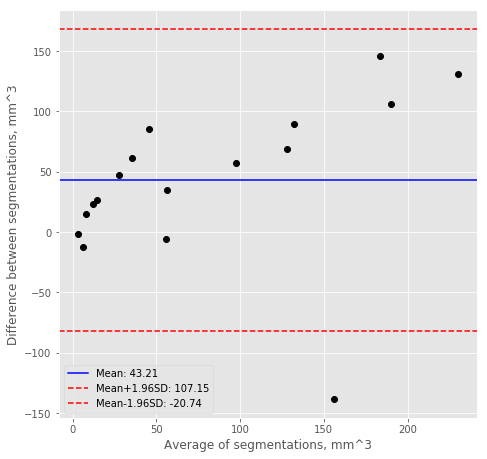


Test
Voxel classification accuracy:  0.9924837748209635
Precision and recall:  (0.29756278820115306, 0.26592190226209805)
Dice score:  0.2868647262856281
Jaccard score:  0.16746478873239437
Volume difference (mean absolute, mean):  (82.37859173367421, -39.62870581199726)
Centroid distance:  5.124034423119688
Hausdorff distance:  6.293969312784245
Surface Dice score:  0.5479268657190759
Added path length:  743.8333333333334
Detection rate (per patient, per slice):  (0.9166666666666666, 0.765625)


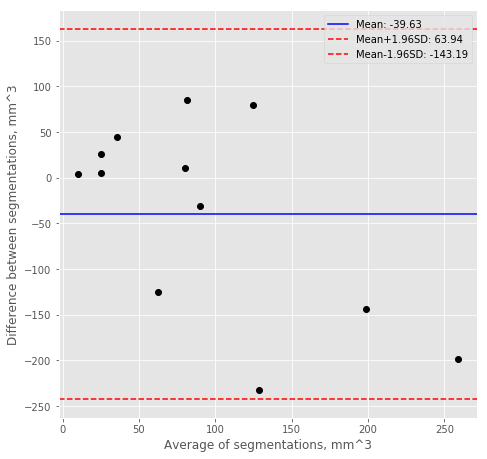

In [305]:
preds_train_calc_c3, preds_valid_calc_c3, preds_test_calc_c3 = train_evaluate_model('model_vessel-seg-3d_calc_cl3.h5',
                                                                                    custom_loss_3c,
                                                                                    X_train_calc,
                                                                                    y_train_calc, 
                                                                                    X_valid_calc,
                                                                                    y_valid_calc, 
                                                                                    X_test_calc,
                                                                                    y_test_calc,
                                                                                    spacings_train_calc, 
                                                                                    spacings_valid_calc, 
                                                                                    spacings_test_calc)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


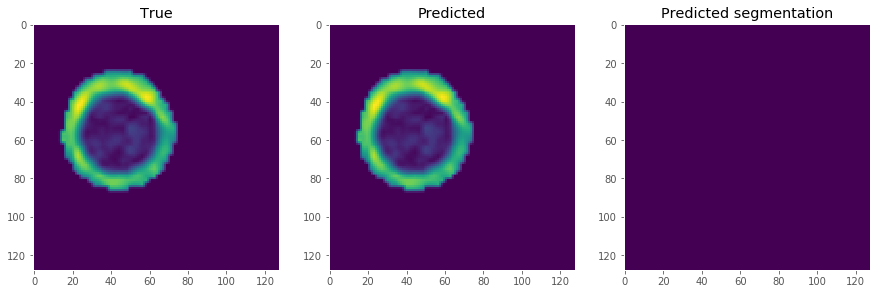

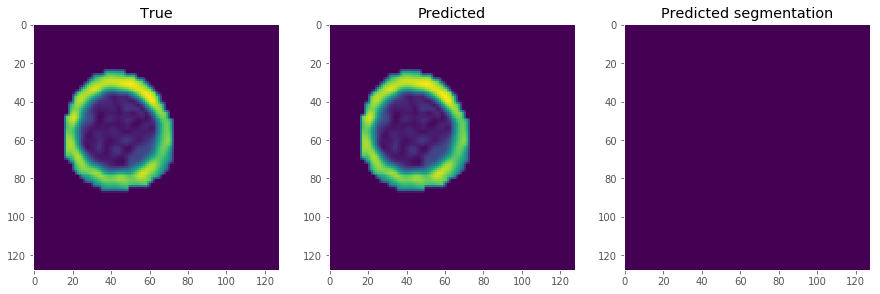

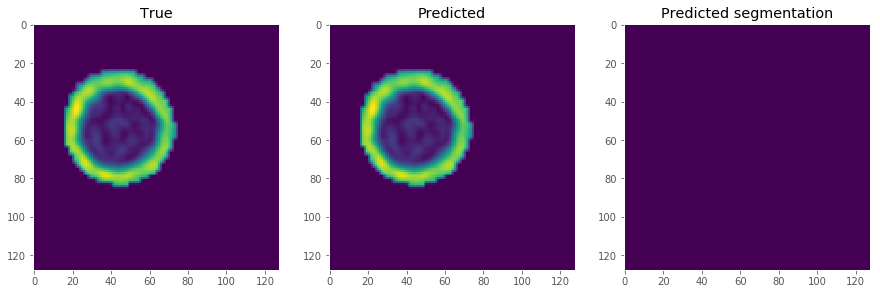

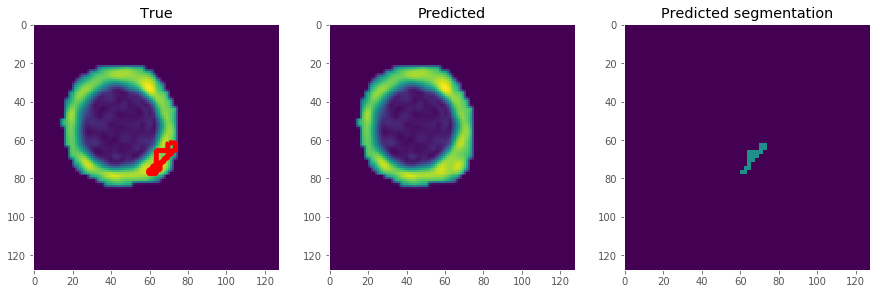

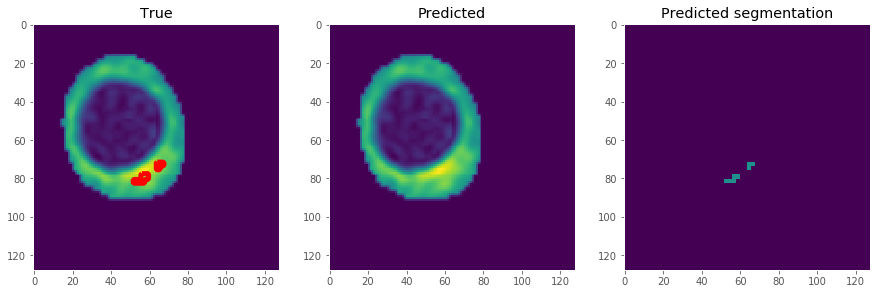

...

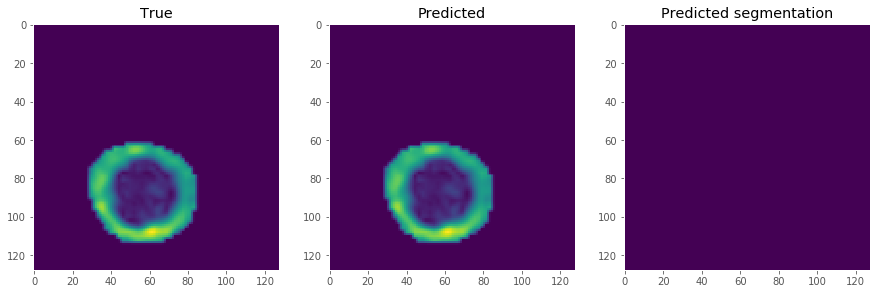

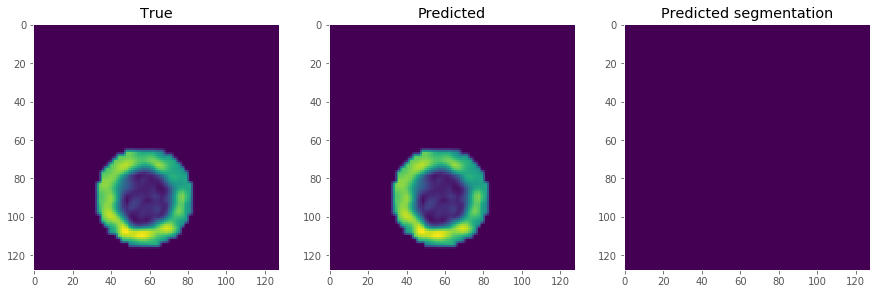

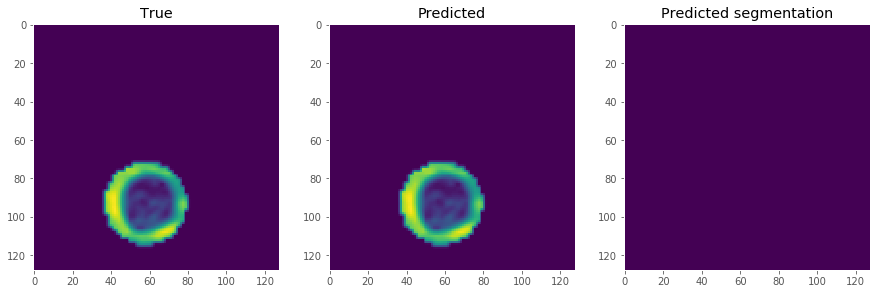

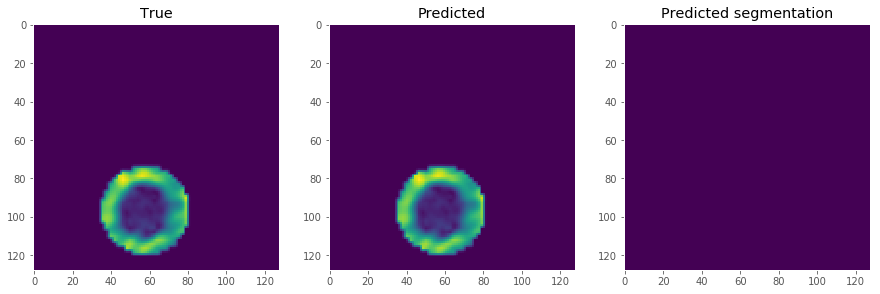

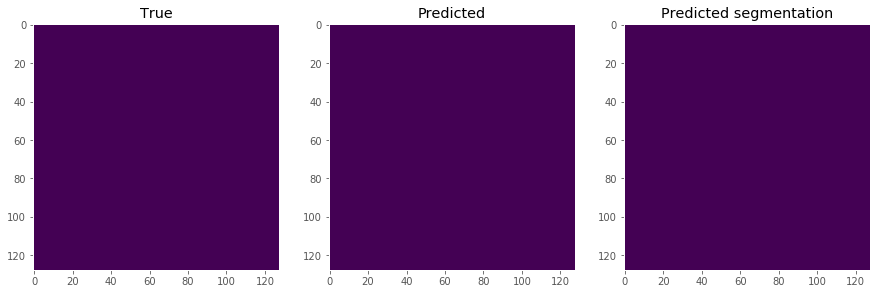

In [306]:
show_seg_slices(0, X_test_calc, y_test_calc, preds_test_calc_c3)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_34"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_647 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_613 (BatchN (None, 16, 128, 128, 64          conv3d_647[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 14 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8544 - acc: 0.7409 - dice_coef: 0.0036
Epoch 00001: val_loss improved from inf to 0.80257, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 179s 2s/sample - loss: 0.8514 - acc: 0.7544 - dice_coef: 0.0059 - val_loss: 0.8026 - val_acc: 0.9013 - val_dice_coef: 0.0057
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.8125 - acc: 0.9681 - dice_coef: 0.0072
Epoch 00002: val_loss did not improve from 0.80257
86/86 [==============================] - 3s 37ms/sample - loss: 0.8103 - acc: 0.9689 - dice_coef: 0.0109 - val_loss: 1.3764 - val_acc: 0.4680 - val_dice_coef: 0.0150
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7896 - acc: 0.9742 - dice_coef: 0.0123
Epoch 00003: val_loss did not improve from 0.80257
86/86 [==============================] - 3s 36ms/sample - loss: 0.7892 - acc: 0.9741 - dice_c

80/86 [==========================>...] - ETA: 0s - loss: 0.6535 - acc: 0.9939 - dice_coef: 0.0309
Epoch 00025: val_loss did not improve from 0.65947
86/86 [==============================] - 3s 36ms/sample - loss: 0.6528 - acc: 0.9940 - dice_coef: 0.0333 - val_loss: 0.7033 - val_acc: 0.9680 - val_dice_coef: 0.0374
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6522 - acc: 0.9943 - dice_coef: 0.0316
Epoch 00026: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.

Epoch 00026: val_loss did not improve from 0.65947
86/86 [==============================] - 3s 36ms/sample - loss: 0.6521 - acc: 0.9943 - dice_coef: 0.0322 - val_loss: 0.6836 - val_acc: 0.9802 - val_dice_coef: 0.0403
Epoch 27/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6531 - acc: 0.9947 - dice_coef: 0.0296
Epoch 00027: val_loss did not improve from 0.65947
86/86 [==============================] - 3s 36ms/sample - loss: 0.6524 - acc: 0.9948 - dice_coef: 0.0326 - val_lo

Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6498 - acc: 0.9950 - dice_coef: 0.0332
Epoch 00048: val_loss improved from 0.65239 to 0.65199, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.6513 - acc: 0.9951 - dice_coef: 0.0281 - val_loss: 0.6520 - val_acc: 0.9927 - val_dice_coef: 0.0450
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6498 - acc: 0.9953 - dice_coef: 0.0332
Epoch 00049: val_loss improved from 0.65199 to 0.65173, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 3s 40ms/sample - loss: 0.6507 - acc: 0.9952 - dice_coef: 0.0304 - val_loss: 0.6517 - val_acc: 0.9928 - val_dice_coef: 0.0450
Epoch 50/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6527 - acc: 0.9952 - dice_coef: 0.0288
Epoch 00050: val_loss improved from 0.65173 to 0.65141, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [===================

Epoch 70/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6489 - acc: 0.9945 - dice_coef: 0.0338
Epoch 00070: val_loss improved from 0.64771 to 0.64755, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.6503 - acc: 0.9946 - dice_coef: 0.0294 - val_loss: 0.6475 - val_acc: 0.9939 - val_dice_coef: 0.0455
Epoch 71/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6480 - acc: 0.9950 - dice_coef: 0.0353
Epoch 00071: val_loss improved from 0.64755 to 0.64737, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 4s 44ms/sample - loss: 0.6496 - acc: 0.9950 - dice_coef: 0.0297 - val_loss: 0.6474 - val_acc: 0.9940 - val_dice_coef: 0.0450
Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6529 - acc: 0.9951 - dice_coef: 0.0275
Epoch 00072: val_loss improved from 0.64737 to 0.64730, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [===================

Epoch 93/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6471 - acc: 0.9957 - dice_coef: 0.0345
Epoch 00093: val_loss improved from 0.64670 to 0.64665, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.6480 - acc: 0.9958 - dice_coef: 0.0314 - val_loss: 0.6466 - val_acc: 0.9946 - val_dice_coef: 0.0442
Epoch 94/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6501 - acc: 0.9956 - dice_coef: 0.0306
Epoch 00094: val_loss improved from 0.64665 to 0.64661, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.6486 - acc: 0.9954 - dice_coef: 0.0359 - val_loss: 0.6466 - val_acc: 0.9946 - val_dice_coef: 0.0442
Epoch 95/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6478 - acc: 0.9954 - dice_coef: 0.0334
Epoch 00095: val_loss did not improve from 0.64661
86/86 [==============================] - 3s 36ms/sample - loss: 0.6494 - acc: 

80/86 [==========================>...] - ETA: 0s - loss: 0.6461 - acc: 0.9959 - dice_coef: 0.0350
Epoch 00115: val_loss improved from 0.64476 to 0.64475, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 3s 41ms/sample - loss: 0.6470 - acc: 0.9958 - dice_coef: 0.0323 - val_loss: 0.6448 - val_acc: 0.9949 - val_dice_coef: 0.0438
Epoch 116/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6481 - acc: 0.9960 - dice_coef: 0.0319
Epoch 00116: val_loss improved from 0.64475 to 0.64474, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 4s 44ms/sample - loss: 0.6470 - acc: 0.9959 - dice_coef: 0.0360 - val_loss: 0.6447 - val_acc: 0.9949 - val_dice_coef: 0.0438
Epoch 117/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6471 - acc: 0.9961 - dice_coef: 0.0331
Epoch 00117: val_loss did not improve from 0.64474
86/86 [==============================] - 3s 36ms/sample - loss: 0.6469 - acc: 0.9961 - di

Epoch 139/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6457 - acc: 0.9953 - dice_coef: 0.0352
Epoch 00139: val_loss did not improve from 0.64415
86/86 [==============================] - 3s 37ms/sample - loss: 0.6465 - acc: 0.9954 - dice_coef: 0.0326 - val_loss: 0.6447 - val_acc: 0.9949 - val_dice_coef: 0.0443
Epoch 140/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6445 - acc: 0.9956 - dice_coef: 0.0365
Epoch 00140: val_loss did not improve from 0.64415
86/86 [==============================] - 3s 36ms/sample - loss: 0.6462 - acc: 0.9957 - dice_coef: 0.0304 - val_loss: 0.6446 - val_acc: 0.9950 - val_dice_coef: 0.0437
Epoch 141/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6461 - acc: 0.9960 - dice_coef: 0.0332
Epoch 00141: val_loss did not improve from 0.64415
86/86 [==============================] - 3s 37ms/sample - loss: 0.6467 - acc: 0.9961 - dice_coef: 0.0312 - val_loss: 0.6445 - val_acc: 0.9950 - val_dice_coef: 0.0433
Epoch 142/250

80/86 [==========================>...] - ETA: 0s - loss: 0.6428 - acc: 0.9960 - dice_coef: 0.0371
Epoch 00162: val_loss did not improve from 0.64322
86/86 [==============================] - 3s 36ms/sample - loss: 0.6446 - acc: 0.9961 - dice_coef: 0.0310 - val_loss: 0.6433 - val_acc: 0.9952 - val_dice_coef: 0.0431
Epoch 163/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6437 - acc: 0.9960 - dice_coef: 0.0362
Epoch 00163: val_loss did not improve from 0.64322
86/86 [==============================] - 3s 37ms/sample - loss: 0.6450 - acc: 0.9960 - dice_coef: 0.0320 - val_loss: 0.6433 - val_acc: 0.9952 - val_dice_coef: 0.0432
Epoch 164/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6464 - acc: 0.9962 - dice_coef: 0.0321
Epoch 00164: val_loss did not improve from 0.64322
86/86 [==============================] - 3s 36ms/sample - loss: 0.6448 - acc: 0.9962 - dice_coef: 0.0379 - val_loss: 0.6434 - val_acc: 0.9953 - val_dice_coef: 0.0428
Epoch 165/250
80/86 [======

Epoch 185/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6450 - acc: 0.9962 - dice_coef: 0.0335
Epoch 00185: val_loss improved from 0.64224 to 0.64219, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.6446 - acc: 0.9962 - dice_coef: 0.0347 - val_loss: 0.6422 - val_acc: 0.9952 - val_dice_coef: 0.0440
Epoch 186/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6427 - acc: 0.9960 - dice_coef: 0.0363
Epoch 00186: val_loss improved from 0.64219 to 0.64212, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.6440 - acc: 0.9960 - dice_coef: 0.0318 - val_loss: 0.6421 - val_acc: 0.9951 - val_dice_coef: 0.0445
Epoch 187/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6424 - acc: 0.9960 - dice_coef: 0.0370
Epoch 00187: val_loss did not improve from 0.64212
86/86 [==============================] - 3s 36ms/sample - loss: 0.6438 - ac

80/86 [==========================>...] - ETA: 0s - loss: 0.6411 - acc: 0.9964 - dice_coef: 0.0375
Epoch 00208: val_loss did not improve from 0.64094
86/86 [==============================] - 3s 36ms/sample - loss: 0.6419 - acc: 0.9964 - dice_coef: 0.0350 - val_loss: 0.6411 - val_acc: 0.9955 - val_dice_coef: 0.0426
Epoch 209/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6413 - acc: 0.9965 - dice_coef: 0.0371
Epoch 00209: val_loss improved from 0.64094 to 0.64089, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.6422 - acc: 0.9966 - dice_coef: 0.0338 - val_loss: 0.6409 - val_acc: 0.9955 - val_dice_coef: 0.0432
Epoch 210/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6437 - acc: 0.9962 - dice_coef: 0.0338
Epoch 00210: val_loss improved from 0.64089 to 0.64070, saving model to model_vessel-seg-3d_iph_cl3.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.6433 - acc: 0.9962 - di

Epoch 232/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6420 - acc: 0.9964 - dice_coef: 0.0358
Epoch 00232: val_loss did not improve from 0.63998
86/86 [==============================] - 3s 36ms/sample - loss: 0.6412 - acc: 0.9964 - dice_coef: 0.0384 - val_loss: 0.6403 - val_acc: 0.9954 - val_dice_coef: 0.0438
Epoch 233/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6415 - acc: 0.9962 - dice_coef: 0.0363
Epoch 00233: val_loss did not improve from 0.63998
86/86 [==============================] - 3s 36ms/sample - loss: 0.6412 - acc: 0.9962 - dice_coef: 0.0375 - val_loss: 0.6403 - val_acc: 0.9954 - val_dice_coef: 0.0437
Epoch 234/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6420 - acc: 0.9965 - dice_coef: 0.0348
Epoch 00234: val_loss did not improve from 0.63998
86/86 [==============================] - 3s 36ms/sample - loss: 0.6413 - acc: 0.9964 - dice_coef: 0.0378 - val_loss: 0.6403 - val_acc: 0.9955 - val_dice_coef: 0.0433
Epoch 235/250

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.18419258316264395, 0.2634030456720005)
Dice score:  0.6608795846135894
Jaccard score:  0.49351950682902407
Volume difference (mean absolute, mean):  (43.108351518248405, -41.84906912889591)
Centroid distance:  1.6581846205083448
Hausdorff distance:  4.009112118519034
Surface Dice score:  0.806473395698913
Added path length:  393.51162790697674
Detection rate (per patient, per slice):  (0.7093023255813954, 0.8662790697674418)


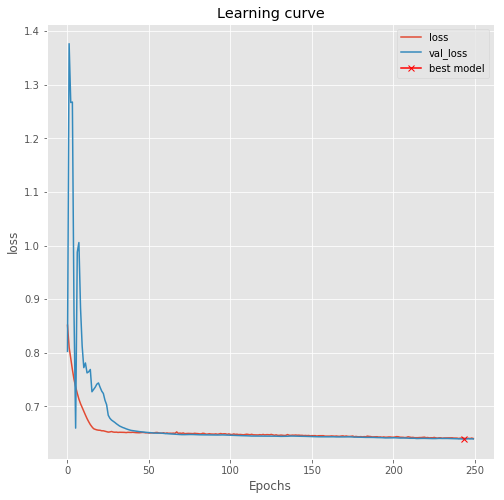

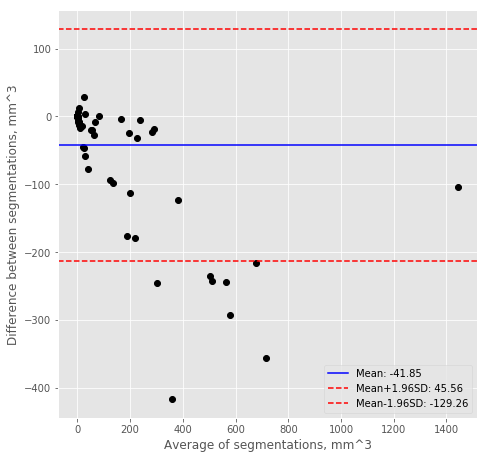


Validation
Voxel classification accuracy:  0.9954784938267299
Precision and recall:  (0.2174883074834806, 0.22375014878713304)
Dice score:  0.6078644516388214
Jaccard score:  0.43665127648017393
Volume difference (mean absolute, mean):  (38.89834111290319, 3.2164449329887117)
Centroid distance:  2.054384940866512
Hausdorff distance:  3.04463764917329
Surface Dice score:  0.7825206206955448
Added path length:  779.0714285714286
Detection rate (per patient, per slice):  (0.7142857142857143, 0.8348214285714286)


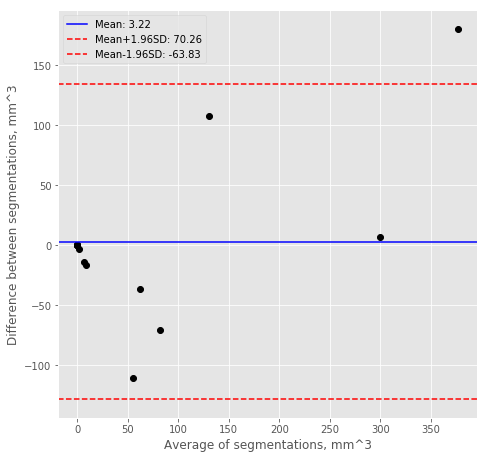


Test
Voxel classification accuracy:  0.997173817952474
Precision and recall:  (0.1445290378699136, 0.23896999107103103)
Dice score:  0.5811157180550321
Jaccard score:  0.4095739028796091
Volume difference (mean absolute, mean):  (27.317018524805704, -20.616832526524863)
Centroid distance:  1.8385939948603778
Hausdorff distance:  7.2860021302683835
Surface Dice score:  0.6898486638798463
Added path length:  375.4
Detection rate (per patient, per slice):  (0.7333333333333333, 0.9041666666666667)


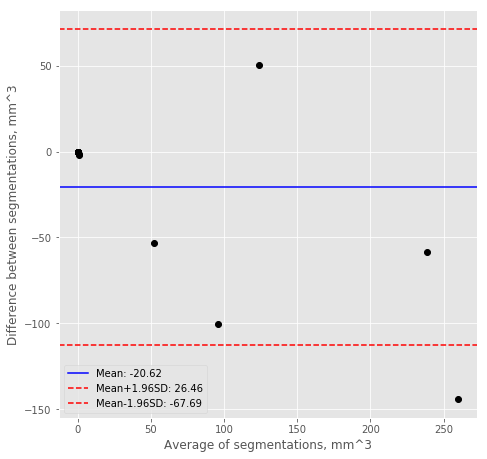

In [307]:
preds_train_iph_c3, preds_valid_iph_c3, preds_test_iph_c3 = train_evaluate_model('model_vessel-seg-3d_iph_cl3.h5',
                                                                                 custom_loss_3c,
                                                                                 X_train_iph, 
                                                                                 y_train_iph, 
                                                                                 X_valid_iph,
                                                                                 y_valid_iph, 
                                                                                 X_test_iph,
                                                                                 y_test_iph,
                                                                                 spacings_train_iph, 
                                                                                 spacings_valid_iph, 
                                                                                 spacings_test_iph)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


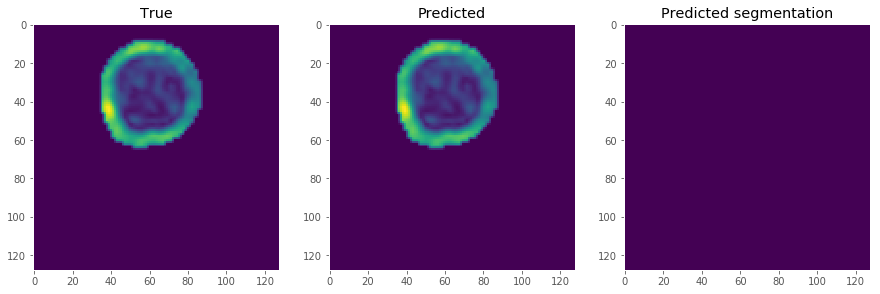

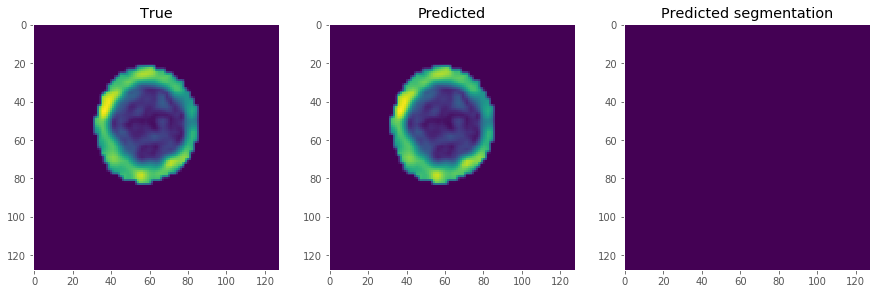

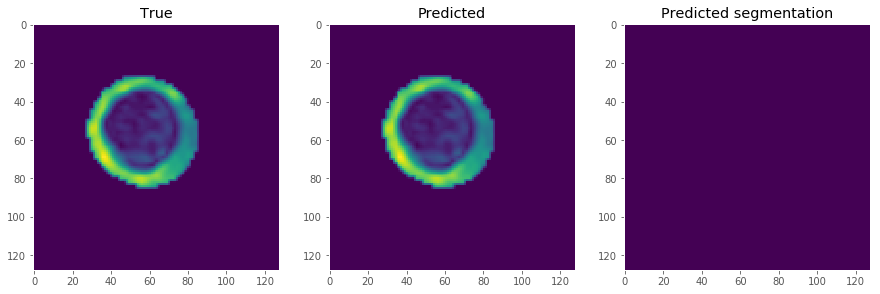

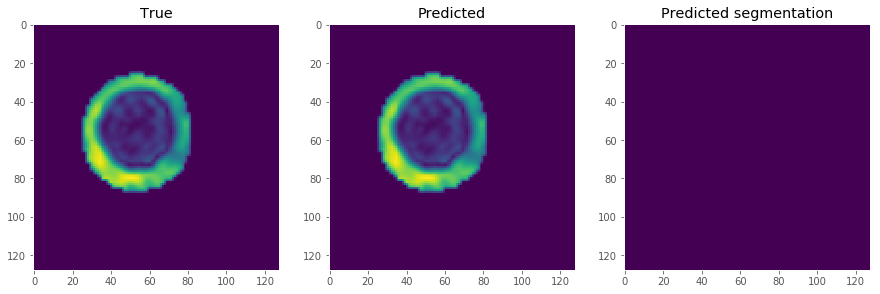

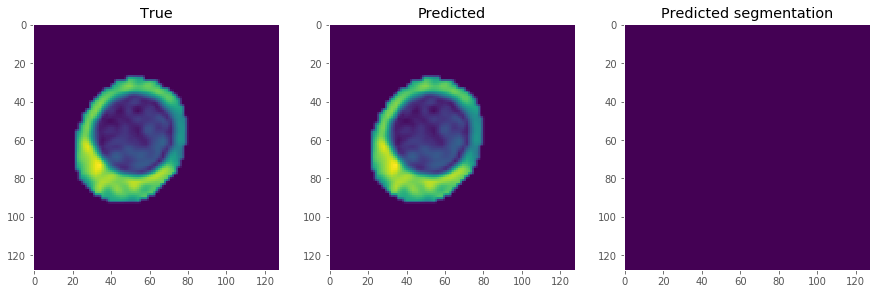

...

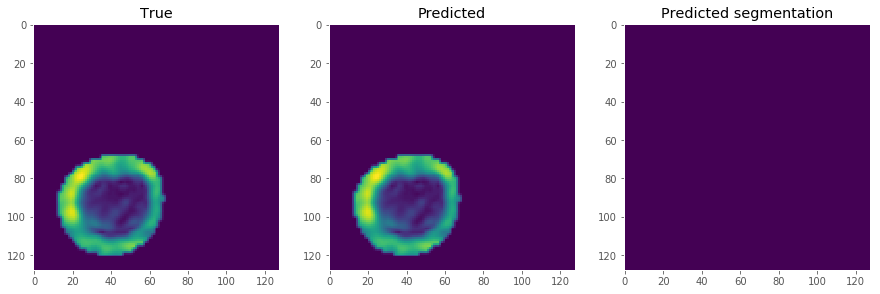

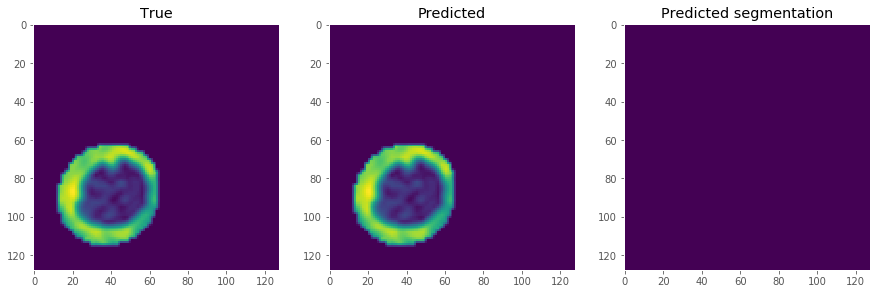

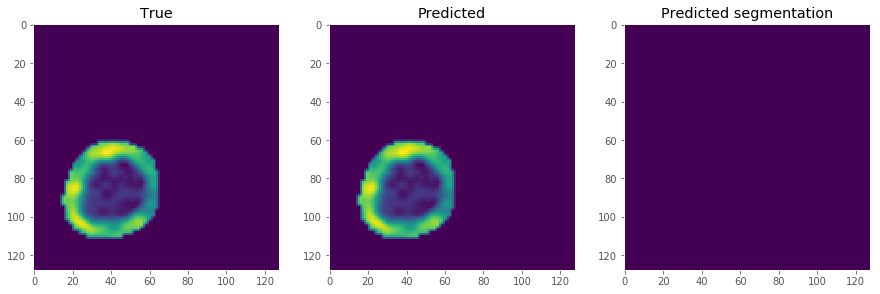

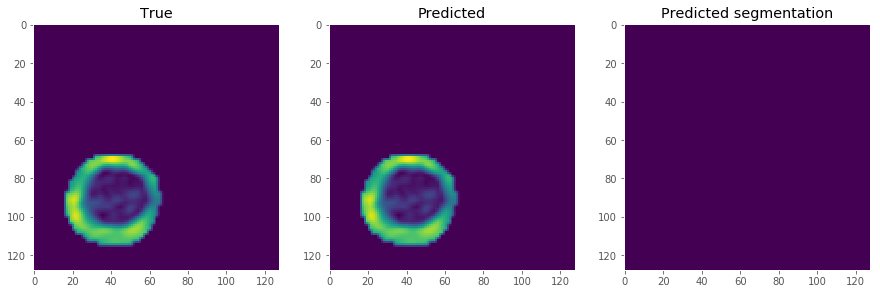

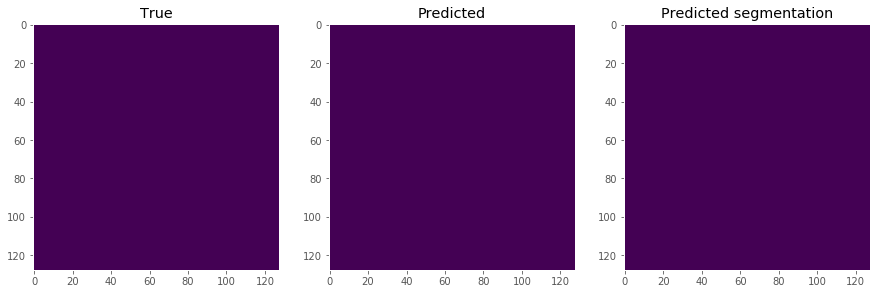

In [308]:
show_seg_slices(1, X_test_iph, y_test_iph, preds_test_iph_c3)

## Volumetric loss

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_39"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_742 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_703 (BatchN (None, 16, 128, 128, 64          conv3d_742[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7177 - acc: 0.8722 - dice_coef: 0.1671
Epoch 00001: val_loss improved from inf to 0.78991, saving model to model_vessel-seg-3d_lumen_vol.h5
86/86 [==============================] - 235s 3s/sample - loss: 0.7182 - acc: 0.8724 - dice_coef: 0.1650 - val_loss: 0.7899 - val_acc: 0.6368 - val_dice_coef: 0.0809
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6842 - acc: 0.8941 - dice_coef: 0.1697
Epoch 00002: val_loss improved from 0.78991 to 0.67462, saving model to model_vessel-seg-3d_lumen_vol.h5
86/86 [==============================] - 4s 44ms/sample - loss: 0.6762 - acc: 0.8926 - dice_coef: 0.1785 - val_loss: 0.6746 - val_acc: 0.8782 - val_dice_coef: 0.0975
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.6432 - acc: 0.8904 - dice_coef: 0.1433
Epoch 00003: val_loss improved from 0.67462 to 0.59504, saving model to model_vessel-seg

Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0774 - acc: 0.9369 - dice_coef: 0.1147
Epoch 00025: val_loss did not improve from 0.20994
86/86 [==============================] - 3s 37ms/sample - loss: 0.0754 - acc: 0.9365 - dice_coef: 0.1134 - val_loss: 0.3024 - val_acc: 0.8854 - val_dice_coef: 0.0643
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0321 - acc: 0.9373 - dice_coef: 0.0795
Epoch 00026: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00026: val_loss did not improve from 0.20994
86/86 [==============================] - 17s 194ms/sample - loss: 0.0306 - acc: 0.9375 - dice_coef: 0.0792 - val_loss: 0.2376 - val_acc: 0.8929 - val_dice_coef: 0.0843
Epoch 27/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0380 - acc: 0.9378 - dice_coef: 0.0788
Epoch 00027: val_loss improved from 0.20994 to 0.19584, saving model to model_vessel-seg-3d_lumen_vol.h5
86/86 [==============================] - 4s 

80/86 [==========================>...] - ETA: 0s - loss: 0.0245 - acc: 0.9359 - dice_coef: 0.1108
Epoch 00048: val_loss did not improve from 0.01729
86/86 [==============================] - 3s 37ms/sample - loss: 0.0294 - acc: 0.9366 - dice_coef: 0.1077 - val_loss: 0.0315 - val_acc: 0.9360 - val_dice_coef: 0.1027
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0361 - acc: 0.9361 - dice_coef: 0.1109
Epoch 00049: val_loss improved from 0.01729 to 0.01062, saving model to model_vessel-seg-3d_lumen_vol.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.0378 - acc: 0.9366 - dice_coef: 0.1084 - val_loss: 0.0106 - val_acc: 0.9363 - val_dice_coef: 0.1167
Epoch 50/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0216 - acc: 0.9377 - dice_coef: 0.1064
Epoch 00050: val_loss did not improve from 0.01062
86/86 [==============================] - 3s 37ms/sample - loss: 0.0269 - acc: 0.9367 - dice_coef: 0.1107 - val_loss: 0.0195 - val_acc: 0.9367

80/86 [==========================>...] - ETA: 0s - loss: 0.0251 - acc: 0.9367 - dice_coef: 0.1243
Epoch 00072: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0242 - acc: 0.9366 - dice_coef: 0.1253 - val_loss: 0.0155 - val_acc: 0.9384 - val_dice_coef: 0.1075
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0515 - acc: 0.9358 - dice_coef: 0.1260
Epoch 00073: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0546 - acc: 0.9366 - dice_coef: 0.1222 - val_loss: 0.0257 - val_acc: 0.9385 - val_dice_coef: 0.1248
Epoch 74/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0257 - acc: 0.9368 - dice_coef: 0.1242
Epoch 00074: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0240 - acc: 0.9366 - dice_coef: 0.1259 - val_loss: 0.0131 - val_acc: 0.9385 - val_dice_coef: 0.1101
Epoch 75/250
80/86 [=========

Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0178 - acc: 0.9369 - dice_coef: 0.1240
Epoch 00097: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0182 - acc: 0.9367 - dice_coef: 0.1242 - val_loss: 0.0102 - val_acc: 0.9388 - val_dice_coef: 0.1299
Epoch 98/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0384 - acc: 0.9362 - dice_coef: 0.1248
Epoch 00098: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0387 - acc: 0.9367 - dice_coef: 0.1219 - val_loss: 0.0207 - val_acc: 0.9388 - val_dice_coef: 0.1156
Epoch 99/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0386 - acc: 0.9366 - dice_coef: 0.1240
Epoch 00099: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0365 - acc: 0.9367 - dice_coef: 0.1246 - val_loss: 0.0102 - val_acc: 0.9388 - val_dice_coef: 0.1193
Epoch 100/250
80

Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0311 - acc: 0.9364 - dice_coef: 0.1266
Epoch 00122: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0321 - acc: 0.9367 - dice_coef: 0.1251 - val_loss: 0.0219 - val_acc: 0.9388 - val_dice_coef: 0.1175
Epoch 123/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0384 - acc: 0.9355 - dice_coef: 0.1286
Epoch 00123: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0460 - acc: 0.9368 - dice_coef: 0.1216 - val_loss: 0.0229 - val_acc: 0.9388 - val_dice_coef: 0.1140
Epoch 124/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0423 - acc: 0.9370 - dice_coef: 0.1253
Epoch 00124: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0399 - acc: 0.9367 - dice_coef: 0.1275 - val_loss: 0.0237 - val_acc: 0.9388 - val_dice_coef: 0.1135
Epoch 125/250

Epoch 147/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0422 - acc: 0.9375 - dice_coef: 0.1274
Epoch 00147: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0420 - acc: 0.9368 - dice_coef: 0.1309 - val_loss: 0.0047 - val_acc: 0.9389 - val_dice_coef: 0.1313
Epoch 148/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0362 - acc: 0.9368 - dice_coef: 0.1289
Epoch 00148: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0349 - acc: 0.9368 - dice_coef: 0.1293 - val_loss: 0.0233 - val_acc: 0.9389 - val_dice_coef: 0.1157
Epoch 149/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0256 - acc: 0.9378 - dice_coef: 0.1271
Epoch 00149: val_loss did not improve from 0.00315
86/86 [==============================] - 3s 37ms/sample - loss: 0.0296 - acc: 0.9368 - dice_coef: 0.1310 - val_loss: 0.0121 - val_acc: 0.9389 - val_dice_coef: 0.1234
Epoch 150/250

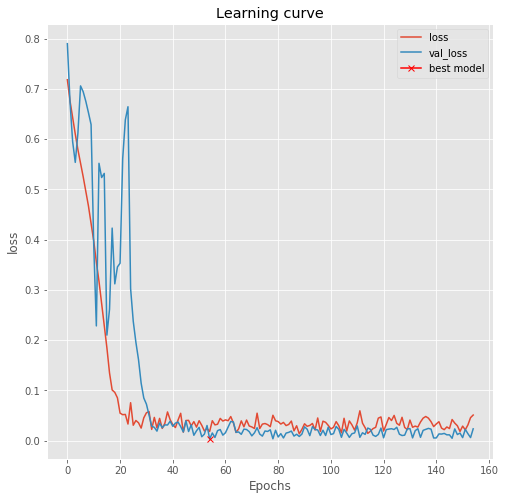

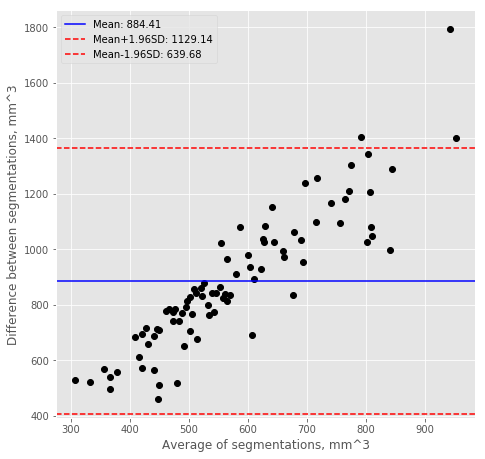


Validation
Voxel classification accuracy:  0.9374156278722426


C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.1339932156512751, 0.01765410078679454)
Dice score:  0.02930827460193161
Jaccard score:  0.014873814527665436
Volume difference (mean absolute, mean):  (926.2011191091117, 926.2011191091117)
Centroid distance:  5.044055306013669
Hausdorff distance:  14.201018680229225
Surface Dice score:  0.26106008261853514
Added path length:  8298.70588235294
Detection rate (per patient, per slice):  (0.9411764705882353, 0.24632352941176472)


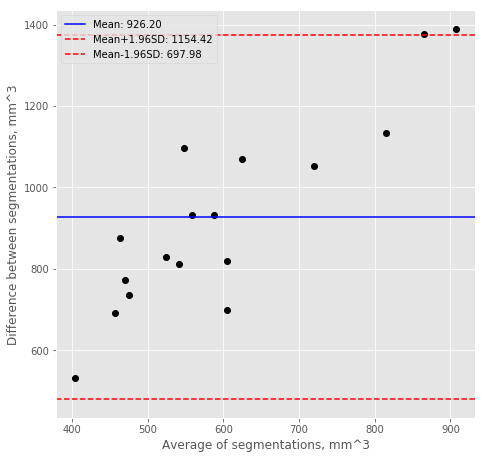


Test
Voxel classification accuracy:  0.9348554611206055
Precision and recall:  (0.13764893431484163, 0.01668999710784077)
Dice score:  0.029260459299681674
Jaccard score:  0.014849819244673488
Volume difference (mean absolute, mean):  (689.6067417263985, 689.6067417263985)
Centroid distance:  4.925026616983943
Hausdorff distance:  13.691164246176038
Surface Dice score:  0.23659290226175242
Added path length:  9018.25
Detection rate (per patient, per slice):  (1.0, 0.2864583333333333)


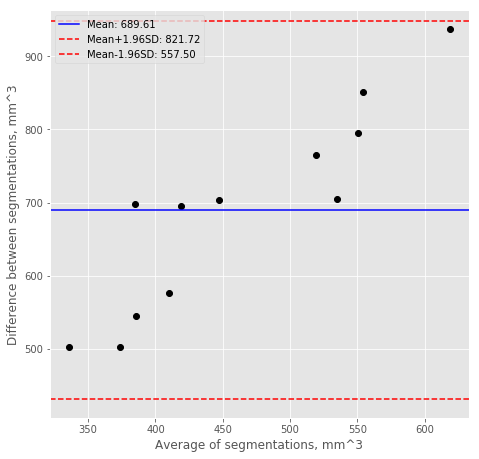

In [323]:
preds_train_lumen_vol, preds_valid_lumen_vol, preds_test_lumen_vol = train_evaluate_model('model_vessel-seg-3d_lumen_vol.h5',
                                                                                       normvoldif, 
                                                                                       X_train_lumen, 
                                                                                       y_train_lumen, 
                                                                                       X_valid_lumen, 
                                                                                       y_valid_lumen, 
                                                                                       X_test_lumen,
                                                                                       y_test_lumen,
                                                                                       spacings_train_lumen, 
                                                                                       spacings_valid_lumen, 
                                                                                       spacings_test_lumen)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


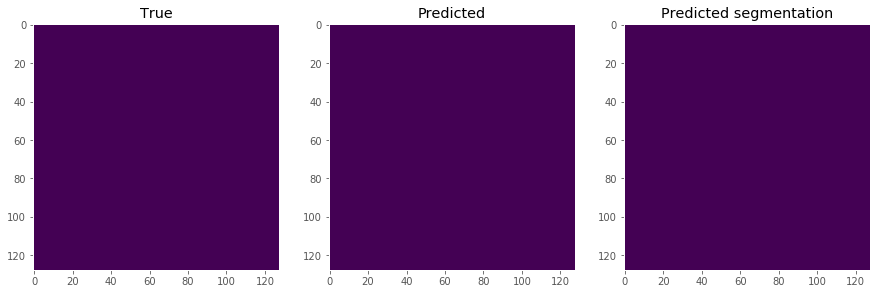

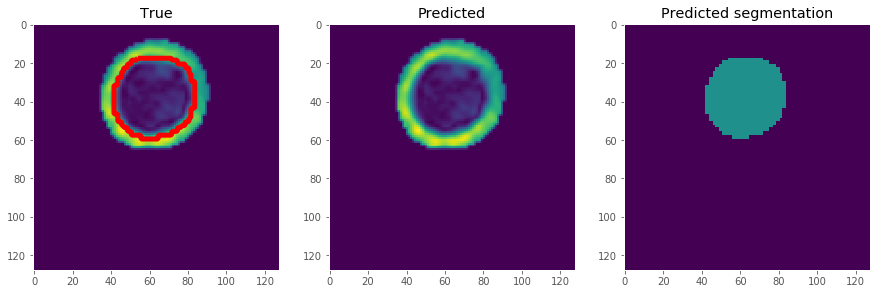

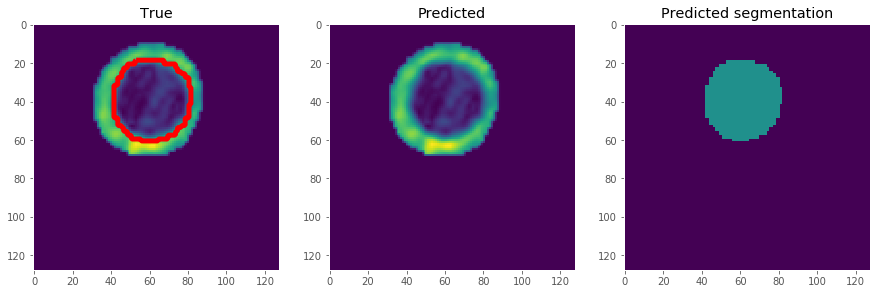

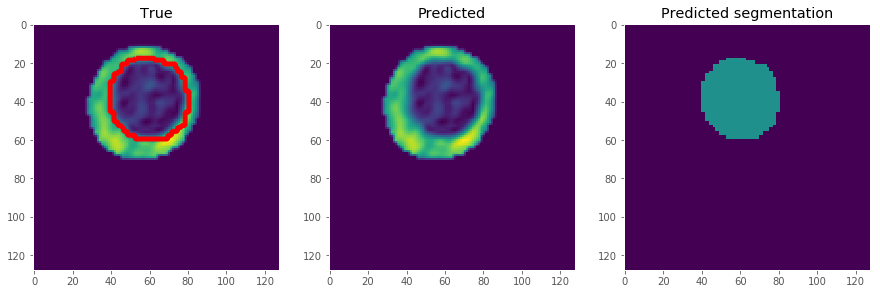

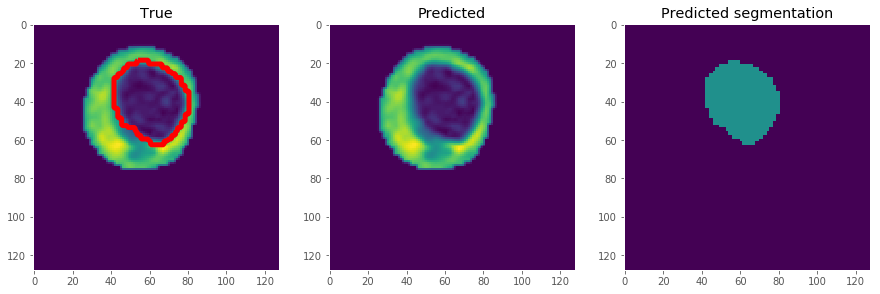

...

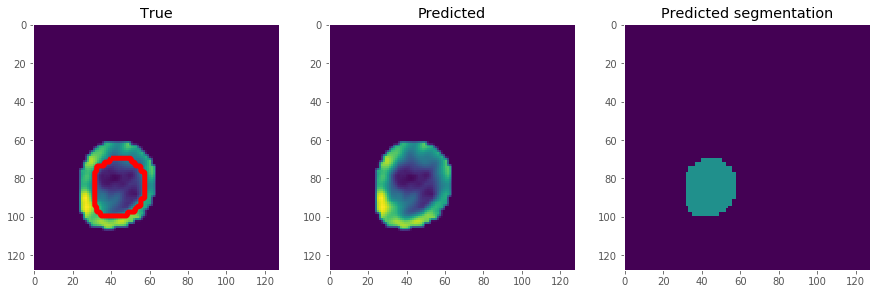

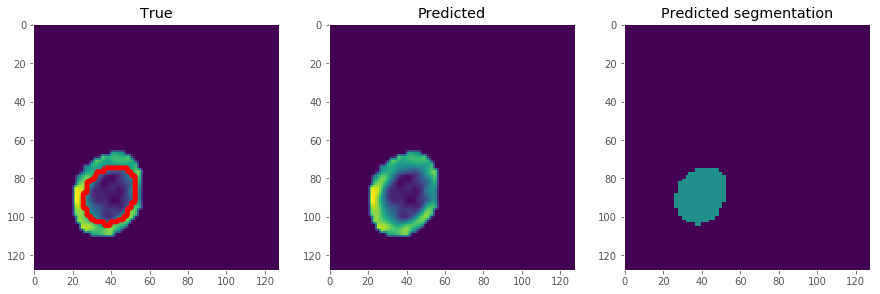

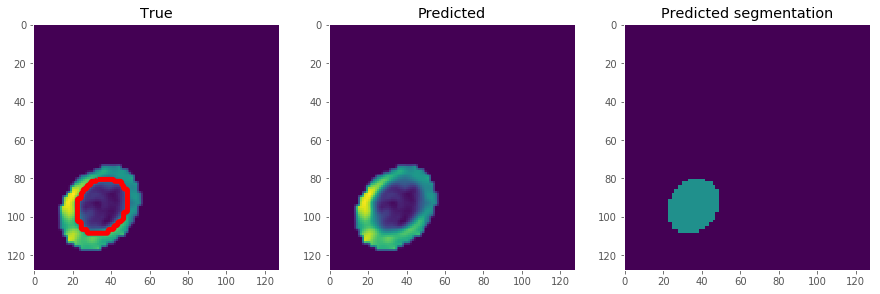

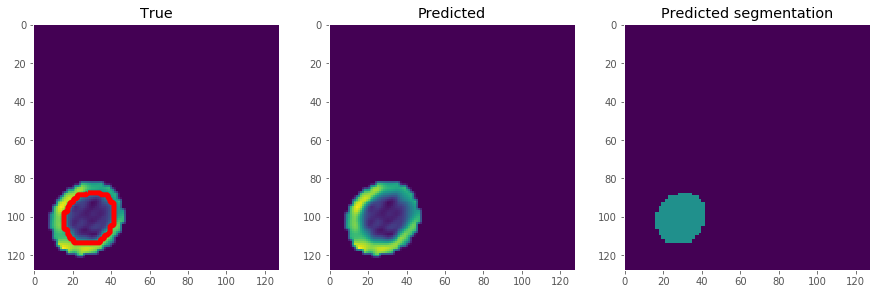

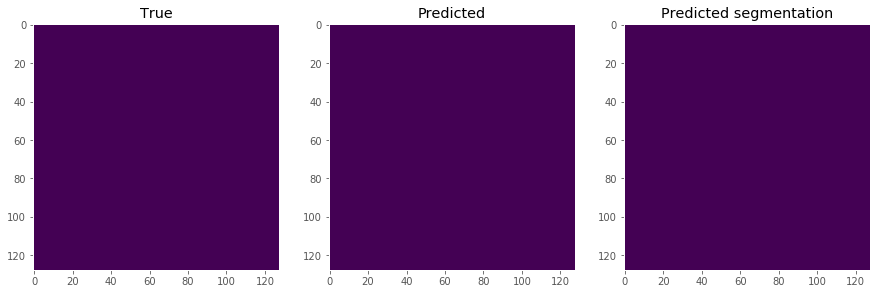

In [324]:
show_seg_slices(0, X_test_lumen, y_test_lumen, preds_test_lumen_vol)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_40"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_761 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_721 (BatchN (None, 16, 128, 128, 64          conv3d_761[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9789 - acc: 0.8570 - dice_coef: 0.0194
Epoch 00001: val_loss improved from inf to 0.98723, saving model to model_vessel-seg-3d_lipid_vol.h5
86/86 [==============================] - 256s 3s/sample - loss: 0.9776 - acc: 0.8586 - dice_coef: 0.0223 - val_loss: 0.9872 - val_acc: 0.6013 - val_dice_coef: 0.0143
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9719 - acc: 0.9023 - dice_coef: 0.0262
Epoch 00002: val_loss improved from 0.98723 to 0.98343, saving model to model_vessel-seg-3d_lipid_vol.h5
86/86 [==============================] - 4s 44ms/sample - loss: 0.9723 - acc: 0.9017 - dice_coef: 0.0254 - val_loss: 0.9834 - val_acc: 0.8566 - val_dice_coef: 0.0117
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9673 - acc: 0.9111 - dice_coef: 0.0310
Epoch 00003: val_loss improved from 0.98343 to 0.98208, saving model to model_vessel-seg

Epoch 23/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7960 - acc: 0.9947 - dice_coef: 0.0156
Epoch 00023: val_loss improved from 0.81876 to 0.73722, saving model to model_vessel-seg-3d_lipid_vol.h5
86/86 [==============================] - 5s 60ms/sample - loss: 0.8003 - acc: 0.9949 - dice_coef: 0.0142 - val_loss: 0.7372 - val_acc: 0.9966 - val_dice_coef: 0.0026
Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7565 - acc: 0.9957 - dice_coef: 0.0102
Epoch 00024: val_loss improved from 0.73722 to 0.68549, saving model to model_vessel-seg-3d_lipid_vol.h5
86/86 [==============================] - 4s 42ms/sample - loss: 0.7628 - acc: 0.9958 - dice_coef: 0.0094 - val_loss: 0.6855 - val_acc: 0.9967 - val_dice_coef: 0.0033
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.7214 - acc: 0.9957 - dice_coef: 0.0103
Epoch 00025: val_loss improved from 0.68549 to 0.66995, saving model to model_vessel-seg-3d_lipid_vol.h5
86/86 [=============

80/86 [==========================>...] - ETA: 0s - loss: 0.2921 - acc: 0.9957 - dice_coef: 0.0046
Epoch 00046: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.2844 - acc: 0.9958 - dice_coef: 0.0045 - val_loss: 0.2078 - val_acc: 0.9967 - val_dice_coef: 0.0034
Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1559 - acc: 0.9956 - dice_coef: 0.0051
Epoch 00047: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.1829 - acc: 0.9958 - dice_coef: 0.0047 - val_loss: 0.1584 - val_acc: 0.9967 - val_dice_coef: 0.0021
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1337 - acc: 0.9962 - dice_coef: 0.0049
Epoch 00048: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.1479 - acc: 0.9958 - dice_coef: 0.0053 - val_loss: 0.1371 - val_acc: 0.9967 - val_dice_coef: 0.0031
Epoch 49/250
80/86 [=========

Epoch 71/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1577 - acc: 0.9957 - dice_coef: 0.0045
Epoch 00071: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.1614 - acc: 0.9958 - dice_coef: 0.0043 - val_loss: 0.2153 - val_acc: 0.9967 - val_dice_coef: 0.0040
Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1079 - acc: 0.9956 - dice_coef: 0.0047
Epoch 00072: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.1315 - acc: 0.9958 - dice_coef: 0.0044 - val_loss: 0.2237 - val_acc: 0.9967 - val_dice_coef: 0.0090
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1023 - acc: 0.9957 - dice_coef: 0.0045
Epoch 00073: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.1081 - acc: 0.9958 - dice_coef: 0.0045 - val_loss: 0.1983 - val_acc: 0.9967 - val_dice_coef: 0.0039
Epoch 74/250
80/

Epoch 96/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1470 - acc: 0.9957 - dice_coef: 0.0047
Epoch 00096: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.1587 - acc: 0.9958 - dice_coef: 0.0042 - val_loss: 0.1429 - val_acc: 0.9967 - val_dice_coef: 0.0038
Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1728 - acc: 0.9957 - dice_coef: 0.0048
Epoch 00097: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.1856 - acc: 0.9958 - dice_coef: 0.0043 - val_loss: 0.1516 - val_acc: 0.9967 - val_dice_coef: 0.0063
Epoch 98/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1441 - acc: 0.9957 - dice_coef: 0.0046
Epoch 00098: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.1517 - acc: 0.9958 - dice_coef: 0.0044 - val_loss: 0.1375 - val_acc: 0.9967 - val_dice_coef: 0.0037
Epoch 99/250
80/

Epoch 121/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1196 - acc: 0.9961 - dice_coef: 0.0046
Epoch 00121: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.1334 - acc: 0.9958 - dice_coef: 0.0051 - val_loss: 0.1058 - val_acc: 0.9967 - val_dice_coef: 0.0044
Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1422 - acc: 0.9958 - dice_coef: 0.0048
Epoch 00122: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.1343 - acc: 0.9958 - dice_coef: 0.0048 - val_loss: 0.1262 - val_acc: 0.9967 - val_dice_coef: 0.0037
Epoch 123/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1852 - acc: 0.9957 - dice_coef: 0.0046
Epoch 00123: val_loss did not improve from 0.03488
86/86 [==============================] - 3s 37ms/sample - loss: 0.1829 - acc: 0.9958 - dice_coef: 0.0044 - val_loss: 0.3025 - val_acc: 0.9967 - val_dice_coef: 0.0100
Epoch 124/250

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.0, 0.0)
Dice score:  1.0627557255964714e-05
Jaccard score:  1.0627557255964714e-05
Volume difference (mean absolute, mean):  (69.84631239570851, 69.84631239570851)
Centroid distance:  nan


C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\numpy\core\fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Hausdorff distance:  nan
Surface Dice score:  nan
Added path length:  1007.1976744186046
Detection rate (per patient, per slice):  (0.4069767441860465, 0.7776162790697675)


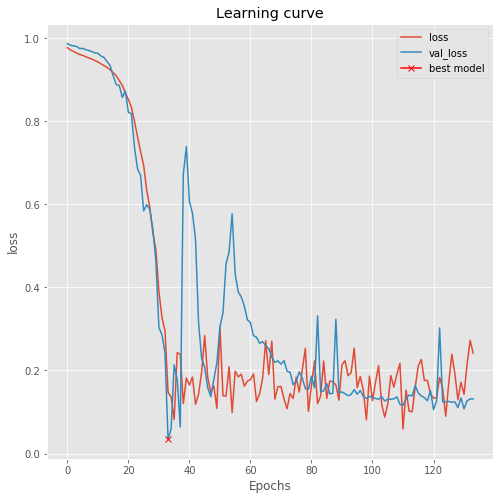

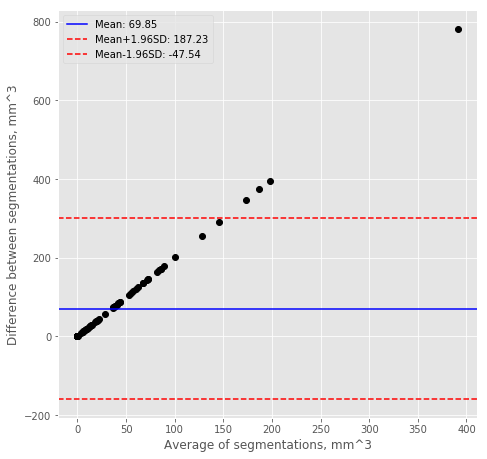


Validation
Voxel classification accuracy:  0.9967249702004826
Precision and recall:  (0.0, 0.0)
Dice score:  6.851192107426693e-05
Jaccard score:  6.851192107426693e-05
Volume difference (mean absolute, mean):  (93.91629758827827, 93.91629758827827)
Centroid distance:  nan
Hausdorff distance:  nan
Surface Dice score:  nan
Added path length:  848.8235294117648
Detection rate (per patient, per slice):  (0.4117647058823529, 0.7720588235294118)


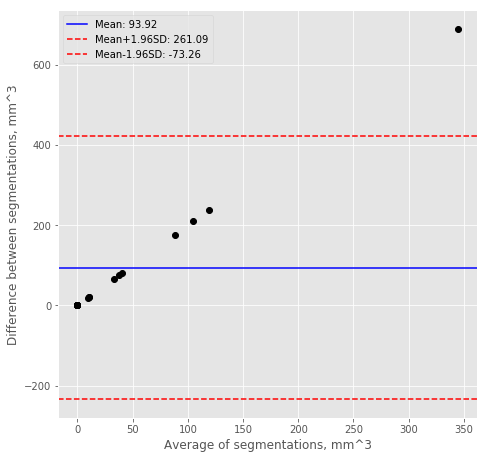


Test
Voxel classification accuracy:  0.9963258107503256
Precision and recall:  (0.0, 0.0)
Dice score:  8.651267410675664e-05
Jaccard score:  8.651267410675664e-05
Volume difference (mean absolute, mean):  (64.3729731887579, 64.3729731887579)
Centroid distance:  nan
Hausdorff distance:  nan
Surface Dice score:  nan
Added path length:  872.75
Detection rate (per patient, per slice):  (0.4166666666666667, 0.7604166666666666)


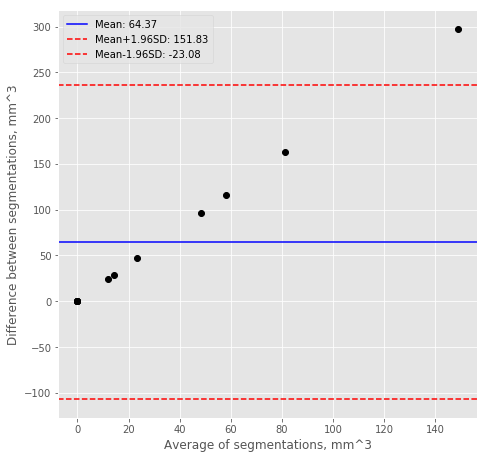

In [325]:
preds_train_lipid_vol, preds_valid_lipid_vol, preds_test_lipid_vol = train_evaluate_model('model_vessel-seg-3d_lipid_vol.h5',
                                                                                       normvoldif, 
                                                                                       X_train_lipid, 
                                                                                       y_train_lipid, 
                                                                                       X_valid_lipid, 
                                                                                       y_valid_lipid, 
                                                                                       X_test_lipid, 
                                                                                       y_test_lipid,
                                                                                       spacings_train_lipid, 
                                                                                       spacings_valid_lipid, 
                                                                                       spacings_test_lipid)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


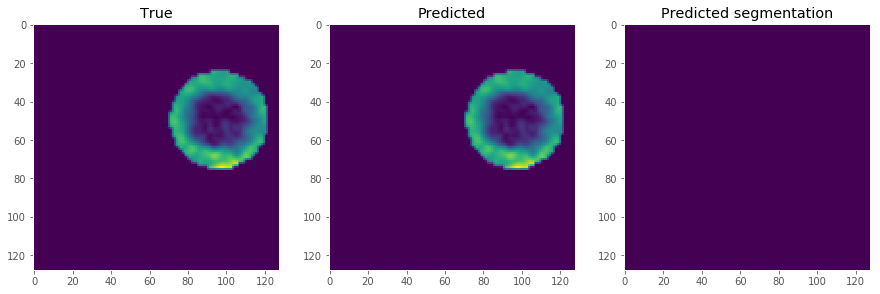

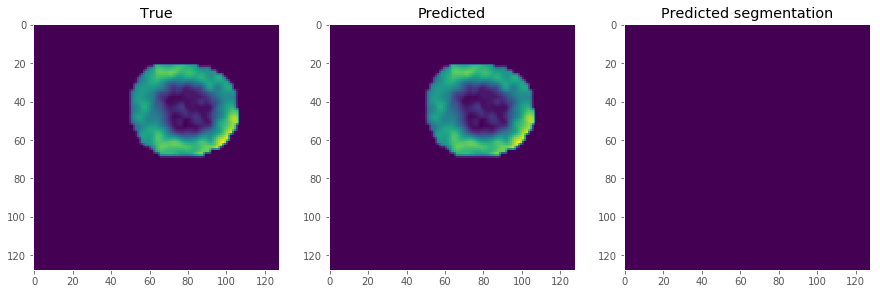

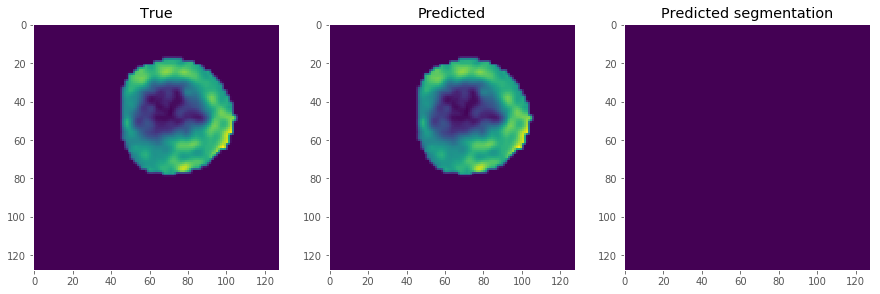

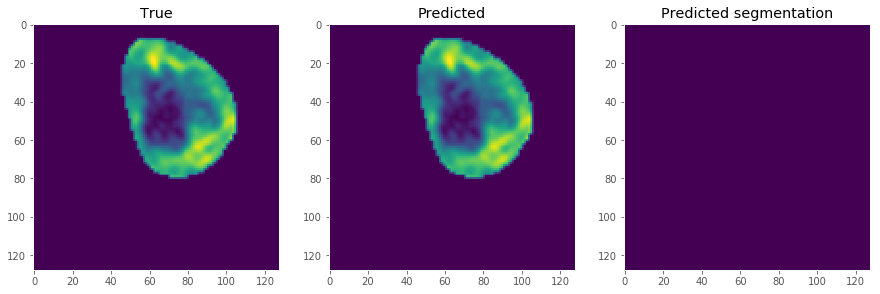

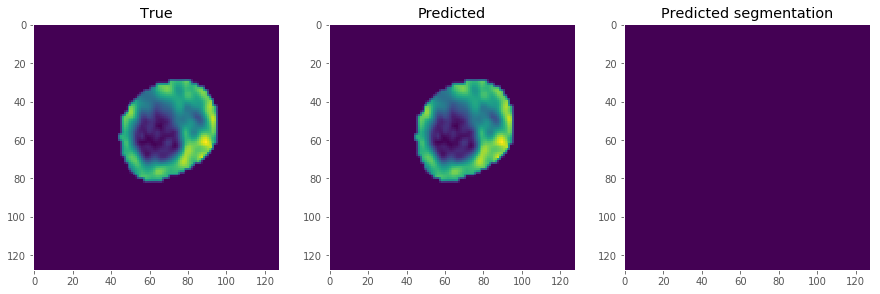

...

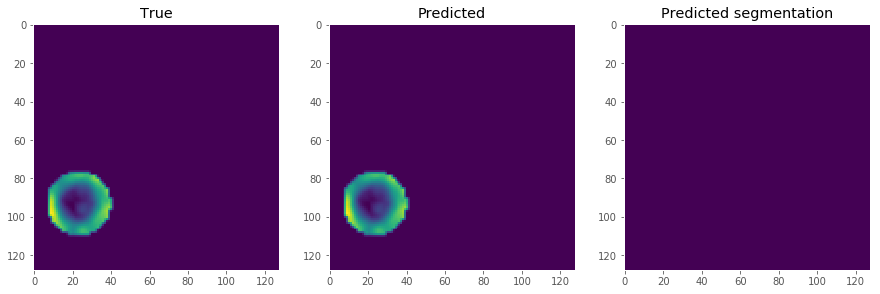

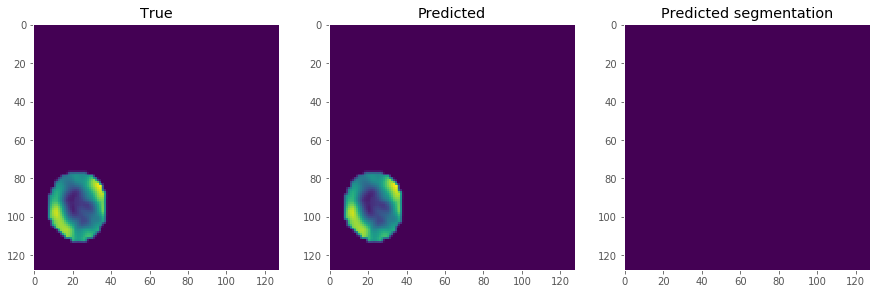

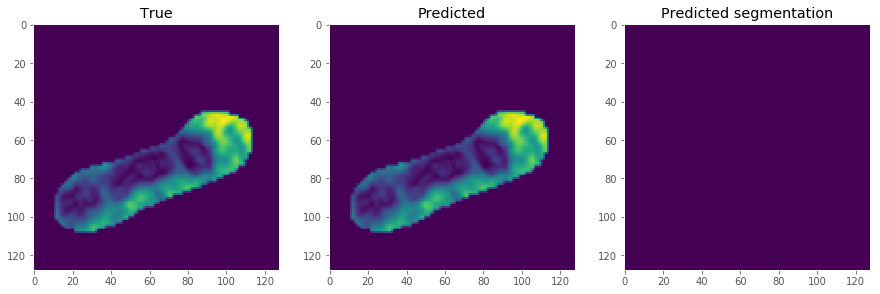

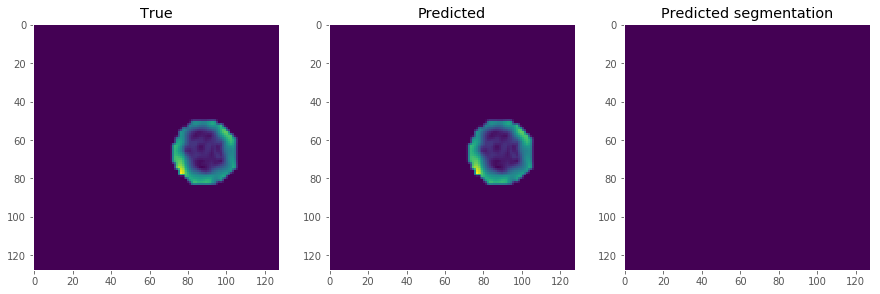

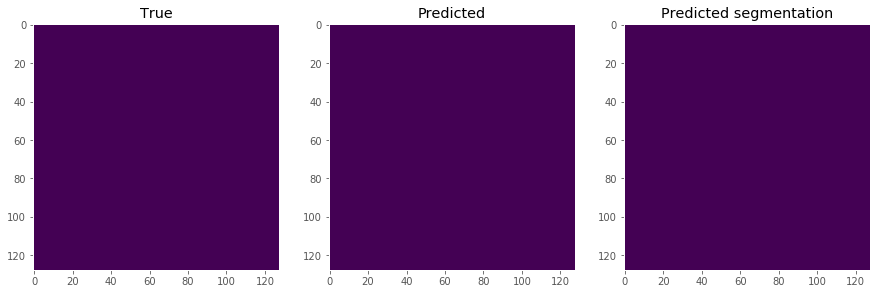

In [326]:
show_seg_slices(0, X_test_lipid, y_test_lipid, preds_test_lipid_vol)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_41"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_780 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_739 (BatchN (None, 16, 128, 128, 64          conv3d_780[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 17 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9784 - acc: 0.7620 - dice_coef: 0.0192
Epoch 00001: val_loss improved from inf to 0.98477, saving model to model_vessel-seg-3d_calc_vol.h5
86/86 [==============================] - 255s 3s/sample - loss: 0.9781 - acc: 0.7642 - dice_coef: 0.0201 - val_loss: 0.9848 - val_acc: 0.3208 - val_dice_coef: 0.0221
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9747 - acc: 0.8064 - dice_coef: 0.0235
Epoch 00002: val_loss improved from 0.98477 to 0.98161, saving model to model_vessel-seg-3d_calc_vol.h5
86/86 [==============================] - 4s 45ms/sample - loss: 0.9750 - acc: 0.8074 - dice_coef: 0.0228 - val_loss: 0.9816 - val_acc: 0.6172 - val_dice_coef: 0.0149
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9715 - acc: 0.8371 - dice_coef: 0.0249
Epoch 00003: val_loss improved from 0.98161 to 0.97999, saving model to model_vessel-seg-3

80/86 [==========================>...] - ETA: 0s - loss: 0.9251 - acc: 0.9917 - dice_coef: 0.0207
Epoch 00023: val_loss did not improve from 0.92153
86/86 [==============================] - 3s 37ms/sample - loss: 0.9225 - acc: 0.9916 - dice_coef: 0.0213 - val_loss: 0.9482 - val_acc: 0.8955 - val_dice_coef: 0.0271
Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9180 - acc: 0.9927 - dice_coef: 0.0186
Epoch 00024: val_loss improved from 0.92153 to 0.90810, saving model to model_vessel-seg-3d_calc_vol.h5
86/86 [==============================] - 4s 45ms/sample - loss: 0.9140 - acc: 0.9924 - dice_coef: 0.0201 - val_loss: 0.9081 - val_acc: 0.9805 - val_dice_coef: 0.0350
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9099 - acc: 0.9935 - dice_coef: 0.0146
Epoch 00025: val_loss did not improve from 0.90810
86/86 [==============================] - 3s 37ms/sample - loss: 0.9030 - acc: 0.9932 - dice_coef: 0.0175 - val_loss: 0.9402 - val_acc: 0.8969 

86/86 [==============================] - 4s 43ms/sample - loss: 0.1056 - acc: 0.9952 - dice_coef: 0.0060 - val_loss: 0.1001 - val_acc: 0.9946 - val_dice_coef: 0.0015
Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1056 - acc: 0.9953 - dice_coef: 0.0068
Epoch 00047: val_loss did not improve from 0.10013
86/86 [==============================] - 3s 37ms/sample - loss: 0.1005 - acc: 0.9952 - dice_coef: 0.0069 - val_loss: 0.1949 - val_acc: 0.9946 - val_dice_coef: 0.0034
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0619 - acc: 0.9950 - dice_coef: 0.0084
Epoch 00048: val_loss did not improve from 0.10013
86/86 [==============================] - 3s 37ms/sample - loss: 0.0817 - acc: 0.9952 - dice_coef: 0.0077 - val_loss: 0.2824 - val_acc: 0.9946 - val_dice_coef: 0.0030
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1234 - acc: 0.9952 - dice_coef: 0.0096
Epoch 00049: val_loss did not improve from 0.10013
86/86 [=========

Epoch 71/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0626 - acc: 0.9950 - dice_coef: 0.0071
Epoch 00071: val_loss did not improve from 0.02835
86/86 [==============================] - 3s 37ms/sample - loss: 0.0866 - acc: 0.9952 - dice_coef: 0.0067 - val_loss: 0.1781 - val_acc: 0.9946 - val_dice_coef: 0.0038
Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0736 - acc: 0.9952 - dice_coef: 0.0077
Epoch 00072: val_loss did not improve from 0.02835
86/86 [==============================] - 3s 37ms/sample - loss: 0.0704 - acc: 0.9952 - dice_coef: 0.0076 - val_loss: 0.0555 - val_acc: 0.9946 - val_dice_coef: 0.0072
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0827 - acc: 0.9951 - dice_coef: 0.0082
Epoch 00073: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.

Epoch 00073: val_loss did not improve from 0.02835
86/86 [==============================] - 18s 206ms/sample - loss: 0.0894 - acc: 0.9952 - dice_coef: 

80/86 [==========================>...] - ETA: 0s - loss: 0.0893 - acc: 0.9951 - dice_coef: 0.0101
Epoch 00095: val_loss did not improve from 0.02835
86/86 [==============================] - 3s 38ms/sample - loss: 0.0970 - acc: 0.9952 - dice_coef: 0.0099 - val_loss: 0.0430 - val_acc: 0.9946 - val_dice_coef: 0.0116
Epoch 96/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1055 - acc: 0.9955 - dice_coef: 0.0096
Epoch 00096: val_loss did not improve from 0.02835
86/86 [==============================] - 3s 37ms/sample - loss: 0.1157 - acc: 0.9952 - dice_coef: 0.0105 - val_loss: 0.0724 - val_acc: 0.9946 - val_dice_coef: 0.0098
Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0921 - acc: 0.9951 - dice_coef: 0.0103
Epoch 00097: val_loss did not improve from 0.02835
86/86 [==============================] - 3s 37ms/sample - loss: 0.0943 - acc: 0.9952 - dice_coef: 0.0097 - val_loss: 0.0612 - val_acc: 0.9946 - val_dice_coef: 0.0108
Epoch 98/250
80/86 [=========

Epoch 120/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0792 - acc: 0.9953 - dice_coef: 0.0103
Epoch 00120: val_loss did not improve from 0.02835
86/86 [==============================] - 3s 37ms/sample - loss: 0.0806 - acc: 0.9952 - dice_coef: 0.0100 - val_loss: 0.1533 - val_acc: 0.9946 - val_dice_coef: 0.0060
Epoch 121/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0603 - acc: 0.9952 - dice_coef: 0.0104
Epoch 00121: val_loss did not improve from 0.02835
86/86 [==============================] - 3s 37ms/sample - loss: 0.0597 - acc: 0.9952 - dice_coef: 0.0103 - val_loss: 0.0988 - val_acc: 0.9946 - val_dice_coef: 0.0087
Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0710 - acc: 0.9952 - dice_coef: 0.0104
Epoch 00122: val_loss did not improve from 0.02835
86/86 [==============================] - 3s 37ms/sample - loss: 0.0673 - acc: 0.9952 - dice_coef: 0.0103 - val_loss: 0.0984 - val_acc: 0.9946 - val_dice_coef: 0.0087
Epoch 123/250

Epoch 145/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1193 - acc: 0.9951 - dice_coef: 0.0107
Epoch 00145: val_loss did not improve from 0.02835
86/86 [==============================] - 3s 37ms/sample - loss: 0.1258 - acc: 0.9952 - dice_coef: 0.0101 - val_loss: 0.0676 - val_acc: 0.9946 - val_dice_coef: 0.0110
Epoch 146/250
80/86 [==========================>...] - ETA: 0s - loss: 0.0694 - acc: 0.9952 - dice_coef: 0.0105
Epoch 00146: val_loss did not improve from 0.02835
86/86 [==============================] - 3s 37ms/sample - loss: 0.0654 - acc: 0.9952 - dice_coef: 0.0105 - val_loss: 0.0720 - val_acc: 0.9946 - val_dice_coef: 0.0105
Epoch 147/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1062 - acc: 0.9952 - dice_coef: 0.0105
Epoch 00147: val_loss did not improve from 0.02835
86/86 [==============================] - 3s 37ms/sample - loss: 0.0994 - acc: 0.9952 - dice_coef: 0.0107 - val_loss: 0.1069 - val_acc: 0.9946 - val_dice_coef: 0.0084
Epoch 148/250

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.0, 0.0)
Dice score:  9.261403102570041e-06
Jaccard score:  9.261403102570041e-06
Volume difference (mean absolute, mean):  (81.60527881702711, 81.60527881702711)
Centroid distance:  nan


C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\numpy\core\fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Hausdorff distance:  nan
Surface Dice score:  nan
Added path length:  1236.8837209302326
Detection rate (per patient, per slice):  (0.05813953488372093, 0.5799418604651163)


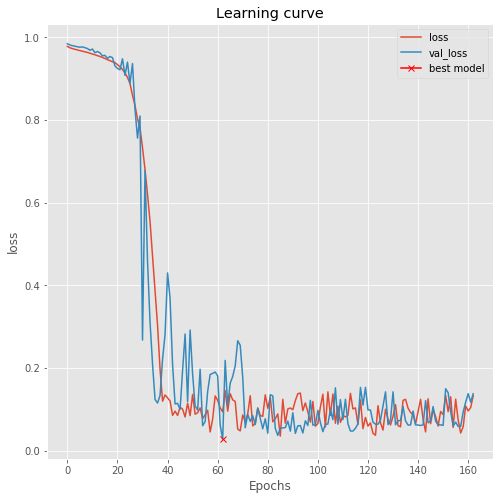

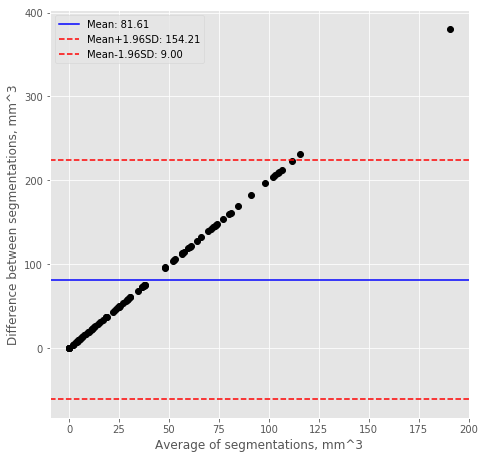


Validation
Voxel classification accuracy:  0.9946455114028033
Precision and recall:  (0.0, 0.0)
Dice score:  4.19058793948791e-05
Jaccard score:  4.19058793948791e-05
Volume difference (mean absolute, mean):  (102.84589338302612, 102.84589338302612)
Centroid distance:  nan
Hausdorff distance:  nan
Surface Dice score:  nan
Added path length:  1378.6470588235295
Detection rate (per patient, per slice):  (0.058823529411764705, 0.5073529411764706)


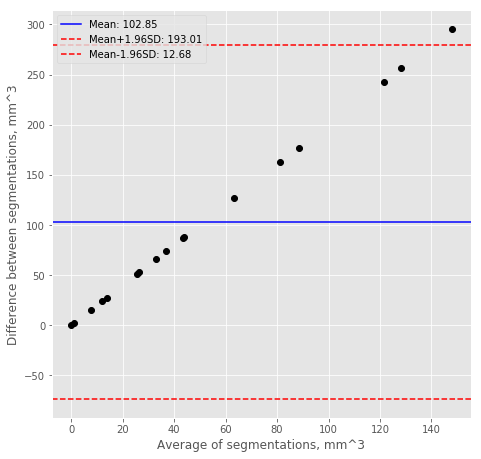


Test
Voxel classification accuracy:  0.9959376653035482
Precision and recall:  (0.0, 0.0)
Dice score:  7.824726134585289e-05
Jaccard score:  7.824726134585289e-05
Volume difference (mean absolute, mean):  (73.6067064801852, 73.6067064801852)
Centroid distance:  nan
Hausdorff distance:  nan
Surface Dice score:  nan
Added path length:  1051.0
Detection rate (per patient, per slice):  (0.08333333333333333, 0.5625)


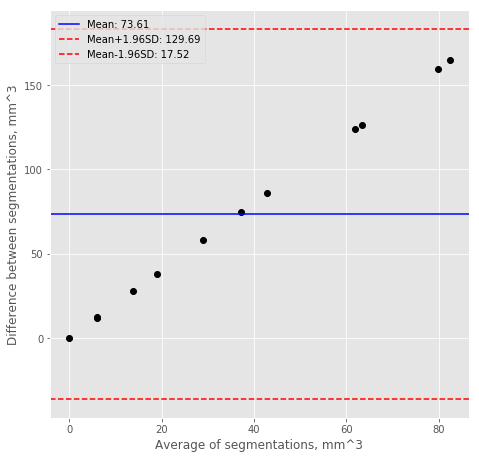

In [327]:
preds_train_calc_vol, preds_valid_calc_vol, preds_test_calc_vol = train_evaluate_model('model_vessel-seg-3d_calc_vol.h5',
                                                                                    normvoldif,
                                                                                    X_train_calc,
                                                                                    y_train_calc, 
                                                                                    X_valid_calc,
                                                                                    y_valid_calc, 
                                                                                    X_test_calc,
                                                                                    y_test_calc,
                                                                                    spacings_train_calc, 
                                                                                    spacings_valid_calc, 
                                                                                    spacings_test_calc)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


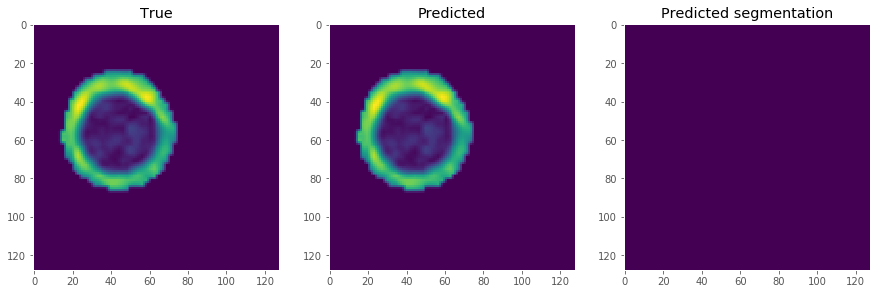

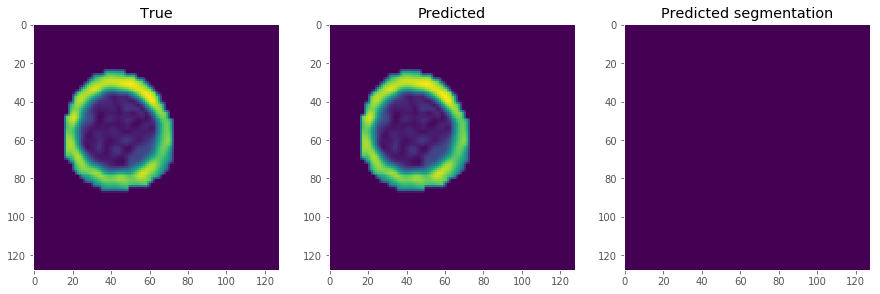

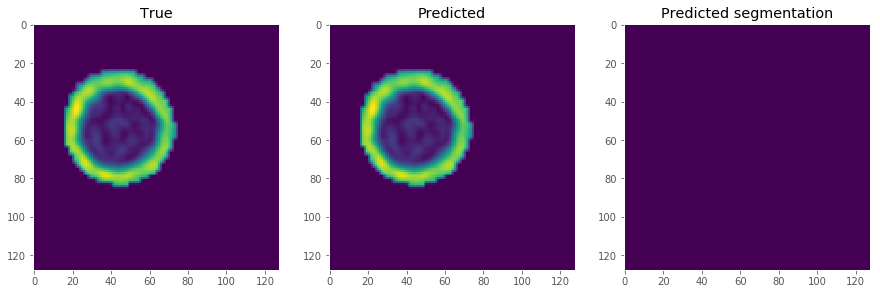

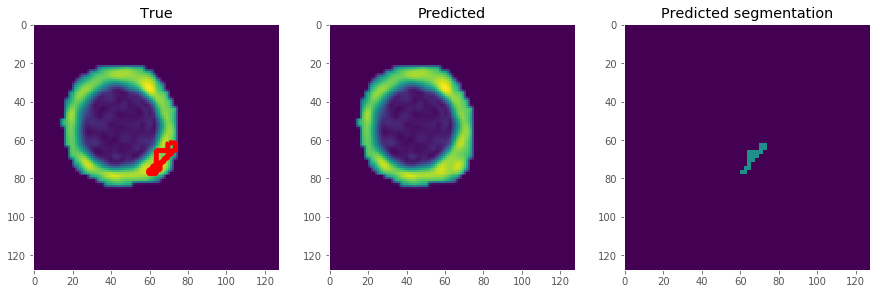

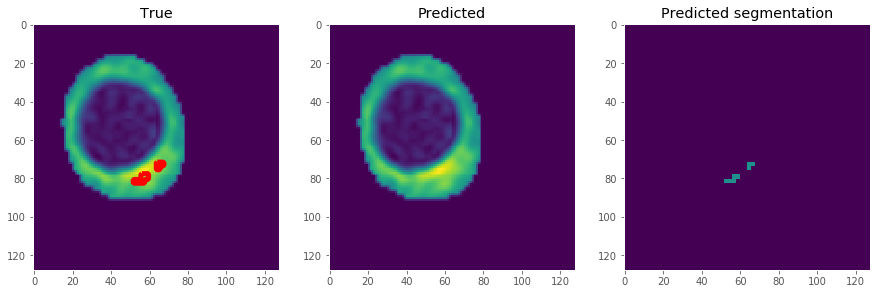

...

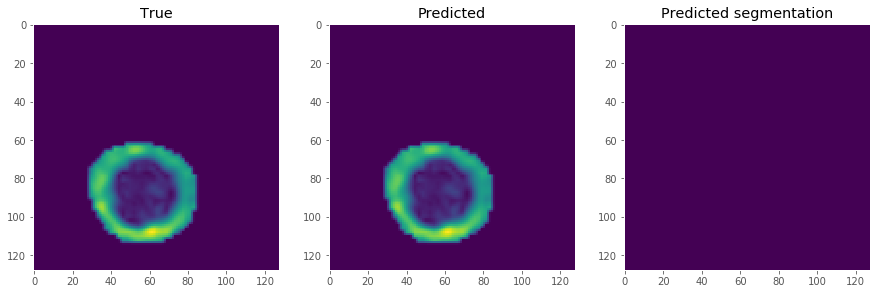

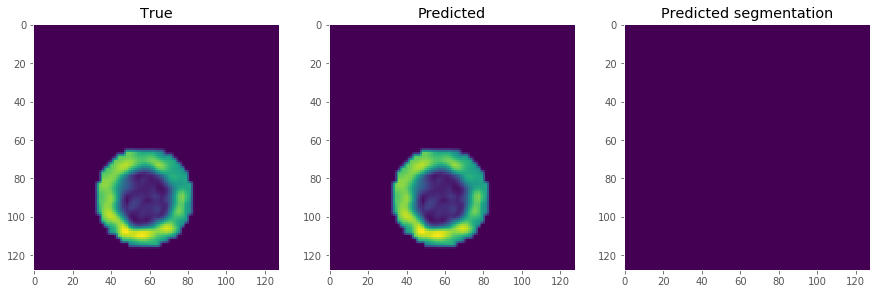

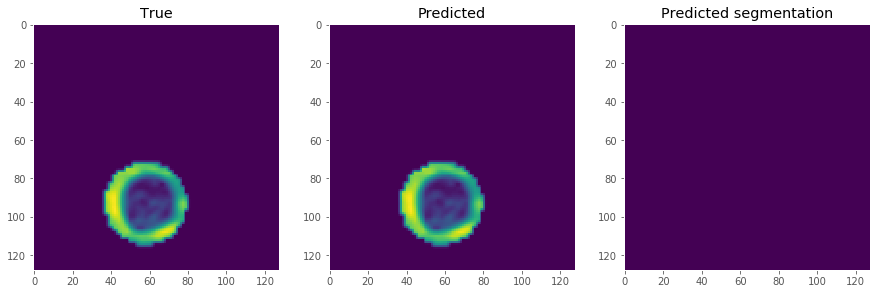

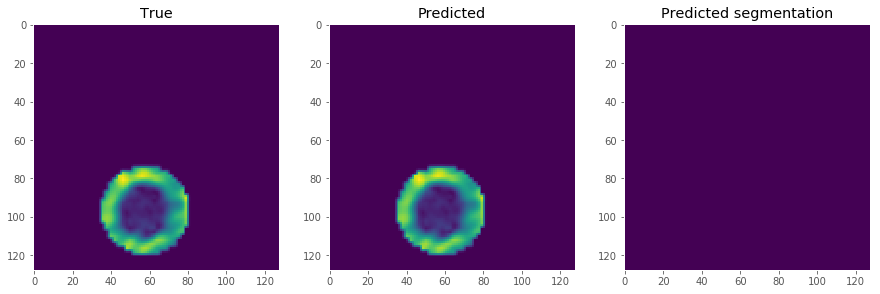

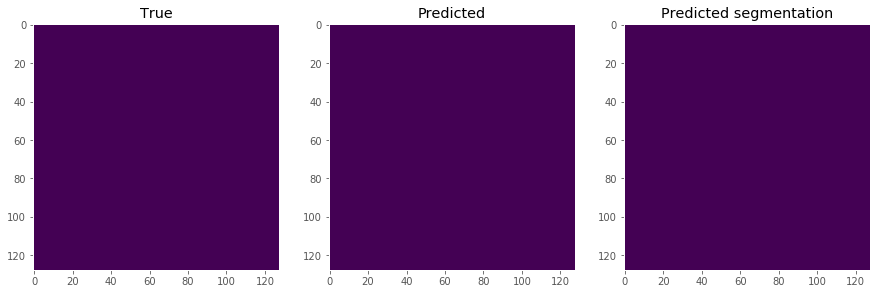

In [328]:
show_seg_slices(0, X_test_calc, y_test_calc, preds_test_calc_vol)

c1 (?, 16, 128, 128, 16)
c2 (?, 8, 64, 64, 32)
p2 (?, 4, 32, 32, 32)
c3 (?, 4, 32, 32, 64)
p3 (?, 2, 16, 16, 64)
c4 (?, 2, 16, 16, 128)
p4 (?, 1, 8, 8, 128)
c5 (?, 1, 8, 8, 256)
c6 (?, 2, 16, 16, 128)
u6 (?, 2, 16, 16, 256)
Model: "model_42"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                [(None, 16, 128, 128 0                                            
__________________________________________________________________________________________________
conv3d_799 (Conv3D)             (None, 16, 128, 128, 2176        img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_757 (BatchN (None, 16, 128, 128, 64          conv3d_799[0][0]                 
_________________________________________________________________

Train on 86 samples, validate on 14 samples
Epoch 1/250
80/86 [==========================>...] - ETA: 1s - loss: 0.9859 - acc: 0.7197 - dice_coef: 0.0127
Epoch 00001: val_loss improved from inf to 0.98108, saving model to model_vessel-seg-3d_iph_vol.h5
86/86 [==============================] - 268s 3s/sample - loss: 0.9855 - acc: 0.7267 - dice_coef: 0.0139 - val_loss: 0.9811 - val_acc: 0.5179 - val_dice_coef: 0.0188
Epoch 2/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9813 - acc: 0.8102 - dice_coef: 0.0185
Epoch 00002: val_loss improved from 0.98108 to 0.97869, saving model to model_vessel-seg-3d_iph_vol.h5
86/86 [==============================] - 4s 41ms/sample - loss: 0.9826 - acc: 0.8117 - dice_coef: 0.0154 - val_loss: 0.9787 - val_acc: 0.6459 - val_dice_coef: 0.0197
Epoch 3/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9834 - acc: 0.8314 - dice_coef: 0.0160
Epoch 00003: val_loss improved from 0.97869 to 0.97668, saving model to model_vessel-seg-3d_

86/86 [==============================] - 3s 41ms/sample - loss: 0.9289 - acc: 0.9875 - dice_coef: 0.0064 - val_loss: 0.8840 - val_acc: 0.9595 - val_dice_coef: 0.0310
Epoch 24/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9261 - acc: 0.9915 - dice_coef: 0.0077
Epoch 00024: val_loss did not improve from 0.88396
86/86 [==============================] - 3s 35ms/sample - loss: 0.9197 - acc: 0.9913 - dice_coef: 0.0091 - val_loss: 0.8998 - val_acc: 0.9264 - val_dice_coef: 0.0323
Epoch 25/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9070 - acc: 0.9925 - dice_coef: 0.0087
Epoch 00025: val_loss did not improve from 0.88396
86/86 [==============================] - 3s 36ms/sample - loss: 0.9128 - acc: 0.9928 - dice_coef: 0.0074 - val_loss: 0.9136 - val_acc: 0.9175 - val_dice_coef: 0.0268
Epoch 26/250
80/86 [==========================>...] - ETA: 0s - loss: 0.9084 - acc: 0.9922 - dice_coef: 0.0067
Epoch 00026: val_loss improved from 0.88396 to 0.75971, saving mode

Epoch 47/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3535 - acc: 0.9966 - dice_coef: 0.0059
Epoch 00047: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.3335 - acc: 0.9965 - dice_coef: 0.0063 - val_loss: 0.4286 - val_acc: 0.9939 - val_dice_coef: 0.0040
Epoch 48/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1955 - acc: 0.9963 - dice_coef: 0.0059
Epoch 00048: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.2207 - acc: 0.9965 - dice_coef: 0.0055 - val_loss: 0.4914 - val_acc: 0.9939 - val_dice_coef: 0.0040
Epoch 49/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1970 - acc: 0.9965 - dice_coef: 0.0064
Epoch 00049: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.1844 - acc: 0.9965 - dice_coef: 0.0065 - val_loss: 0.4486 - val_acc: 0.9939 - val_dice_coef: 0.0025
Epoch 50/250
80/

Epoch 72/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1364 - acc: 0.9963 - dice_coef: 0.0039
Epoch 00072: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.1458 - acc: 0.9965 - dice_coef: 0.0038 - val_loss: 0.3142 - val_acc: 0.9939 - val_dice_coef: 0.0044
Epoch 73/250
80/86 [==========================>...] - ETA: 0s - loss: 0.4046 - acc: 0.9966 - dice_coef: 0.0032
Epoch 00073: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.3900 - acc: 0.9965 - dice_coef: 0.0034 - val_loss: 0.3146 - val_acc: 0.9939 - val_dice_coef: 0.0044
Epoch 74/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1831 - acc: 0.9967 - dice_coef: 0.0035
Epoch 00074: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.1932 - acc: 0.9965 - dice_coef: 0.0039 - val_loss: 0.3153 - val_acc: 0.9939 - val_dice_coef: 0.0044
Epoch 75/250
80/

Epoch 97/250
80/86 [==========================>...] - ETA: 0s - loss: 0.2492 - acc: 0.9967 - dice_coef: 0.0034
Epoch 00097: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.2578 - acc: 0.9965 - dice_coef: 0.0037 - val_loss: 0.3199 - val_acc: 0.9939 - val_dice_coef: 0.0048
Epoch 98/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1518 - acc: 0.9964 - dice_coef: 0.0037
Epoch 00098: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.1488 - acc: 0.9965 - dice_coef: 0.0036 - val_loss: 0.3197 - val_acc: 0.9939 - val_dice_coef: 0.0048
Epoch 99/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1636 - acc: 0.9974 - dice_coef: 0.0032
Epoch 00099: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.1982 - acc: 0.9965 - dice_coef: 0.0037 - val_loss: 0.3191 - val_acc: 0.9939 - val_dice_coef: 0.0049
Epoch 100/250
80

Epoch 122/250
80/86 [==========================>...] - ETA: 0s - loss: 0.1314 - acc: 0.9966 - dice_coef: 0.0035
Epoch 00122: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.1360 - acc: 0.9965 - dice_coef: 0.0037 - val_loss: 0.3155 - val_acc: 0.9939 - val_dice_coef: 0.0048
Epoch 123/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3429 - acc: 0.9966 - dice_coef: 0.0031
Epoch 00123: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.3363 - acc: 0.9965 - dice_coef: 0.0033 - val_loss: 0.3154 - val_acc: 0.9939 - val_dice_coef: 0.0048
Epoch 124/250
80/86 [==========================>...] - ETA: 0s - loss: 0.3298 - acc: 0.9962 - dice_coef: 0.0033
Epoch 00124: val_loss did not improve from 0.00052
86/86 [==============================] - 3s 36ms/sample - loss: 0.3604 - acc: 0.9965 - dice_coef: 0.0028 - val_loss: 0.3150 - val_acc: 0.9939 - val_dice_coef: 0.0048
Epoch 125/250

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision and recall:  (0.0, 0.0)
Dice score:  1.2513451960857918e-05
Jaccard score:  1.2513451960857918e-05
Volume difference (mean absolute, mean):  (81.97419389181358, 81.97419389181358)


C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\numpy\core\fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Centroid distance:  nan
Hausdorff distance:  nan
Surface Dice score:  nan
Added path length:  764.8837209302326
Detection rate (per patient, per slice):  (0.6395348837209303, 0.8793604651162791)


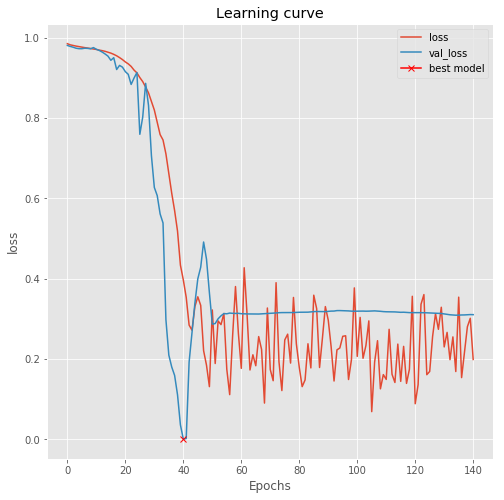

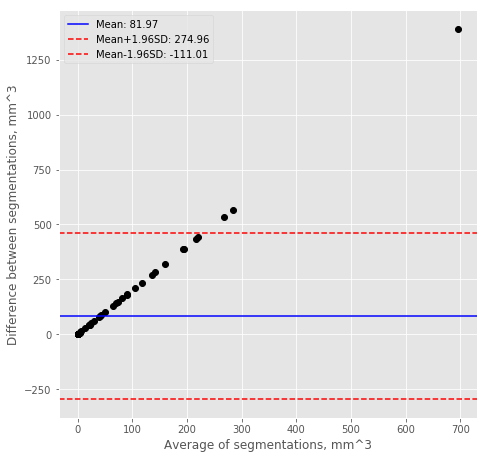


Validation
Voxel classification accuracy:  0.9938953944614956
Precision and recall:  (0.0, 0.0)
Dice score:  4.463289444320465e-05
Jaccard score:  4.463289444320465e-05
Volume difference (mean absolute, mean):  (74.58868830544608, 74.58868830544608)
Centroid distance:  nan
Hausdorff distance:  nan
Surface Dice score:  nan
Added path length:  1236.5714285714287
Detection rate (per patient, per slice):  (0.6428571428571429, 0.8705357142857143)


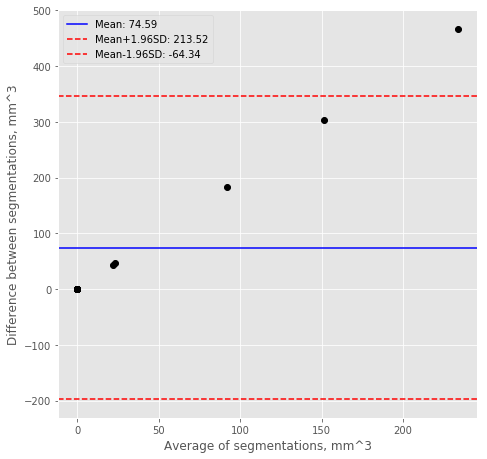


Test
Voxel classification accuracy:  0.9973828633626302
Precision and recall:  (0.0, 0.0)
Dice score:  9.716284492809951e-05
Jaccard score:  9.716284492809951e-05
Volume difference (mean absolute, mean):  (41.159652884801226, 41.159652884801226)
Centroid distance:  nan
Hausdorff distance:  nan
Surface Dice score:  nan
Added path length:  614.1333333333333
Detection rate (per patient, per slice):  (0.6666666666666666, 0.9)


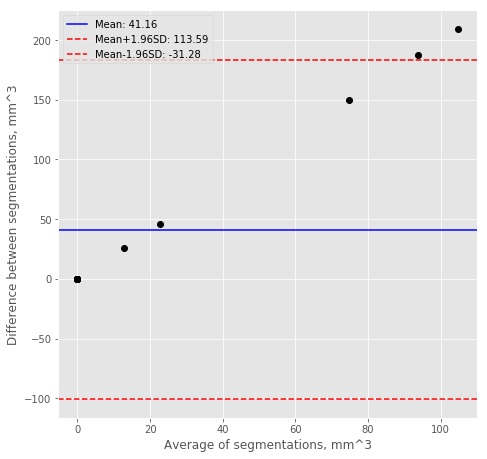

In [329]:
preds_train_iph_vol, preds_valid_iph_vol, preds_test_iph_vol = train_evaluate_model('model_vessel-seg-3d_iph_vol.h5',
                                                                                 normvoldif,
                                                                                 X_train_iph, 
                                                                                 y_train_iph, 
                                                                                 X_valid_iph,
                                                                                 y_valid_iph, 
                                                                                 X_test_iph,
                                                                                 y_test_iph,
                                                                                 spacings_train_iph, 
                                                                                 spacings_valid_iph, 
                                                                                 spacings_test_iph)

C:\ProgramData\Anaconda3\envs\segway\lib\site-packages\matplotlib\contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


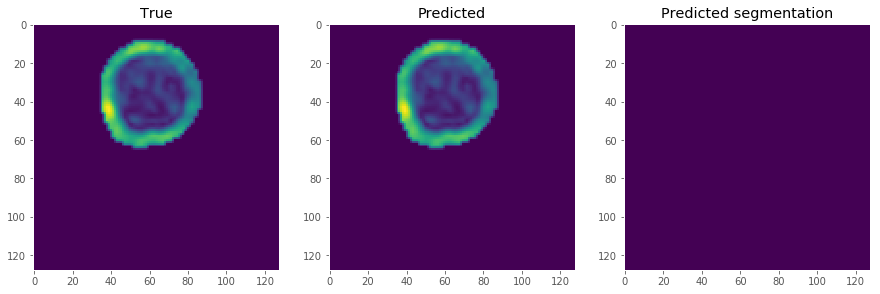

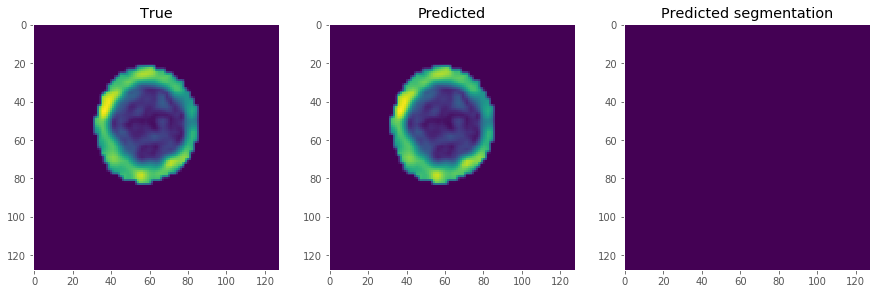

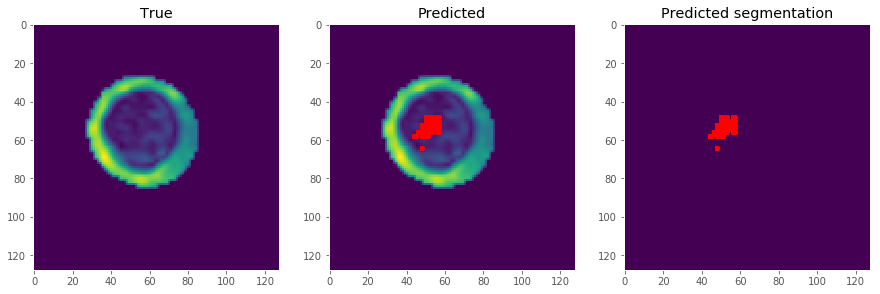

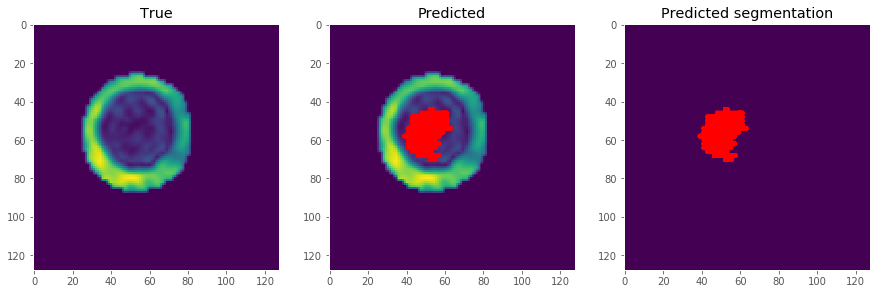

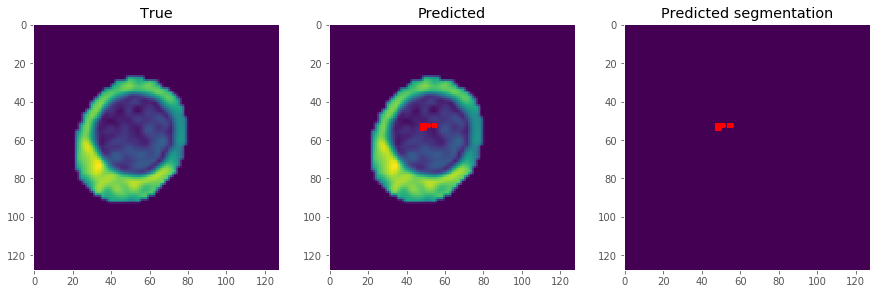

...

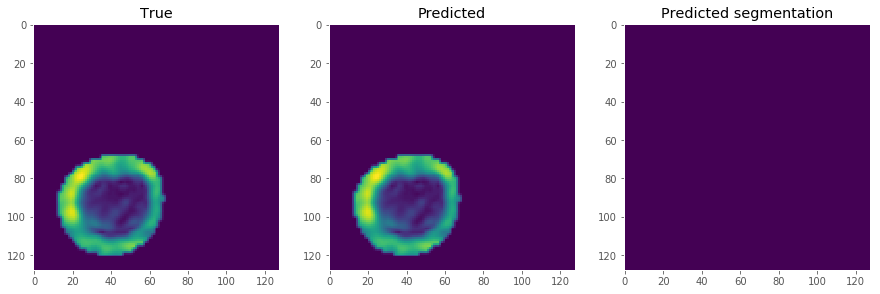

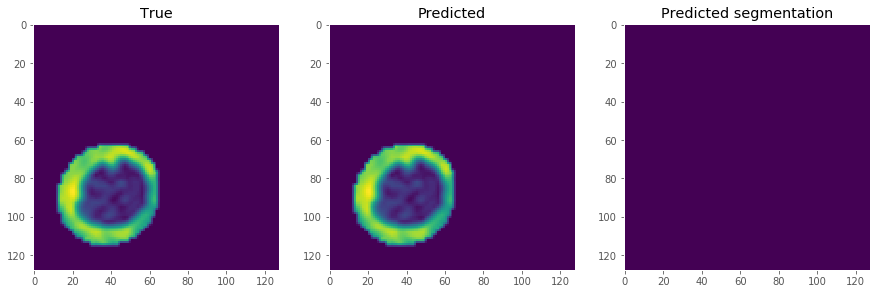

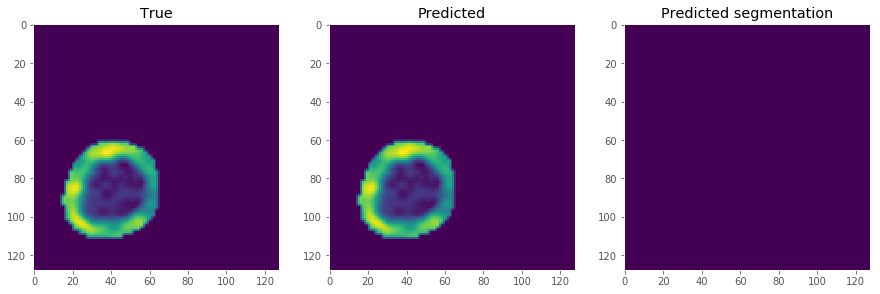

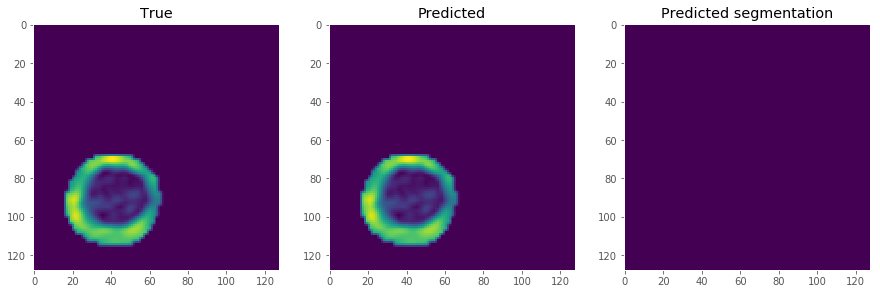

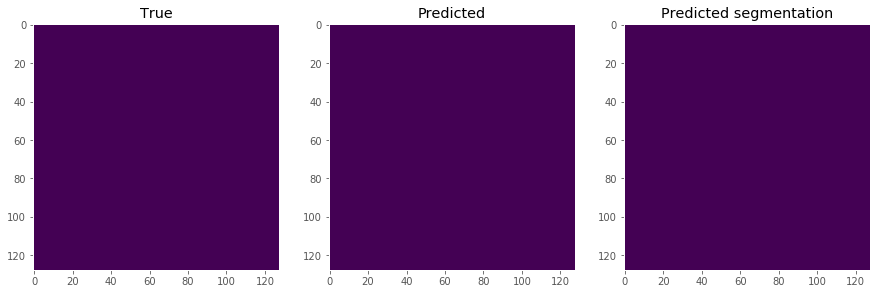

In [330]:
show_seg_slices(1, X_test_iph, y_test_iph, preds_test_iph_vol)